In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import datetime
from statsmodels.tsa.deterministic import DeterministicProcess, CalendarFourier, Fourier

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler


from torch.utils.data import Dataset, Subset


#import ipdb


from torch import nn
from torch.utils.data import DataLoader
import torch

import warnings
warnings.filterwarnings('ignore')

import time
from dateutil.relativedelta import relativedelta


plt.rcParams['figure.figsize'] = (20, 10)

# Import data

In [5]:
#flu_id = pd.read_csv("VIW_FID_EPI.csv")
flu_net = pd.read_csv("data/VIW_FNT.2025.12.06.csv")

#flu_dict = pd.read_csv("VIW_FLU_METADATA.csv")
#flu_surv= pd.read_csv("data\\FluViewPhase5Data\\Weekly_Data_Counts_by_Virus.csv",encoding='cp1252')


In [6]:
flu_surv= pd.read_csv("data/FluViewPhase5DataNew/Weekly_Data_Counts_by_Virus.csv",encoding='cp1252')

In [7]:
flu_surv

Influenza-Associated Hospitalizations by Virus Type Number (data downloaded on 2/23/2025)
SEASON                                             WEEK_NUMBER INFLUENZA A INFLUENZA B INFLUENZA A AND B                                            UNKNOWN                                       
2003-04                                            2003-40     0           0           0                                                                  0                                       
                                                   2003-41     1           0           0                                                                  0                                       
                                                   2003-42     0           0           0                                                                  0                                       
                                                   2003-43     0           0           0                                                                  0                                       
...                                                                                                                                                     ...                                       
2024-25                                            2025-15     0           0           0                                                                  0                                       
                                                   2025-16     0           0           0                                                                  0                                       
                                                   2025-17     0           0           0                                                                  0                                       
1. The Influenza Hospitalization Surveillance N... NaN         NaN         NaN         NaN                                                              NaN                                       
2. In most influenza seasons, case counts refle... NaN         NaN         NaN         NaN                                                              NaN                                       

[697 rows x 1 columns]

## Fix flu surv

In [8]:
def fix_flu_surv(flu_surv):
    columns =["SEASON", "WEEK_NUMBER", "INFLUENZA A", "INFLUENZA B", "INFLUENZA A AND B"]
    data = []
    print(columns)

    for i in range(len(flu_surv)-1):
        data.append(flu_surv.iloc[i+1].name)
    data = np.array(data)
    print(data.shape)
    return pd.DataFrame(data=data,columns = columns)

In [9]:
def pdflusurv_to_weektime(df):
    
    indices_ = list(df.index)
   # indices_.sort()
    df = df.loc[indices_]

    indices_new = []
    for i in range(len(indices_)):
        d =  str(indices_[i])[:5]
        if len(str(indices_[i])[5:]) == 1:
            d+='0'
        d+=str(indices_[i])[5:]
       # d= datetime.datetime.strptime(d + '-1', "%Y-%W-%w")
        indices_new.append(d)
    indices_new
    df.index = indices_new
    return df

In [10]:
flu_surv = fix_flu_surv(flu_surv)
flu_surv = flu_surv.set_index('WEEK_NUMBER')
flu_surv["INFLUENZA A"] = flu_surv["INFLUENZA A"].astype('float32')
flu_surv["INFLUENZA B"] = flu_surv["INFLUENZA B"].astype('float32')
flu_surv = flu_surv.fillna(0.0)
flu_surv

['SEASON', 'WEEK_NUMBER', 'INFLUENZA A', 'INFLUENZA B', 'INFLUENZA A AND B']
(696, 5)


,SEASON,INFLUENZA A,INFLUENZA B,INFLUENZA A AND B
WEEK_NUMBER,,,,
2003-40,2003-04,0.0,0.0,0
2003-41,2003-04,1.0,0.0,0
2003-42,2003-04,0.0,0.0,0
2003-43,2003-04,0.0,0.0,0
2003-44,2003-04,3.0,0.0,0
...,...,...,...,...
2025-15,2024-25,0.0,0.0,0
2025-16,2024-25,0.0,0.0,0
2025-17,2024-25,0.0,0.0,0


In [11]:
flu_surv = pdflusurv_to_weektime(flu_surv[:'2025-17'])

In [12]:
flu_surv['INF_ALL'] = flu_surv['INFLUENZA A']+flu_surv['INFLUENZA B']

In [13]:
flu_surv.groupby('SEASON')[['INF_ALL']].sum()

,INF_ALL
SEASON,
2003-04,1000.0
2004-05,558.0
2005-06,1845.0
2006-07,1231.0
2007-08,3761.0
2008-09,1618.0
2009-10,6998.0
2010-11,6222.0
2011-12,2398.0


## Southern Hemisphere Correlations

In [14]:
southern_countries = list(flu_net[flu_net.HEMISPHERE=="SH"]["COUNTRY_CODE"].unique())

In [15]:
def pd_to_weektime(df):
    
    indices_ = list(df.index)
    indices_.sort()
    df = df.loc[indices_]

    indices_new = []
    for i in range(len(indices_)):
        d =  str(indices_[i])[:4]+"-"+str(indices_[i])[4:]
       # d= datetime.datetime.strptime(d + '-1', "%Y-%W-%w")
        indices_new.append(d)
    indices_new
    df.index = indices_new
    return df

In [27]:
def join_countries(country_list):

    
    c = 0
    country_codes = country_list
    for country in country_codes:
        tmp = flu_net[flu_net.COUNTRY_CODE == country][["MMWRYW","INF_ALL"]]
        tmp = tmp.groupby("MMWRYW").sum() #.set_index("MMWRYW")
        tmp = pd_to_weektime(tmp)
        tmp.columns = ["INF_ALL"+country]
        if c == 0:
            df = tmp
            c+=1
        else:
            df = df.join(tmp,on=df.index)
            df = df.drop('key_0',axis=1)

    return df

In [17]:
def create_lags(df,col,num_lags,start,space):
    df_new = df.copy()
    for i in range(num_lags):
        new_col = col+"_lag_"+str(start+i*space)
        df_new[new_col] = df_new[col].shift(start + i*space).fillna(0.0)
    return df_new.drop([col],axis=1)

In [22]:
def make_corrs(country_list):

    corrs_ = []
    for country in country_list:
        df_infall = flu_net[flu_net.COUNTRY_CODE == country][["MMWRYW","INF_ALL"]].groupby("MMWRYW").sum()
        df_infall = pd_to_weektime(df_infall)
        df_infall = df_infall.fillna(0.0)
        df_infall = create_lags(df_infall,'INF_ALL',40,1,1)
        df_infall = flu_surv.join(df_infall,on=flu_surv.index,lsuffix='_USA').loc['2014-01':].drop('SEASON',axis=1)
        df_infall = df_infall.drop('key_0',axis=1)
        print(df_infall)
        print(df_infall.corr())
        
        corrs_.append(abs(df_infall.corr()['INF_ALL']))

    return corrs_

In [23]:
corrs_ = make_corrs(southern_countries)

         INFLUENZA A  INFLUENZA B INFLUENZA A AND B  INF_ALL  INF_ALL_lag_1  \
2014-01       1055.0         15.0                 0   1070.0            NaN   
2014-02       1003.0         25.0                 2   1028.0            NaN   
2014-03        818.0         26.0                 2    844.0            NaN   
2014-04        617.0         43.0                 3    660.0            NaN   
2014-05        540.0         31.0                 1    571.0            NaN   
...              ...          ...               ...      ...            ...   
2025-13          0.0          0.0                 0      0.0            NaN   
2025-14          0.0          0.0                 0      0.0            NaN   
2025-15          0.0          0.0                 0      0.0            NaN   
2025-16          0.0          0.0                 0      0.0            NaN   
2025-17          0.0          0.0                 0      0.0            NaN   

         INF_ALL_lag_2  INF_ALL_lag_3  INF_ALL_lag_

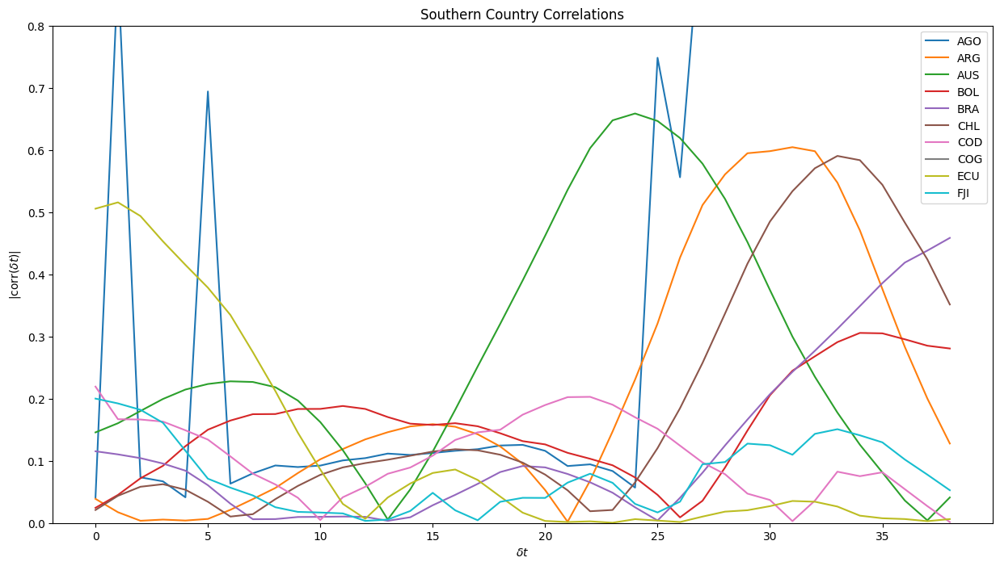

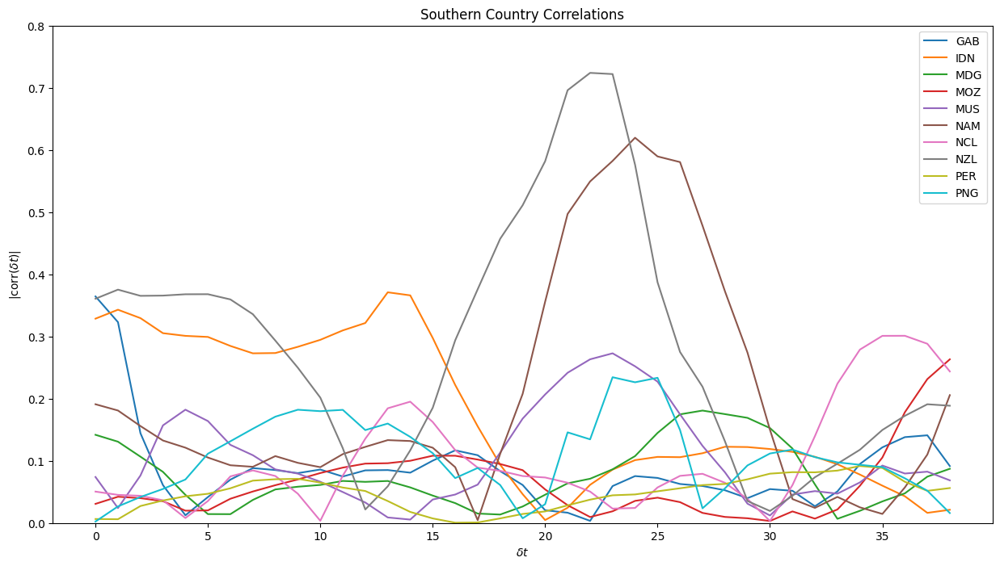

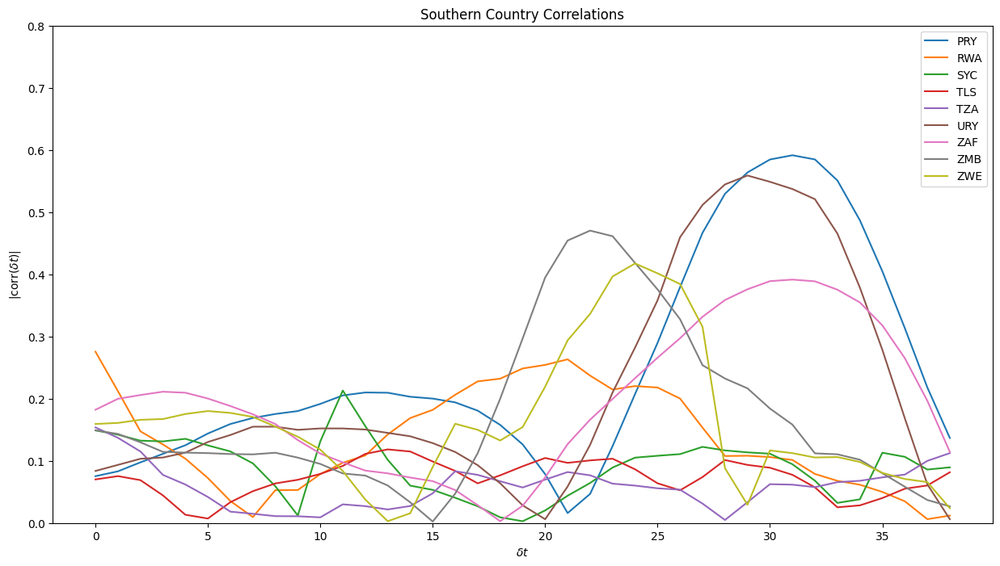

In [24]:
N = len(southern_countries)
batch_num = int(np.floor(N/10))+1
plt.rcParams['figure.figsize'] = (15, 8)

for b in range(batch_num):
    for i in range(b*10,(b+1)*10):
        if i < len(corrs_):

            tmp = corrs_[i]
            tmp = tmp[5:]
            plt.plot(range(0,len(tmp)),tmp,label=southern_countries[i])
            plt.ylim([0,0.8])
   # plt.figure(figsize=(15,8))
    plt.legend(loc='upper right')
    plt.title("Southern Country Correlations")
    plt.ylabel('|corr($\delta t$)|')
    plt.xlabel('$\delta t$')
    plt.show()

In [25]:
# southern countries with reasonable correlations
country_keep = ["AUS","CHL","PRY","ARG","URY"]
corrs_keep = make_corrs(country_keep)

         INFLUENZA A  INFLUENZA B INFLUENZA A AND B  INF_ALL  INF_ALL_lag_1  \
2014-01       1055.0         15.0                 0   1070.0           13.0   
2014-02       1003.0         25.0                 2   1028.0           21.0   
2014-03        818.0         26.0                 2    844.0           23.0   
2014-04        617.0         43.0                 3    660.0           25.0   
2014-05        540.0         31.0                 1    571.0           26.0   
...              ...          ...               ...      ...            ...   
2025-13          0.0          0.0                 0      0.0            NaN   
2025-14          0.0          0.0                 0      0.0            NaN   
2025-15          0.0          0.0                 0      0.0            NaN   
2025-16          0.0          0.0                 0      0.0            NaN   
2025-17          0.0          0.0                 0      0.0            NaN   

         INF_ALL_lag_2  INF_ALL_lag_3  INF_ALL_lag_

In [35]:
np.argmax(corrs_keep[0][4:])

23

(0.0, 37.0)

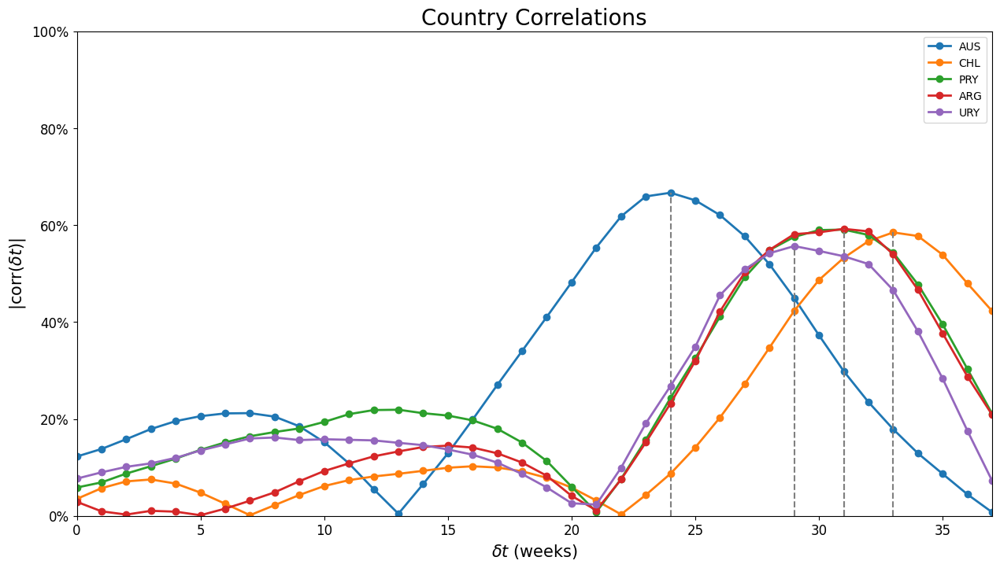

In [193]:
fig, ax = plt.subplots(figsize = (15, 8))
for i in range(len(corrs_keep)):
    tmp = corrs_keep[i]
    tmp = tmp[5:]
    ax.plot(range(0,len(tmp)),tmp,label=country_keep[i],linewidth=2,marker='o')
    
    max_loc = np.argmax(corrs_keep[i][5:])
    ymax_  = np.max(corrs_keep[i][5:])
    ax.axvline(x=max_loc,color='gray',ymin=0,ymax=ymax_,linestyle='dashed')
ax.legend(loc='upper right')
ax.set_title("Country Correlations",fontsize=20)
ax.set_yticklabels(['{:,.0%}'.format(x) for x in [0,0.2,0.4,0.6,0.8,1]],fontsize=12)
ax.set_ylim([0,1])
ax.set_ylabel('|corr($\delta t$)|',fontsize=15)
ax.set_xlabel('$\delta t$ (weeks)',fontsize=15)
ax.set_xticklabels([0,5,10,15,20,25,30,35],fontsize=12)
ax.set_xlim([0,37])

## Create country keep and fix flu_surv index

In [28]:
country_keep = ["AUS","CHL","PRY","ARG","URY"]
df_in = join_countries(country_keep)

<Axes: >

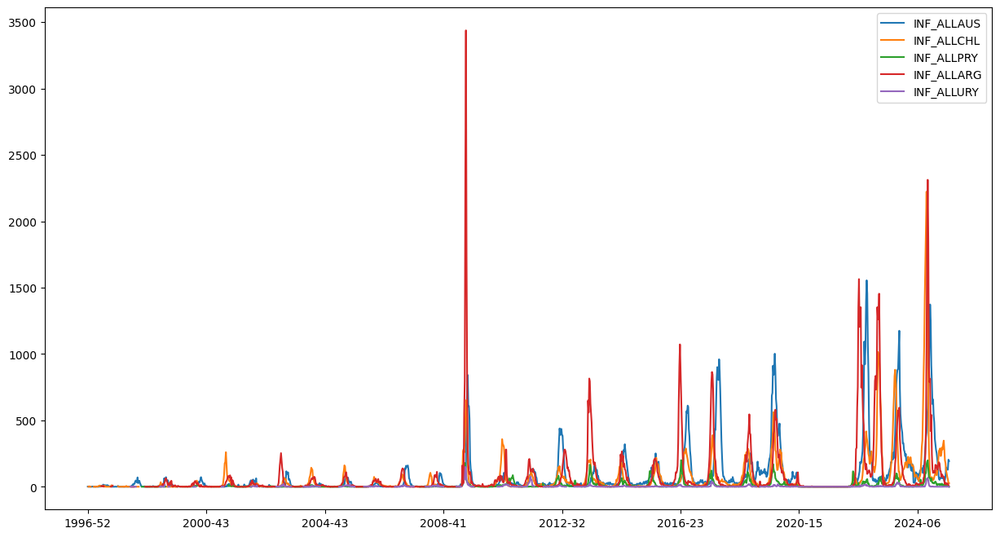

In [29]:
df_in.plot(kind='line')

In [30]:
df_in.loc['2022-41':'2023-10'] = np.zeros(shape=(len(df_in.loc['2022-41':'2023-10'] ),5))

In [31]:
df_in.loc['2022-41':'2023-10'] 

,INF_ALLAUS,INF_ALLCHL,INF_ALLPRY,INF_ALLARG,INF_ALLURY
2022-41,0.0,0.0,0.0,0.0,0.0
2022-42,0.0,0.0,0.0,0.0,0.0
2022-43,0.0,0.0,0.0,0.0,0.0
2022-44,0.0,0.0,0.0,0.0,0.0
2022-45,0.0,0.0,0.0,0.0,0.0
2022-46,0.0,0.0,0.0,0.0,0.0
2022-47,0.0,0.0,0.0,0.0,0.0
2022-48,0.0,0.0,0.0,0.0,0.0
2022-49,0.0,0.0,0.0,0.0,0.0
2022-50,0.0,0.0,0.0,0.0,0.0


In [32]:
df_in = df_in.loc['2010-01-01':]

In [33]:
# normalizations
norm_date = '2024-39'
df_norm = df_in.copy()
minmax_sh = MinMaxScaler()
minmax_sh.fit(df_norm.loc[:norm_date])
df_norm[df_norm.columns] = minmax_sh.transform(df_norm)
df_norm = df_norm.fillna(0.0)

minmax_us = MinMaxScaler()
usa_infall_norm = flu_surv[['INF_ALL']].copy()
minmax_us.fit(usa_infall_norm[['INF_ALL']].loc[:norm_date])
usa_infall_norm= pd.DataFrame(data=minmax_us.transform(usa_infall_norm[["INF_ALL"]]),columns = ["INF_ALL"],index=usa_infall_norm.index)
#usa_infall_norm["INF_ALL"] = norms
#usa_infall_norm = usa_infall_norm.fillna(0.0)

In [34]:
df = df_norm.join(usa_infall_norm,on=df_norm.index)
df = df.fillna(0.0)

In [35]:
usa_infall_norm = df['INF_ALL']

In [36]:
df['INF_ALL_shift'] = df['INF_ALL'].shift(26)

<Axes: >

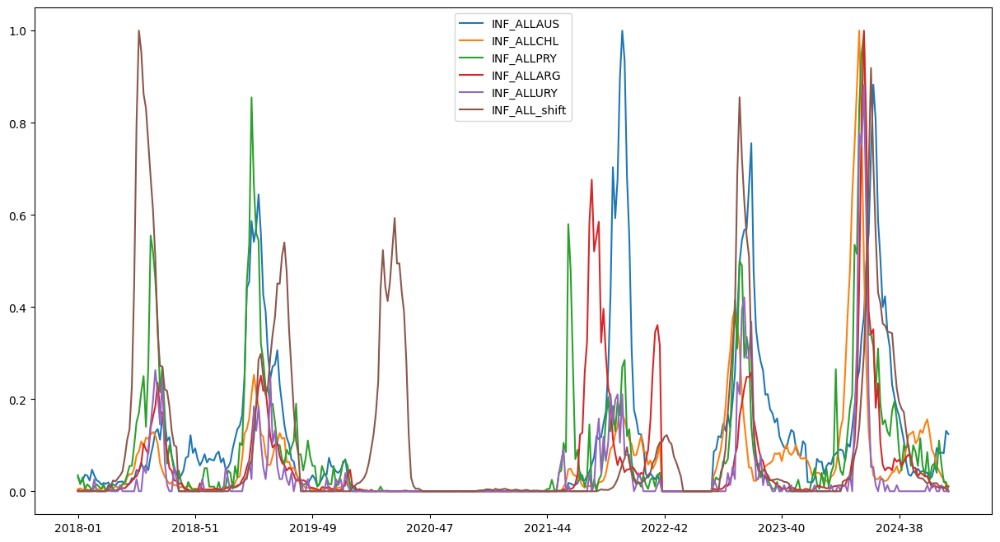

In [37]:
df.loc['2018-01':].drop('INF_ALL',axis=1).plot(kind='line')

## Create Season

In [38]:
ind_ = df.index.to_list()
season_list = []
for elem in ind_:
    week = int(elem.split('-')[1])
    if week >= 40:
        season_list.append(1)
    elif week <=18:
        season_list.append(1)
    else:
        season_list.append(0)

In [39]:
df['season'] = season_list

In [40]:
df['season'] = df['season'].shift(26)

In [41]:
df

,key_0,INF_ALLAUS,INF_ALLCHL,INF_ALLPRY,INF_ALLARG,INF_ALLURY,INF_ALL,INF_ALL_shift,season
2010-02,2010-02,0.000643,0.000000,0.00,0.009083,0.000000,0.018650,NaN,NaN
2010-03,2010-03,0.000643,0.000000,0.00,0.002595,0.000000,0.018989,NaN,NaN
2010-04,2010-04,0.000000,0.000000,0.01,0.000433,0.000000,0.012547,NaN,NaN
2010-05,2010-05,0.000643,0.000000,0.00,0.001730,0.000000,0.017294,NaN,NaN
2010-06,2010-06,0.000643,0.000000,0.00,0.000000,0.000000,0.012547,NaN,NaN
...,...,...,...,...,...,...,...,...,...
2025-03,2025-03,0.082315,0.044534,0.11,0.007353,0.000000,0.942692,0.011529,0.0
2025-04,2025-04,0.084244,0.032839,0.06,0.010813,0.013158,1.107494,0.008817,0.0
2025-05,2025-05,0.082315,0.025191,0.02,0.008651,0.000000,1.361479,0.006104,0.0
2025-06,2025-06,0.131190,0.012146,0.02,0.005190,0.000000,1.296033,0.010851,0.0


In [42]:
df = df.drop(['key_0','INF_ALL','INF_ALL_shift'],axis=1)

In [43]:
df.loc['2020-14':'2021-44']= np.zeros(shape=(len(df.loc['2020-14':'2021-44'] ),6))

<Axes: >

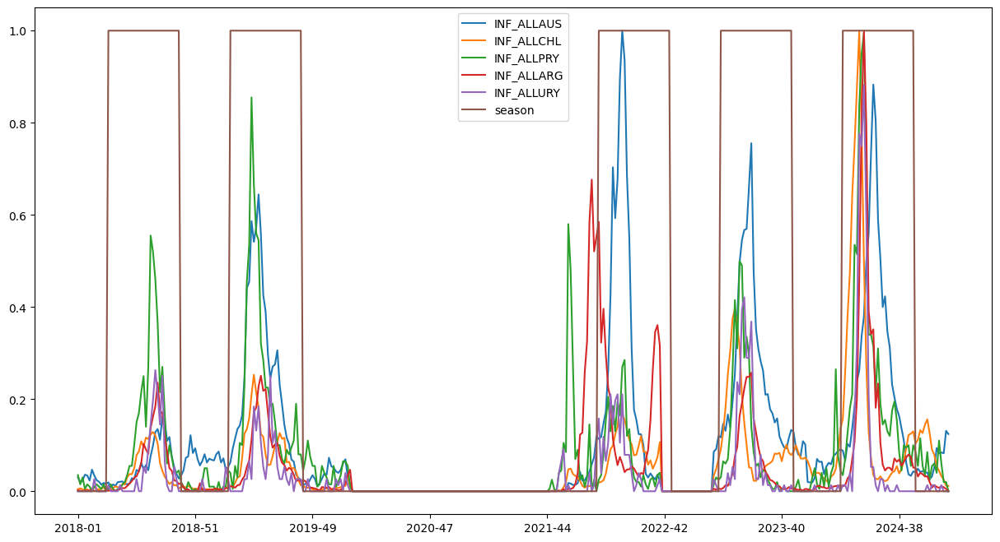

In [44]:
df.loc['2018-01':].plot(kind='line')

In [45]:
df = df.join(usa_infall_norm,on=df.index)
df = df.fillna(0.0)

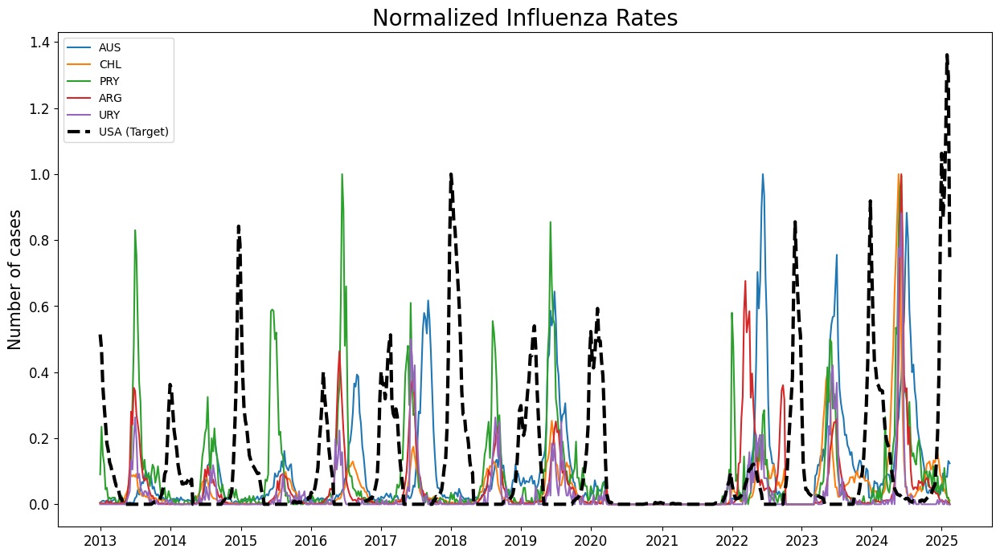

In [195]:
plt.plot(df['INF_ALLAUS'].loc['2013-01':],label='AUS')
plt.plot(df['INF_ALLCHL'].loc['2013-01':],label='CHL')
plt.plot(df['INF_ALLPRY'].loc['2013-01':],label='PRY')
plt.plot(df['INF_ALLARG'].loc['2013-01':],label='ARG')
plt.plot(df['INF_ALLURY'].loc['2013-01':],label='URY')
plt.plot(df['INF_ALL'].loc['2013-01':],label='USA (Target)',color='black',linewidth=3,linestyle='dashed')

x_ticks=['2013-01','2014-01','2015-01','2016-01','2017-01','2018-01','2019-01','2020-01','2021-01','2022-01','2023-01','2024-01','2025-01']
labels = ['2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023','2024','2025']
plt.xticks(ticks = x_ticks, labels=labels,rotation=0,size=12)
plt.legend(loc="upper left")
plt.title('Normalized Influenza Rates',fontsize=20)
plt.yticks(size=12)
plt.ylabel('Number of cases',fontsize=15)
#plt.xlabel('Date')
plt.show()

# Tamiflu Comparisons

In [23]:
import sys
sys.path.append('C:\\Users\\christopher.johnson\\Documents\\')
import ctj_tools as ros
import pyodbc

In [191]:
#psswd = input()
conn_string = 'Driver={ODBC Driver 17 for SQL Server}; Server=roproductionsql.database.windows.net; TrustedConnection=no; Database=ROAR; Uid={christopher.johnson@redoaksourcing.com}; Pwd={'+psswd+'}; Authentication=ActiveDirectoryPassword; '
conn = pyodbc.connect(conn_string)

In [192]:
# cvs target
gcn_list = ['67153',
'28020',
'39632',
'28020',
'61252',
'67151',
'39681',
'39632',
'39683',
'93375',
'39683',
'67070',
'93385',
'67071',
'67076',
'93375',
'98980',
'98981',
'29729',
'73441']
gcn_str = ros.get_gcn_str_for_sql(gcn_list)

            
#dispense_df = pd.read_sql_query('''select MonthStartDate, concat(year,'-', weekofyear) "WeekYear",sum("order QTY") UnitVolume, MonthEndDate, WeekStartDate, WeekEndDate,  p.GCN, p.NDC from CAHMonthlyServiceLevel as d
#                                    left join (select distinct GCN, NDC from Product) as p
#                                    on d.NDC = p.NDC
#                                    left join (select distinct Date, WeekStartDate, WeekEndDate, MonthStartDate, MonthEndDate, Year, WeekofYear from Calendar) as c
#                                    on d.Date = c.Date
#                                    where p.GCN in '''+gcn_str+'''
#                                    group by  p.GCN, p.NDC, weekofyear, WeekStartDate, WeekEndDate, MonthStartDate, MonthEndDate, year
#                                    order by MonthStartDate, MonthEndDate, WeekStartDate, WeekEndDate, c.weekofyear, c.year, p.GCN, p.NDC''',conn)

dispense_df = pd.read_sql_query('''select Date, sum("order QTY"*accunet) UnitVolume,  p.GCN, p.NDC from CAHMonthlyServiceLevel as d
                                    left join (select distinct GCN, NDC, accunet from Product) as p
                                    on d.NDC = p.NDC
                                    where p.GCN in '''+gcn_str+'''
                                    group by p.NDC, p.GCN, Date
                                    order by Date, p.GCN, p.NDC''',conn)

In [121]:
calendar_df = pd.read_sql_query('''select distinct MonthStartDate, concat(year,'-', weekofyear) "WeekYear", MonthEndDate, WeekStartDate, WeekEndDate from calendar''',conn) 

In [138]:
calendar_df= calendar_df[(calendar_df.MonthStartDate >= pd.to_datetime('2014-01-01')) & (calendar_df.MonthStartDate <= pd.to_datetime('2024-12-01'))]

In [134]:
calendar_df['WeekDelta'] = calendar_df['WeekEndDate'] - calendar_df['WeekStartDate']
calendar_df[calendar_df.MonthEndDate < calendar_df.WeekEndDate]

,MonthStartDate,WeekYear,MonthEndDate,WeekStartDate,WeekEndDate,WeekDelta
11,2017-02-01,2017-9,2017-02-28,2017-02-26,2017-03-04,6 days
16,2022-07-01,2022-32,2022-07-31,2022-07-31,2022-08-06,6 days
40,2019-12-01,2019-53,2019-12-31,2019-12-29,2020-01-04,6 days
55,2029-11-01,2029-48,2029-11-30,2029-11-25,2029-12-01,6 days
60,2017-05-01,2017-22,2017-05-31,2017-05-28,2017-06-03,6 days
...,...,...,...,...,...,...
2501,2015-07-01,2015-31,2015-07-31,2015-07-26,2015-08-01,6 days
2505,2019-06-01,2019-27,2019-06-30,2019-06-30,2019-07-06,6 days
2548,2026-12-01,2026-53,2026-12-31,2026-12-27,2027-01-02,6 days
2553,2026-09-01,2026-40,2026-09-30,2026-09-27,2026-10-03,6 days


In [194]:
dispense_df = dispense_df.groupby(['Date','GCN'])['UnitVolume'].sum().reset_index()

In [215]:
target = dispense_df[dispense_df.GCN == '73441']
target

,Date,GCN,UnitVolume
10,2017-01-01,73441,641290.0
25,2017-02-01,73441,977500.0
40,2017-03-01,73441,726000.0
55,2017-04-01,73441,157450.0
70,2017-05-01,73441,40280.0
...,...,...,...
1441,2024-07-01,73441,94970.0
1457,2024-08-01,73441,49290.0
1473,2024-09-01,73441,67560.0
1489,2024-10-01,73441,104400.0


<AxesSubplot:>

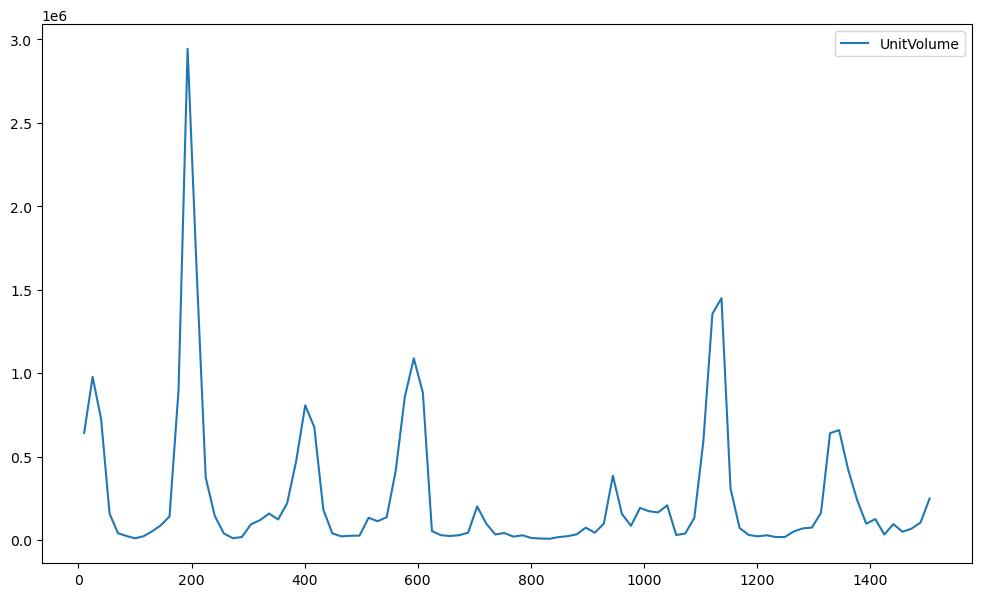

In [196]:
target.plot(kind='line')

In [231]:
season_sum_usa = [29527.0,18386.0,19158.0,217.0,5162.0,18125.0,13107.0]

In [236]:
target_susp = dispense_df[dispense_df.GCN == '29729']

In [244]:
season_start = pd.to_datetime('2017-09-01')
season_end = pd.to_datetime('2018-04-01')

season_sum, season_sum_susp = [],[]
for i in range(7):
    date_start = season_start + relativedelta(months=12*i)
    date_end = season_end + relativedelta(months=12*i)
    sum_ = target[(target.Date >= date_start) & (target.Date <= date_end)]['UnitVolume'].sum()
    season_sum.append(sum_)
    sum_ = target_susp[(target_susp.Date >= date_start) & (target_susp.Date <= date_end)]['UnitVolume'].sum()
    season_sum_susp.append(sum_)
    
tamiflu_df = pd.DataFrame(data = zip(['17-18','18-19','19-20','20-21','21-22','22-23','23-24'],season_sum,season_sum_susp,season_sum_usa),columns = ['Season','Tamiflu','Susp','Hosp'])
tamiflu_norm_df = tamiflu_df.copy()
tamiflu_norm_df['Tamiflu'] = tamiflu_df['Tamiflu']/tamiflu_df['Tamiflu'].max()
tamiflu_norm_df['Hosp'] = tamiflu_df['Hosp']/tamiflu_df['Hosp'].max()
tamiflu_norm_df['Susp'] = tamiflu_df['Susp']/tamiflu_df['Susp'].max()

<AxesSubplot:>

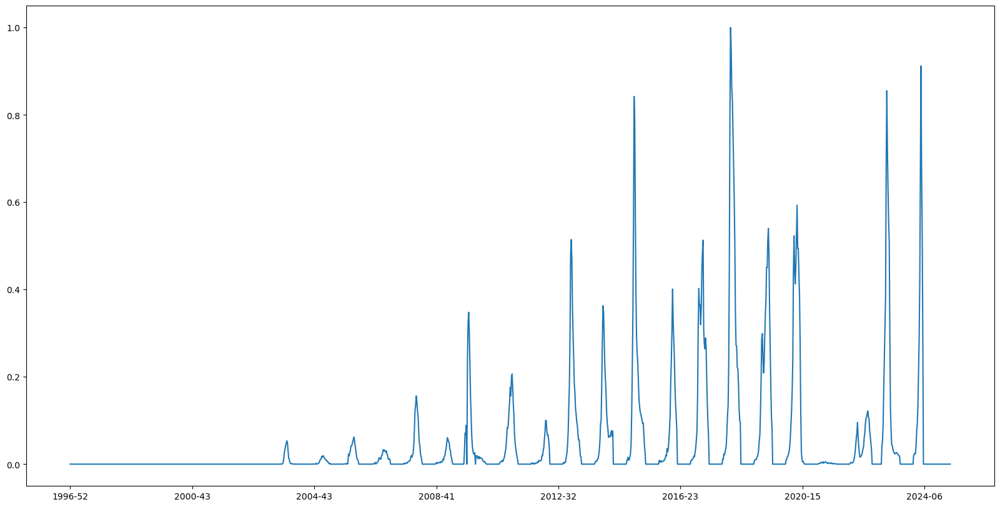

In [225]:
usa_infall_norm.plot(kind='line')

In [246]:
tamiflu_df[['Tamiflu','Hosp','Susp']].corr()

,Tamiflu,Hosp,Susp
Tamiflu,1.000000,0.969803,0.952383
Hosp,0.969803,1.000000,0.967282
Susp,0.952383,0.967282,1.000000


<AxesSubplot:xlabel='Season'>

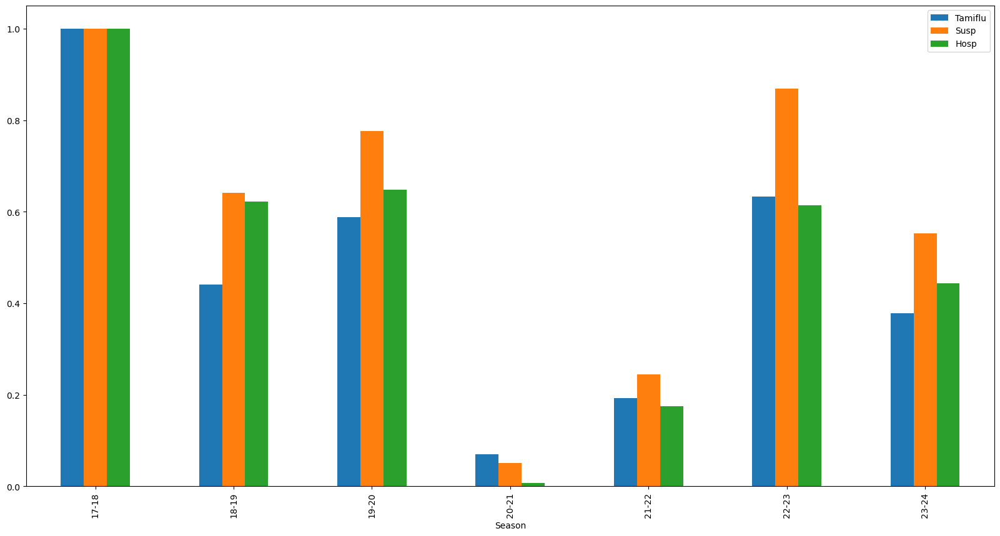

In [245]:
tamiflu_norm_df.set_index('Season').plot(kind='bar')

<AxesSubplot:xlabel='Hosp', ylabel='Susp'>

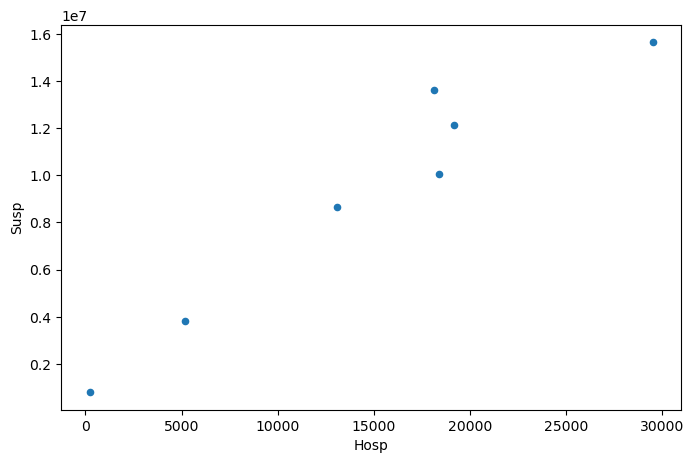

In [247]:
tamiflu_df[['Hosp','Susp']].plot(kind='scatter',x='Hosp',y='Susp',figsize=(8,5))

<AxesSubplot:xlabel='Hosp', ylabel='Tamiflu'>

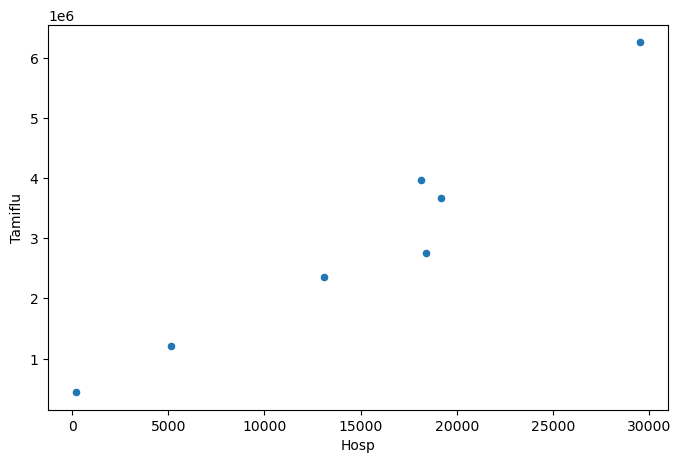

In [249]:
tamiflu_df[['Hosp','Tamiflu']].plot(kind='scatter',x='Hosp',y='Tamiflu',figsize=(8,5))

## Do fits

In [256]:
from sklearn.linear_model import LinearRegression

In [263]:
X = tamiflu_df[['Hosp']]
X['HospSquared'] = X['Hosp']**2
X['Const'] = [1]*len(X)

### Tablet 75mg

In [275]:
y = tamiflu_df['Tamiflu']
lin_reg = LinearRegression(fit_intercept=False)
lin_reg.fit(X,y)
tablet_pred = pd.DataFrame(data = lin_reg.predict(X), index = X['Hosp'])
lin_reg.coef_

array([1.05405622e+02, 3.03049014e-03, 4.79126449e+05])

In [280]:
y = tamiflu_df['Tamiflu']
lin_reg = LinearRegression(fit_intercept=False)
lin_reg.fit(X.drop('HospSquared',axis=1),y)
tablet_pred_lin = pd.DataFrame(data = lin_reg.predict(X.drop('HospSquared',axis=1)), index = X['Hosp'])
lin_reg.coef_

array([   191.65012659, 112541.65349635])

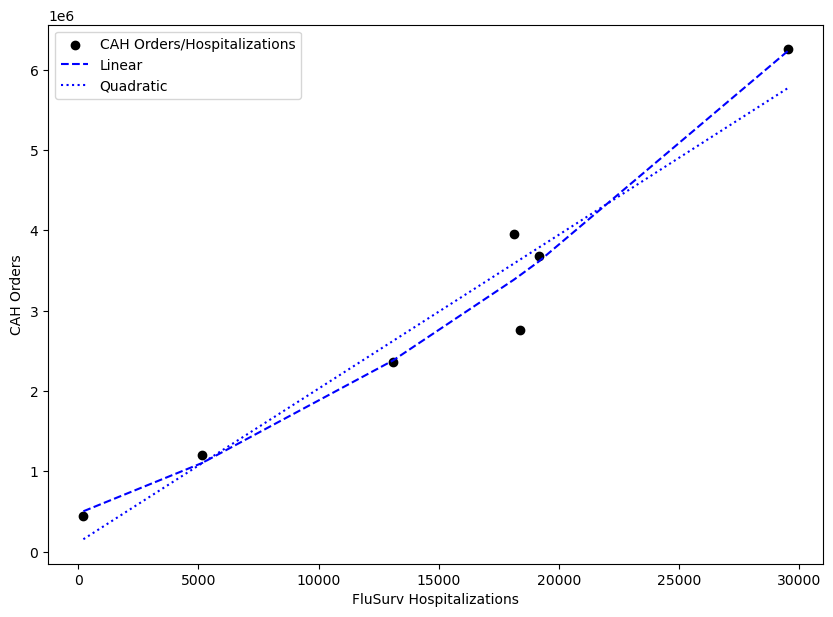

In [289]:
plt.figure(figsize= (10,7))
plt.scatter(tamiflu_df['Hosp'],tamiflu_df['Tamiflu'],color = 'black',label='CAH Orders/Hospitalizations')
plt.plot(tablet_pred.sort_index(),color='blue',linestyle='--',label='Linear')
plt.plot(tablet_pred_lin.sort_index(),linestyle=':',color='blue',label='Quadratic')
plt.ylabel('CAH Orders')
plt.xlabel('FluSurv Hospitalizations')
plt.legend(loc='upper left')

### Susp

In [276]:
y = tamiflu_df['Susp']
lin_reg = LinearRegression(fit_intercept=False)
lin_reg.fit(X,y)
susp_pred = pd.DataFrame(data = lin_reg.predict(X), index = X['Hosp'])
lin_reg.coef_

array([ 7.66893889e+02, -8.34038011e-03,  3.94105882e+05])

In [290]:
y = tamiflu_df['Susp']
lin_reg = LinearRegression(fit_intercept=False)
lin_reg.fit(X.drop('HospSquared',axis=1),y)
susp_pred_lin = pd.DataFrame(data = lin_reg.predict(X.drop('HospSquared',axis=1)), index = X['Hosp'])
lin_reg.coef_

array([5.29535602e+02, 1.40300424e+06])

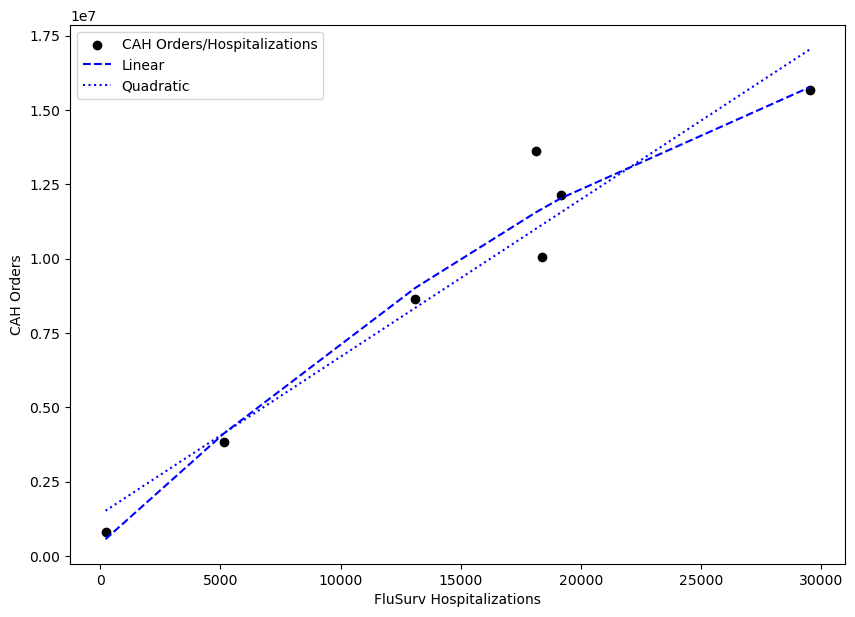

In [292]:
plt.figure(figsize= (10,7))
plt.scatter(tamiflu_df['Hosp'],tamiflu_df['Susp'],color = 'black',label='CAH Orders/Hospitalizations')
plt.plot(susp_pred.sort_index(),color='blue',linestyle='--',label='Linear')
plt.plot(susp_pred_lin.sort_index(),linestyle=':',color='blue',label='Quadratic')
plt.ylabel('CAH Orders')
plt.xlabel('FluSurv Hospitalizations')
plt.legend(loc='upper left')

# New Model Improvements

In [46]:
##################### training executable ########################################
def train(dataloader, model,device, loss_fn, optimizer,noise):
    
    # train function gets called inside function train_model
    # set up to be general but loss_fn and optimizer are hardcoded in train_model

    model.train()
    cnt = 0
    total_loss = 0
    for batches in dataloader:
            x,y = batches
         
            x=x.to_dense().to(device)
            y= y.to(device)
            pred=  model(x.float())
            if noise == True:
               randos = []
               for i in range(y.shape[0]):
                   rando = np.random.normal(loc=0.0, scale=.2, size=None)
                   randos.append(rando)
               randos = torch.tensor(randos)
               y = (1+rando)*y
          
            loss = loss_fn(pred,y)
           
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            
            loss,current = loss.item(), cnt * len(x) # can't remember why I wanted "current"
          
            cnt+=1
            total_loss+= loss
    return float(total_loss)


############### test executable ##############################################
def test(dataloader, model, device,loss_fn):
    
    #same thing as train but doesn't run the optimizer or a backward

    num_batches = len(dataloader)
    
    model.eval()
    test_loss, correct = 0,0
    with torch.no_grad():
        for X, y in dataloader:
            X,y = X.to_dense().to(device), y.to(device)
            pred = model(X.float())
            
            test_loss+=loss_fn(pred,y.float()).item()
           
    return test_loss

def test_max(dataloader, model, device):
    
    #same thing as train but doesn't run the optimizer or a backward

    num_batches = len(dataloader)
    
    model.eval()
    pred_list, y_list = [], []
    with torch.no_grad():
        for X, y in dataloader:
            X,y = X.to_dense().to(device), y.to(device)
            pred = model(X.float())
            pred_list.append(pred)
            y_list.append(y.float())
            
    test_loss = abs(np.max(pred_list) - np.max(y_list)).item()
    loc = abs(np.argmax(pred_list) - np.argmax(y_list)).item()
    return test_loss, loc

################ this is the full training executable, uses "train" and "test" ##############################################
################ user be warned I change this almost daily trying to figure out better features ##########################################

def train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast):

# This is the function for minimizing a model for a dataset, saves best val and train model in PATH and outputs two tuples of losses for train/val


# PATH = destination for saving/loading the model
# model, device = model class instance , resources
# loss_fn = loss class instance
# batched_sequence = Dataset instance
# learn_rate = (float) learn_rate 
# num_epochs = (int) number of epochs
# kill = (int) if loss does not decrease for "kill" number of epochs end the routine
# batch_size_ = (int) batch size
# t_beg = (int) index in DATES to start fit
# t_end = (int) index in DATES to end fit
# noise = (bool) true or false to introduce noise in train
# forecast = (int) number of indices to include in validation beyond t_end

    #sparse_tensor = Dataset_(Y_df,dataframe_list) 
    #batched_sequence = SequenceDataset(sparse_tensor) # this is hard coded in but could get rid of this by just feeding batched_sequence as input
    time0 = time.perf_counter()
    
    with open(PATH[:-4]+".log","w") as f:
        f.write("starting log for model: "+PATH+"\n")
        loss_values = []
        pred = []
        train_ = Subset(batched_sequence,range(t_beg,t_end)) 
        train_dataloader = DataLoader(train_, batch_size=batch_size_, shuffle=False)

        test_ = Subset(batched_sequence,range(t_end,t_end+forecast))
        test_dataloader = DataLoader(test_, batch_size=1, shuffle=False)




        #loss_fn = nn.MSELoss()
        #loss_fn = nn.L1Loss()
        #loss_fn = elastic_net_loss()
        optimizer = torch.optim.Adam(model.parameters(), lr=learn_rate)
        losses, losses_test, peak_match = [],[],[]
        c, epoch, loss_cut= 0,0, 1e99 # init
        d=c
        g = c
        loss_cut_t = loss_cut
        loss_cut_val = loss_cut

        while epoch < num_epochs:
        #for epoch in range(num_epochs):
            print("epoch",epoch,c,d)
            time1 = time.perf_counter()
            
            d+=1
            g+=1
            if d % 10 == 0 and d!=0:
                learn_rate*=0.1
                model.load_state_dict(torch.load(PATH[:-4]+"_train.pth"))
                optimizer = torch.optim.Adam(model.parameters(), lr=learn_rate)
                
                print("Shrinking learning rate to",str(learn_rate))
                f.write("Shrinking learning rate to "+str(learn_rate)+"\n")
                if learn_rate < 1e-6:
                    print("Learning rate getting small")
                    f.write("Learning rate getting small\n")
                    break
    #         optimizer = torch.optim.Adam(model.parameters(), lr=learn_rate)
            loss = train(train_dataloader,model,device,loss_fn,optimizer,noise)
            losses.append(loss)
        
            #loss_test = test(test_dataloader,model,device,loss_fn)
            loss_test, loc_test = test_max(test_dataloader,model,device)
            peak_match.append(loss_test)
            loss_test = np.sqrt(loss_test**2+(0.1*loc_test)**2+(0.1*loss)**2)

            losses_test.append(loss_test)
            time2 = time.perf_counter()
        
            print("Train loss:",loss,"Val loss:",loss_test,"Time:",time2-time1)
            f.write("Train loss: "+str(loss)+" Val loss: "+str(loss_test)+" Time: "+str(time2-time1)+"\n")

            if epoch == 0:
                loss_cut = loss_test
            if epoch > 0:
                if loss_cut < loss_test:
                    c+=1
                else:
                    c = 0
                    torch.save(model.state_dict(), PATH)
                loss_cut = loss_test
            


            
            if loss < loss_cut_t:
                loss_cut_t = loss
                torch.save(model.state_dict(), PATH[:-4]+"_train.pth")
                d = 0
            if loss_test < loss_cut_val and epoch > 15:
                loss_cut_val = loss_test
                torch.save(model.state_dict(), PATH[:-4]+"_val.pth")
                g = 0
        # test(train_dataloader,model,loss_fn)
        
            if c == kill and epoch > 30:
                print("reached val limit, early stopping now")
                break
            epoch +=1
                
        
        print("Complete")
        print("Total time:",time2-time0)
        f.write("Complete\n Total time: "+str(time2-time0))
    return losses,losses_test, peak_match

In [162]:
class Dataset_(Dataset):
    
    def __init__(self,Y_df,df,seq,shift):
    
            
        df = df.to_numpy()
        y = Y_df.to_numpy()
        data_tmp = []
        for i in range(df.shape[0]):
            batch = []
            for j in range(seq):

                ind = i+j - shift

                if ind <0:
                    batch.append(np.zeros(shape=df[ind].shape))

                else:
                    batch.append(df[ind])
            data_tmp.append(batch)

        data_tmp = np.array(data_tmp)

        data = []
        print(y.shape)
        for j in range(df.shape[0]):
            
            x = torch.from_numpy(np.asarray(data_tmp[j],dtype='float32'))
            Y = torch.tensor(y[j], dtype = torch.float32)
            data.append((x,Y))
        
        self.data = data
        
    def __len__(self):

        return len(self.data)
    def __getitem__(self,i):
            
            #return item at i
            
        return self.data[i]

In [48]:
def create_prediction(PATH,NN,device,batched_sequence,Y_mean,Y_std,norm_bool):
    
    # PATH = location of model
    # NN = model class instance
    # batched_sequence= data class instance
    # Y_mean = mean of target for undoing standard scalar transform
    # Y_std = standard deviation of target for undoing standard scalar transform
    # norm_bool = True/False if you want to return Normalized/Raw transformation
    
    NN.load_state_dict(torch.load(PATH))
    NN.eval()
    #sparse_tensor = Dataset_(Y_df,dataframe_list)
    #batched_sequence = SequenceDataset(sparse_tensor)
    #sub_ = Subset(batched_sequence,range(0,136))
    sub_ = batched_sequence
    datas = DataLoader(sub_, batch_size=1, shuffle=False)
    all_,ys = [],[]
    for x,y in datas:
        x=x.to_dense().to(device)
        pred= NN(x.float())
    
        all_.append(pred[0].cpu().detach().numpy())
        ys.append(y.to_dense().numpy())
    all_ =  np.array(all_)
    
    if norm_bool==False: # undo standard scalar
        tmp = np.ones(shape = all_[:,0].shape,dtype=float)*Y_mean[0]
    
        all_ = all_[:,0] * Y_std[0]+tmp

    return all_

In [49]:
def read_logs(filename):
    
    f = open(filename,'r')
    lines = f.readlines()
    f.close()
    train_loss, val_loss = [],[]
    for line in lines:
        if line.count('Train loss')>0:
            line_split = line.split(' ')
            train_loss.append(float(line_split[2]))
            val_loss.append(float(line_split[5]))
    return train_loss, val_loss


In [163]:
index = list(df.index)

data_in = Dataset_(df["INF_ALL"],df.drop(['key_0','INF_ALL','season'],axis=1),26,26+20)

(788,)


In [38]:
df.columns

Index(['INF_ALLAUS', 'INF_ALLCHL', 'INF_ALLPRY', 'INF_ALLARG', 'INF_ALLURY',
       'season', 'INF_ALL'],
      dtype='object')

## LSTM

In [52]:
class lstm(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(lstm, self).__init__()
        
        
        
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
            nn.Dropout(0.05),
            nn.Linear(seq_len*country_len,1),
            nn.ReLU()
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

### 22-23

In [207]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [195]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 15.962856239596684 Val loss: 1.7903661678825054 Time: 0.7239879000007932
epoch 1 0 0
Train loss: 14.352280812848422 Val loss: 1.643227616121648 Time: 0.7327323000008619
epoch 2 0 0
Train loss: 14.286208482474962 Val loss: 1.6368866365949017 Time: 0.6971281000005547
epoch 3 0 0
Train loss: 13.960427330933655 Val loss: 1.6050022135434878 Time: 0.6935952000003454
epoch 4 0 0
Train loss: 13.278035708611469 Val loss: 1.5351297536006856 Time: 0.6820757999994385
epoch 5 0 0
Train loss: 11.929443819035214 Val loss: 1.3994169189724006 Time: 0.6751777999998012
epoch 6 0 0
Train loss: 10.158346866028225 Val loss: 1.214241875442843 Time: 0.6715160999992804
epoch 7 0 0
Train loss: 8.282413327304416 Val loss: 1.0188176682177952 Time: 0.6825150000004214
epoch 8 0 0
Train loss: 7.382713878384838 Val loss: 0.92211297745046 Time: 0.7958433000003424
epoch 9 0 0
Train loss: 6.918064712524448 Val loss: 0.8715455210646053 Time: 1.5145625999994081
epoch 10 0 0
Train loss: 6.7500446302

In [100]:
loss_t, loss_v = read_logs('models\\lstm_new_22-23.log')

In [101]:
loss_v

[1.7903661678825054,
 1.643227616121648,
 1.6368866365949017,
 1.6050022135434878,
 1.5351297536006856,
 1.3994169189724006,
 1.214241875442843,
 1.0188176682177952,
 0.92211297745046,
 0.8715455210646053,
 0.8498538255089086,
 0.841025568865514,
 0.8267147835746945,
 0.8248313321029862,
 0.8138884206922044,
 0.8003128305297639,
 0.7872592211167246,
 0.7737826691499369,
 0.7734578074303544,
 0.7575148337777732,
 0.7500795493236926,
 0.7401136123000258,
 0.7407130174566364,
 0.7261874168104517,
 0.7302849958207834,
 0.7251654695203402,
 0.6933430161311106,
 0.6842437694359363,
 0.680453492600875,
 0.6859083097847918,
 0.6565868259755487,
 0.6317424460689494,
 0.6363276361510648,
 0.62649589012992,
 0.5787009160645602,
 0.5689053630576054,
 0.5574456711985998,
 0.542743120317174,
 0.5584446851347046,
 0.5235270370498096,
 0.5325634251671786,
 0.5207192879554179,
 0.5110228479199771,
 0.4790848687652153,
 0.47241919048407804,
 0.47265155039428125,
 0.4729966340642478,
 0.4462835607291203,

Text(0.5, 1.0, 'Training Log')

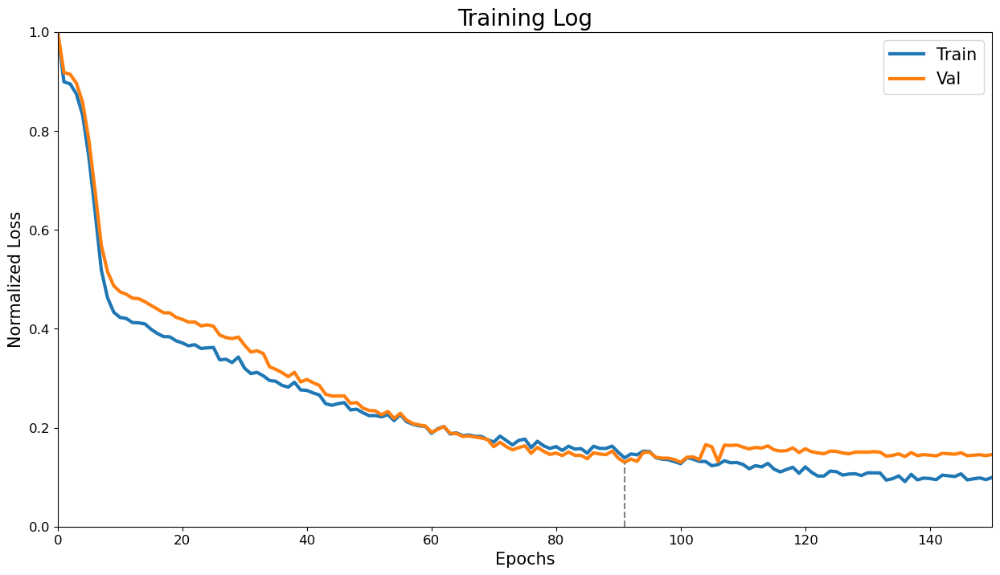

In [115]:
plt.plot(loss_t/np.max(loss_t),linewidth=3,label='Train')
plt.plot(loss_v/np.max(loss_v),linewidth=3,label='Val')
plt.legend(loc='upper right',fontsize=15)
plt.axvline(x=np.argmin(loss_v),ymin=0,ymax=np.min(loss_v)/np.max(loss_v),linestyle='dashed',color='gray')
plt.ylim([0,1])
plt.xlim([0,150])
plt.ylabel('Normalized Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=15)
plt.xticks(size=12)
plt.yticks(size=12)
plt.title('Training Log',fontsize=20)

In [57]:
def plot_model(end_date):
    MODEL_PATH = PATH[:-4]+"_val.pth"
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

    plot_df = pd.DataFrame(data=usa_infall_norm.values,columns = ['INF_ALL'],index=usa_infall_norm.index)
    plot_df["pred"] = pred
    plt.rcParams['figure.figsize'] = (12, 7)

    plt.plot(plot_df["INF_ALL"].loc['2015-01':end_date],linewidth=3,label='flu hospitilizations')
    #plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
    plt.plot(plot_df["pred"].loc['2015-01':end_date],linestyle="dashed",color='red',label='included')
    #plt.plot(plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
    plt.legend(loc='upper left')
    plt.xticks(ticks = ['2015-01','2016-01','2017-01','2018-01','2019-01','2020-01','2021-01','2022-01','2023-01'], rotation=90,size=15)
    plt.title(model.__class__.__name__+' Forecast',size =20)
    plt.ylabel('Number of hospitalizations in the US',size =15)
    plt.xlabel('Date',size=15)

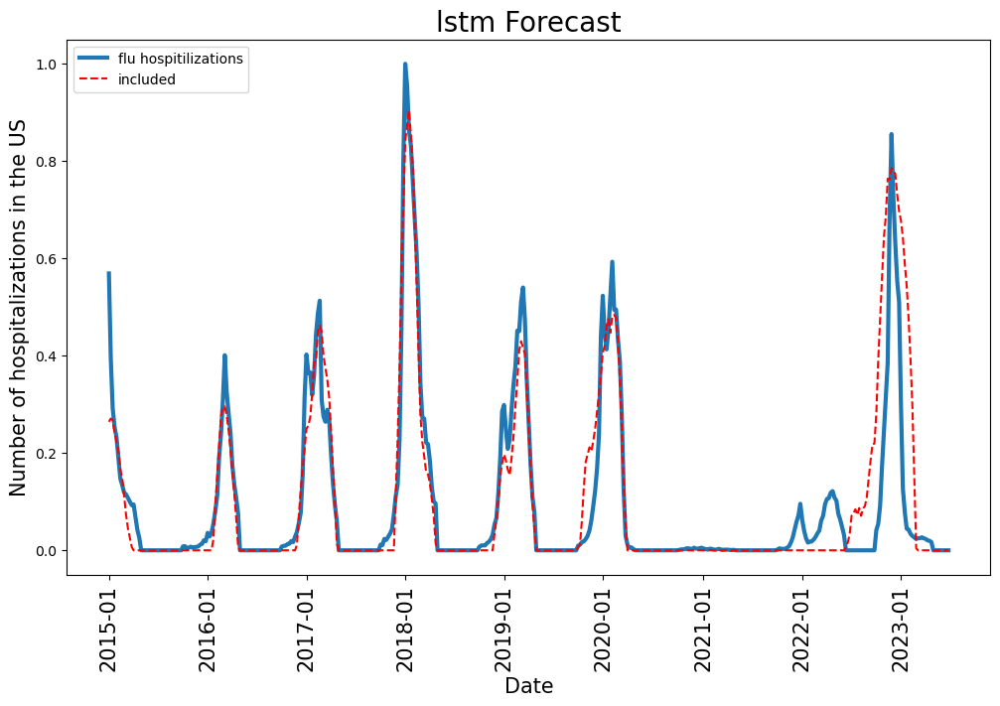

In [209]:
plot_model('2023-26')

### 23-24

In [374]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_23-24.pth'
LOAD_PATH =   'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23_val.pth'
#print(LOAD_PATH)
model.load_state_dict(torch.load(LOAD_PATH))


loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 100
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2023-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [375]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 4.037287934061201 Val loss: 0.4468034144500511 Time: 1.0886575999902561
epoch 1 0 0
Train loss: 5.03192187295673 Val loss: 0.538216601683548 Time: 1.0221644999983255
epoch 2 1 1
Train loss: 4.5351426316064725 Val loss: 0.4833625025387861 Time: 0.925728700007312
epoch 3 0 2
Train loss: 3.889480539379803 Val loss: 0.4230622591954746 Time: 0.8286513000202831
epoch 4 0 0
Train loss: 3.947297185514234 Val loss: 0.4316426835837258 Time: 0.8056949000165332
epoch 5 1 1
Train loss: 3.8190734914264377 Val loss: 0.41688959671064585 Time: 1.4170245999994222
epoch 6 0 0
Train loss: 3.5842854129639967 Val loss: 0.3909916441470213 Time: 1.57782400000724
epoch 7 0 0
Train loss: 3.5145200363429936 Val loss: 0.3834472916381289 Time: 0.7919362999964505
epoch 8 0 0
Train loss: 3.486537078406812 Val loss: 0.37941330031150705 Time: 0.8351436999801081
epoch 9 0 0
Train loss: 3.444864870451802 Val loss: 0.3701395356203104 Time: 0.7769912999938242
epoch 10 0 0
Train loss: 3.353708874683

(0.0, 1.0)

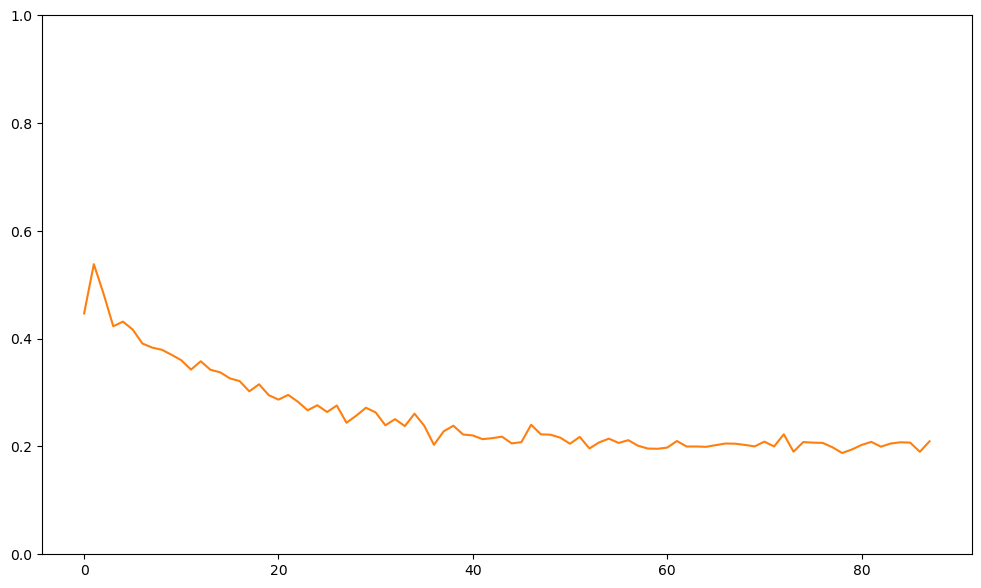

In [376]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

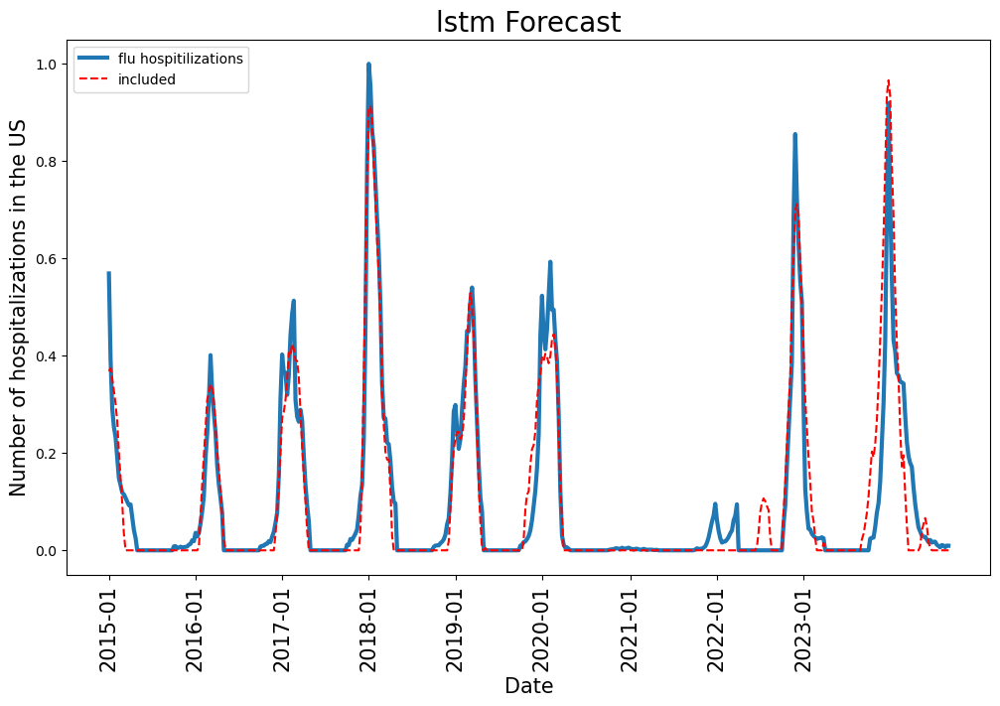

In [377]:
plot_model('2024-36')

## LSTM1

In [74]:
class lstm1(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(lstm1, self).__init__()
        
        
        
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 1)

        

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
            #nn.Dropout(0.05),
            nn.Linear(seq_len*country_len,1),
            nn.ReLU()
        )        
        
    def forward(self, x):
        
        logits, _ = self.lstm(x.permute(0,2,1))       
        logits = self.seq(logits)
        
        
        return logits

### 22-23

In [210]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 350
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(42)

In [202]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.453722006127919 Val loss: 1.8147144248153508 Time: 0.4639515999988362
epoch 1 0 0
Train loss: 12.83926446027883 Val loss: 1.5906209099303303 Time: 0.5193548000006558
epoch 2 0 0
Train loss: 11.421030926298279 Val loss: 1.3919595404946596 Time: 0.5362834000006842
epoch 3 0 0
Train loss: 9.783732431270444 Val loss: 1.1848035474673981 Time: 0.432252000000517
epoch 4 0 0
Train loss: 8.238538820419805 Val loss: 1.0266998666768086 Time: 0.44029130000126315
epoch 5 0 0
Train loss: 7.198232363633082 Val loss: 0.9159801766729031 Time: 0.44058809999842197
epoch 6 0 0
Train loss: 6.612672965254916 Val loss: 0.8490197852847846 Time: 0.4664436000002752
epoch 7 0 0
Train loss: 6.294559845065982 Val loss: 0.8098441920789226 Time: 0.44116199999916716
epoch 8 0 0
Train loss: 6.107731360824751 Val loss: 0.785660945944857 Time: 0.4212377000003471
epoch 9 0 0
Train loss: 5.98085659834922 Val loss: 0.7689002502545202 Time: 0.4472151000009035
epoch 10 0 0
Train loss: 5.87557806954

(0.0, 1.0)

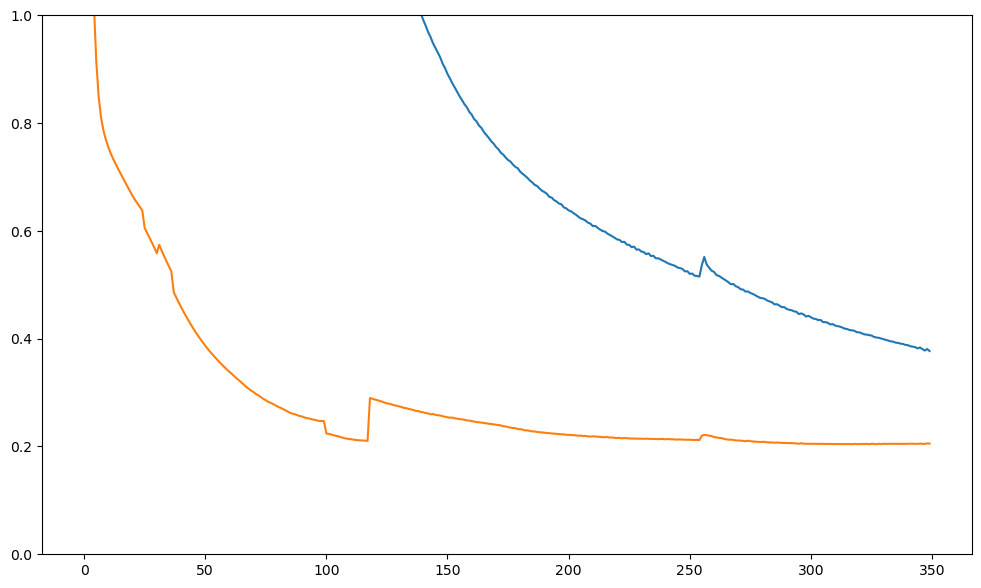

In [203]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

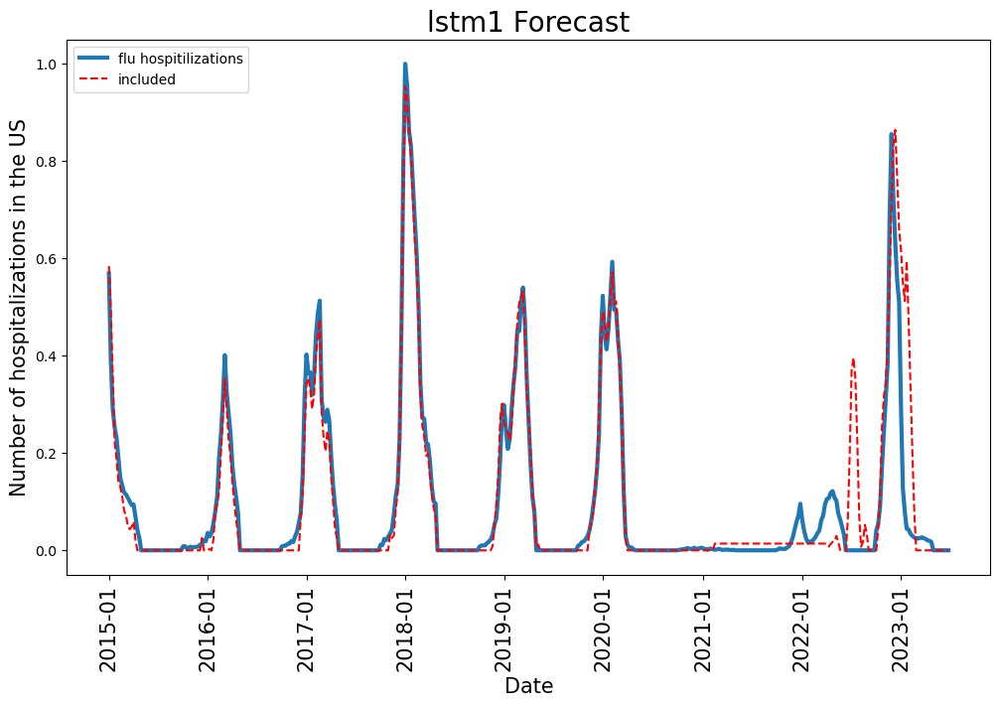

In [211]:
plot_model('2023-26')

### 23-24

In [396]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_23-24.pth'
LOAD_PATH =   'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23_val.pth'
#print(LOAD_PATH)
#model.load_state_dict(torch.load(LOAD_PATH))


loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2023-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [397]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 16.52716639583665 Val loss: 1.835603122817809 Time: 0.6039565000100993
epoch 1 0 0
Train loss: 14.505015331437193 Val loss: 1.6308123342751084 Time: 0.5073932000086643
epoch 2 0 0
Train loss: 12.527442597112945 Val loss: 1.4274965190809954 Time: 0.5180944000021555
epoch 3 0 0
Train loss: 10.515139017596994 Val loss: 1.218185745860151 Time: 0.5224472999980208
epoch 4 0 0
Train loss: 8.932229185563525 Val loss: 1.0500158683495056 Time: 0.525952199997846
epoch 5 0 0
Train loss: 7.938614929892346 Val loss: 0.9400483811798116 Time: 0.49331019999226555
epoch 6 0 0
Train loss: 7.3858152652577544 Val loss: 0.8749028663344198 Time: 0.5350117000052705
epoch 7 0 0
Train loss: 7.056087178768829 Val loss: 0.8341601098027844 Time: 0.5510189999768045
epoch 8 0 0
Train loss: 6.823270852421771 Val loss: 0.8053271572542344 Time: 0.9701923999818973
epoch 9 0 0
Train loss: 6.636099429432607 Val loss: 0.7825734402231299 Time: 1.0268049000005703
epoch 10 0 0
Train loss: 6.47211285715

(0.0, 1.0)

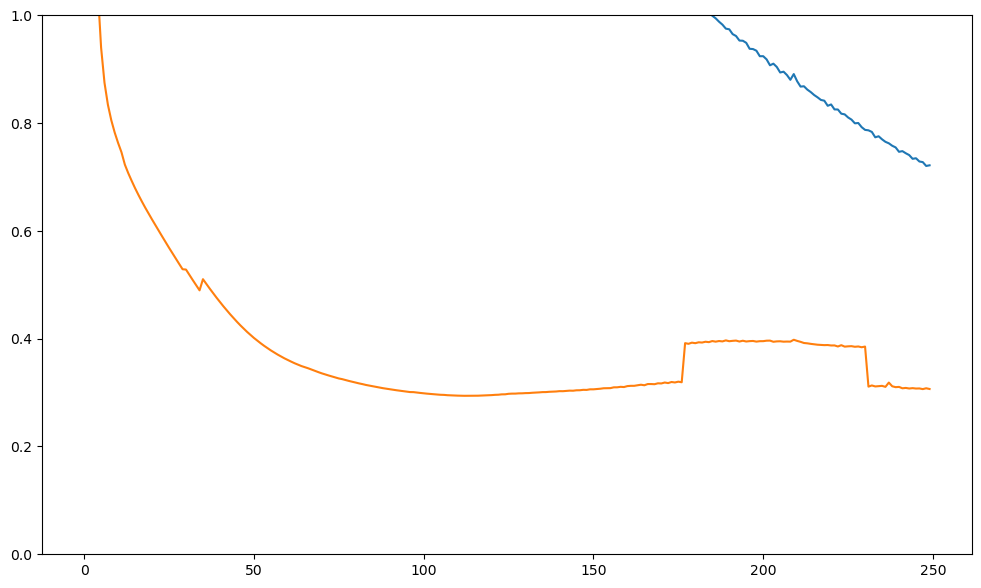

In [398]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

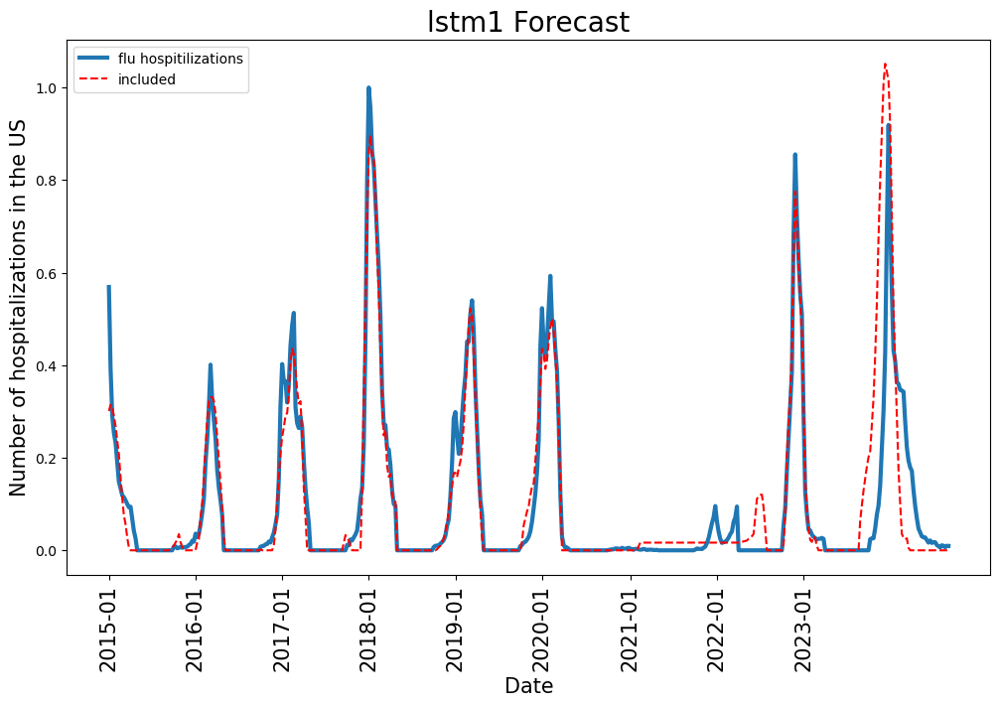

In [399]:
plot_model('2024-36')

## LSTM Lin1

In [80]:
class lstm_lin1(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(lstm_lin1, self).__init__()
        
        
        
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,50),
            nn.Dropout(0.1),
            nn.ReLU(),
            nn.Linear(50,1),
            nn.ReLU()
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

### 22-23

In [212]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_lin1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(5)

In [213]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.803203291558585 Val loss: 1.7087993613594563 Time: 0.8374174000000494
epoch 1 0 0
Train loss: 14.231719914934018 Val loss: 1.6636014541997912 Time: 0.7828787999987981
epoch 2 0 0
Train loss: 14.220062899884311 Val loss: 1.6180609860289847 Time: 0.7584459999998217
epoch 3 0 0
Train loss: 14.148130801280473 Val loss: 1.6121274719217003 Time: 0.7977366000013717
epoch 4 0 0
Train loss: 14.208642977912 Val loss: 1.6627093696832504 Time: 0.7833850999995775
epoch 5 1 1
Train loss: 14.13490039385863 Val loss: 1.6352828410443339 Time: 0.7715170000010403
epoch 6 0 0
Train loss: 13.981629452910283 Val loss: 1.5961318661967423 Time: 0.8209296000004542
epoch 7 0 0
Train loss: 13.51546525396671 Val loss: 1.5454986388177758 Time: 0.7706171999998332
epoch 8 0 0
Train loss: 11.480205202191534 Val loss: 1.3302833836531394 Time: 0.8715353000006871
epoch 9 0 0
Train loss: 8.453344882147832 Val loss: 1.0075335085436383 Time: 1.6235098999986803
epoch 10 0 0
Train loss: 6.860989119

(0.0, 2.0)

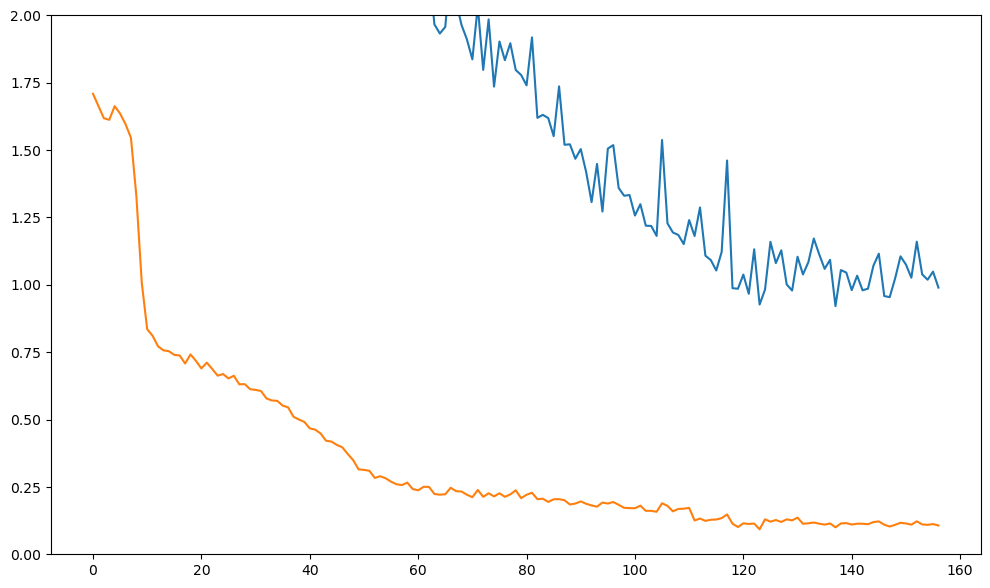

In [214]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,2])

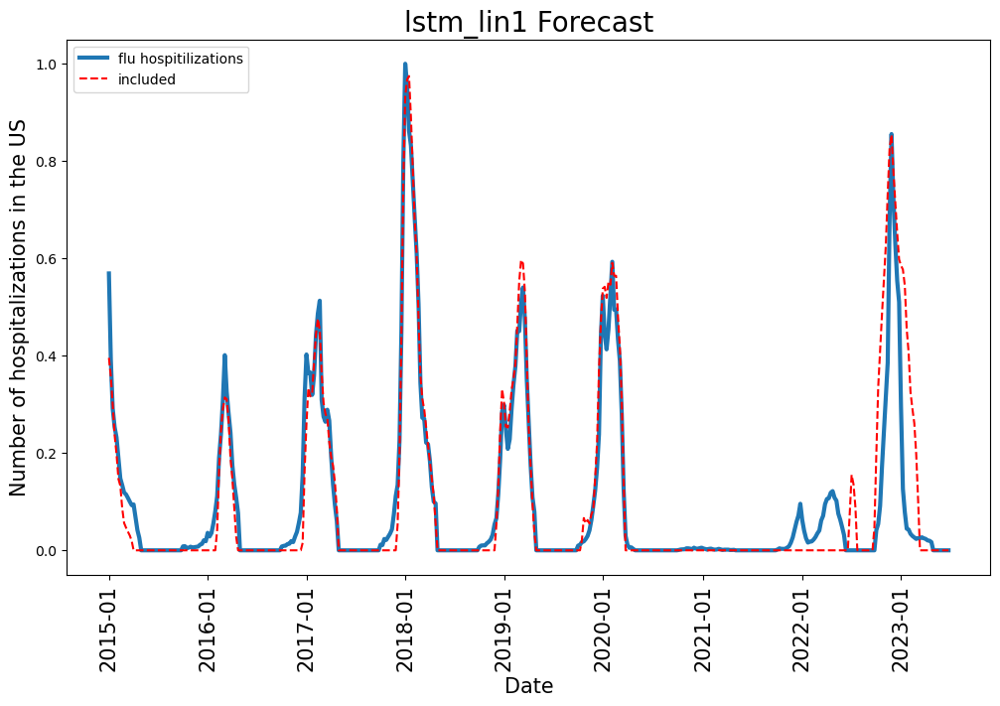

In [217]:
plot_model('2023-26')

### 23-24

In [400]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_lin1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_23-24.pth'
LOAD_PATH =   'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23_val.pth'
#print(LOAD_PATH)
#model.load_state_dict(torch.load(LOAD_PATH))


loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2023-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [401]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 18.362216836681796 Val loss: 2.0191666177527052 Time: 1.060775099991588
epoch 1 0 0
Train loss: 16.816518897617925 Val loss: 1.8752875432005993 Time: 1.0122092999808956
epoch 2 0 0
Train loss: 16.433923823779395 Val loss: 1.8329079719404984 Time: 0.928305100009311
epoch 3 0 0
Train loss: 15.210966335822611 Val loss: 1.7021836150817462 Time: 0.8904528999992181
epoch 4 0 0
Train loss: 13.415312679669626 Val loss: 1.502853441737261 Time: 0.8827455000136979
epoch 5 0 0
Train loss: 10.417793016398901 Val loss: 1.1843322242225878 Time: 0.9095919000101276
epoch 6 0 0
Train loss: 8.865150809967197 Val loss: 1.0203350445731283 Time: 0.8937928999948781
epoch 7 0 0
Train loss: 8.272203491656366 Val loss: 0.9476781482746203 Time: 0.9252926000044681
epoch 8 0 0
Train loss: 7.868547573232016 Val loss: 0.904890344972162 Time: 0.8804513000068255
epoch 9 0 0
Train loss: 7.468870153171576 Val loss: 0.8628819547825737 Time: 0.877565799979493
epoch 10 0 0
Train loss: 7.633159022303

(0.0, 1.0)

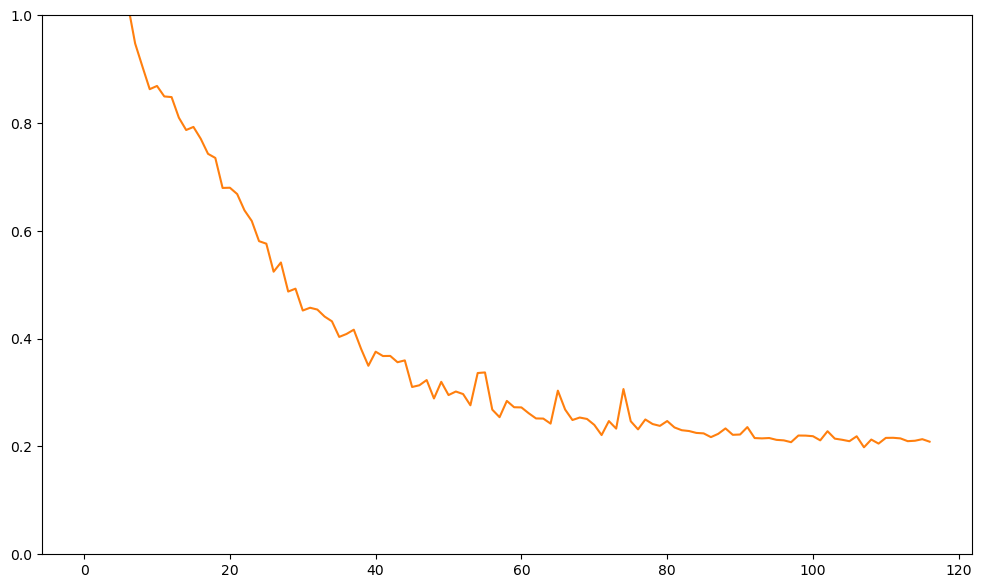

In [402]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

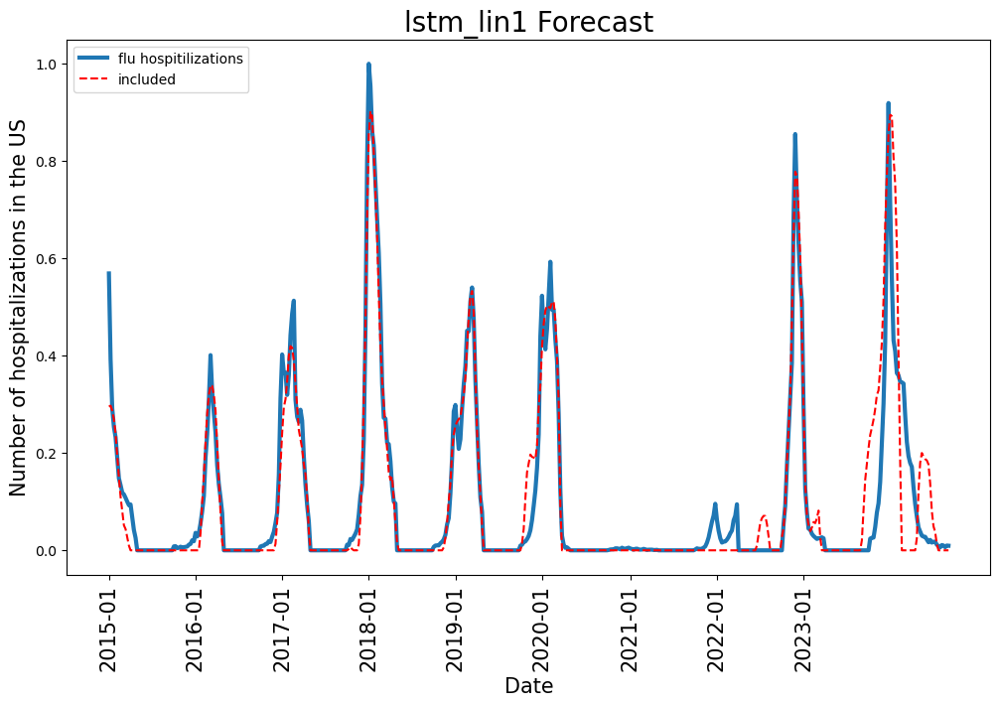

In [404]:
plot_model('2024-36')

## LSTM LinComb

In [86]:
class lstm_comb(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(lstm_comb, self).__init__()
        
        
        
        self.comb = nn.Sequential(nn.Linear(country_len,country_len),
                                  nn.ReLU())
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
        #    nn.Dropout(0.05),
            nn.Linear(seq_len*country_len,1),
            nn.ReLU()
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        logits = self.comb(x)
        logits, _ = self.lstm(logits.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

### 22-23

In [504]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_comb(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [505]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.853841955513253 Val loss: 2.7107788926354224 Time: 0.7987278000218794
epoch 1 0 0
Train loss: 17.80237040241545 Val loss: 1.9164913027255173 Time: 0.9830855000182055
epoch 2 0 1
Train loss: 8.980451528547674 Val loss: 1.0336864620016222 Time: 4.002969400025904
epoch 3 0 0
Train loss: 7.537477743501444 Val loss: 0.8933886313401803 Time: 1.117627400031779
epoch 4 0 0
Train loss: 7.092613090865286 Val loss: 0.858209249647647 Time: 1.1117755000013858
epoch 5 0 0
Train loss: 6.8792650951452 Val loss: 0.8410692826994838 Time: 1.089169699989725
epoch 6 0 0
Train loss: 7.294335983979352 Val loss: 0.8737525447665618 Time: 1.102364500053227
epoch 7 1 1
Train loss: 6.423410711462047 Val loss: 0.7911072145276336 Time: 1.078388299967628
epoch 8 0 0
Train loss: 6.035164604296753 Val loss: 0.7557492823455711 Time: 1.1758479000418447
epoch 9 0 0
Train loss: 5.5276905511466055 Val loss: 0.7030933261757475 Time: 1.1436790999723598
epoch 10 0 0
Train loss: 5.439661415512717 Val

(0.0, 1.0)

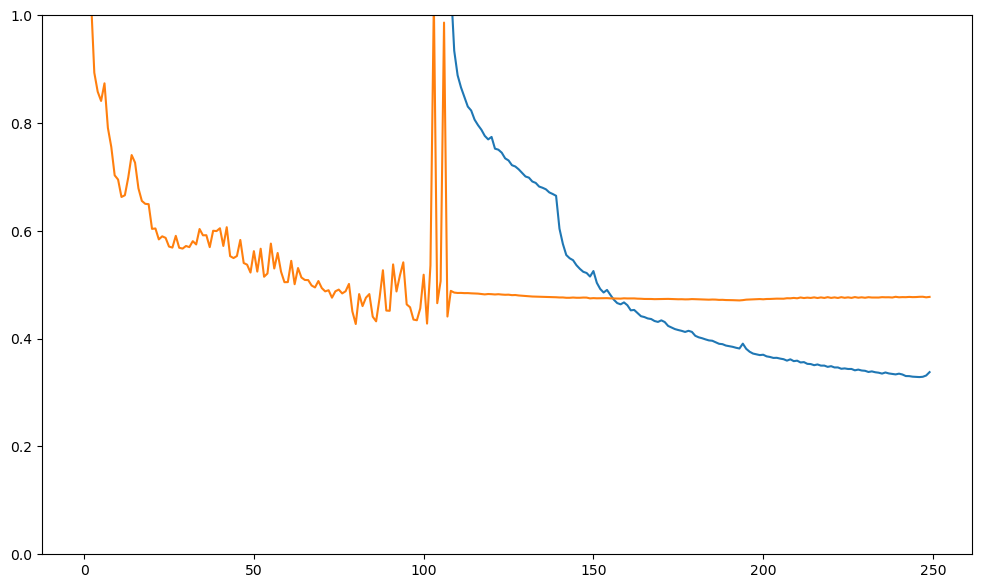

In [506]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

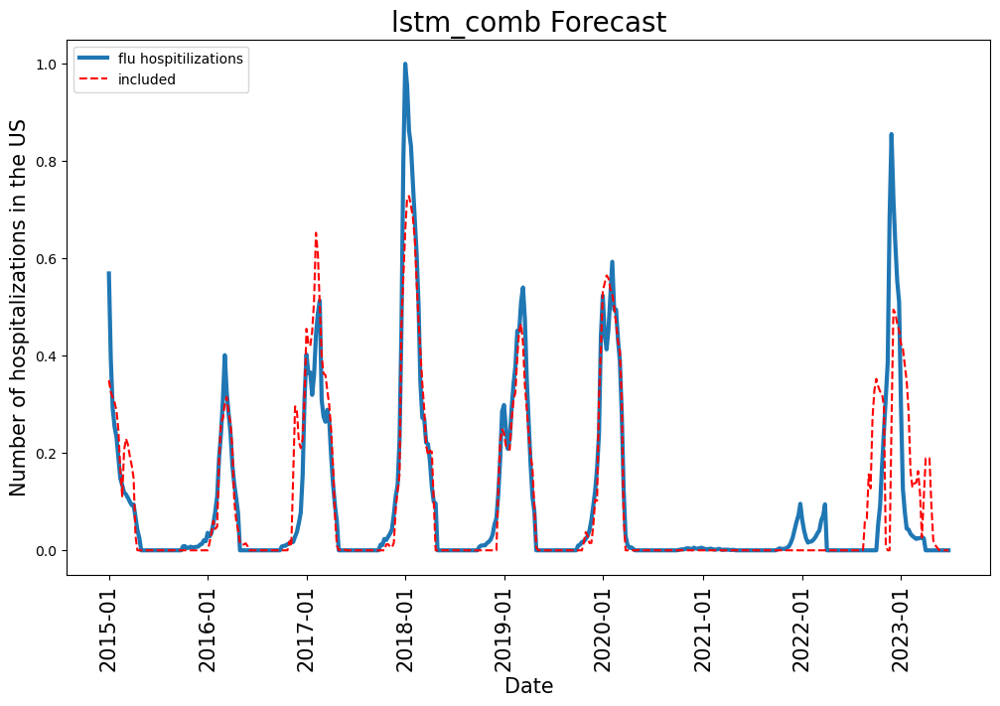

In [507]:
plot_model('2023-26')

## RNN

In [97]:
class rnn(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(rnn, self).__init__()
        
        
        
        self.rnn = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
            nn.Linear(seq_len*country_len,1),
            nn.ReLU()
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.rnn(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.rnn(logits)
        
        logits = self.seq(logits)
        
        
        return logits

### 22-23

In [223]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(5)

In [224]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.692223698610164 Val loss: 1.709305791339583 Time: 0.46711040000081994
epoch 1 0 0
Train loss: 13.68726192659443 Val loss: 1.6143505419879574 Time: 0.4446211000031326
epoch 2 0 0
Train loss: 12.678931763980088 Val loss: 1.489225815438206 Time: 0.45396399998571724
epoch 3 0 0
Train loss: 10.588164032865777 Val loss: 1.2751772501523653 Time: 0.45845389999158215
epoch 4 0 0
Train loss: 8.070227970208885 Val loss: 0.9974587242760958 Time: 0.4558599000010872
epoch 5 0 0
Train loss: 6.714838942482394 Val loss: 0.8489310173640434 Time: 0.5010085999965668
epoch 6 0 0
Train loss: 6.225774190144287 Val loss: 0.7881300064927491 Time: 0.45526230000541545
epoch 7 0 0
Train loss: 6.017978118174199 Val loss: 0.7712109930135044 Time: 0.4508535000059055
epoch 8 0 0
Train loss: 5.827139375057307 Val loss: 0.7472718287372059 Time: 0.5240695999964373
epoch 9 0 0
Train loss: 5.664962607948083 Val loss: 0.7295976860101467 Time: 0.46282980000250973
epoch 10 0 0
Train loss: 5.5475297

(0.0, 1.0)

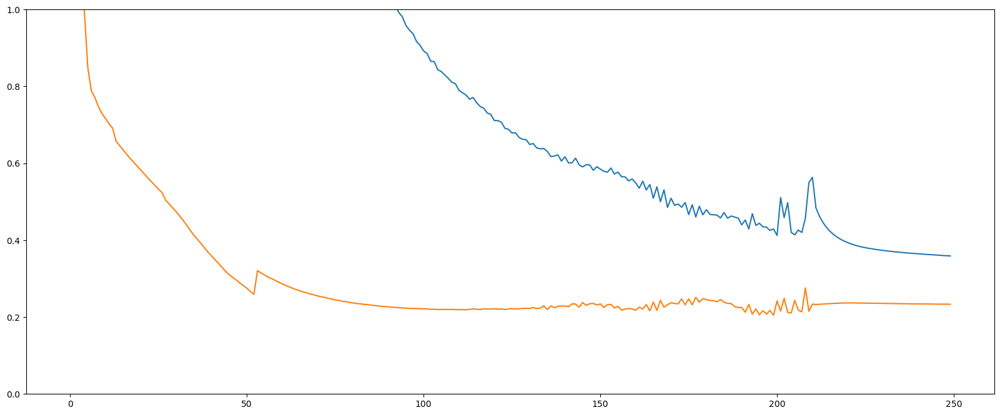

In [225]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

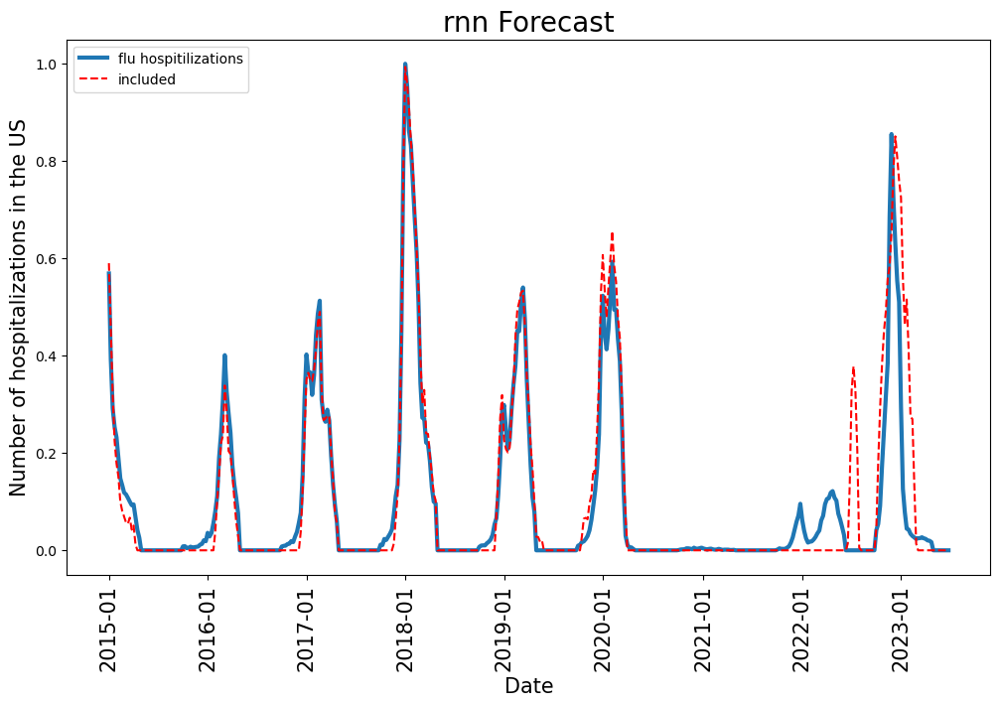

In [226]:
plot_model('2023-26')

### 23-24

In [407]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_23-24.pth'
LOAD_PATH =   'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23_val.pth'
#print(LOAD_PATH)
#model.load_state_dict(torch.load(LOAD_PATH))


loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2023-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [408]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 17.637839007692662 Val loss: 1.9659090374654802 Time: 0.5495813000015914
epoch 1 0 0
Train loss: 15.262608749272886 Val loss: 1.72853821933218 Time: 0.4762784000195097
epoch 2 0 0
Train loss: 12.537334787342054 Val loss: 1.4462201520649502 Time: 0.4662954999948852
epoch 3 0 0
Train loss: 9.407028941857618 Val loss: 1.124396982234874 Time: 0.46931029998813756
epoch 4 0 0
Train loss: 8.047765368984596 Val loss: 0.961215363854694 Time: 0.48255720001179725
epoch 5 0 0
Train loss: 7.557493218640857 Val loss: 0.9038561122628943 Time: 0.48769810001249425
epoch 6 0 0
Train loss: 7.237784035703246 Val loss: 0.8657228849668259 Time: 0.4886056999966968
epoch 7 0 0
Train loss: 6.955722363587199 Val loss: 0.8362350257498122 Time: 0.5207025999843609
epoch 8 0 0
Train loss: 6.716355958812507 Val loss: 0.7864102537676343 Time: 0.4964582000102382
epoch 9 0 0
Train loss: 6.507595449122121 Val loss: 0.7626949211345115 Time: 0.6676854999968782
epoch 10 0 0
Train loss: 6.31432247276

(0.0, 1.0)

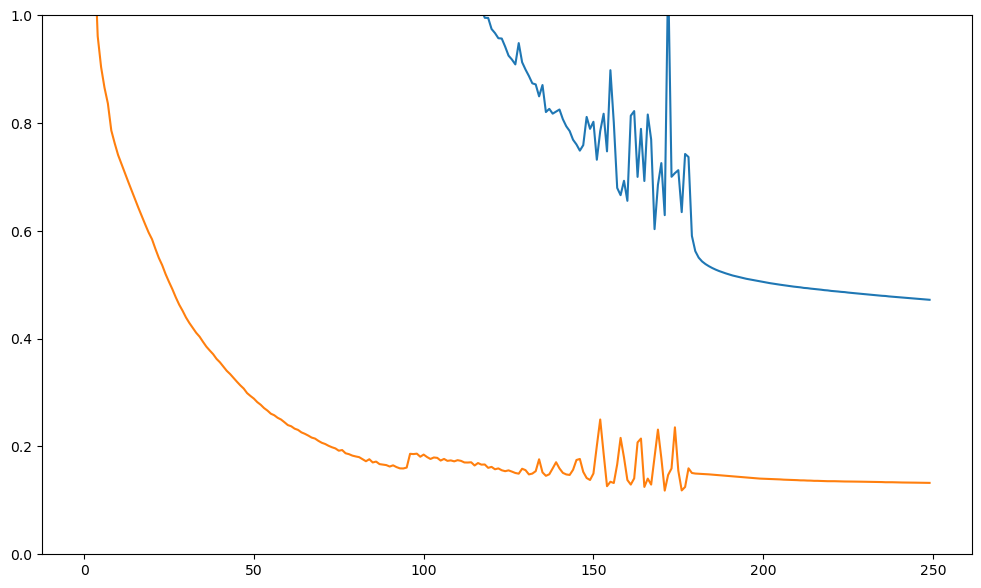

In [409]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

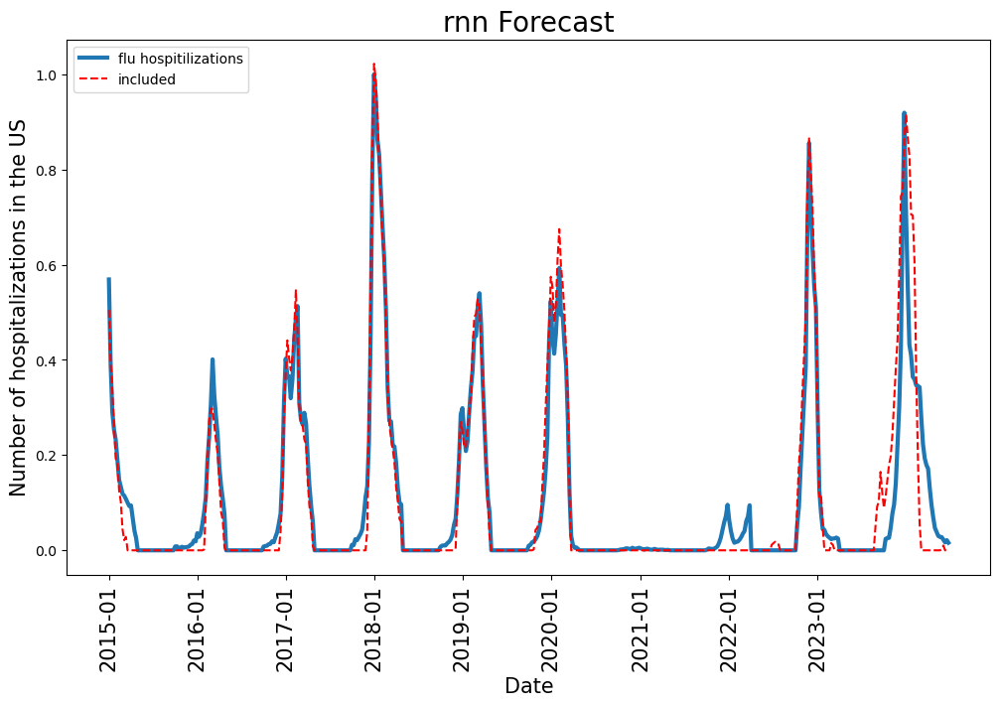

In [410]:
plot_model('2024-26')

## RNN1

In [102]:
class rnn1(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(rnn1, self).__init__()
        
        
        
        self.rnn = nn.RNN(seq_len,seq_len,num_layers = 1)
        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
            nn.Linear(seq_len*country_len,1),
            nn.ReLU()
        )        
        

 
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.rnn(x.permute(0,2,1))        
        logits = self.seq(logits)
        
        
        return logits

### 22-23

In [232]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(5)

In [233]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 11.035764489002318 Val loss: 1.1769497645151625 Time: 0.4145305999991251
epoch 1 0 0
Train loss: 6.364494855727813 Val loss: 0.713791680089268 Time: 0.3601248999912059
epoch 2 0 0
Train loss: 5.867349310721528 Val loss: 0.6552237882420684 Time: 0.37942679999105167
epoch 3 0 0
Train loss: 5.344382152861527 Val loss: 0.5926457804587297 Time: 0.35381679999409243
epoch 4 0 0
Train loss: 4.978910306712152 Val loss: 0.5515203962893592 Time: 0.34810669999569654
epoch 5 0 0
Train loss: 4.6186986749827 Val loss: 0.5100126950278943 Time: 0.4465749000082724
epoch 6 0 0
Train loss: 4.250666683190531 Val loss: 0.472594621337857 Time: 0.40595820000453386
epoch 7 0 0
Train loss: 3.9691249063361145 Val loss: 0.4444999619880156 Time: 0.3491876000043703
epoch 8 0 0
Train loss: 3.7112606106016983 Val loss: 0.4230968288690409 Time: 0.3403680000046734
epoch 9 0 0
Train loss: 3.4720242813357487 Val loss: 0.40150257710585746 Time: 0.36729909999121446
epoch 10 0 0
Train loss: 3.3334533

(0.0, 1.0)

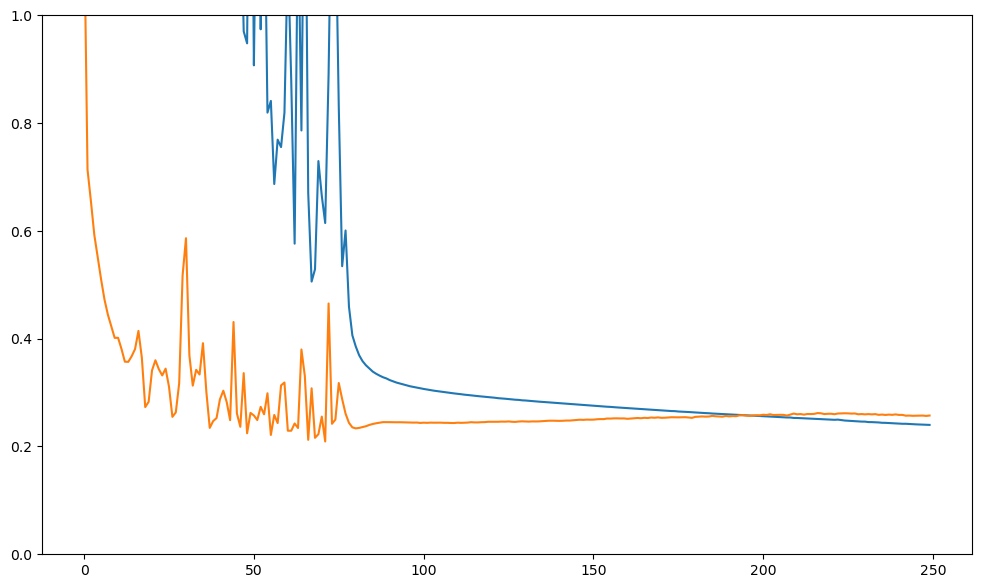

In [234]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

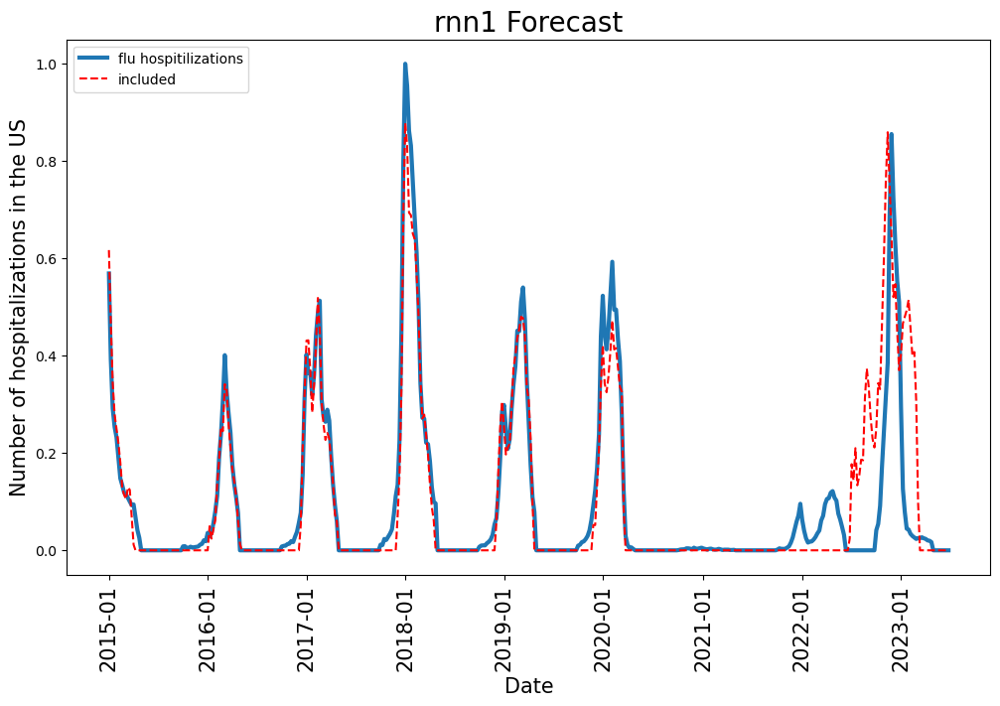

In [235]:
plot_model('2023-26')

### 23-24

In [412]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_23-24.pth'
LOAD_PATH =   'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23_val.pth'
#print(LOAD_PATH)
#model.load_state_dict(torch.load(LOAD_PATH))


loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2023-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [413]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 19.652285601322205 Val loss: 2.1618400795007853 Time: 0.4702648000093177
epoch 1 0 0
Train loss: 13.47180529776682 Val loss: 1.5629325801190423 Time: 0.3470089000184089
epoch 2 0 0
Train loss: 10.085453506631 Val loss: 1.2031374055595778 Time: 0.33670680000795983
epoch 3 0 0
Train loss: 8.182110103152878 Val loss: 0.9999429149999942 Time: 0.33984139998210594
epoch 4 0 0
Train loss: 7.25161993293119 Val loss: 0.8988631853865432 Time: 0.3353573000058532
epoch 5 0 0
Train loss: 6.80054617779662 Val loss: 0.8438366743274468 Time: 0.4035544999933336
epoch 6 0 0
Train loss: 6.5189788020446855 Val loss: 0.8072526718356329 Time: 0.35715510000591166
epoch 7 0 0
Train loss: 6.304902947385504 Val loss: 0.7793009416494647 Time: 0.33687519998056814
epoch 8 0 0
Train loss: 6.1179292798858285 Val loss: 0.7550798239626859 Time: 0.34074350001174025
epoch 9 0 0
Train loss: 5.953884949053972 Val loss: 0.7341315563217453 Time: 0.3385493000096176
epoch 10 0 0
Train loss: 5.803022676

(0.0, 1.0)

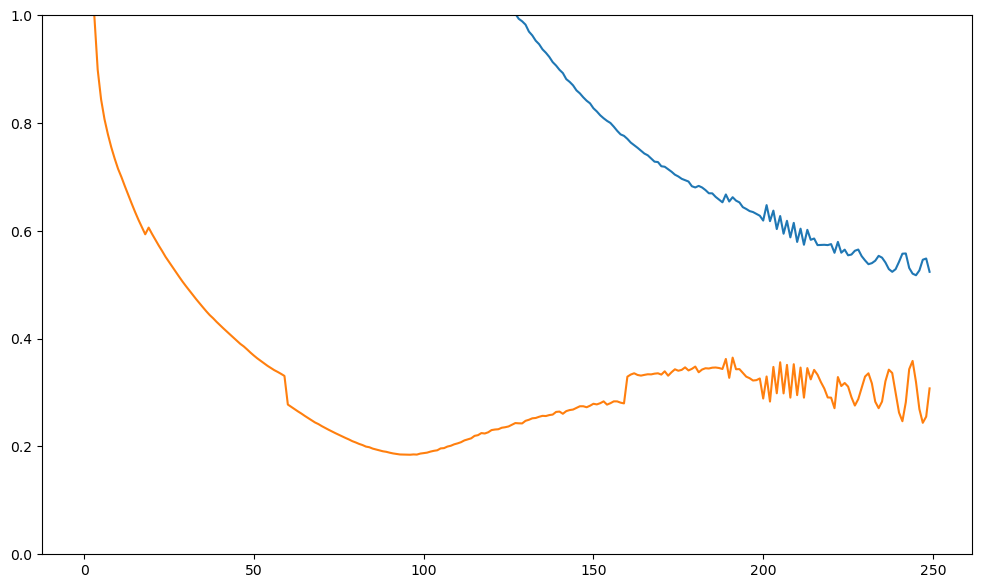

In [414]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

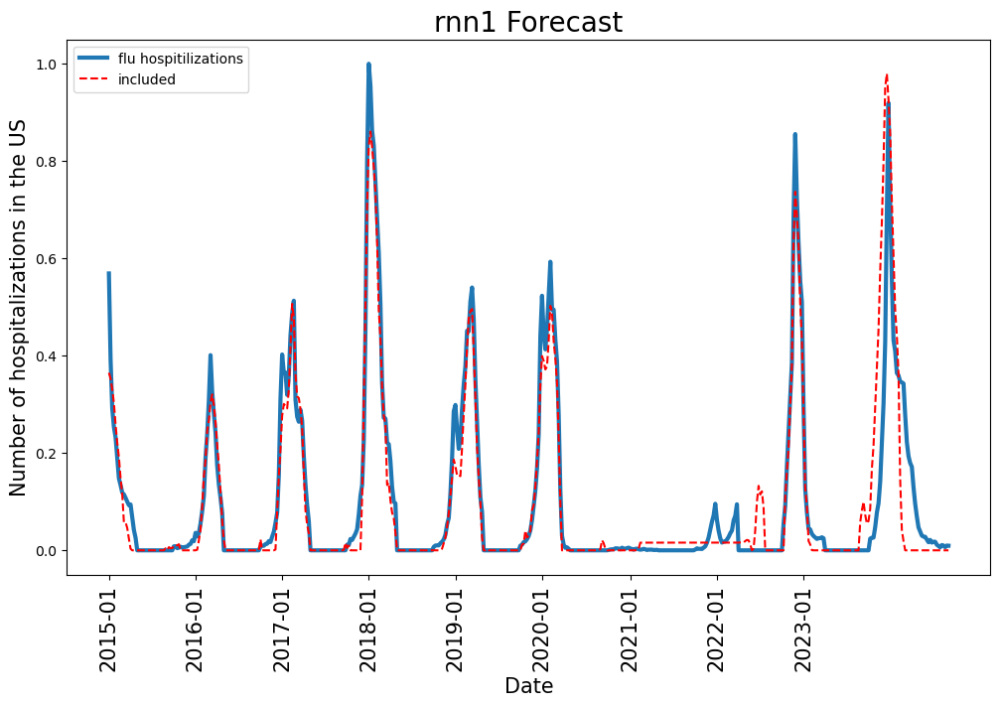

In [415]:
plot_model('2024-36')

## RNN Lin1

In [114]:
class rnn_lin1(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(rnn_lin1, self).__init__()
        
        
        
        self.lstm = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,50),
            nn.Dropout(0.05),
            nn.ReLU(),
            nn.Linear(50,1),
            nn.ReLU()
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

### 22-23

In [236]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn_lin1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 350
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(5)

In [237]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.813852382968946 Val loss: 1.6786294308526384 Time: 0.775211300002411
epoch 1 0 0
Train loss: 14.164768981323277 Val loss: 1.6199545951246797 Time: 0.9409194000036223
epoch 2 0 0
Train loss: 13.254135925898346 Val loss: 1.5546604302747675 Time: 0.7698802999948384
epoch 3 0 0
Train loss: 10.78951249347078 Val loss: 1.2719125996475498 Time: 0.8734604999917792
epoch 4 0 0
Train loss: 7.851920742252297 Val loss: 0.9654108729390942 Time: 0.7556381999893347
epoch 5 0 0
Train loss: 6.775781561042546 Val loss: 0.8557393944102822 Time: 0.8344005000108154
epoch 6 0 0
Train loss: 6.278595597527556 Val loss: 0.8103640122293082 Time: 0.7118664000008721
epoch 7 0 0
Train loss: 6.250140250748686 Val loss: 0.8047412251059419 Time: 0.7292224000120768
epoch 8 0 0
Train loss: 6.241102121485891 Val loss: 0.8032262009911781 Time: 0.7305506999982754
epoch 9 0 0
Train loss: 5.6481481207514355 Val loss: 0.7490863437629586 Time: 0.7255351000057999
epoch 10 0 0
Train loss: 5.6420998456

(0.0, 1.0)

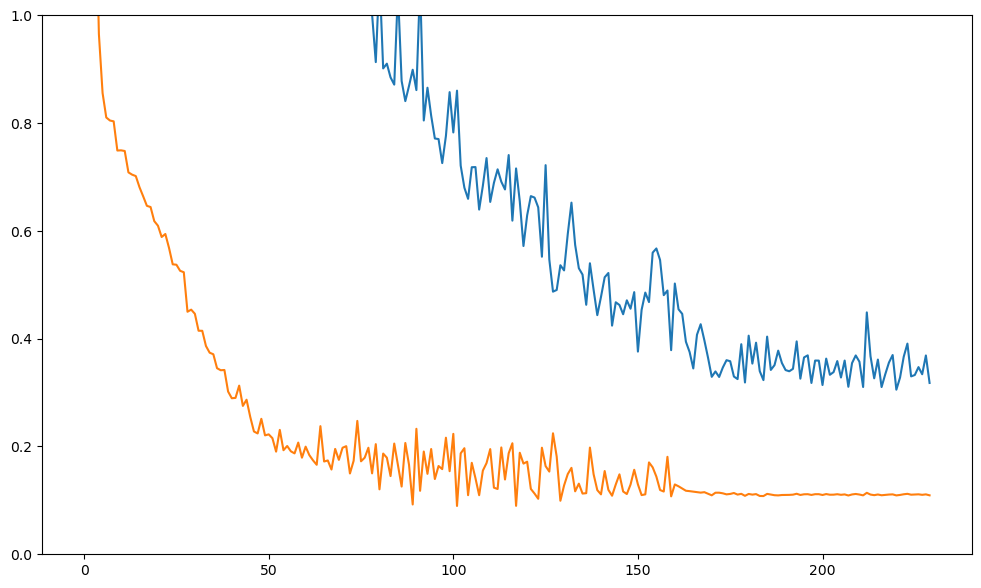

In [238]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

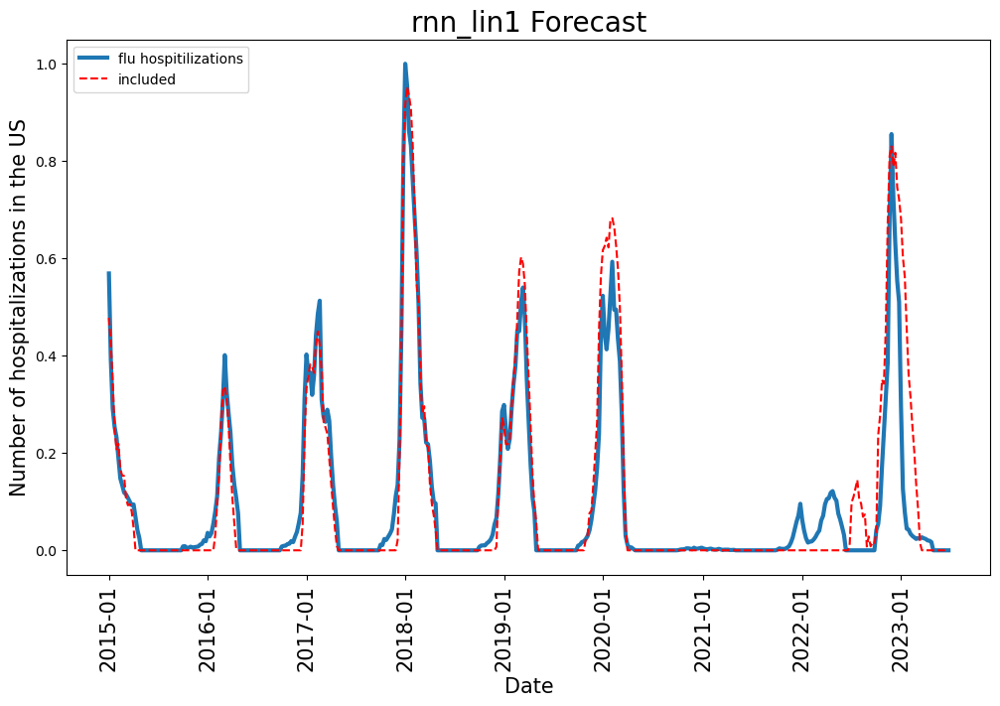

In [239]:
plot_model('2023-26')

### 23-24

In [420]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn_lin1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_23-24.pth'
LOAD_PATH =   'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23_val.pth'
#print(LOAD_PATH)
#model.load_state_dict(torch.load(LOAD_PATH))


loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2023-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [421]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 17.158650442744374 Val loss: 1.9056460706234526 Time: 0.7953784000128508
epoch 1 0 0
Train loss: 16.076517992049574 Val loss: 1.78978495379888 Time: 0.7602748000063002
epoch 2 0 0
Train loss: 13.39482808222316 Val loss: 1.4868875761675815 Time: 0.7065459000004921
epoch 3 0 0
Train loss: 9.126310729019746 Val loss: 1.041220014806696 Time: 0.7140037999779452
epoch 4 0 0
Train loss: 7.637575042590754 Val loss: 0.8810910466184259 Time: 0.6842527999833692
epoch 5 0 0
Train loss: 7.2278271683984485 Val loss: 0.8302255755724341 Time: 0.7233678000047803
epoch 6 0 0
Train loss: 7.045331036102851 Val loss: 0.8066679755888908 Time: 0.7690966000081971
epoch 7 0 0
Train loss: 6.680441689195014 Val loss: 0.765917694515007 Time: 0.8420970999868587
epoch 8 0 0
Train loss: 6.409537647284285 Val loss: 0.7332985029786139 Time: 0.7049852999916766
epoch 9 0 0
Train loss: 6.115835190692771 Val loss: 0.7066894770901516 Time: 0.9993518999835942
epoch 10 0 0
Train loss: 5.82355712271249

(0.0, 1.0)

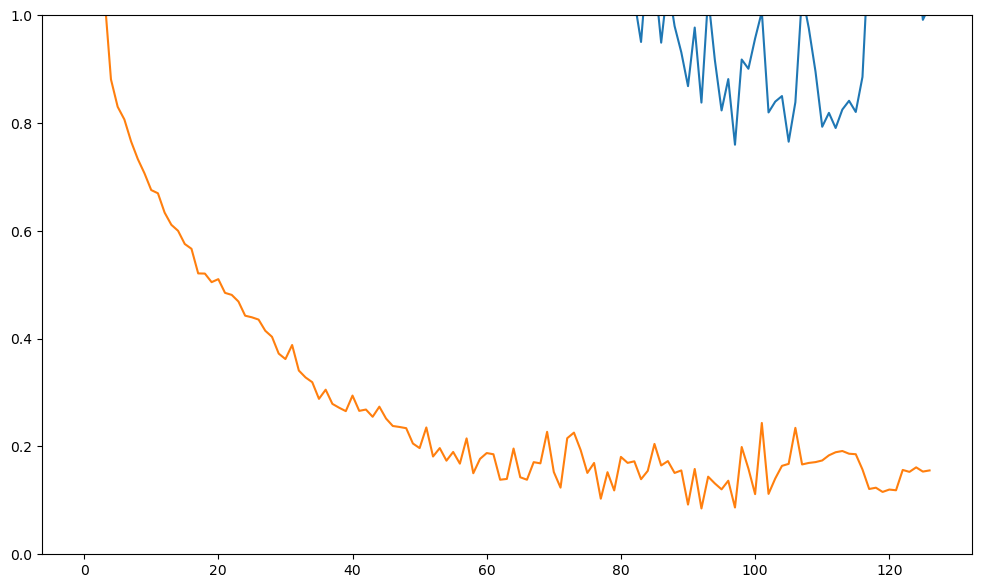

In [422]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

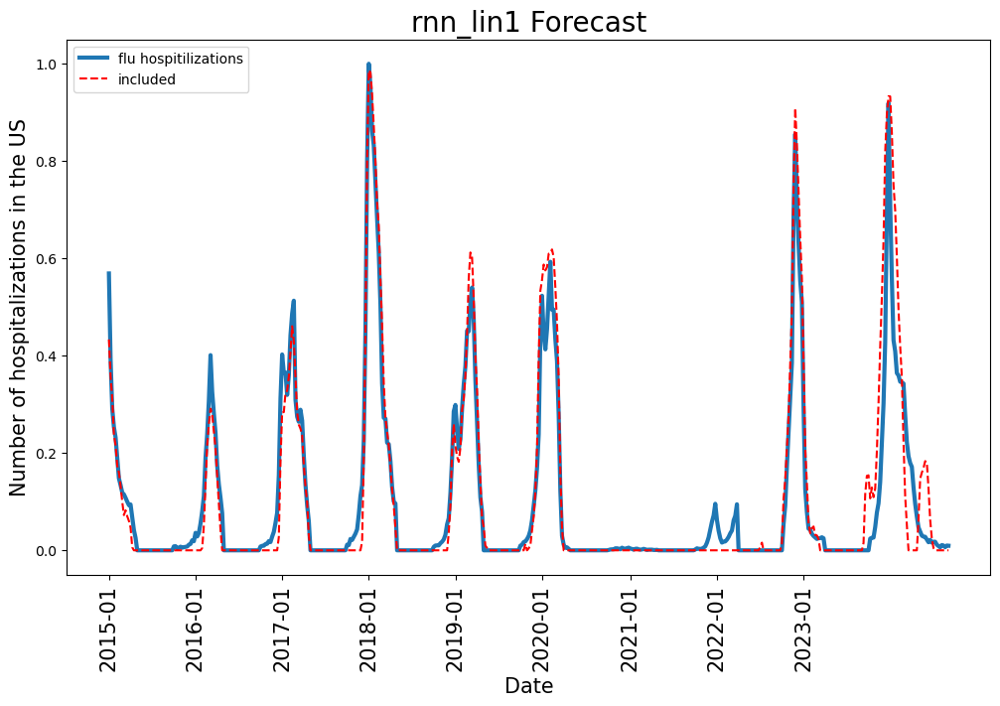

In [423]:
plot_model('2024-36')

## GRU

In [115]:
class gru(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(gru, self).__init__()
        
        
        
        self.gru= nn.GRU(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
            #nn.Dropout(0.05),
            nn.Linear(seq_len*country_len,1),
            nn.ReLU()
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.gru(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.gru(logits)
        
        logits = self.seq(logits)
        
        
        return logits

### 22-23

In [246]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 300
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(5)

In [247]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.662144067642288 Val loss: 2.096923647953184 Time: 0.6309827999939444
epoch 1 0 0
Train loss: 9.035387384875277 Val loss: 1.070261505998972 Time: 0.698080400004983
epoch 2 0 0
Train loss: 6.598462851410943 Val loss: 1.0035622667673014 Time: 0.7533313000021735
epoch 3 0 0
Train loss: 7.8406642902182 Val loss: 0.9434672475416089 Time: 0.6417175999959
epoch 4 0 1
Train loss: 5.823054649389917 Val loss: 0.8206151736835393 Time: 0.7031236999901012
epoch 5 0 0
Train loss: 6.484641001405748 Val loss: 0.8464701340424035 Time: 0.6696801999933086
epoch 6 1 1
Train loss: 5.702556186061061 Val loss: 0.8713842207844886 Time: 0.6152203999954509
epoch 7 2 0
Train loss: 5.4181091699300055 Val loss: 0.8084334685793204 Time: 0.6676136000023689
epoch 8 0 0
Train loss: 4.691499658099332 Val loss: 0.7695116628318867 Time: 0.704687899997225
epoch 9 0 0
Train loss: 4.638204967068339 Val loss: 0.7988935092400107 Time: 0.6122659999964526
epoch 10 1 0
Train loss: 4.402853010818006 Val 

(0.0, 1.0)

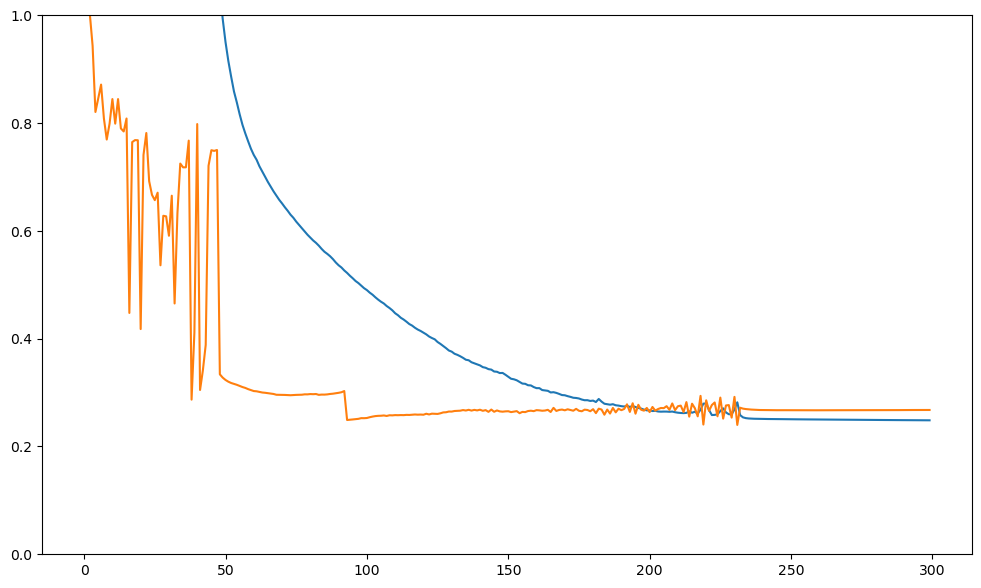

In [248]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

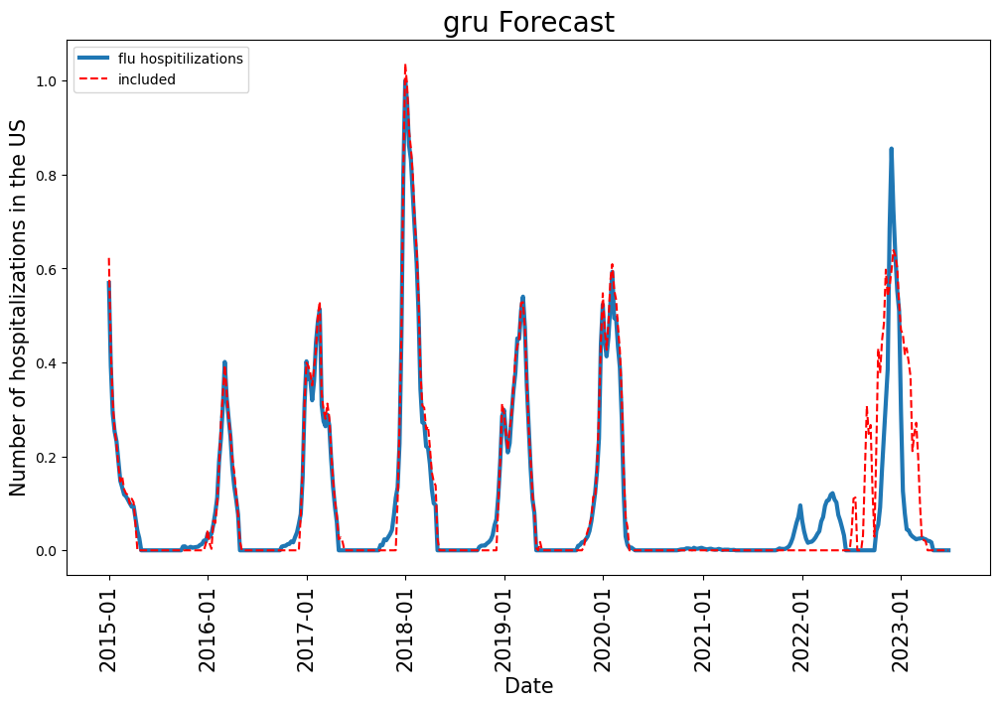

In [249]:
plot_model('2023-26')

### 23-24

In [424]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_23-24.pth'
LOAD_PATH =   'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23_val.pth'
#print(LOAD_PATH)
#model.load_state_dict(torch.load(LOAD_PATH))


loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2023-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [425]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 16.369588148330877 Val loss: 1.850960111228235 Time: 0.6191153000108898
epoch 1 0 0
Train loss: 15.151694955713175 Val loss: 1.7270521764000517 Time: 0.6152852000086568
epoch 2 0 0
Train loss: 13.101666570824051 Val loss: 1.512896296347717 Time: 0.6077682999894023
epoch 3 0 0
Train loss: 10.328535617485372 Val loss: 1.2079510681014871 Time: 0.6014985000074375
epoch 4 0 0
Train loss: 8.480546275119387 Val loss: 0.9956554378735157 Time: 0.5987371999945026
epoch 5 0 0
Train loss: 7.890907659046405 Val loss: 0.9231104376446216 Time: 0.6157777000044007
epoch 6 0 0
Train loss: 7.670027880215919 Val loss: 0.8904955163936544 Time: 0.616259500005981
epoch 7 0 0
Train loss: 7.519416390614651 Val loss: 0.8676936444339519 Time: 0.6181091999751516
epoch 8 0 0
Train loss: 7.399115785605204 Val loss: 0.8502187442797772 Time: 0.625465900026029
epoch 9 0 0
Train loss: 7.291926496183834 Val loss: 0.835297211656627 Time: 0.7593687000044156
epoch 10 0 0
Train loss: 7.18771026983700

(0.0, 1.0)

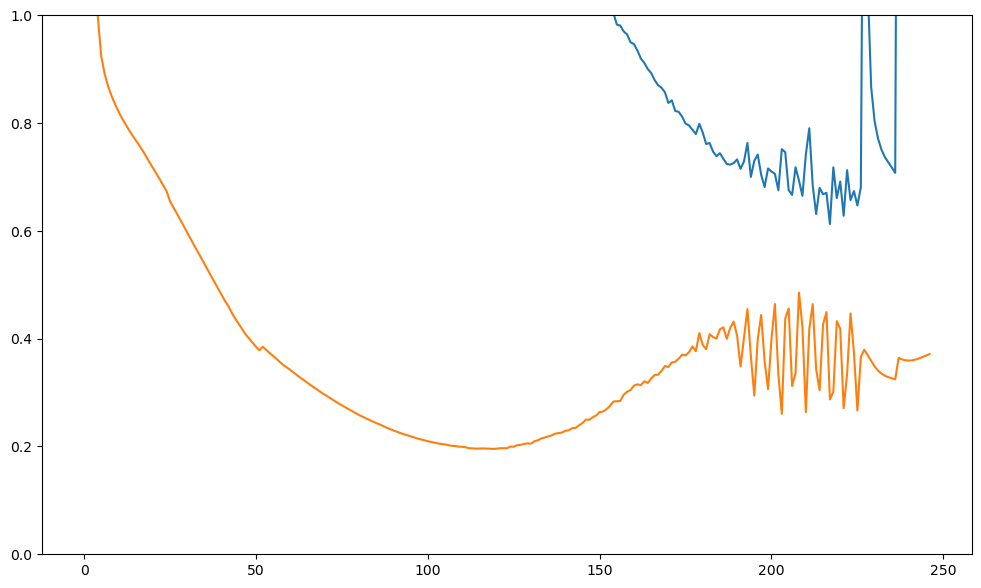

In [426]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

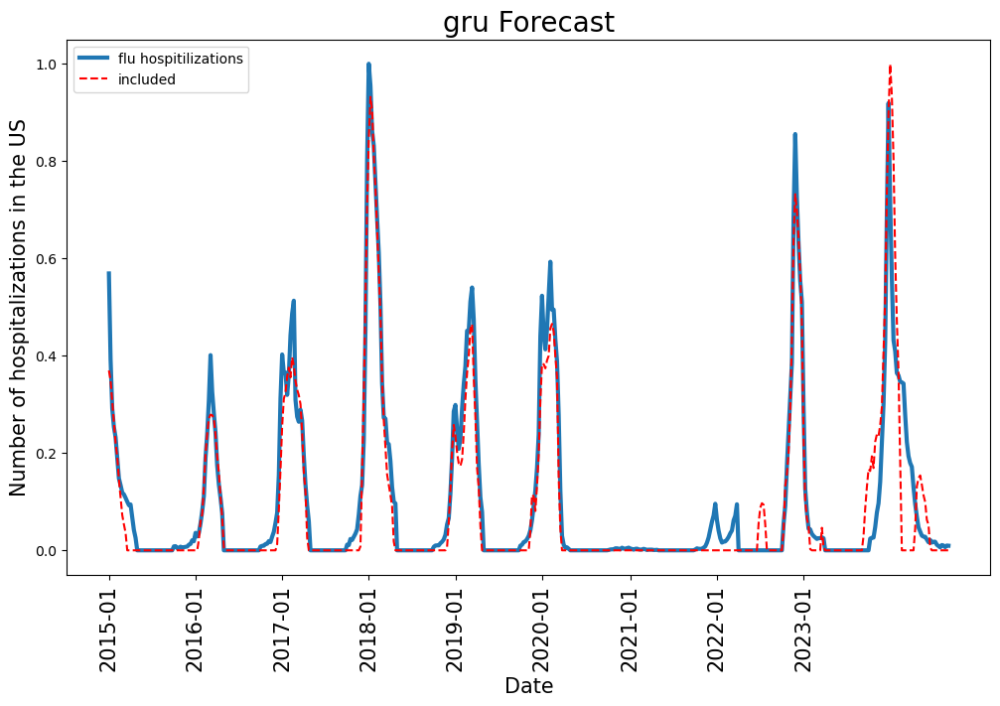

In [427]:
plot_model('2024-36')

## GRU1

In [120]:
class gru1(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(gru1, self).__init__()
        
        
        
        self.rnn = nn.GRU(seq_len,seq_len,num_layers = 1)
        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
            nn.Linear(seq_len*country_len,1),
            nn.ReLU()
        )        
        

 
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.rnn(x.permute(0,2,1))        
        logits = self.seq(logits)
        
        
        return logits

### 22-23

In [251]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(5)

In [252]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 13.799858744774296 Val loss: 1.5460328518442483 Time: 0.4388842000043951
epoch 1 0 0
Train loss: 10.56529965966077 Val loss: 1.235958982230168 Time: 0.40601399999286514
epoch 2 0 0
Train loss: 8.65167840347484 Val loss: 1.0461534137008044 Time: 0.41808920000039507
epoch 3 0 0
Train loss: 7.298132626788435 Val loss: 0.910098543338515 Time: 0.412307000005967
epoch 4 0 0
Train loss: 6.5209181288496145 Val loss: 0.8230838452757817 Time: 0.4166448999894783
epoch 5 0 0
Train loss: 6.1067148269454945 Val loss: 0.772117812446447 Time: 0.40698739999788813
epoch 6 0 0
Train loss: 5.86244692582919 Val loss: 0.7400158291676681 Time: 0.4263645000028191
epoch 7 0 0
Train loss: 5.692408730820624 Val loss: 0.7169743863689656 Time: 0.40847399999620393
epoch 8 0 0
Train loss: 5.5542227230919226 Val loss: 0.6991989179253187 Time: 0.4246752000035485
epoch 9 0 0
Train loss: 5.437729046401582 Val loss: 0.6841846145779721 Time: 0.4070096000068588
epoch 10 0 0
Train loss: 5.33128982807

(0.0, 1.0)

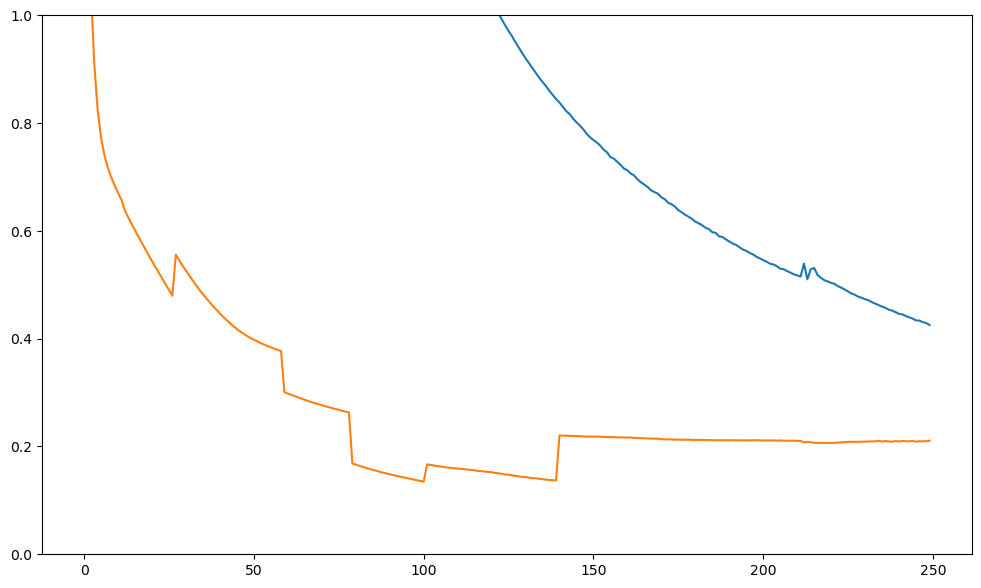

In [253]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

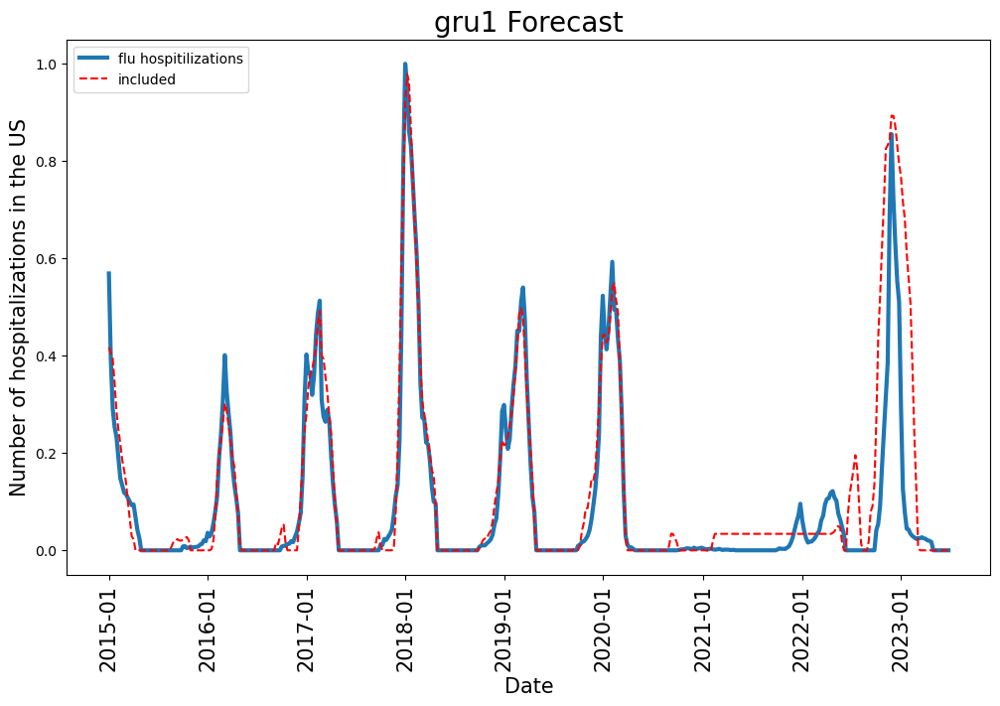

In [254]:
plot_model('2023-26')

### 23-24

In [430]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_23-24.pth'
LOAD_PATH =   'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23_val.pth'
#print(LOAD_PATH)
#model.load_state_dict(torch.load(LOAD_PATH))


loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2023-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [431]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 18.866160876845697 Val loss: 2.047118183430779 Time: 0.4290478999901097
epoch 1 0 0
Train loss: 12.882038473420813 Val loss: 1.4629214154362329 Time: 0.4360889999952633
epoch 2 0 0
Train loss: 10.153905312358342 Val loss: 1.18321249111407 Time: 0.43639210000401363
epoch 3 0 0
Train loss: 8.336863299750405 Val loss: 0.9922417030844857 Time: 0.4017508999968413
epoch 4 0 0
Train loss: 7.370459906879812 Val loss: 0.8853323174900788 Time: 0.40284470000187866
epoch 5 0 0
Train loss: 6.899963511991121 Val loss: 0.8294068958912467 Time: 0.40054060000693426
epoch 6 0 0
Train loss: 6.6298059986492035 Val loss: 0.7955760644846788 Time: 0.3988168000068981
epoch 7 0 0
Train loss: 6.43625772504631 Val loss: 0.7709985278904596 Time: 0.4510576000029687
epoch 8 0 0
Train loss: 6.269746914141503 Val loss: 0.7508997502058776 Time: 0.4282958000258077
epoch 9 0 0
Train loss: 6.119854725751971 Val loss: 0.732829675455786 Time: 0.4772123000002466
epoch 10 0 0
Train loss: 5.98091823565

(0.0, 1.0)

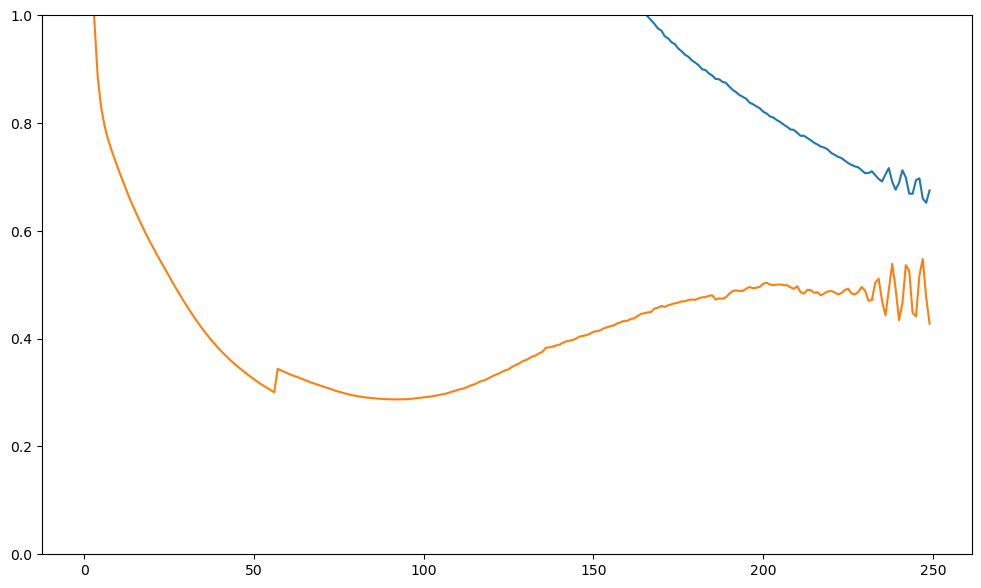

In [432]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

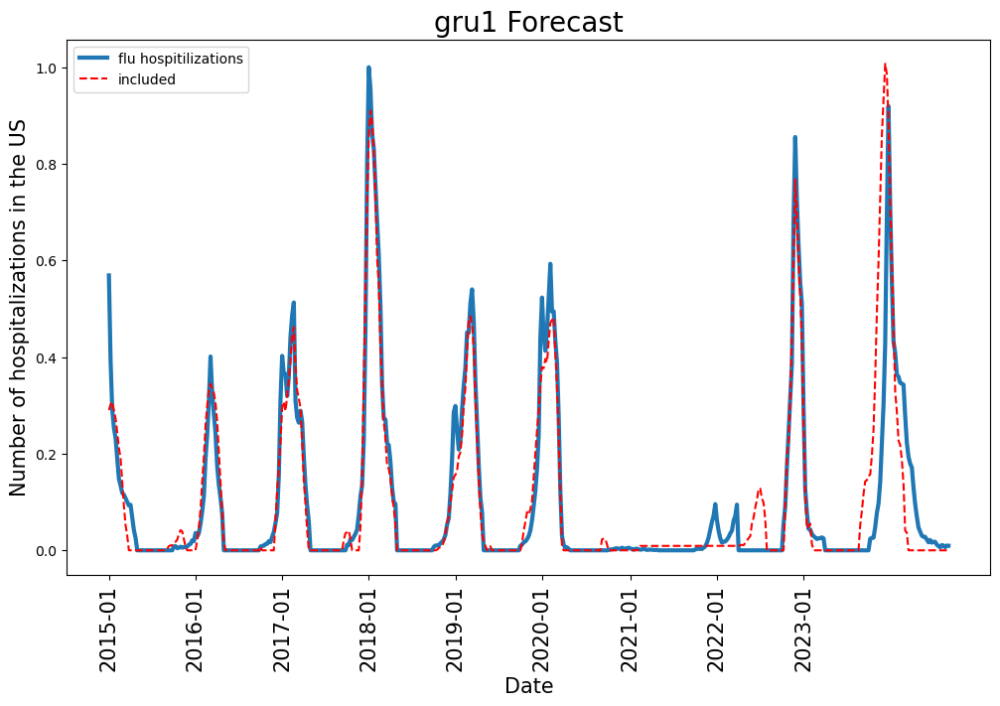

In [433]:
plot_model('2024-36')

## GRU Lin1

In [125]:
class gru_lin1(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(gru_lin1, self).__init__()
        
        
        
        self.lstm = nn.GRU(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,50),
            nn.Dropout(0.01),
            nn.ReLU(),
            nn.Linear(50,1),
            nn.ReLU()
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

### 22-23

In [256]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru_lin1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(5)

In [257]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.444349419037621 Val loss: 1.6389940945230959 Time: 1.191930599990883
epoch 1 0 0
Train loss: 14.196415542251714 Val loss: 1.6120588519253058 Time: 0.8322536000050604
epoch 2 0 0
Train loss: 13.390316405930548 Val loss: 1.5254508757470453 Time: 0.8689499000029173
epoch 3 0 0
Train loss: 10.71196962610605 Val loss: 1.2333948231681073 Time: 0.8423118999926373
epoch 4 0 0
Train loss: 7.64460392778539 Val loss: 0.9110745904124429 Time: 0.8305189999955473
epoch 5 0 0
Train loss: 6.890208340694594 Val loss: 0.8331028343977087 Time: 0.8395160000072792
epoch 6 0 0
Train loss: 6.550787002704936 Val loss: 0.7940889450617601 Time: 0.8350767999945674
epoch 7 0 0
Train loss: 6.357648657997281 Val loss: 0.7718931732569289 Time: 0.8530536000034772
epoch 8 0 0
Train loss: 6.15599887047026 Val loss: 0.7510874233261104 Time: 0.8499059999885503
epoch 9 0 0
Train loss: 5.982127911109046 Val loss: 0.7307629998437682 Time: 0.8385273000021698
epoch 10 0 0
Train loss: 5.7505985519785

(0.0, 1.0)

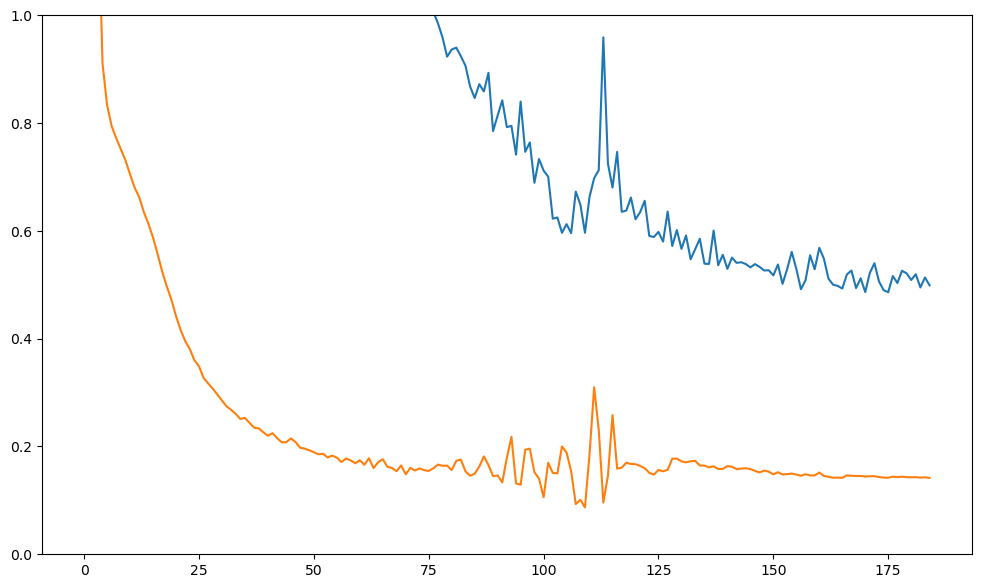

In [258]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

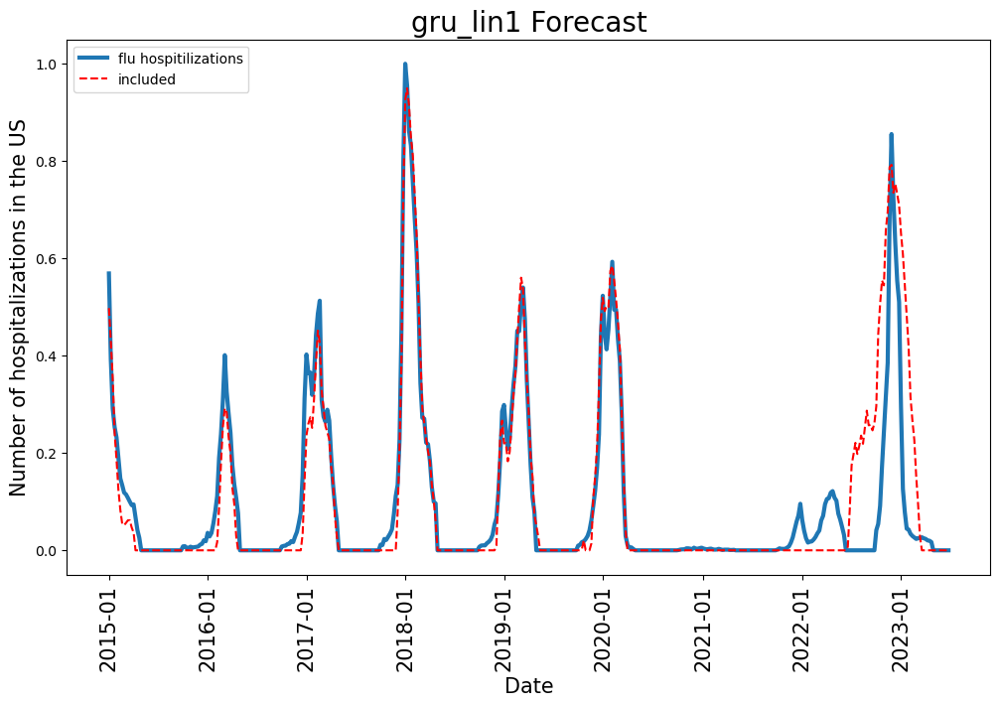

In [259]:
plot_model('2023-26')

### 23-24

In [438]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru_lin1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_23-24.pth'
LOAD_PATH =   'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23_val.pth'
#print(LOAD_PATH)
#model.load_state_dict(torch.load(LOAD_PATH))


loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2023-27')
noise = False
forecast = 30

torch.manual_seed(4)


In [439]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 16.95934212483077 Val loss: 1.8877466275333927 Time: 0.9722820000024512
epoch 1 0 0
Train loss: 16.518313987069824 Val loss: 1.838745642524091 Time: 1.2154262000112794
epoch 2 0 0
Train loss: 14.772777052926983 Val loss: 1.648219379548973 Time: 1.9375609999988228
epoch 3 0 0
Train loss: 10.642549983958308 Val loss: 1.2060556971429603 Time: 2.1663144000049215
epoch 4 0 0
Train loss: 8.193414914998153 Val loss: 0.9500766848451471 Time: 4.214348799985601
epoch 5 0 0
Train loss: 7.7072970387138895 Val loss: 0.8894802425509273 Time: 0.947612800024217
epoch 6 0 0
Train loss: 7.315720221170363 Val loss: 0.8476400690810596 Time: 1.001418800005922
epoch 7 0 0
Train loss: 7.04160965371068 Val loss: 0.8128536769438133 Time: 1.0325463000044692
epoch 8 0 0
Train loss: 6.697536589271721 Val loss: 0.7760290168700155 Time: 0.9729959999967832
epoch 9 0 0
Train loss: 6.507879238622898 Val loss: 0.7579408277368879 Time: 0.9490151999925729
epoch 10 0 0
Train loss: 6.184004516531274

(0.0, 1.0)

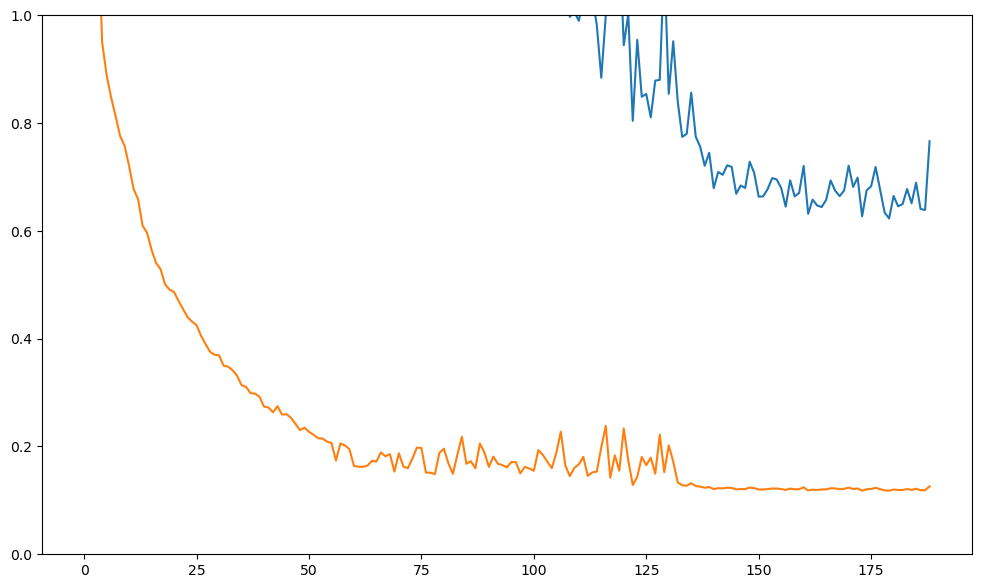

In [440]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1])

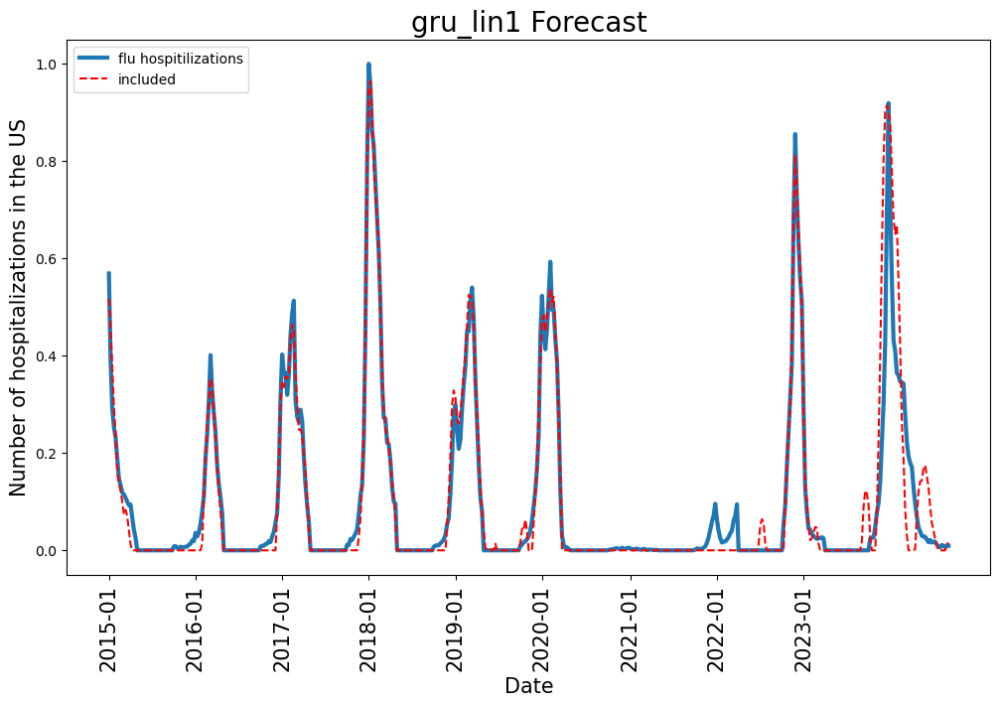

In [441]:
plot_model('2024-36')

# Summary

## 22-23

In [131]:
model_list = [rnn(26,5), rnn_lin1(26,5), gru1(26,5), gru_lin1(26,5), lstm(26,5), lstm1(26,5), lstm_lin1(26,5)]
#model_list = [lstm(26,5), lstm1(26,5), lstm_lin1(26,5)]

In [132]:
max_ = flu_surv['INF_ALL'].max()/0.09

rnn
rnn_lin1
gru1
gru_lin1
lstm
lstm1
lstm_lin1


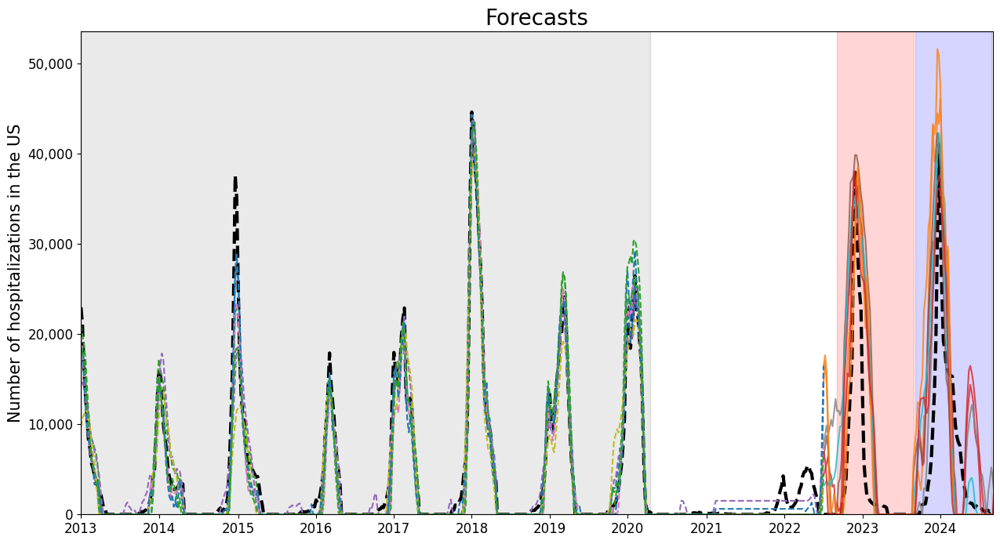

In [202]:
# plot all models
plot_df = pd.DataFrame(data=usa_infall_norm.values,columns = ['INF_ALL'],index=usa_infall_norm.index)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batched_sequence = data_in
fig, ax = plt.subplots(figsize=(15,8))
ax.plot(max_*plot_df["INF_ALL"].loc['2013-01':],linewidth=3,color='black',linestyle='dashed')
for model in model_list:
    model = model.to(device)
    print(model.__class__.__name__)

    MODEL_PATH = 'models/'+model.__class__.__name__+'_new_22-23_val.pth'
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

    
    plot_df[model.__class__.__name__] = pred

    #plt.rcParams['figure.figsize'] = (25, 12)

    
    #plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
    ax.plot(max_*plot_df[model.__class__.__name__].loc['2013-01':'2022-27'],linestyle="dashed")#,label=model.__class__.__name__+'(included)')
    ax.plot(max_*plot_df[model.__class__.__name__].loc['2022-27':],alpha=0.8,label=model.__class__.__name__)#label=model.__class__.__name__+'(prediction)',linewidth=1)
    #plt.legend(loc='upper left')
    x_ticks=['2013-01','2014-01','2015-01','2016-01','2017-01','2018-01','2019-01','2020-01','2021-01','2022-01','2023-01','2024-01']
    labels = ['2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023','2024']

    plt.xlim(['2013-01','2024-36'])

    ax.axvspan('2013-01', '2020-16', color='gray', alpha=0.025)
    ax.axvspan('2022-36', '2023-35', color='red', alpha=0.025)
    ax.axvspan('2023-36', '2024-35', color='blue', alpha=0.025)
    ax.set_ylim([0,1.2*max_])
    ax.set_xticks(ticks = x_ticks,labels=labels,size=12)

    #ax.set_yticks(size=12)
    ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.tick_params(axis='y', labelsize=12)
    ax.set_title('Forecasts',size =20)
    ax.set_ylabel('Number of hospitalizations in the US',fontsize=15)
    #plt.xlabel('Date',size=15)

rnn
rnn_lin1
gru1
gru_lin1
lstm
lstm1
lstm_lin1


Text(0, 0.5, 'Number of hospitalizations in the US')

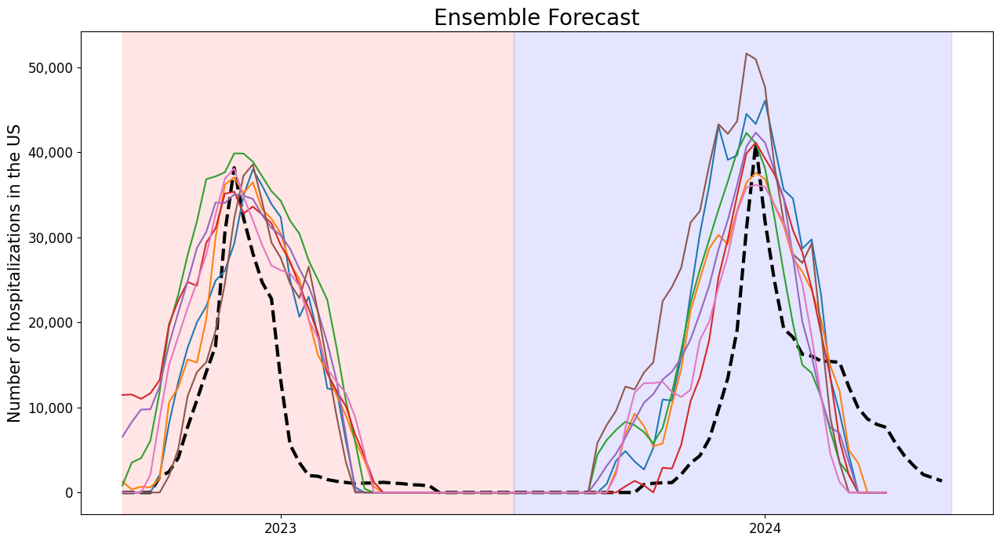

In [228]:
# plot all models
plot_df = pd.DataFrame(data=usa_infall_norm.values,columns = ['INF_ALL'],index=usa_infall_norm.index)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batched_sequence = data_in
start_date = '2022-36'
end_date = '2024-14'
fig, ax = plt.subplots(figsize=(15,8))
plt.plot(max_*plot_df["INF_ALL"].loc[start_date:'2024-20'],linewidth=3,color='black',linestyle='dashed')
for model in model_list:
   #model = model.to(device)
    print(model.__class__.__name__)

    MODEL_PATH = 'models/'+model.__class__.__name__+'_new_22-23_val.pth'
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

    
    plot_df[model.__class__.__name__] = pred


    ax.plot(max_*plot_df[model.__class__.__name__].loc[start_date:end_date],label=model.__class__.__name__)

#ax.legend(loc='upper left',title='Models')
x_ticks=['2023-01','2023-26','2024-01']

ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
ax.tick_params(axis='y', labelsize=12)
ax.axvspan('2022-36', '2023-26', color='red', alpha=0.1)
ax.axvspan('2023-26', '2024-35', color='blue', alpha=0.1)
ax.set_xticks(ticks = ['2023-01','2024-01'],labels = ['2023','2024'],rotation=0,fontsize=12)
ax.set_title('Ensemble Forecast',size =20)
ax.set_ylabel('Number of hospitalizations in the US',fontsize=15)


In [333]:
plot_df.loc['2022-14':'2022-40']= np.zeros(shape=(len(plot_df.loc['2022-14':'2022-40'] ),8))
plot_df.loc['2023-14':'2023-40']= np.zeros(shape=(len(plot_df.loc['2023-14':'2023-40'] ),8))
#plot_df = plot_df.drop('INF_ALL',axis=1)

Text(0.5, 0, 'Date')

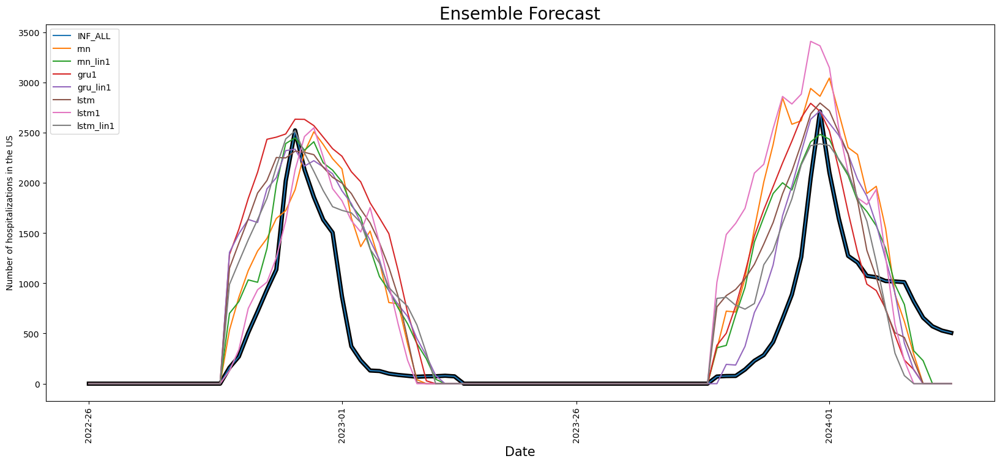

In [334]:
# plot all models

start_date = '2022-26'
end_date = '2024-14'
plt.plot(max_*plot_df["INF_ALL"].loc[start_date:end_date],linewidth=5,color='black')
for col in plot_df.columns:
   

    plt.rcParams['figure.figsize'] = (20, 8)
    plt.plot(max_*plot_df[col].loc[start_date:end_date],label=col)
    
plt.legend(loc='upper left')
x_ticks=['2022-26','2023-01','2023-26','2024-01']
plt.xticks(ticks = x_ticks,rotation=90)
plt.title('Ensemble Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US')
plt.xlabel('Date',size=15)

In [203]:
def make_lorenzian_params(window1,window2,pred_df):

    maxs, maxs_loc, half_width_list, width_list = [],[],[],[]
    for col in list(pred_df.columns):

        max_ = pred_df[col].loc[window1:window2].max()
        id_max_ = pred_df[col].loc[window1:window2].idxmax()

        maxs.append(max_)
        maxs_loc.append(id_max_)

        half_max = 0.5 * max_

        for id in list(pred_df.loc[window1:id_max_].index):
            
            if pred_df[col].loc[id] > half_max:

                id_half = id
                break

        for id in list(pred_df.loc[id_max_:window2].index):
            
            if pred_df[col].loc[id] < half_max:

                id_sec_half = id
                break

        half_width = len(pred_df.loc[id_half:id_max_])
        width = len(pred_df.loc[id_half:id_sec_half])
        half_width_list.append(half_width)
        width_list.append(width)

    curve_params = pd.DataFrame(data=zip(maxs,maxs_loc,half_width_list,width_list),columns = ['max','max_loc','half_width','width'],index=list(pred_df.columns))
    return curve_params

In [42]:
def lorentzian(max_,gamma,x0,x):
    func_ = (1/np.pi) * (0.5*gamma) / ( (x-x0)**2 + (0.5*gamma)**2)
    weight = max_ * np.pi * gamma/2
    func_*=weight
    return func_ 

In [205]:
def make_lorenzian_df(pred_df,window1,window2,curve_params,two_bool):

    max_val = curve_params['max'].mean()
    curve_params['max_loc_adj'] = curve_params['max_loc'].apply(lambda x: int(x.split('-')[1]) if int(x.split('-')[1]) > 10 else int(x.split('-')[1])+52)

    loc = curve_params['max_loc_adj'].mean()
    loc_std = curve_params['max_loc_adj'].std()

    # assuming models get the width wrong by a factor of 2

    #gamma = 9.8
    gamma = curve_params['half_width'].mean()

    if two_bool == True:

        gamma*=2


    # pred_df hard coded in here is bad practice but whatever

    index_tmp = list(pred_df.loc[window1:window2].index)

    lor = lorentzian(max_val,gamma,loc,np.arange(int(window1.split('-')[1]),int(window1.split('-')[1])+len(index_tmp),1))

    return pd.DataFrame(data = lor,columns = ['smooth'],index=index_tmp)

In [206]:
pred_df = plot_df.copy()

In [207]:
window1, window2 = '2022-30','2023-17'
curve_params = make_lorenzian_params(window1,window2,pred_df)
curve_params = curve_params.drop(['INF_ALL'],axis=0)
lor_223 = make_lorenzian_df(pred_df,window1,window2,curve_params,False)

window1, window2 = '2023-30','2024-17'
curve_params = make_lorenzian_params(window1,window2,pred_df)
curve_params = curve_params.drop(['INF_ALL'],axis=0)
lor_234 = make_lorenzian_df(pred_df,window1,window2,curve_params,False)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, 0, 'Date')

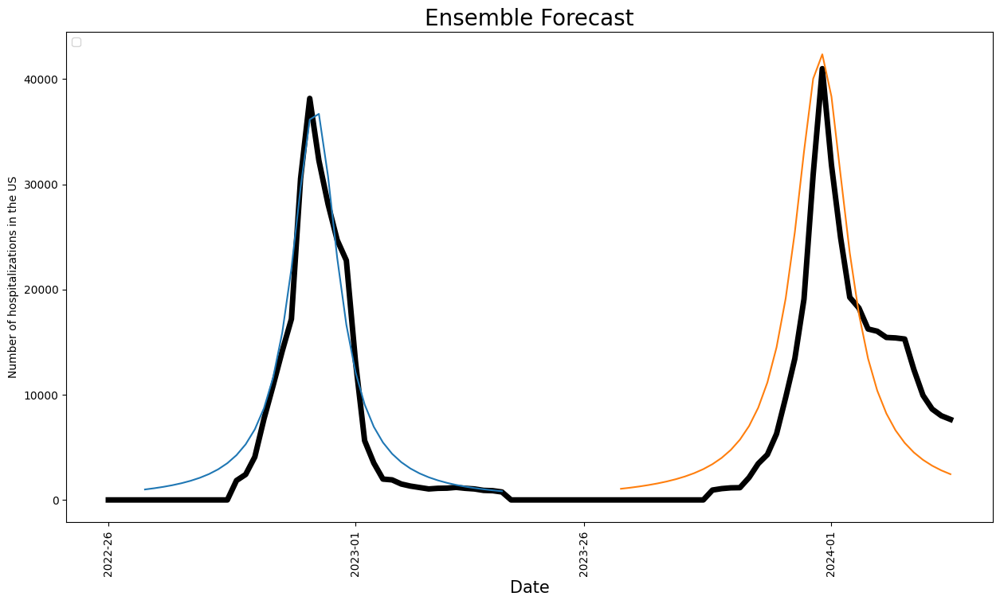

In [208]:
# plot all models

start_date = '2022-26'
end_date = '2024-14'
plt.plot(max_*plot_df["INF_ALL"].loc[start_date:end_date],linewidth=5,color='black')
plt.rcParams['figure.figsize'] = (20, 8)

plt.plot(max_*lor_223.loc[start_date:end_date])#,label=col)
plt.plot(max_*lor_234.loc[start_date:end_date])#,label=col)

    
plt.legend(loc='upper left')
x_ticks=['2022-26','2023-01','2023-26','2024-01']
plt.xticks(ticks = x_ticks,rotation=90)
plt.title('Ensemble Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US')
plt.xlabel('Date',size=15)

In [209]:
def make_many_lorenzian_df(pred_df,window1,window2,curve_params,two_bool):

    max_val = curve_params['max'].mean()
    max_val_std = curve_params['max'].std()
    loc = curve_params['max_loc_adj'].mean()
    loc_std = curve_params['max_loc_adj'].std()
    gamma = curve_params['half_width'].mean()
    gamma_std = curve_params['half_width'].std()

    if two_bool == True:

        gamma*=2
    
    index_tmp = list(pred_df.loc[window1:window2].index)
    output_df = pd.DataFrame(index=index_tmp)
    for i in range(100):
        max_r = np.random.normal(max_val,max_val_std)
        loc_r = np.random.normal(loc,loc_std)
        gamma_r = np.random.normal(gamma,gamma_std)
        lor = lorentzian(max_r,gamma_r,loc_r,np.arange(int(window1.split('-')[1]),int(window1.split('-')[1])+len(index_tmp),1))
        output_df[i] = lor
    mean_ = output_df.T.mean().T
    std_ = output_df.T.std().T
    output_df = pd.DataFrame(data = mean_,columns = ['Mean'],index=index_tmp)
    output_df['plus'] = output_df['Mean'] + std_
    output_df['minus'] = output_df['Mean'] - std_
    return output_df

In [210]:
window1, window2 = '2022-30','2023-17'
curve_params = make_lorenzian_params(window1,window2,pred_df)
curve_params = curve_params.drop(['INF_ALL'],axis=0)
lor_223 = make_lorenzian_df(pred_df,window1,window2,curve_params,False)
lor_err_223 = make_many_lorenzian_df(pred_df,window1,window2,curve_params,False)

window1, window2 = '2023-30','2024-17'
curve_params = make_lorenzian_params(window1,window2,pred_df)
curve_params = curve_params.drop(['INF_ALL'],axis=0)
lor_234 = make_lorenzian_df(pred_df,window1,window2,curve_params,False)
lor_err_234 = make_many_lorenzian_df(pred_df,window1,window2,curve_params,False)

In [211]:
max_*lor_err_234['minus'].loc[start_date:end_date]

2023-30      706.355722
2023-31      774.245258
2023-32      852.323373
2023-33      942.714580
2023-34     1048.120997
2023-35     1172.019061
2023-36     1318.937863
2023-37     1494.859497
2023-38     1707.805245
2023-39     1968.710471
2023-40     2292.757468
2023-41     2701.450329
2023-42     3225.917008
2023-43     3912.275765
2023-44     4830.500673
2023-45     6089.122357
2023-46     7858.910443
2023-47    10406.643600
2023-48    14122.796943
2023-49    19451.823939
2023-50    26426.159091
2023-51    33417.723997
2023-52    36038.170604
2024-01    31433.265490
2024-02    23902.663840
2024-03    17426.061782
2024-04    12730.201206
2024-05     9473.332319
2024-06     7220.748311
2024-07     5639.012767
2024-08     4503.162333
2024-09     3667.670932
2024-10     3038.804754
2024-11     2555.404034
2024-12     2176.757823
2024-13     1875.161374
2024-14     1631.342827
Name: minus, dtype: float64

(0.0, 55000.0)

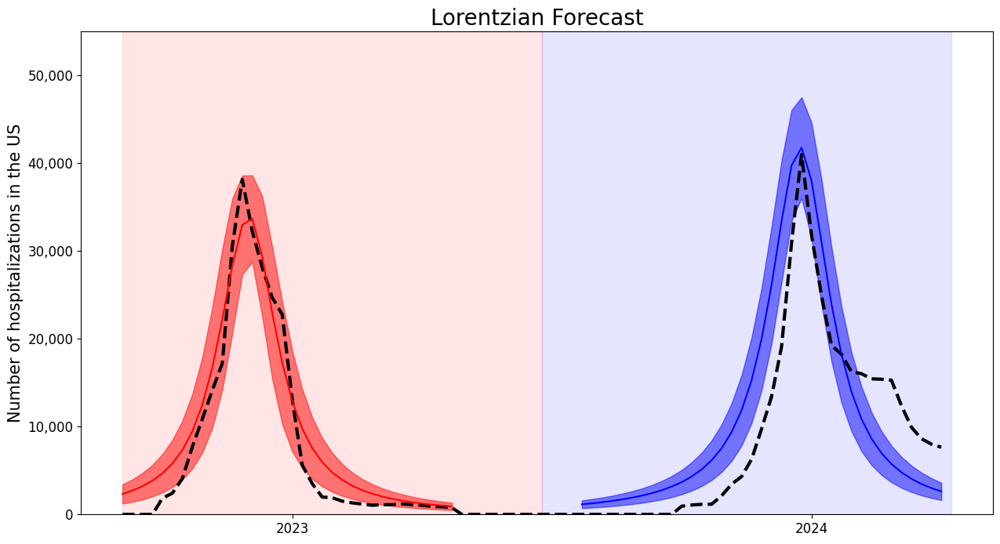

In [249]:
# plot all models

start_date = '2022-36'
end_date = '2024-14'
fig, ax = plt.subplots(figsize=(15,8))
ax.plot(max_*plot_df["INF_ALL"].loc[start_date:end_date],linewidth=3,color='black',linestyle='dashed')

#plt.plot(max_*lor_223.loc[start_date:end_date])
ax.plot(max_*lor_err_234['Mean'].loc[start_date:end_date],color='blue')
ax.plot(max_*lor_err_223['Mean'].loc[start_date:end_date],color='red')

ax.fill_between(lor_err_223.loc[start_date:end_date].index,max_*lor_err_223['minus'].loc[start_date:end_date],max_*lor_err_223['plus'].loc[start_date:end_date],color='red',alpha=0.5)

ax.fill_between(lor_err_234.loc[start_date:end_date].index,max_*lor_err_234['minus'].loc[start_date:end_date],max_*lor_err_234['plus'].loc[start_date:end_date],color='blue',alpha=0.5)

    
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
ax.tick_params(axis='y', labelsize=12)
ax.axvspan('2022-36', '2023-26', color='red', alpha=0.1)
ax.axvspan('2023-26', '2024-35', color='blue', alpha=0.1)
ax.set_xticks(ticks = ['2023-01','2024-01'],labels = ['2023','2024'],rotation=0,fontsize=12)
ax.set_title('Lorentzian Forecast',size =20)
ax.set_ylabel('Number of hospitalizations in the US',fontsize=15)
ax.set_ylim([0,55000])

In [371]:
start_date = '2023-40'
end_date = '2024-17'
model_season_est = max_*lor_err_234['Mean'].loc[start_date:end_date].sum()
season_est = max_*plot_df["INF_ALL"].loc[start_date:end_date].sum()
height = max_*lor_err_234['Mean'].loc[start_date:end_date].max()
height_act = max_*plot_df["INF_ALL"].loc[start_date:end_date].max()
print(model_season_est,season_est)
print((model_season_est - season_est)/season_est)

model_plus_season_est = max_*lor_err_234['plus'].loc[start_date:end_date].sum()
print(model_plus_season_est,season_est)
print((model_plus_season_est - season_est)/season_est)

model_minus_season_est = max_*lor_err_234['minus'].loc[start_date:end_date].sum()
height_min = max_*lor_err_234['minus'].loc[start_date:end_date].max()

print(model_minus_season_est,season_est)
print((model_minus_season_est - season_est)/season_est)

406007.1196111178 367160.4855855306
0.10580287245136528
510141.31749207474 367160.4855855306
0.389423256368465
301872.9217301606 367160.4855855306
-0.17781751146573518


In [378]:
(lor_err_234['plus'].loc[start_date:end_date]-lor_err_234['Mean'].loc[start_date:end_date])/lor_err_234['Mean'].loc[start_date:end_date]

2023-40    0.376823
2023-41    0.374179
2023-42    0.370710
2023-43    0.366060
2023-44    0.359682
2023-45    0.350732
2023-46    0.337919
2023-47    0.319356
2023-48    0.292592
2023-49    0.255384
2023-50    0.208227
2023-51    0.159207
2023-52    0.137426
2024-01    0.173510
2024-02    0.230027
2024-03    0.272629
2024-04    0.301455
2024-05    0.321928
2024-06    0.336904
2024-07    0.347950
2024-08    0.356156
2024-09    0.362319
2024-10    0.367013
2024-11    0.370643
2024-12    0.373492
2024-13    0.375762
2024-14    0.377596
2024-15    0.379096
2024-16    0.380337
2024-17    0.381374
dtype: float64

In [374]:
lor_err_234.loc[start_date:end_date].sum()

Mean      9.101031
plus     11.435297
minus     6.766765
dtype: float64

In [375]:
(9.1-11.4)/9.1

-0.25274725274725285

In [284]:
curve_params

,max,max_loc,half_width,width,max_loc_adj
rnn,1.032246,2024-02,9,16,54
rnn_lin1,0.842130,2024-01,8,16,53
gru1,0.947032,2023-52,7,12,52
gru_lin1,0.921756,2024-01,5,12,53
lstm,0.948085,2024-01,6,11,53
lstm1,1.156373,2023-52,8,16,52
lstm_lin1,0.810102,2024-01,6,13,53


In [283]:
curve_params['max'].mean(),curve_params['max'].std()

(0.9511036, 0.11644975)

In [277]:
model_season_est - model_minus_season_est

104134.19788095722

In [279]:
height_act, height

(40995.631453063754, 41779.806656313296)

In [281]:
(height - height_min)/height

0.1374261039459885

In [267]:
totals, ind_ = [], []
for year in range(2012,2024):
    totals.append(max_*plot_df["INF_ALL"].loc[str(year)+'-40':str(year+1)+'-17'].sum())
    ind_.append(str(year)+'-'+str(year+1))
totals_df = pd.DataFrame(data = totals, index=ind_,columns=['Totals'])

([<matplotlib.axis.XTick at 0x13accfb20>,
 [Text(0, 0, '2012-2013'),
  Text(1, 0, '2013-2014'),
  Text(2, 0, '2014-2015'),
  Text(3, 0, '2015-2016'),
  Text(4, 0, '2016-2017'),
  Text(5, 0, '2017-2018'),
  Text(6, 0, '2018-2019'),
  Text(7, 0, '2019-2020'),
  Text(8, 0, '2020-2021'),
  Text(9, 0, '2021-2022'),
  Text(10, 0, '2022-2023'),
  Text(11, 0, '2023-2024')])

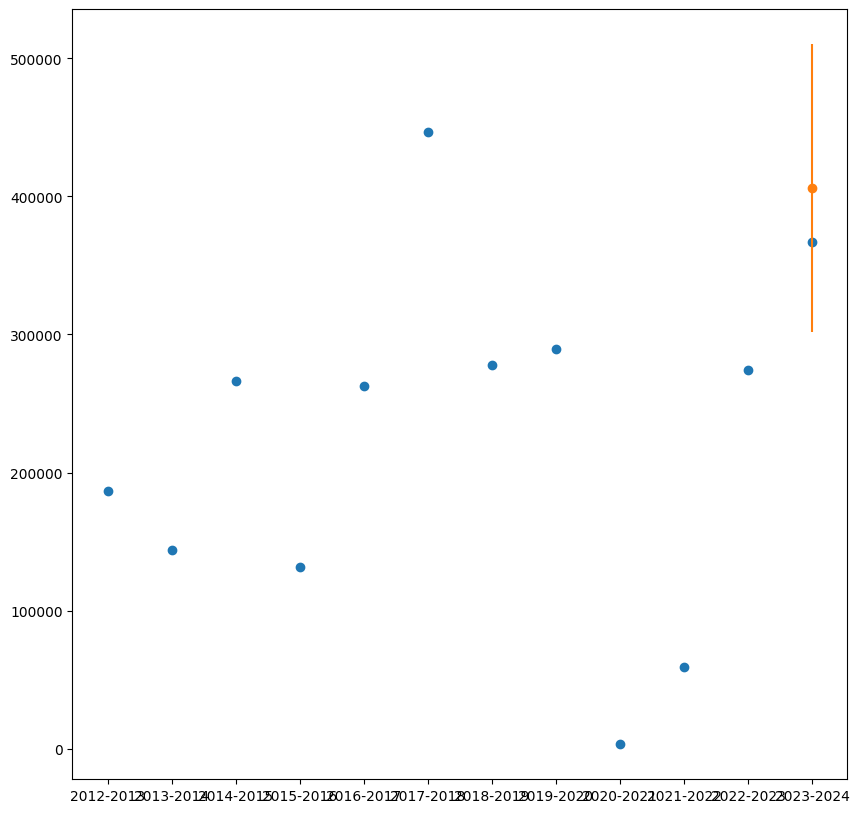

In [276]:
plt.figure(figsize=(10,10))
plt.plot(totals_df['Totals'].values,linewidth=0,marker='o')
plt.errorbar(x=11,y=model_season_est,yerr=model_plus_season_est-model_season_est,marker='o')
plt.xticks(ticks = range(len(totals_df)),labels=totals_df.index)

In [261]:
(model_plus_season_est - model_season_est)/model_season_est

0.25648367442595305

## 23-24

In [213]:
index_old = list(usa_infall_norm.index)
index_old[-1]

'2025-07'

In [214]:
index_new = []
start_date = index_old[-1]

yr = int(start_date[:4])
day = int(start_date[-2:])
for i in range(21):
    if day == 52:
        day = 1
        yr +=1
    else:
        day+=1
    if day < 10:
        day_str = '0'+str(day)
    else:
        day_str = str(day)
    new_date = str(yr)+'-'+day_str
    index_new.append(new_date)
index_new = index_old[21:] + index_new

In [215]:
model_names = []
for model in model_list:
    model_names.append(model.__class__.__name__)

In [216]:
batched_sequence =  Dataset_(df["INF_ALL"],df.drop(['INF_ALL','season'],axis=1),26,26)

(788,)


In [217]:
predictions = []
for i in range(len(model_list)):

    model = model_list[i].to(device)
    MODEL_PATH ='models/'+model.__class__.__name__+'_new_22-23_val.pth'

    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)
    print(pred.shape)
    predictions.append(pred[:,0])

#so_cos = list(df_norm.columns)
#for i in range(len(so_cos)):
#    predictions.append(df_norm[so_cos[i]].shift(-21).to_numpy())
predictions = np.array(predictions)

pred_new_df = pd.DataFrame(data=predictions.T, columns = model_names,index = index_new)
#pred_new_df = pred_df.join(df_norm,on=pred_df.index)

(788, 1)
(788, 1)
(788, 1)
(788, 1)
(788, 1)
(788, 1)
(788, 1)


<AxesSubplot:>

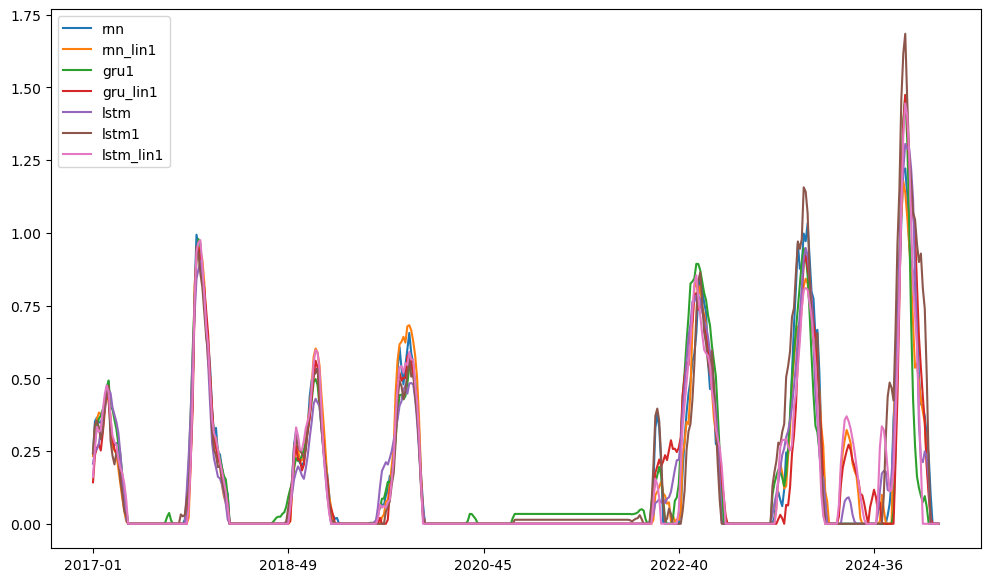

In [457]:
pred_new_df.loc['2017-01':].plot(kind='line')

rnn
rnn_lin1
gru1
gru_lin1
lstm
lstm1
lstm_lin1


Text(0, 0.5, 'Number of hospitalizations in the US')

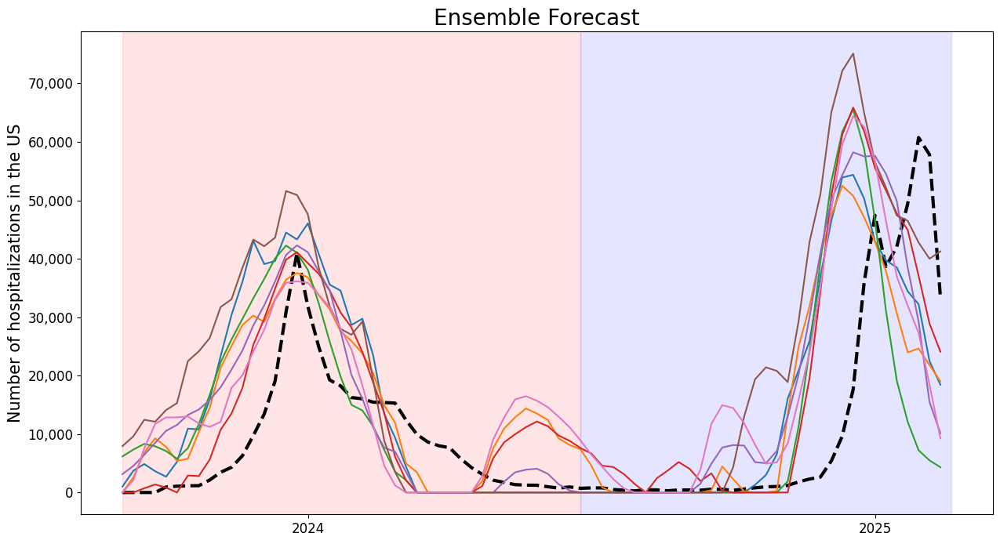

In [285]:
# plot all models
plot_df = pd.DataFrame(data=usa_infall_norm.values,columns = ['INF_ALL'],index=usa_infall_norm.index)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batched_sequence = data_in
start_date = '2023-36'
end_date = '2025-14'
fig, ax = plt.subplots(figsize=(15,8))
plt.plot(max_*plot_df["INF_ALL"].loc[start_date:end_date],linewidth=3,color='black',linestyle='dashed')
for model in model_list:
   #model = model.to(device)
    print(model.__class__.__name__)

    MODEL_PATH = 'models/'+model.__class__.__name__+'_new_22-23_val.pth'
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

    
    plot_df[model.__class__.__name__] = pred


    ax.plot(max_*plot_df[model.__class__.__name__].loc[start_date:end_date],label=model.__class__.__name__)

#ax.legend(loc='upper left',title='Models')

ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
ax.tick_params(axis='y', labelsize=12)
ax.axvspan('2023-36', '2024-26', color='red', alpha=0.1)
ax.axvspan('2024-26', '2025-35', color='blue', alpha=0.1)
ax.set_xticks(ticks = ['2024-01','2025-01'],labels = ['2024','2025'],rotation=0,fontsize=12)
ax.set_title('Ensemble Forecast',size =20)
ax.set_ylabel('Number of hospitalizations in the US',fontsize=15)

In [244]:
window1, window2 = '2024-30','2025-17'
curve_params = make_lorenzian_params(window1,window2,pred_new_df)
lor_245 = make_lorenzian_df(pred_new_df,window1,window2,curve_params,False)
lor_err_245 = make_many_lorenzian_df(pred_new_df,window1,window2,curve_params,False)


window1, window2 = '2023-30','2024-17'
curve_params = make_lorenzian_params(window1,window2,pred_new_df)
lor_234_val = make_lorenzian_df(pred_new_df,window1,window2,curve_params,False)
lor_err_234_val = make_many_lorenzian_df(pred_new_df,window1,window2,curve_params,False)

(0.0, 75000.0)

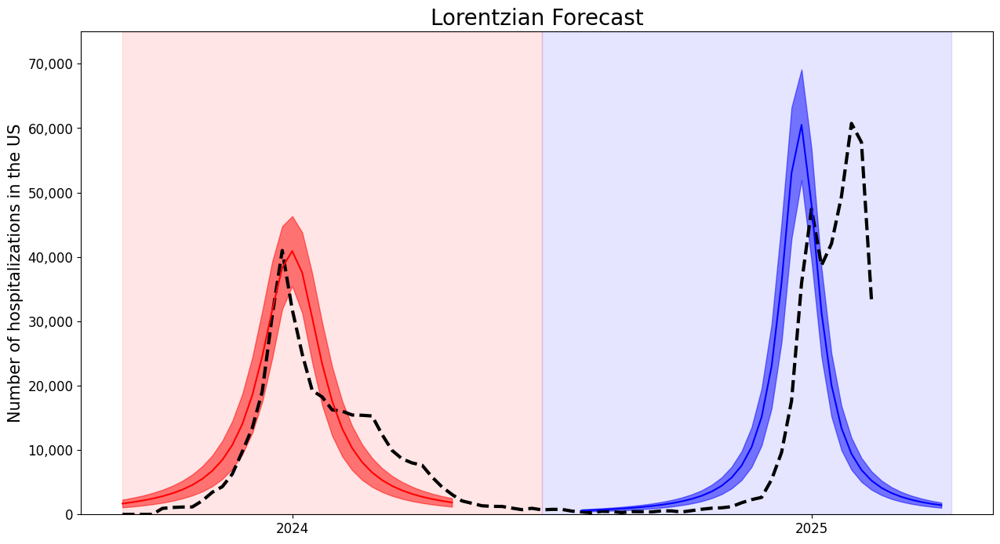

In [245]:
# plot all models

start_date = '2023-36'
end_date = '2025-14'
fig, ax = plt.subplots(figsize=(15,8))
ax.plot(max_*plot_df["INF_ALL"].loc[start_date:end_date],linewidth=3,color='black',linestyle='dashed')

#plt.plot(max_*lor_223.loc[start_date:end_date])
ax.plot(max_*lor_err_245['Mean'].loc[start_date:end_date],color='blue')
ax.plot(max_*lor_err_234_val['Mean'].loc[start_date:end_date],color='red')

ax.fill_between(lor_err_245.loc[start_date:end_date].index,max_*lor_err_245['minus'].loc[start_date:end_date],max_*lor_err_245['plus'].loc[start_date:end_date],color='blue',alpha=0.5)

ax.fill_between(lor_err_234_val.loc[start_date:end_date].index,max_*lor_err_234_val['minus'].loc[start_date:end_date],max_*lor_err_234_val['plus'].loc[start_date:end_date],color='red',alpha=0.5)

    
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
ax.tick_params(axis='y', labelsize=12)
ax.axvspan('2023-36', '2024-26', color='red', alpha=0.1)
ax.axvspan('2024-26', '2025-35', color='blue', alpha=0.1)
ax.set_xticks(ticks = ['2024-01','2025-01'],labels = ['2024','2025'],rotation=0,fontsize=12)
ax.set_title('Lorentzian Forecast',size =20)
ax.set_ylabel('Number of hospitalizations in the US',fontsize=15)
ax.set_ylim([0,75000])

In [287]:
start_date = '2024-40'
end_date = '2025-17'
model_season_est = max_*lor_err_245['Mean'].loc[start_date:end_date].sum()
season_est = max_*plot_df["INF_ALL"].loc[start_date:end_date].sum()
height = max_*lor_err_245['Mean'].loc[start_date:end_date].max()
height_act = max_*plot_df["INF_ALL"].loc[start_date:end_date].max()
print(model_season_est,season_est)
print((model_season_est - season_est)/season_est)

model_plus_season_est = max_*lor_err_245['plus'].loc[start_date:end_date].sum()
print(model_plus_season_est,season_est)
print((model_plus_season_est - season_est)/season_est)

model_minus_season_est = max_*lor_err_245['minus'].loc[start_date:end_date].sum()
height_min = max_*lor_err_245['minus'].loc[start_date:end_date].max()

print(model_minus_season_est,season_est)
print((model_minus_season_est - season_est)/season_est)

382143.0101610379 409789.960331387
-0.06746614814084682
468025.76618605567 409789.960331387
0.1421113533566679
296260.2541360199 409789.960331387
-0.27704364963836214


In [292]:
model_plus_season_est - model_season_est

85882.75602501776

In [289]:
height, height_act

(60513.72988766742, 60737.07163333893)

In [290]:
(height-height_min)/height

0.14221175657049046

In [291]:
(height-height_min)

8605.763823957372

Text(0, 0.5, 'Number of hospitalizations in the US')

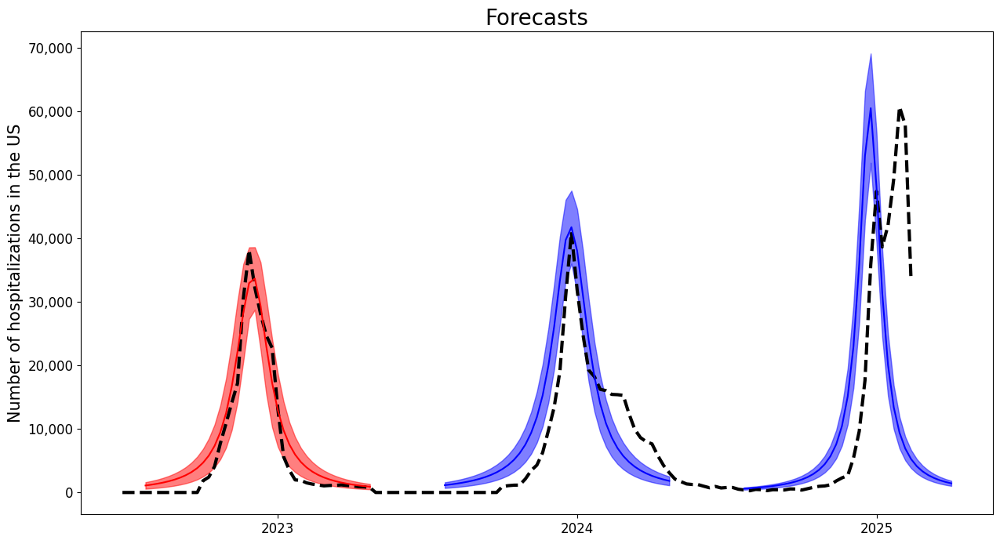

In [247]:
# plot all models
fig, ax = plt.subplots(figsize=(15,8))
start_date = '2022-26'
end_date = '2025-14'
ax.plot(max_*plot_df["INF_ALL"].loc[start_date:end_date],linewidth=3,linestyle='dashed',color='black')
#plt.rcParams['figure.figsize'] = (20, 8)

#plt.plot(max_*lor_223.loc[start_date:end_date])
ax.plot(max_*lor_err_234['Mean'].loc[start_date:end_date],color='blue')
ax.plot(max_*lor_err_245['Mean'].loc[start_date:end_date],color='blue')
ax.plot(max_*lor_err_223['Mean'].loc[start_date:end_date],color='red')

ax.fill_between(lor_err_245.loc[start_date:end_date].index,max_*lor_err_245['minus'].loc[start_date:end_date],max_*lor_err_245['plus'].loc[start_date:end_date],color='blue',alpha=0.5)

ax.fill_between(lor_err_234.loc[start_date:end_date].index,max_*lor_err_234['minus'].loc[start_date:end_date],max_*lor_err_234['plus'].loc[start_date:end_date],color='blue',alpha=0.5)

ax.fill_between(lor_err_223.loc[start_date:end_date].index,max_*lor_err_223['minus'].loc[start_date:end_date],max_*lor_err_223['plus'].loc[start_date:end_date],color='red',alpha=0.5)


ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
ax.tick_params(axis='y', labelsize=12)
#plt.legend(loc='upper left')
x_ticks=['2023-01','2024-01','2025-01']
labels = ['2023','2024','2025']
ax.set_xticks(ticks = x_ticks,labels=labels,size=12)
ax.set_title('Forecasts',size =20)
ax.set_ylabel('Number of hospitalizations in the US',fontsize=15)

Text(0, 0.5, 'Number of hospitalizations in the US')

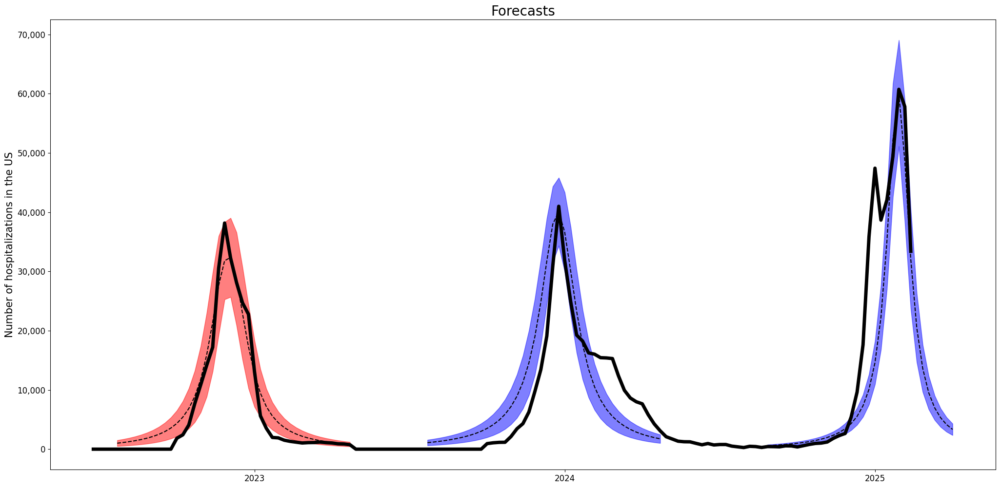

In [149]:
# plot all models
fig, ax = plt.subplots(figsize=(25,12))
start_date = '2022-26'
end_date = '2025-14'
ax.plot(max_*plot_df["INF_ALL"].loc[start_date:end_date],linewidth=5,color='black')
#plt.rcParams['figure.figsize'] = (20, 8)

#plt.plot(max_*lor_223.loc[start_date:end_date])
ax.plot(max_*lor_err_234['Mean'].loc[start_date:end_date],linestyle='dashed',color='black')
ax.plot(max_*lor_err_245['Mean'].loc[start_date:end_date].shift(5),linestyle='dashed',color='black')
ax.plot(max_*lor_err_223['Mean'].loc[start_date:end_date],linestyle='dashed',color='black')

ax.fill_between(lor_err_245.loc[start_date:end_date].shift(5).index,max_*lor_err_245['minus'].loc[start_date:end_date].shift(5),max_*lor_err_245['plus'].loc[start_date:end_date].shift(5),color='blue',alpha=0.5)

ax.fill_between(lor_err_234.loc[start_date:end_date].index,max_*lor_err_234['minus'].loc[start_date:end_date],max_*lor_err_234['plus'].loc[start_date:end_date],color='blue',alpha=0.5)

ax.fill_between(lor_err_223.loc[start_date:end_date].index,max_*lor_err_223['minus'].loc[start_date:end_date],max_*lor_err_223['plus'].loc[start_date:end_date],color='red',alpha=0.5)


ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
ax.tick_params(axis='y', labelsize=12)
#plt.legend(loc='upper left')
x_ticks=['2023-01','2024-01','2025-01']
labels = ['2023','2024','2025']
ax.set_xticks(ticks = x_ticks,labels=labels,size=12)
ax.set_title('Forecasts',size =20)
ax.set_ylabel('Number of hospitalizations in the US',fontsize=15)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, 0, 'Date')

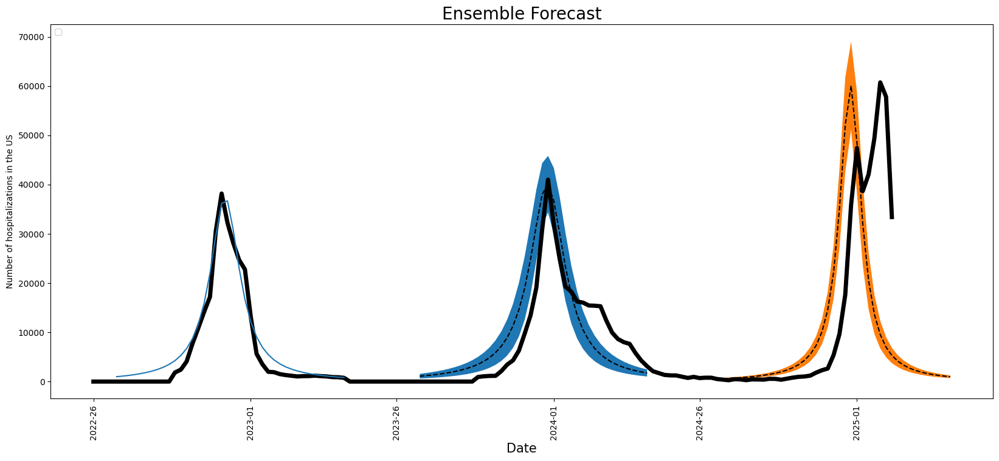

In [151]:
# plot all models

start_date = '2022-26'
end_date = '2025-37'
plt.plot(max_*plot_df["INF_ALL"].loc[start_date:end_date],linewidth=5,color='black')
plt.rcParams['figure.figsize'] = (20, 8)

plt.plot(max_*lor_223.loc[start_date:end_date])
plt.plot(max_*lor_err_234['Mean'].loc[start_date:end_date],linestyle='dashed',color='black')
plt.fill_between(lor_err_234.loc[start_date:end_date].index,max_*lor_err_234['minus'].loc[start_date:end_date],max_*lor_err_234['plus'].loc[start_date:end_date])

plt.plot(max_*lor_err_245['Mean'].loc[start_date:end_date],linestyle='dashed',color='black')
plt.fill_between(lor_err_245.loc[start_date:end_date].index,max_*lor_err_245['minus'].loc[start_date:end_date],max_*lor_err_245['plus'].loc[start_date:end_date])

    
plt.legend(loc='upper left')
x_ticks=['2022-26','2023-01','2023-26','2024-01','2024-26','2025-01']
plt.xticks(ticks = x_ticks,rotation=90)
plt.title('Ensemble Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US')
plt.xlabel('Date',size=15)

# Double Peak Fits

In [293]:
from scipy.optimize import minimize

In [294]:
class DoublePeak():
    
    def __init__(self,x0):

        self.x0 = x0

    def name(self):

        return 'Two_Lorentzians'

    def func_(self,x,t_range):

       
        func = lorentzian(x[0],x[1],x[2],t_range)
        func+= lorentzian(x[3],x[4],x[5],t_range)

        return func
    def constraint(self,x):
        return x[0]
    def constraint1(self,x):
        return x[3]

    def mse_(self,targ,t_range):

        out =  lambda x: np.dot(self.func_(x,t_range) - targ ,(self.func_(x,t_range) - targ))
        return out

    
    def fit(self,target,t_range):
        
       
        res = minimize(self.mse_(target,t_range),self.x0,tol=1e-6,constraints =[{'type':'ineq','fun':self.constraint},{'type':'ineq','fun':self.constraint1}])

        return res.x, res.success,res.fun

In [310]:
param_list, errs = [], []

In [311]:
from sklearn.metrics import mean_absolute_error

## 12-13

True
[ 0.47201872  3.97917411 17.88741209  0.15572539  7.753937   22.02414347]


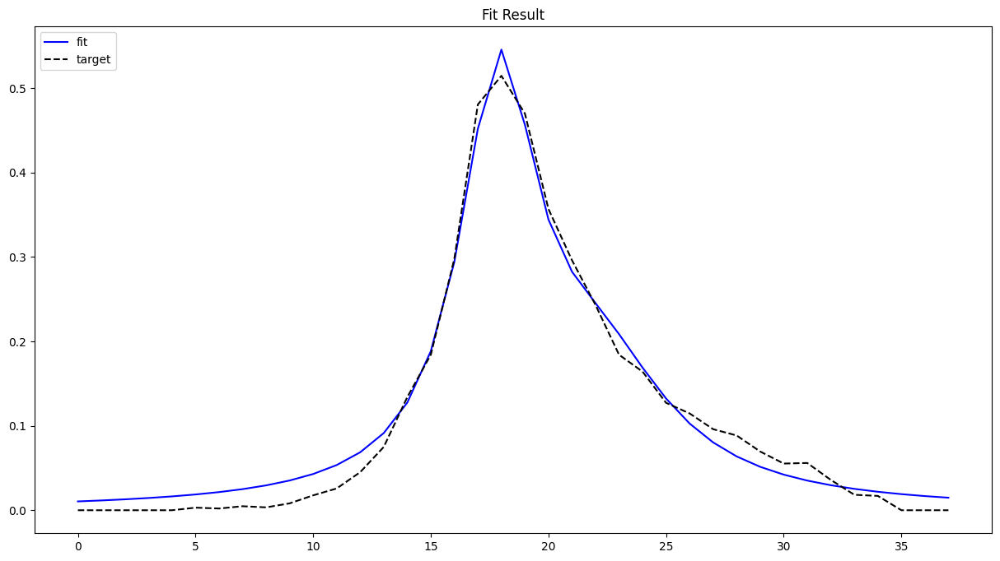

In [312]:
target = df['2012-35':'2013-20']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.71484701,  8.5286789 , 18.06796202, 0.8, 10, 30]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)

model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

In [313]:
param_list.append(params); errs.append(abserr)

## 13-14

True
[ 0.36166845  5.5526251  18.78100925  0.05245081  8.77127258 30.58775815]


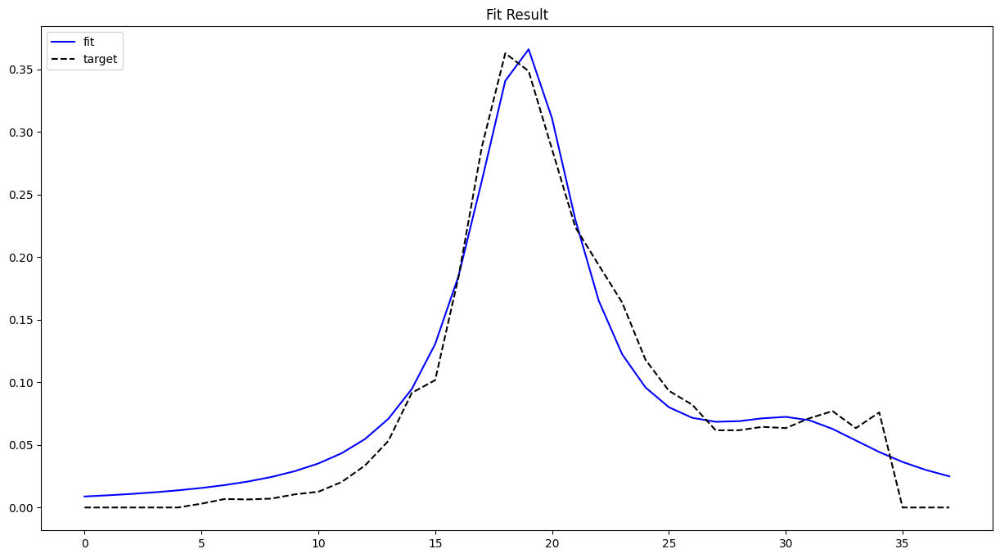

In [314]:
target = df['2013-35':'2014-20']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.71484701,  8.5286789 , 18.06796202, 0.8, 10, 30]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)

model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

In [315]:
param_list.append(params); errs.append(abserr)

## 14-15

True
[ 0.82889968  3.57666704 17.43122283  0.1486177   9.44255702 23.49961625]


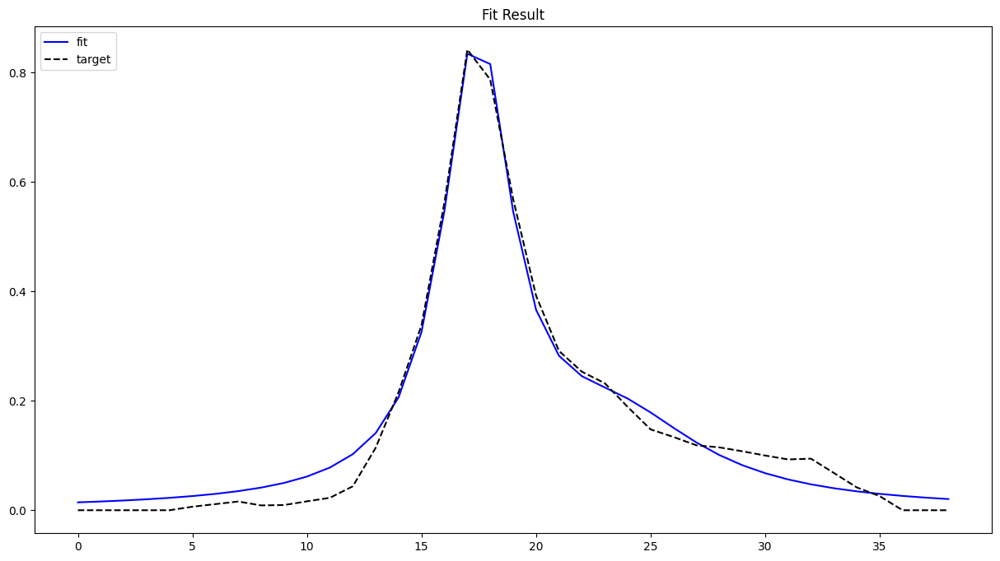

In [316]:
target = df['2014-35':'2015-20']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.71484701,  8.5286789 , 18.06796202, 0.8, 10, 30]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)

model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

In [317]:
param_list.append(params); errs.append(abserr)

## 15-16

True
[-8.73979290e-19  7.18367295e+00  1.77577324e+01  3.79123407e-01
  6.00381978e+00  2.73718659e+01]


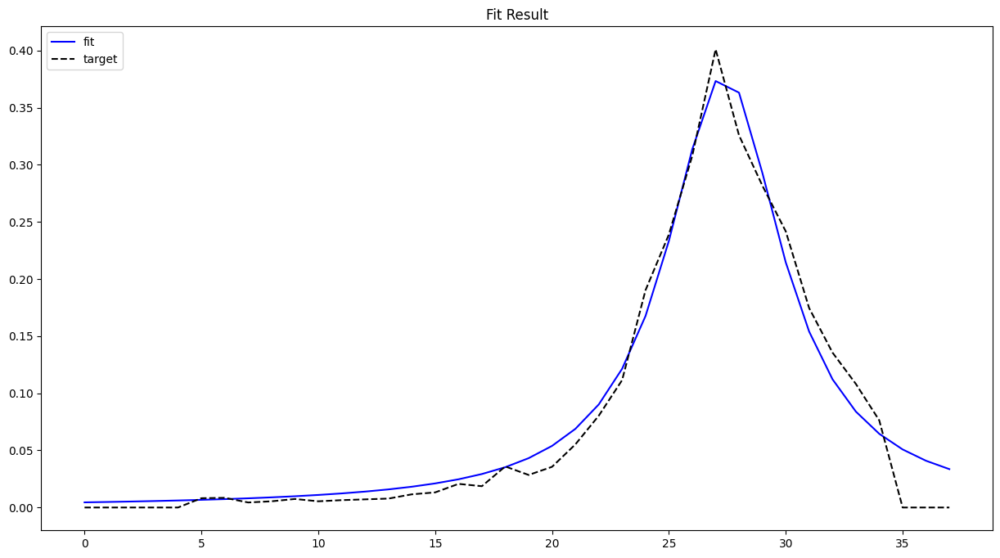

In [318]:
target = df['2015-35':'2016-20']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.71484701,  8.5286789 , 18.06796202, 0.8, 10, 30]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)

model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

In [319]:
param_list.append(params); errs.append(abserr)

## 16-17

True
[ 0.28160436  2.68765546 18.16914209  0.45830925  8.31938878 24.37765469]


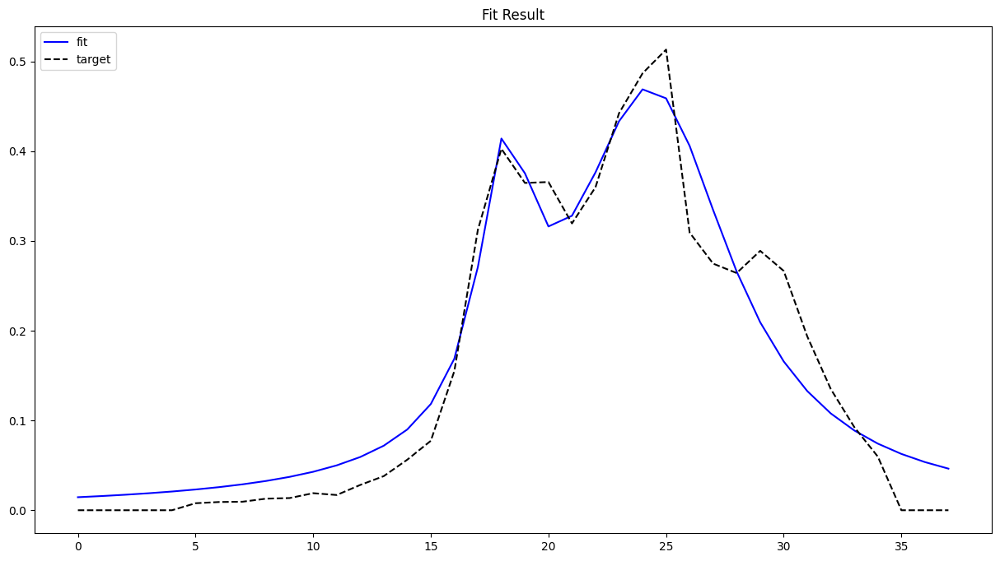

In [320]:
target = df['2016-35':'2017-20']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.71484701,  8.5286789 , 18.06796202, 0.8, 10, 30]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)

model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

In [321]:
param_list.append(params); errs.append(abserr)

## 17-18

True
[ 0.75904084  3.22554693 18.15313124  0.67434833  7.37857018 22.32920113]


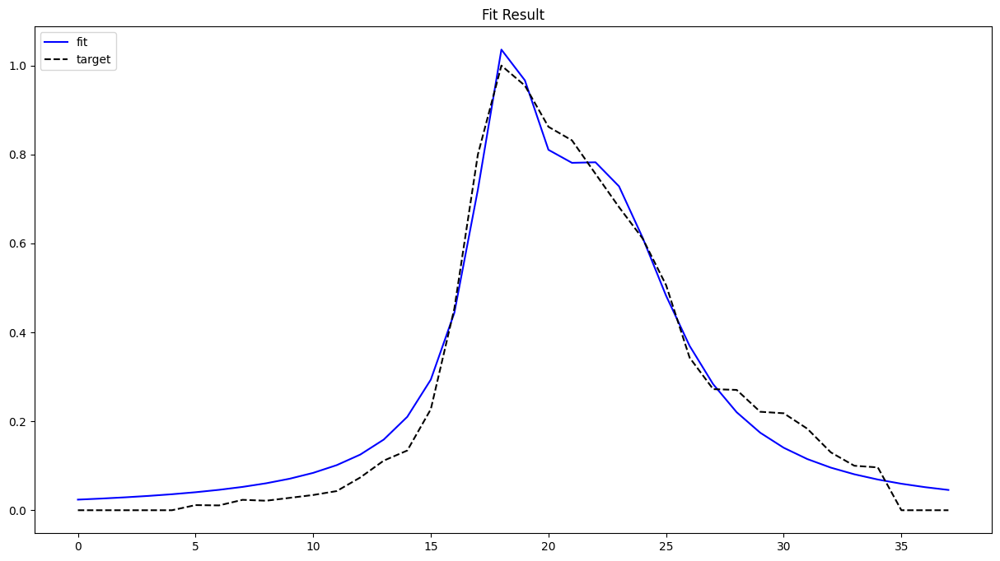

In [322]:
target = df['2017-35':'2018-20']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.71484701,  8.5286789 , 18.06796202, 0.8, 10, 30]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)
model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

In [323]:
param_list.append(params); errs.append(abserr)

## 18-19

True
[ 0.23439312  3.69583128 17.72258161  0.540399    7.41877142 26.88489251]


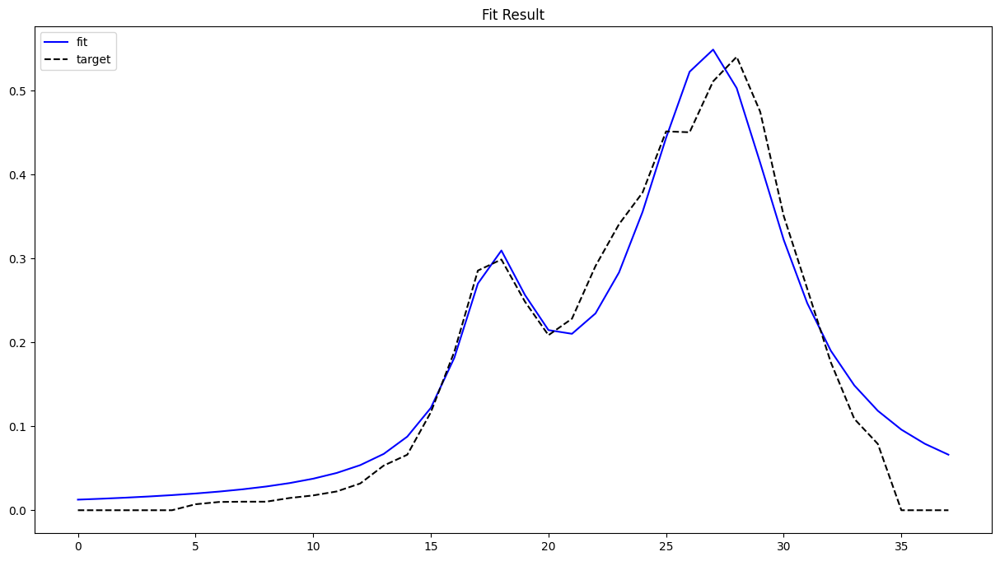

In [324]:
target = df['2018-35':'2019-20']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.71484701,  8.5286789 , 18.06796202, 0.8, 10, 30]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)

model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

In [325]:
param_list.append(params); errs.append(abserr)

## 19-20

True
[ 0.39459547  3.30469505 17.86575687  0.56119718  6.48900988 23.62170237]


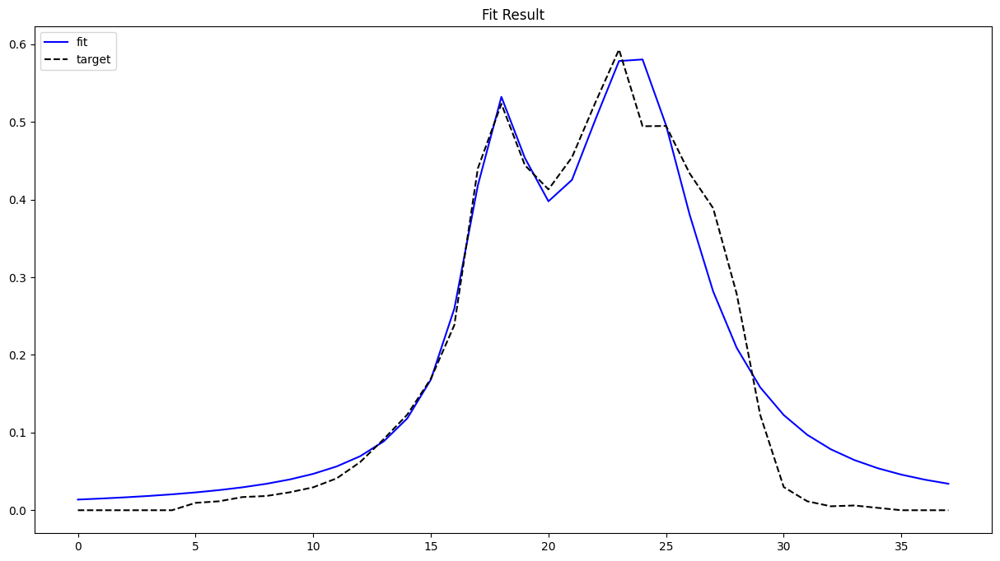

In [326]:
target = df['2019-35':'2020-20']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.5,  8.5286789 ,16, 0.8, 10, 25]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)

model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

In [327]:
param_list.append(params); errs.append(abserr)

## 20-21

True
[4.70040946e-03 7.99946645e+00 1.56772093e+01 1.67611220e-03
 9.23095419e+00 2.53295820e+01]


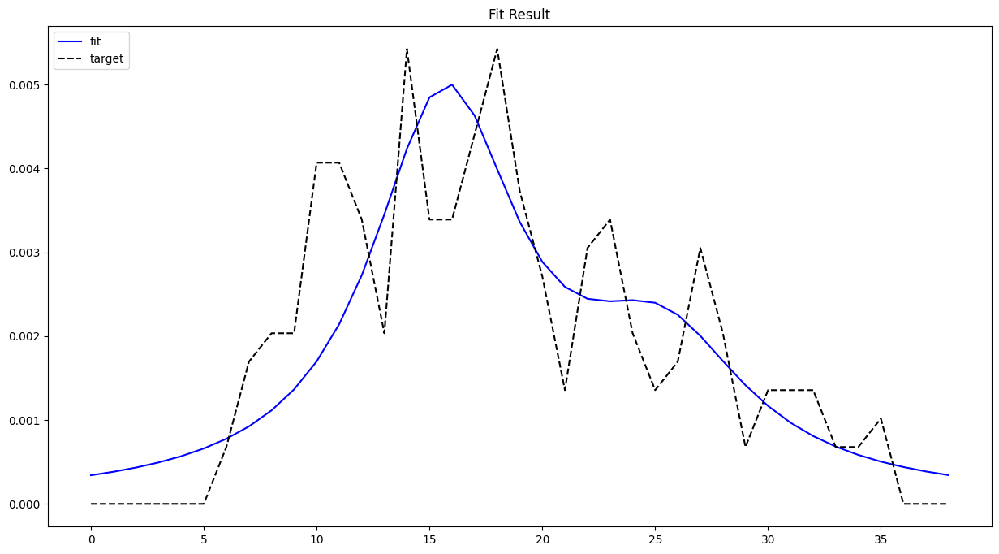

In [328]:
target = df['2020-35':'2021-20']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.5,  8.5286789 ,16, 0.8, 10, 25]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)

model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

## 21-22

True
[ 0.07954513  3.96732942 16.64437165  0.12693223  8.4775276  33.29901045]


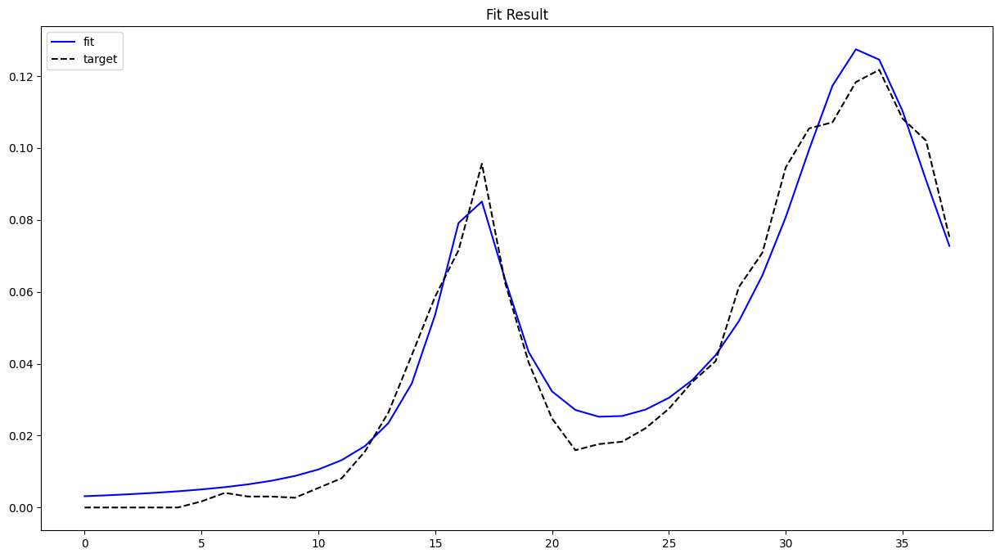

In [329]:
target = df['2021-35':'2022-20']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.5,  8.5286789 ,16, 0.8, 10, 25]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)

model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

## 22-23

True
[ 8.32051222e-01  5.65458648e+00  1.36583868e+01 -4.20850572e-17
  1.96691320e+01  2.52525253e+01]


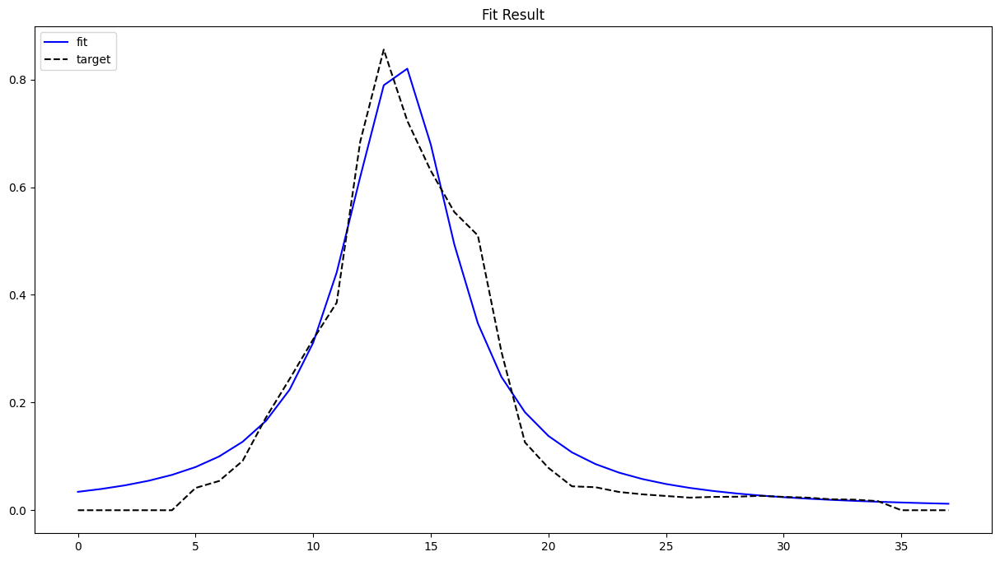

In [332]:
target = df['2022-35':'2023-20']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.8,  8.5286789 ,16, 0.4, 20, 25]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)

model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

In [333]:
param_list.append(params); errs.append(abserr)

## 23-24

True
[ 0.79212953  3.76172239 17.03162927  0.3189196  10.33815944 24.32009097]


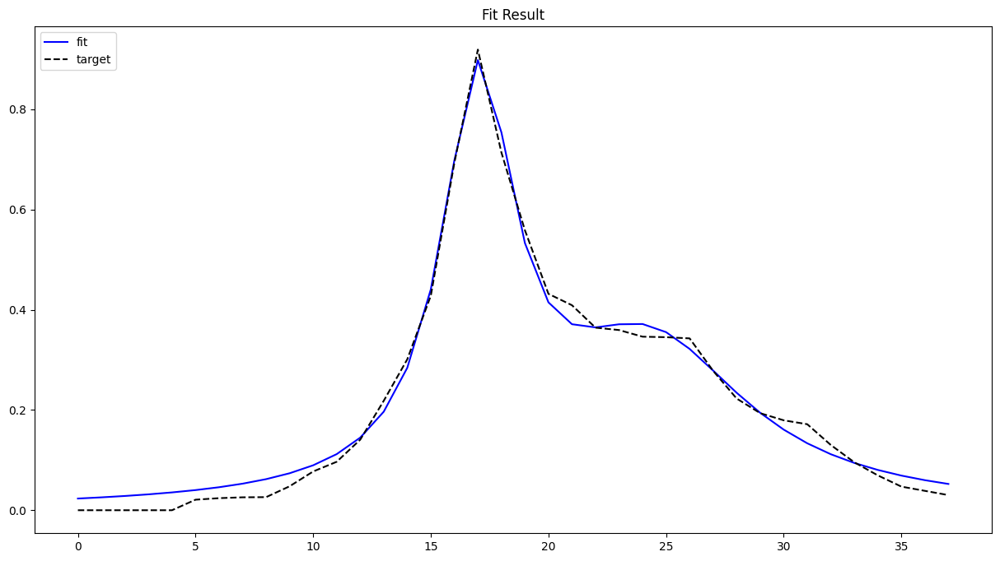

In [347]:
target = df['2023-35':'2024-20']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.5,  8.5286789 ,16, 0.8, 10, 25]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)

model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

In [335]:
param_list.append(params); errs.append(abserr)

## 24-25

True
[ 0.8349122   2.63547773 17.87075144  1.34594264  4.10155376 22.20930527]


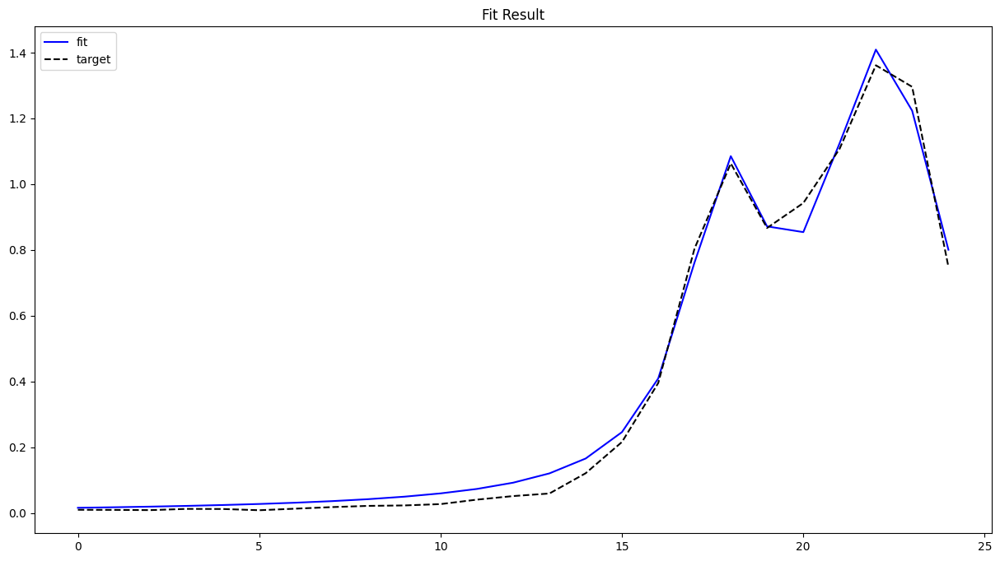

In [336]:
target = df['2024-35':'2025-07']['INF_ALL'].values
t_range = np.arange(len(target))

x0 = [ 0.5,  8.5286789 ,16, 0.8, 10, 25]
dp = DoublePeak(x0)
params, success, func = dp.fit(target,t_range)
print(success)
print(params)
model_ = lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range)
plt.figure(figsize=(15,8))
plt.plot(model_,color = 'blue',label='fit')
plt.plot(target,color = 'black',linestyle='dashed',label='target')
plt.title('Fit Result')
plt.legend(loc = 'upper left')

abserr = mean_absolute_error(model_,target)

In [337]:
param_list.append(params); errs.append(abserr)

## New dataset

In [341]:
index_names = ['12-13','13-14','14-15','15-16','16-17','17-18','18-19','19-20','22-23','23-24','24-25']

In [342]:
params_df = pd.DataFrame(data = np.array(param_list),columns = ['A1','Gam1','t1','A2','Gam2','t2'], index=index_names)

In [343]:
params_df['Err'] = errs

In [344]:
params_df

,A1,Gam1,t1,A2,Gam2,t2,Err
12-13,4.720187e-01,3.979174,17.887412,1.557254e-01,7.753937,22.024143,0.015531
13-14,3.616685e-01,5.552625,18.781009,5.245081e-02,8.771273,30.587758,0.016761
14-15,8.288997e-01,3.576667,17.431223,1.486177e-01,9.442557,23.499616,0.022717
15-16,-8.739793e-19,7.183673,17.757732,3.791234e-01,6.003820,27.371866,0.013256
16-17,2.816044e-01,2.687655,18.169142,4.583092e-01,8.319389,24.377655,0.032072
17-18,7.590408e-01,3.225547,18.153131,6.743483e-01,7.378570,22.329201,0.040209
18-19,2.343931e-01,3.695831,17.722582,5.403990e-01,7.418771,26.884893,0.027740
19-20,3.945955e-01,3.304695,17.865757,5.611972e-01,6.489010,23.621702,0.031067
22-23,8.320512e-01,5.654586,13.658387,-4.208506e-17,19.669132,25.252525,0.036482
23-24,7.921295e-01,3.761722,17.031629,3.189196e-01,10.338159,24.320091,0.019431


In [345]:
params_df.to_csv('TwoPeakFitParams.csv')

1.6%
1.7%
2.3%
1.3%
3.2%
4.0%
2.8%
3.1%
3.6%
1.9%


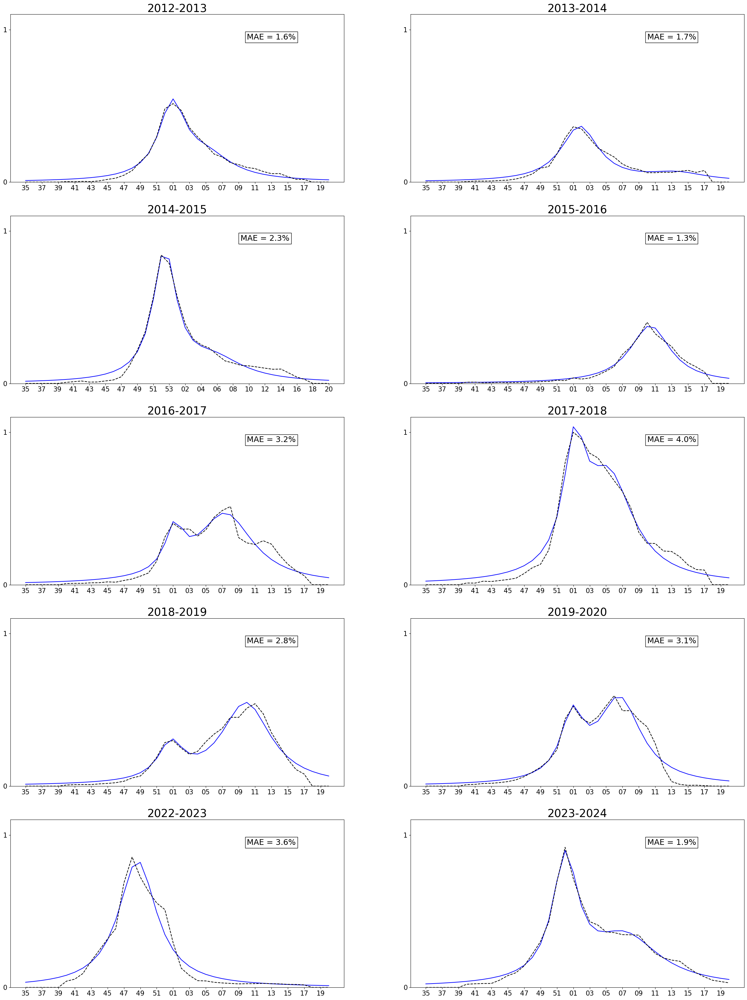

In [370]:
fig, ax = plt.subplots(5,2,figsize=(30,40))
startyear = 2012
row, col = 0,0
for i in range(10):

    year = startyear+i
    end_year = year+1
    if year == 2020 or year == 2021:
        year+=2
        end_year+=2

    target = df[str(year)+'-35':str(end_year)+'-20']['INF_ALL'].values
    target_ind = list(df[str(year)+'-35':str(end_year)+'-20']['INF_ALL'].index)
    target_ind = [x.split('-')[1] for x  in target_ind]
    t_range = np.arange(len(target))
    params = params_df.iloc[i].values
    mae = params[-1]
    mae = "{:.1%}".format(mae)
    print(mae)
    ax[row,col].plot(lorentzian(params[0],params[1],params[2],t_range)+lorentzian(params[3],params[4],params[5],t_range),color = 'blue',label='fit')
    ax[row,col].plot(target,color = 'black',linestyle='dashed',label='target')
    ax[row,col].set_ylim([0,1.1])
    ax[row,col].set_title(str(year)+'-'+str(end_year),fontsize=25)
    ax[row,col].set_xticks(ticks = t_range[::2],labels = target_ind[::2],fontsize=15)
    ax[row,col].set_yticks(ticks = [0,1],labels= [0,1],fontsize=15)
    ax[row,col].text(30, 0.95, "MAE = "+str(mae), ha='center', va='center',fontsize=18,bbox=dict(facecolor='white', edgecolor='black', linewidth=1))
    col+=1
    col = col % 2 
    if col ==0:
        row+=1

In [74]:
df.columns

Index(['INF_ALLAUS', 'INF_ALLCHL', 'INF_ALLPRY', 'INF_ALLARG', 'INF_ALLURY',
       'season', 'INF_ALL'],
      dtype='object')

In [80]:
new_data = []
for year in ['2013','2014','2015','2016','2017','2018','2019','2022','2023','2024']:
    new_data.append(df[['INF_ALLAUS', 'INF_ALLCHL', 'INF_ALLPRY', 'INF_ALLARG', 'INF_ALLURY']].loc[year+'-01':year+'-52'])
new_data = np.array(new_data)
new_data.shape

(10, 52, 5)

In [82]:
params_df.values.shape

(10, 6)

In [981]:
class NewDataset_(Dataset):
    
    def __init__(self,Y, X):
    
        data = []
        for j in range(X.shape[0]):
            
            x = torch.from_numpy(X[j])
            y = torch.tensor(Y[j])
            data.append((x,y))
            
            # permute 1
           # x = torch.from_numpy(np.array([X[j][:][1],X[j][:][0],X[j][:][2],X[j][:][3],X[j][:][4]]))
           # data.append((x,y))
        
        self.data = data
        
    def __len__(self):

        return len(self.data)
    def __getitem__(self,i):
            
            #return item at i
            
        return self.data[i]

In [982]:
#################### training executable ########################################
def train(dataloader, model,device, loss_fn, optimizer,noise):
    
    # train function gets called inside function train_model
    # set up to be general but loss_fn and optimizer are hardcoded in train_model

    model.train()
    cnt = 0
    total_loss = 0
    for batches in dataloader:
            x,y = batches
         
            x=x.to_dense().to(device)
            y= y.to(device).float()
            pred=  model(x.float())
            if noise == True:
               randos = []
               for i in range(y.shape[0]):
                   rando = np.random.normal(loc=0.0, scale=.2, size=None)
                   randos.append(rando)
               randos = torch.tensor(randos)
               y = (1+rando)*y
          
            loss = loss_fn(pred,y)
           
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            
            loss,current = loss.item(), cnt * len(x) # can't remember why I wanted "current"
          
            cnt+=1
            total_loss+= loss
    return float(total_loss)


############### test executable ##############################################
def test(dataloader, model, device,loss_fn):
    
    #same thing as train but doesn't run the optimizer or a backward

    num_batches = len(dataloader)
    
    model.eval()
    test_loss, correct = 0,0
    with torch.no_grad():
        for X, y in dataloader:
            X,y = X.to_dense().to(device), y.to(device)
            pred = model(X.float())
           
            test_loss+=loss_fn(pred,y.float()).item()
           
    return test_loss

def test_max(dataloader, model, device):
    
    #same thing as train but doesn't run the optimizer or a backward

    num_batches = len(dataloader)
    
    model.eval()
    pred_list, y_list = [], []
    with torch.no_grad():
        for X, y in dataloader:
            X,y = X.to_dense().to(device), y.to(device)
            pred = model(X.float())
            pred_list.append(pred)
            y_list.append(y.float())

    test_loss = (pred_list[0][0][0] - y_list[0][0][0])**2#+(pred_list[0][0][1] - y_list[0][0][1])**2
    return test_loss

################ this is the full training executable, uses "train" and "test" ##############################################
################ user be warned I change this almost daily trying to figure out better features ##########################################

def train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast):

# This is the function for minimizing a model for a dataset, saves best val and train model in PATH and outputs two tuples of losses for train/val


# PATH = destination for saving/loading the model
# model, device = model class instance , resources
# loss_fn = loss class instance
# batched_sequence = Dataset instance
# learn_rate = (float) learn_rate 
# num_epochs = (int) number of epochs
# kill = (int) if loss does not decrease for "kill" number of epochs end the routine
# batch_size_ = (int) batch size
# t_beg = (int) index in DATES to start fit
# t_end = (int) index in DATES to end fit
# noise = (bool) true or false to introduce noise in train
# forecast = (int) number of indices to include in validation beyond t_end

    #sparse_tensor = Dataset_(Y_df,dataframe_list) 
    #batched_sequence = SequenceDataset(sparse_tensor) # this is hard coded in but could get rid of this by just feeding batched_sequence as input
    time0 = time.perf_counter()
    
    with open(PATH[:-4]+".log","w") as f:
        f.write("starting log for model: "+PATH+"\n")
        loss_values = []
        pred = []
        train_ = Subset(batched_sequence,range(t_beg,t_end)) 
        train_dataloader = DataLoader(train_, batch_size=batch_size_, shuffle=False)

        test_ = Subset(batched_sequence,range(t_end,t_end+forecast))
        test_dataloader = DataLoader(test_, batch_size=1, shuffle=False)




        #loss_fn = nn.MSELoss()
        #loss_fn = nn.L1Loss()
        #loss_fn = elastic_net_loss()
        optimizer = torch.optim.Adam(model.parameters(), lr=learn_rate)
        losses, losses_test = [],[]
        c, epoch, loss_cut= 0,0, 1e99 # init
        d=c
        g = c
        loss_cut_t = loss_cut
        loss_cut_val = loss_cut

        while epoch < num_epochs:
        #for epoch in range(num_epochs):
            print("epoch",epoch,c,d)
            time1 = time.perf_counter()
            
            d+=1
            g+=1
            if d % 10 == 0 and d!=0:
                learn_rate*=0.1
                model.load_state_dict(torch.load(PATH[:-4]+"_train.pth"))
                optimizer = torch.optim.Adam(model.parameters(), lr=learn_rate)
                
                print("Shrinking learning rate to",str(learn_rate))
                f.write("Shrinking learning rate to "+str(learn_rate)+"\n")
                if learn_rate < 1e-6:
                    print("Learning rate getting small")
                    f.write("Learning rate getting small\n")
                    break
    #         optimizer = torch.optim.Adam(model.parameters(), lr=learn_rate)
            loss = train(train_dataloader,model,device,loss_fn,optimizer,noise)
            losses.append(loss)
        
            #loss_test = test(test_dataloader,model,device,loss_fn)    
            loss_test = test_max(test_dataloader, model, device)
            #loss_test = np.sqrt(loss_test+(0.01*loss)**2)
            losses_test.append(loss_test)
            time2 = time.perf_counter()
        
            print("Train loss:",loss,"Val loss:",loss_test,"Time:",time2-time1)
            f.write("Train loss: "+str(loss)+" Val loss: "+str(loss_test)+" Time: "+str(time2-time1)+"\n")

            if epoch == 0:
                loss_cut = loss_test
            if epoch > 0:
                if loss_cut < loss_test:
                    c+=1
                else:
                    c = 0
                    torch.save(model.state_dict(), PATH)
                loss_cut = loss_test
            


            
            if loss < loss_cut_t:
                loss_cut_t = loss
                torch.save(model.state_dict(), PATH[:-4]+"_train.pth")
                d = 0
            if loss_test < loss_cut_val and epoch > 15:
                loss_cut_val = loss_test
                torch.save(model.state_dict(), PATH[:-4]+"_val.pth")
                g = 0
        # test(train_dataloader,model,loss_fn)
        
            if c == kill and epoch > 30:
                print("reached val limit, early stopping now")
                break
            epoch +=1
                
        
        print("Complete")
        print("Total time:",time2-time0)
        f.write("Complete\n Total time: "+str(time2-time0))
    return losses,losses_test

In [755]:
class lstm1_lor(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(lstm1_lor, self).__init__()
        
        
        
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 1)
        self.lstm1 = nn.LSTM(26,13,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           # nn.Dropout(0.2),
            nn.Linear(seq_len*country_len,25),
            nn.ReLU(),
            nn.Linear(25,6)
           # nn.ReLU()
        )        
        
    def forward(self, x):
        
        logits, _ = self.lstm(x.permute(0,2,1)) 
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)      
        logits = self.seq(logits)
        
        
        return logits

In [804]:
class conv_lor(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(conv_lor, self).__init__()
        
        
        
        self.conv = nn.Conv2d(1,1,(5,5))

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           # nn.Dropout(0.2),
            nn.Linear(48,6)
          
           # nn.ReLU()
        )        
        
    def forward(self, x):
        x = x.unsqueeze(0)
        logits = self.conv(x)   
        logits = self.seq(logits)
        
        
        return logits

In [998]:
class conv_lor1(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(conv_lor1, self).__init__()
        
        
        
        self.conv = nn.Conv2d(1,1,(5,5))

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
            nn.Linear(48,6),
            nn.ReLU()
          
           # nn.ReLU()
        )        
        
    def forward(self, x):
        x = x.unsqueeze(0)
        logits = self.conv(x)   
        logits = self.seq(logits)
        
        
        return logits

In [984]:
ss_params = MinMaxScaler()
ss_params.fit(params_df.values[:7])
params_ss = ss_params.transform(params_df.values)

In [985]:
data_in_lor = NewDataset_(params_ss,new_data)

In [999]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = conv_lor1(52,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'C:\\Users\\christopher.johnson\\Documents\\'+model.__class__.__name__+'_new_22-23.pth'

loss_fn = nn.MSELoss()
batched_sequence = data_in_lor
learn_rate = 1e-3
num_epochs =1000
kill = num_epochs
batch_size_ = 1
t_beg = 0
t_end = 7
noise = False
forecast = 1

torch.manual_seed(5)

In [1000]:
loss_t,loss_v= train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 1.761844202876091 Val loss: tensor(1.0077) Time: 0.008101800000076764
epoch 1 0 0
Train loss: 1.6690182089805603 Val loss: tensor(1.0077) Time: 0.01029000000016822
epoch 2 0 0
Train loss: 1.5572296977043152 Val loss: tensor(1.0077) Time: 0.010051700000985875
epoch 3 0 0
Train loss: 1.4379939213395119 Val loss: tensor(1.0077) Time: 0.009897500000079162
epoch 4 0 0
Train loss: 1.322194293141365 Val loss: tensor(1.0077) Time: 0.012393999999403604
epoch 5 0 0
Train loss: 1.2226197198033333 Val loss: tensor(1.0077) Time: 0.007874999999330612
epoch 6 0 0
Train loss: 1.147678904235363 Val loss: tensor(1.0077) Time: 0.012567499999931897
epoch 7 0 0
Train loss: 1.0910470820963383 Val loss: tensor(0.9665) Time: 0.007745700000668876
epoch 8 0 0
Train loss: 1.0215201564133167 Val loss: tensor(0.8348) Time: 0.009334700000181329
epoch 9 0 0
Train loss: 0.9328481443226337 Val loss: tensor(0.6819) Time: 0.006417200000214507
epoch 10 0 0
Train loss: 0.858946530148387 Val loss: t

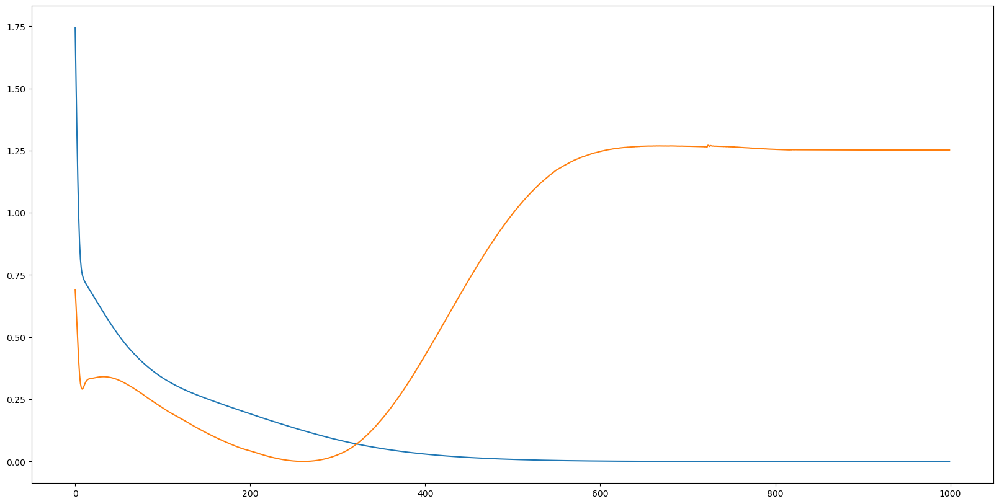

In [992]:
plt.plot(loss_t)
plt.plot(loss_v)

In [993]:
MODEL_PATH = PATH[:-4]+"_val.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

In [994]:
params = params_df.values

In [995]:
pred = ss_params.inverse_transform(pred)

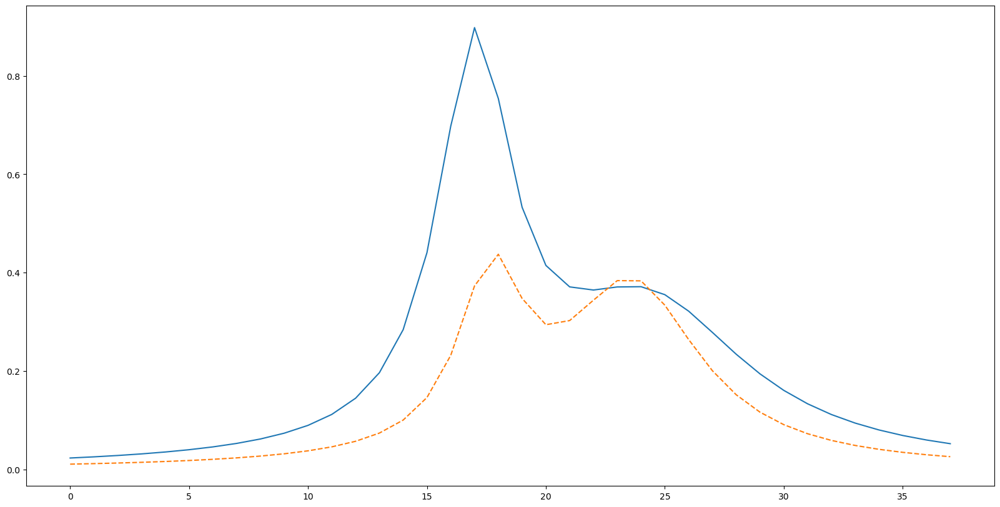

In [997]:
season = 8
lor1 = lorentzian(params[season,0],params[season,1],params[season,2],t_range) + lorentzian(params[season,3],params[season,4],params[season,5],t_range)
lor2= lorentzian(pred[season,0],pred[season,1],pred[season,2],t_range) +lorentzian(pred[season,3],pred[season,4],pred[season,5],t_range)

plt.plot(lor1)
plt.plot(lor2,linestyle='dashed')


In [393]:
pred

array([[ 3.5931429e-01,  5.2856584e+00,  1.7432766e+01,  5.1879860e-02,
         1.1371964e+01,  2.8903557e+01],
       [ 8.2716990e-01,  3.5690789e+00,  1.7432766e+01,  1.4702584e-01,
         9.7850733e+00,  2.3511435e+01],
       [-1.2953557e+00,  1.0261766e+01,  6.3366108e+01,  3.9306346e-01,
         7.0693011e+00,  2.7503359e+01],
       [ 2.8150314e-01,  2.6876943e+00,  1.8168480e+01,  4.5837837e-01,
         8.3157902e+00,  2.4377495e+01],
       [ 7.5895894e-01,  2.6876943e+00,  1.7432766e+01,  6.7455220e-01,
         7.3798618e+00,  2.2328310e+01],
       [ 2.3436812e-01,  3.6970031e+00,  1.7432766e+01,  5.4040045e-01,
         7.4183888e+00,  2.6885000e+01],
       [ 3.9461282e-01,  3.3019741e+00,  1.7432766e+01,  5.6123054e-01,
         6.4907432e+00,  2.3621025e+01],
       [ 1.7866379e+00,  2.6876943e+00,  1.7432766e+01,  2.6802957e-01,
         6.4907432e+00,  2.5052666e+01],
       [ 8.7522668e-01,  2.6876943e+00,  1.7432766e+01,  8.7565070e-01,
         6.4907432e+00, 

In [522]:
from sklearn.ensemble import RandomForestRegressor

In [523]:
len(params_ss[:7])

7

In [533]:
X = new_data

In [546]:
rfc = LinearRegression()
X_train, y_train = new_data[:7],params_ss[:7]
X_test, y_test = new_data[7:], params_ss[7:]
X_train = X_train.reshape(7,52*5)
X = X.reshape(10,52*5)

X_test = X_test.reshape(3,52*5)
rfc.fit(X_train,y_train) 

LinearRegression()

In [547]:
y_pred = rfc.predict(X)
y_pred

array([[ 0.20797631,  0.29131217, -0.36381891, -1.67324955,  1.93731115,
         1.58596617],
       [ 0.9215825 , -0.41250283, -0.44444506, -1.2208649 ,  0.94885838,
        -0.79000549],
       [-2.31566453,  2.33162864,  2.44881221, -0.05098815, -0.74258139,
         0.96898016],
       [ 0.08935529, -0.77389276, -0.39810186,  0.25953417,  0.0337173 ,
        -0.40838837],
       [ 0.8174857 , -0.5544402 , -0.3990987 ,  1.28742241, -0.54915308,
        -1.31134233],
       [ 0.01742822, -0.36006503, -0.42618084,  0.64955295, -0.52518162,
         0.69651188],
       [ 0.26183652, -0.52203999, -0.41716684,  0.74859307, -1.10297075,
        -0.74172201],
       [ 2.57195472, -2.57080503, -2.45078181, -0.72760641,  0.33094893,
        -2.27578057],
       [ 1.49178341, -1.27987141, -1.18513559,  0.40264407, -0.49838726,
        -1.8471092 ],
       [ 3.84493678, -4.60535119, -4.41214396,  1.32503803, -0.09540104,
        -2.56829674]])

In [548]:
pred = y_pred
pred = ss_params.inverse_transform(pred)

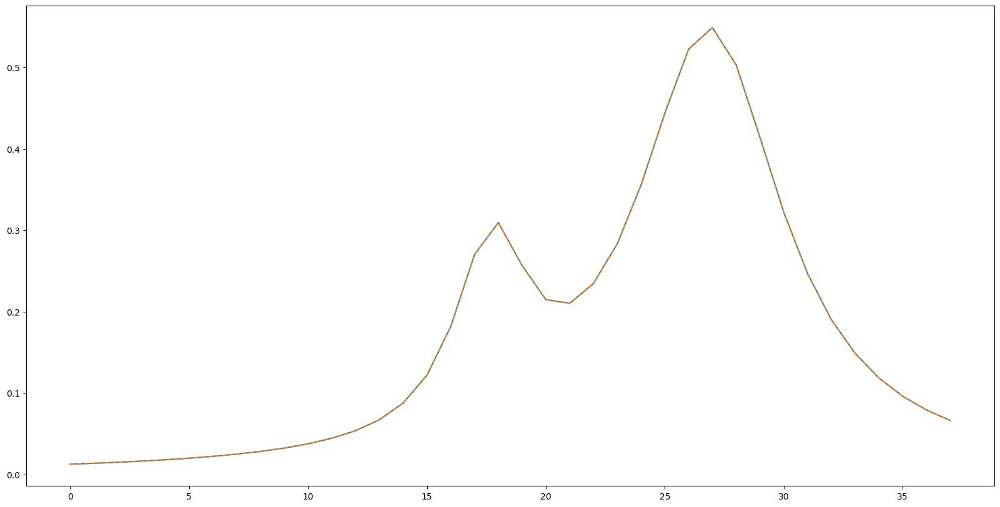

In [551]:
season = 5
lor1 = lorentzian(params[season,0],params[season,1],params[season,2],t_range) + lorentzian(params[season,3],params[season,4],params[season,5],t_range)
lor2 = lorentzian(pred[season,0],pred[season,1],pred[season,2],t_range) +lorentzian(pred[season,3],pred[season,4],pred[season,5],t_range)
plt.plot(lor1)
plt.plot(lor2,linestyle='dashed')

In [552]:
params_df

,A1,Gam1,t1,A2,Gam2,t2
13-14,0.359306,5.285622,18.712787,0.051880,11.372000,28.903559
14-15,0.827198,3.569088,17.432767,0.147023,9.785012,23.511449
15-16,-1.295375,10.261747,63.366101,0.393066,7.069358,27.503350
16-17,0.281530,2.687694,18.168511,0.458374,8.315728,24.377504
17-18,0.758945,3.222917,18.152686,0.674554,7.379913,22.328310
18-19,0.234369,3.696979,17.722730,0.540400,7.418400,26.885002
19-20,0.394621,3.301938,17.865836,0.561230,6.490743,23.621025
22-23,0.823631,6.052860,13.763042,-0.084506,3.672983,21.039736
23-24,0.792216,3.762698,17.031675,0.318919,10.332489,24.322031
24-25,0.835017,2.635248,17.870735,1.346018,4.100657,22.209371


# Other Forecast Ranges

## 22

In [53]:
data_in = Dataset_(df["INF_ALL"],df.drop(['key_0','INF_ALL','season'],axis=1),26,26+21)

(788,)


### LSTM

#### 22-23

In [69]:
device = torch.device("cpu")
model = lstm(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'models/'+model.__class__.__name__+'_fcast_20_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 5e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [70]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 15.343516683355745 Val loss: 1.7335064479468552 Time: 0.3979957500000637
epoch 1 0 0
Train loss: 10.72938536117977 Val loss: 1.2365389440931918 Time: 0.3738709589999871
epoch 2 0 0
Train loss: 7.794136921470113 Val loss: 0.9770177811040274 Time: 0.36945766700000604
epoch 3 0 0
Train loss: 7.414284154319276 Val loss: 0.9547755785917228 Time: 0.38492070799998146
epoch 4 0 0
Train loss: 7.183094286225026 Val loss: 0.9530748596873003 Time: 0.3957377080000697
epoch 5 0 0
Train loss: 7.066707629057221 Val loss: 0.9395937481962403 Time: 0.39929720800000723
epoch 6 0 0
Train loss: 6.713909082428794 Val loss: 0.9022521876814427 Time: 0.3849297499999693
epoch 7 0 0
Train loss: 6.4857399910207505 Val loss: 0.8788109670053652 Time: 0.3709352079999917
epoch 8 0 0
Train loss: 6.256928107373469 Val loss: 0.8329295319641431 Time: 0.4030500829999255
epoch 9 0 0
Train loss: 5.812693091728421 Val loss: 0.7914684939062069 Time: 0.3679999579999276
epoch 10 0 0
Train loss: 5.51488190

(0.0, 1.5)

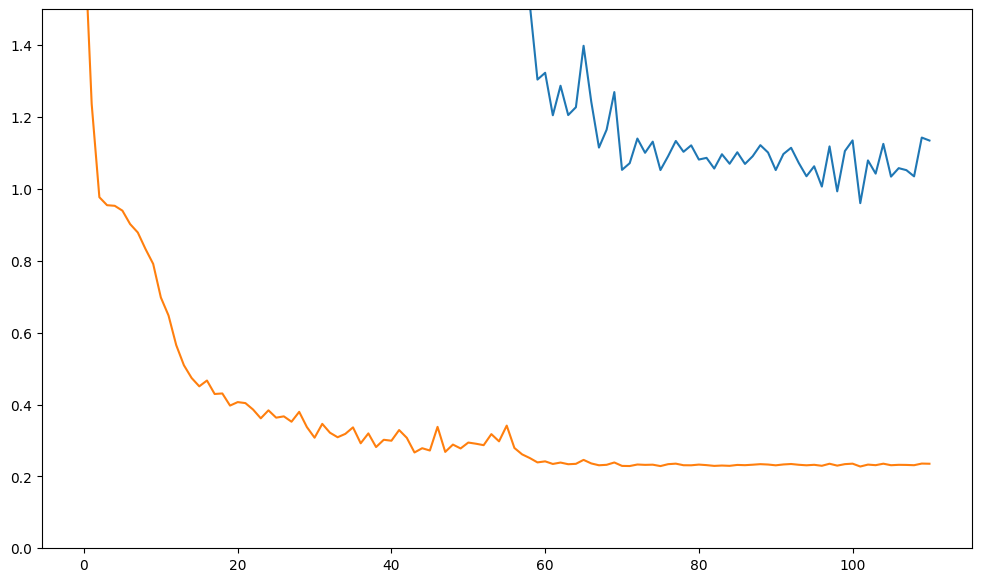

In [71]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

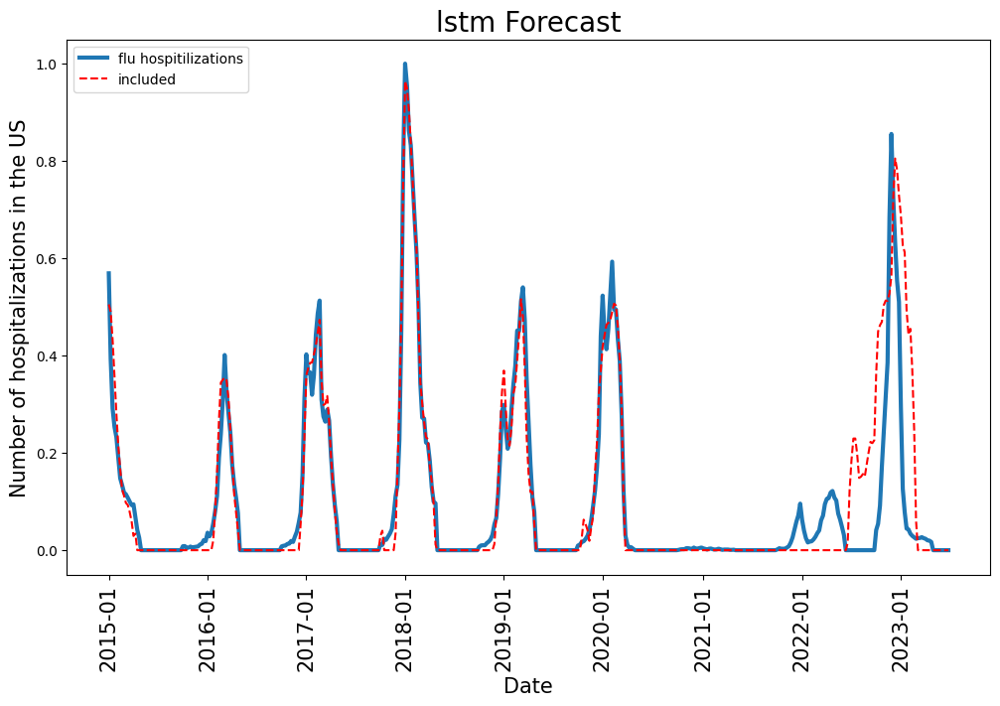

In [72]:
plot_model('2023-26')

### LSTM1

#### 22-23

In [75]:
device = torch.device("cpu")
model = lstm1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'models/'+model.__class__.__name__+'_fcast_20_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 5e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [76]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 13.167463160421448 Val loss: 1.489683999758118 Time: 0.26137695900001745
epoch 1 0 0
Train loss: 7.966403597957701 Val loss: 0.9439544853146307 Time: 0.23831154200001947
epoch 2 0 0
Train loss: 6.660681941876616 Val loss: 0.8422804674609836 Time: 0.27942045899999357
epoch 3 0 0
Train loss: 6.213394166369596 Val loss: 0.8018173378838436 Time: 0.23786587499989764
epoch 4 0 0
Train loss: 5.930845718370946 Val loss: 0.7873579783326685 Time: 0.23639858299998195
epoch 5 0 0
Train loss: 5.598154531007161 Val loss: 0.7444045481402026 Time: 0.24289612500001567
epoch 6 0 0
Train loss: 5.262630010894865 Val loss: 0.6955014553010004 Time: 0.23601012499989338
epoch 7 0 0
Train loss: 4.962452785636481 Val loss: 0.6509014159568136 Time: 0.23516700000004676
epoch 8 0 0
Train loss: 4.660498048165948 Val loss: 0.6090411600613947 Time: 0.23777929200014114
epoch 9 0 0
Train loss: 4.387725345616234 Val loss: 0.5705393803560787 Time: 0.2371407079999699
epoch 10 0 0
Train loss: 4.1366

(0.0, 1.5)

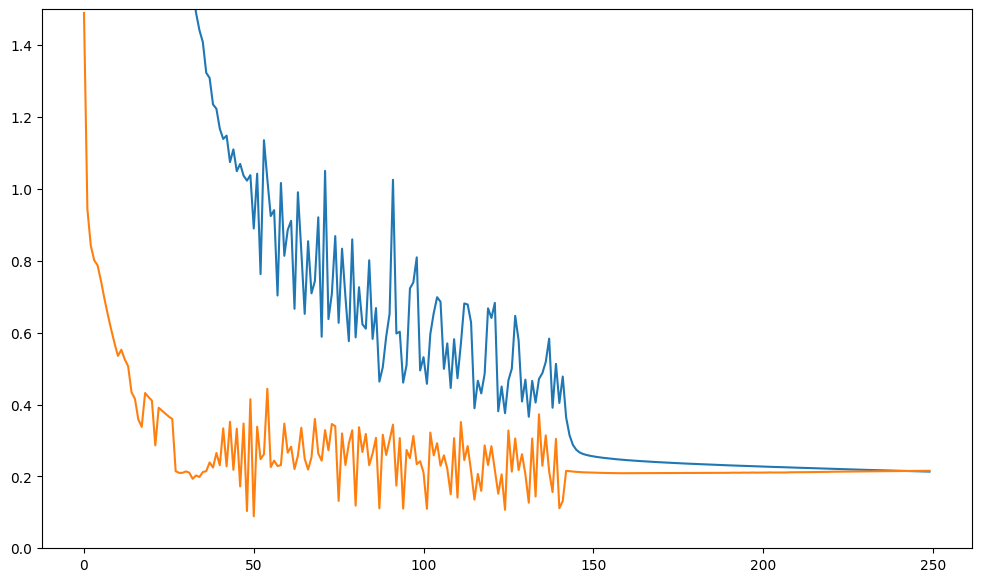

In [77]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

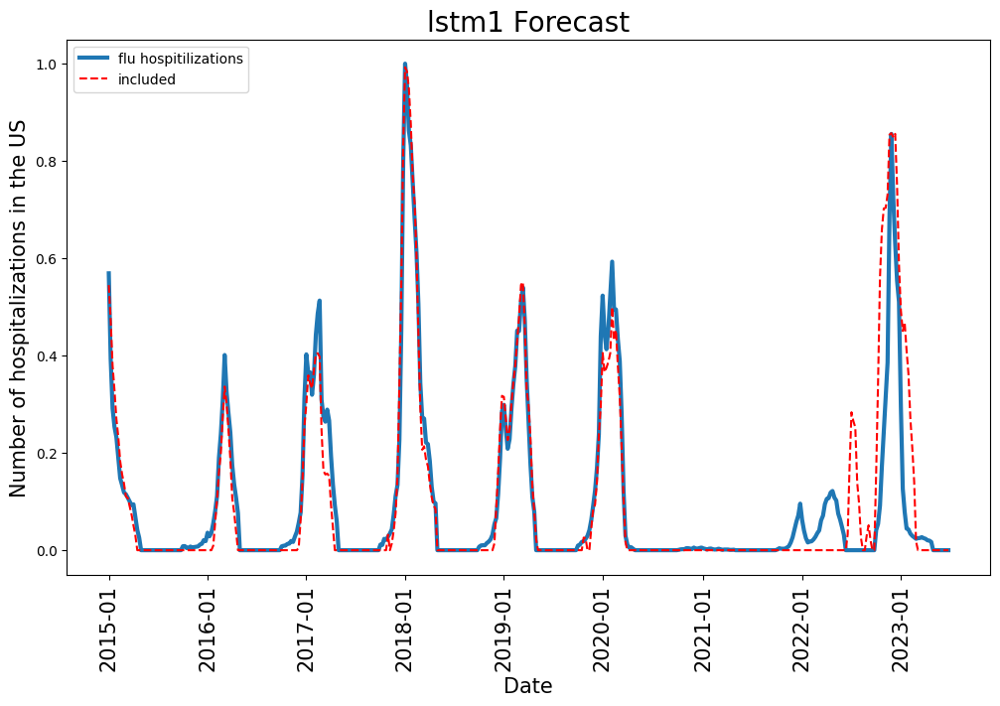

In [78]:
plot_model('2023-26')

### LSTM Lin1

#### 22-23

In [81]:
device = torch.device("cpu")
model = lstm_lin1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'models/'+model.__class__.__name__+'_fcast_20_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 5e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(4)

In [83]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 15.715884708966172 Val loss: 2.758957469447334 Time: 0.4440972500001408
epoch 1 0 0
Train loss: 10.156720826086314 Val loss: 1.1088604578032157 Time: 0.5841148330000578
epoch 2 0 0
Train loss: 7.536424918191585 Val loss: 0.8546581043436567 Time: 0.4212659159998111
epoch 3 0 0
Train loss: 6.879703847704818 Val loss: 0.8220792564322241 Time: 0.41354595800021343
epoch 4 0 0
Train loss: 6.4732073318468375 Val loss: 0.7807701176481963 Time: 0.41685583399976167
epoch 5 0 0
Train loss: 5.998498317625783 Val loss: 0.758687261823738 Time: 0.41283941600022445
epoch 6 0 0
Train loss: 5.726486777981353 Val loss: 0.724907393368043 Time: 0.42050566699981573
epoch 7 0 0
Train loss: 5.128434188383937 Val loss: 0.6582065275808548 Time: 0.41245470800004114
epoch 8 0 0
Train loss: 4.958244932669982 Val loss: 0.6004870810756362 Time: 0.41619183300008444
epoch 9 0 0
Train loss: 4.770405266708536 Val loss: 0.5882709458475945 Time: 0.41253166700016664
epoch 10 0 0
Train loss: 4.242469

(0.0, 1.5)

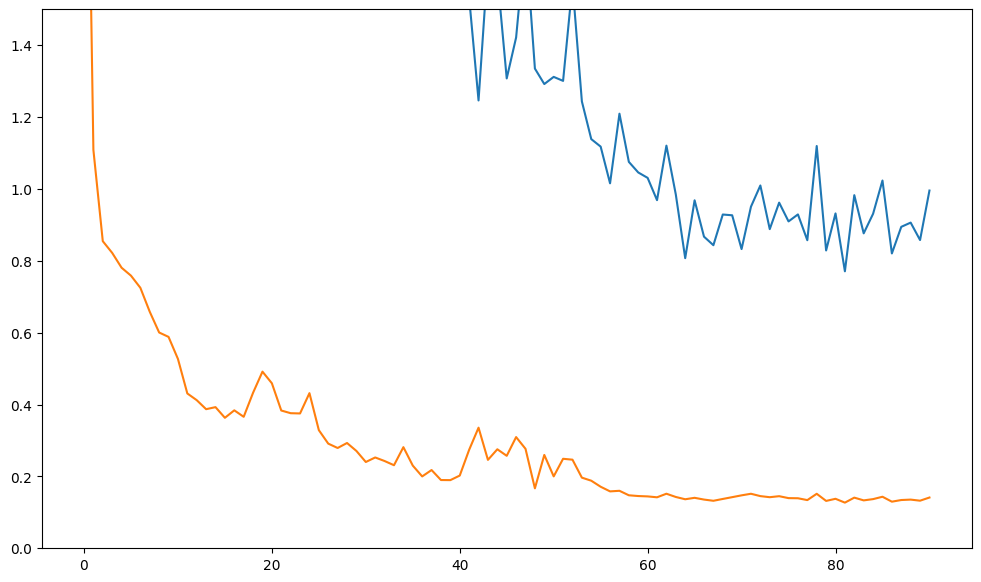

In [84]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

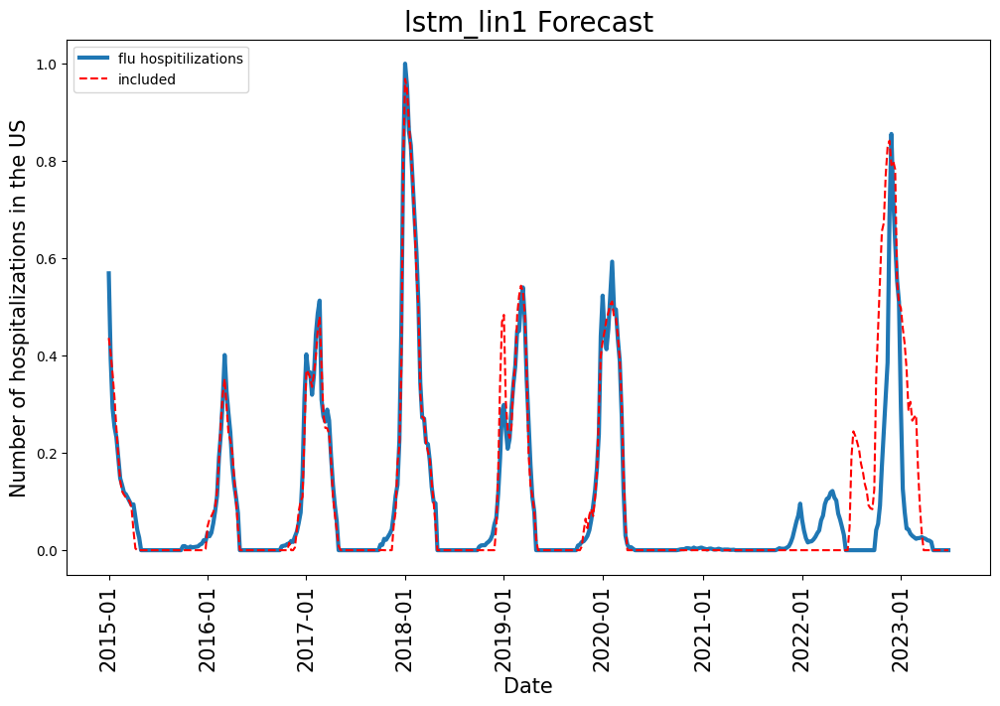

In [85]:
plot_model('2023-26')

### RNN

#### 22-23

In [98]:
device = torch.device("cpu")
model = rnn(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'models/'+model.__class__.__name__+'_fcast_20_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(2)

In [99]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.167087663535401 Val loss: 1.6336514338477406 Time: 0.30609616699985054
epoch 1 0 0
Train loss: 12.849256631484437 Val loss: 1.4836112518146631 Time: 0.31201716599935025
epoch 2 0 0
Train loss: 10.804108814109666 Val loss: 1.2677141348451124 Time: 0.2921089170004052
epoch 3 0 0
Train loss: 8.343653027302341 Val loss: 1.0069126934670651 Time: 0.2926527090003219
epoch 4 0 0
Train loss: 6.84520928205626 Val loss: 0.8571845439384695 Time: 0.2705969999997251
epoch 5 0 0
Train loss: 6.237457346196621 Val loss: 0.7955963575810451 Time: 0.2742497910003294
epoch 6 0 0
Train loss: 5.957891066185838 Val loss: 0.7660064407113394 Time: 0.26665295800012245
epoch 7 0 0
Train loss: 5.791756001928572 Val loss: 0.7464763765815521 Time: 0.2681962080005178
epoch 8 0 0
Train loss: 5.643592025921378 Val loss: 0.7294538712454122 Time: 0.26753041699976166
epoch 9 0 0
Train loss: 5.5206780438519445 Val loss: 0.7158024887201946 Time: 0.2661961670000892
epoch 10 0 0
Train loss: 5.408218

(0.0, 1.5)

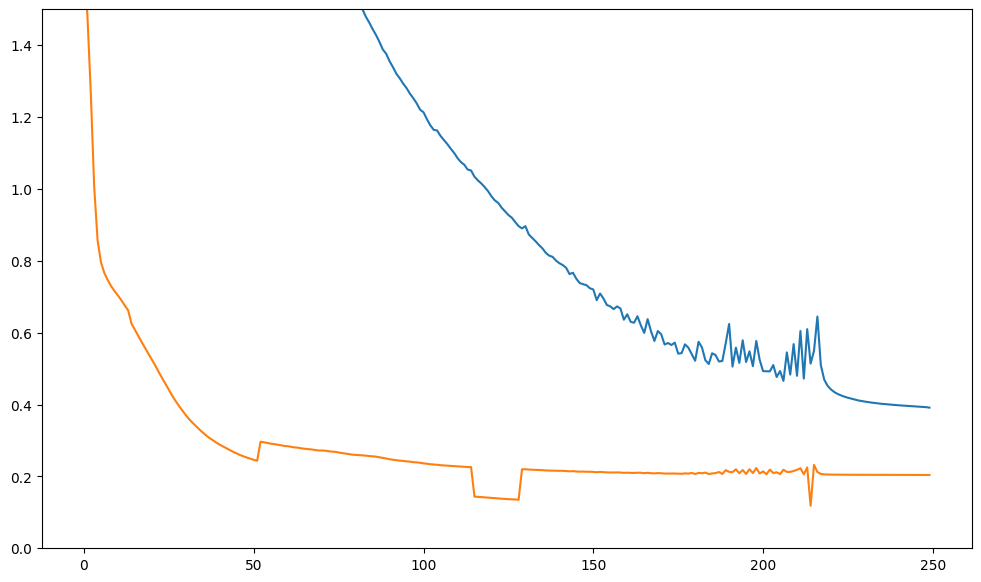

In [100]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

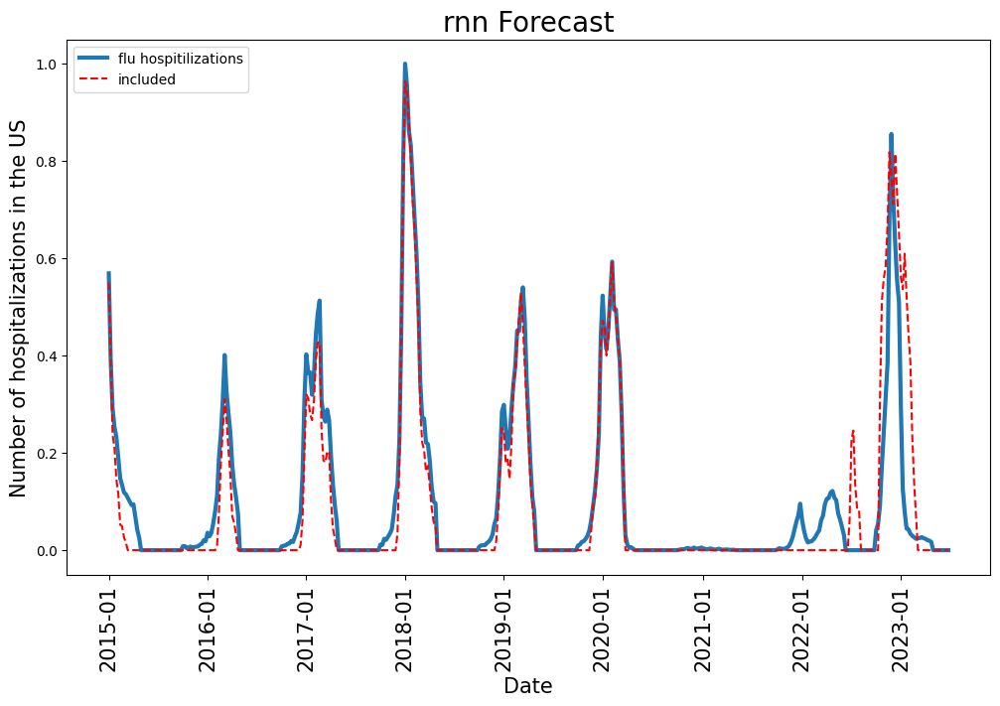

In [101]:
plot_model('2023-26')

### RNN1

#### 22-23

In [105]:
device = torch.device("cpu")
model = rnn1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'models/'+model.__class__.__name__+'_fcast_20_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(3)

In [106]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 13.433080734994519 Val loss: 1.566804983571723 Time: 0.30676491699978214
epoch 1 0 0
Train loss: 11.298812494527077 Val loss: 1.3663668166102512 Time: 0.17561358300008578
epoch 2 0 0
Train loss: 9.10132452326443 Val loss: 1.1056413495334558 Time: 0.18307545900006517
epoch 3 0 0
Train loss: 7.415488331716489 Val loss: 0.9317093732344255 Time: 0.19001820900029998
epoch 4 0 0
Train loss: 6.418984101653775 Val loss: 0.8224016674120083 Time: 0.18228658299995004
epoch 5 0 0
Train loss: 5.905088078273309 Val loss: 0.7614568709528194 Time: 0.17689475000042876
epoch 6 0 0
Train loss: 5.629925902436042 Val loss: 0.7254800253065635 Time: 0.18938054199952603
epoch 7 0 0
Train loss: 5.445729142385677 Val loss: 0.7009961148431815 Time: 0.18486912500065955
epoch 8 0 0
Train loss: 5.299028406772507 Val loss: 0.6821163158814391 Time: 0.18982579199928296
epoch 9 0 0
Train loss: 5.172600141319798 Val loss: 0.6665445528988044 Time: 0.18765787500069564
epoch 10 0 0
Train loss: 5.057

(0.0, 1.5)

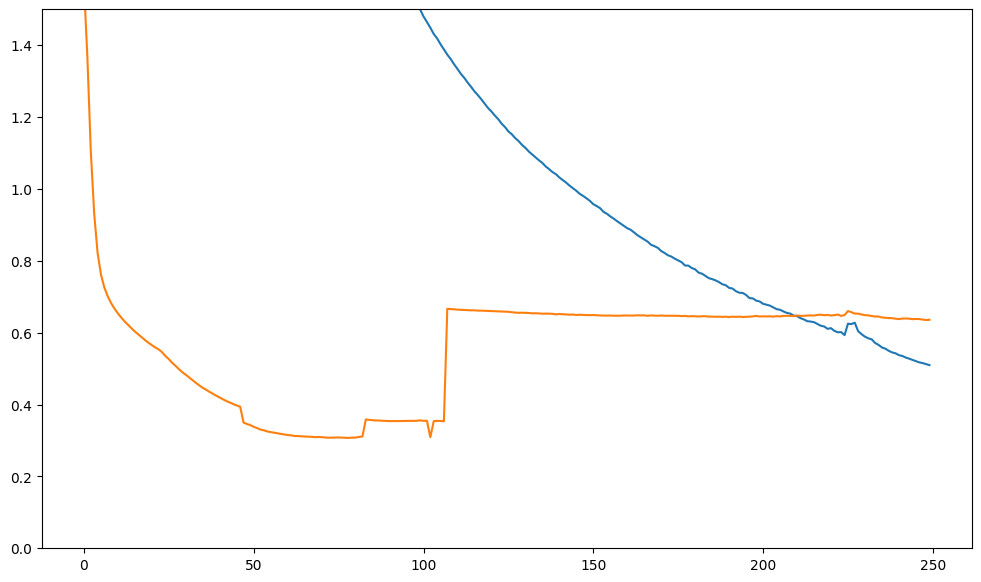

In [107]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

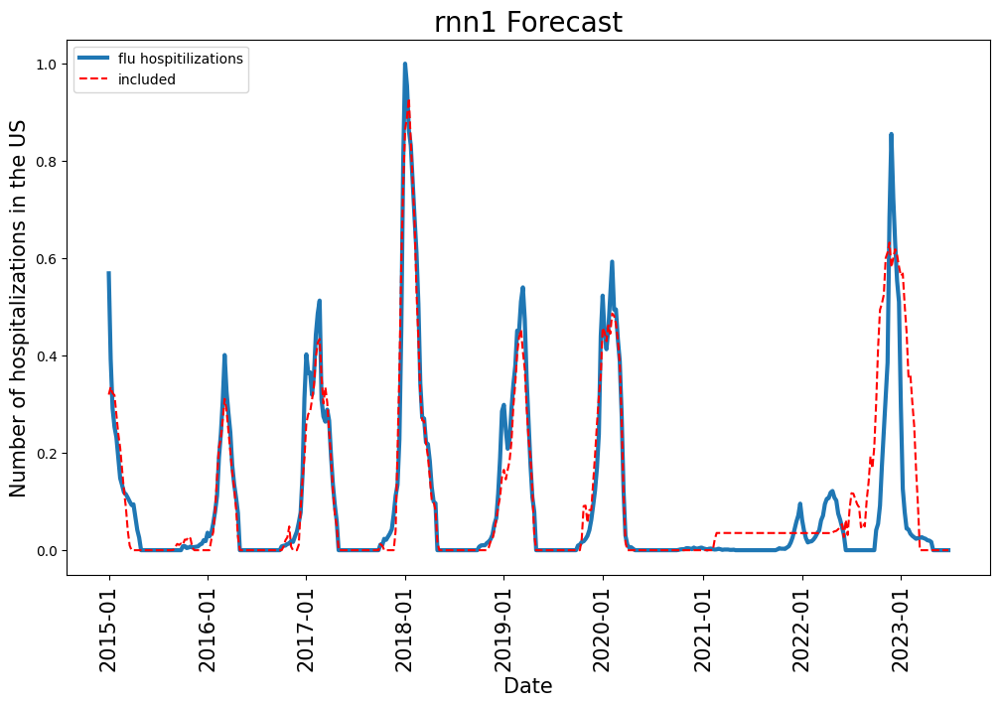

In [108]:
plot_model('2023-26')

### RNN Lin1

#### 22-23

In [110]:
device = torch.device("cpu")
model = rnn_lin1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'models/'+model.__class__.__name__+'_fcast_20_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(3)

In [111]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.799835495135827 Val loss: 1.680596230187629 Time: 0.36115491700002167
epoch 1 0 0
Train loss: 14.126790906305501 Val loss: 1.6387190500162514 Time: 0.3881102920004196
epoch 2 0 0
Train loss: 12.604683878518438 Val loss: 1.485637513395832 Time: 0.3476490000002741
epoch 3 0 0
Train loss: 10.015989835707671 Val loss: 1.2042415406227522 Time: 0.3448009160001675
epoch 4 0 0
Train loss: 7.5961363527971315 Val loss: 0.9653314377622536 Time: 0.37737970799935283
epoch 5 0 0
Train loss: 7.095914865942346 Val loss: 0.9196966449963795 Time: 0.34514791699984926
epoch 6 0 0
Train loss: 6.721440281868684 Val loss: 0.8850138460641238 Time: 0.34521079099977214
epoch 7 0 0
Train loss: 6.542867525524638 Val loss: 0.8777998244174726 Time: 0.34907654200014804
epoch 8 0 0
Train loss: 6.375256456859085 Val loss: 0.8617071973190576 Time: 0.3497302089999721
epoch 9 0 0
Train loss: 6.236518571386725 Val loss: 0.8430165701071095 Time: 0.3450135000002774
epoch 10 0 0
Train loss: 6.01347

(0.0, 1.5)

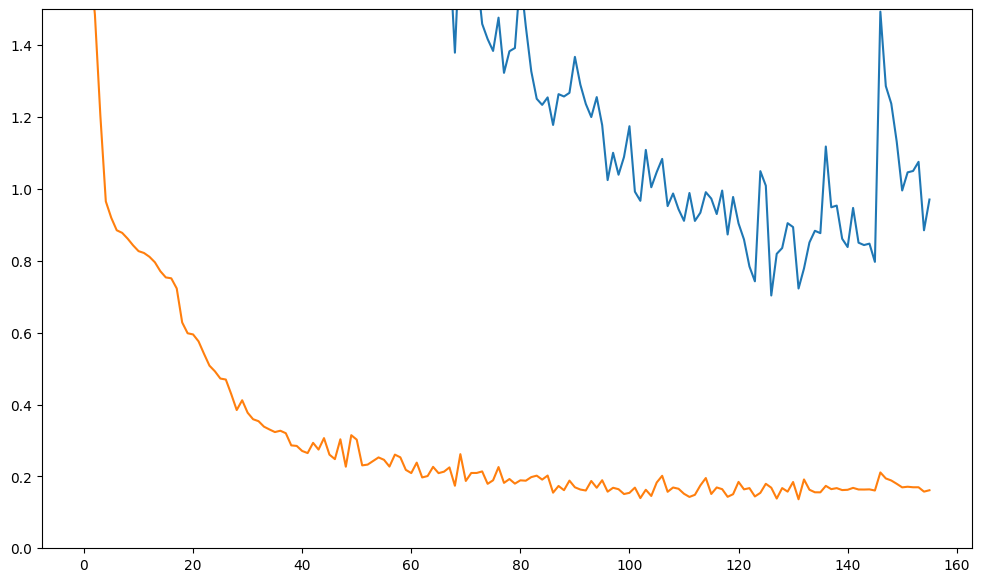

In [112]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

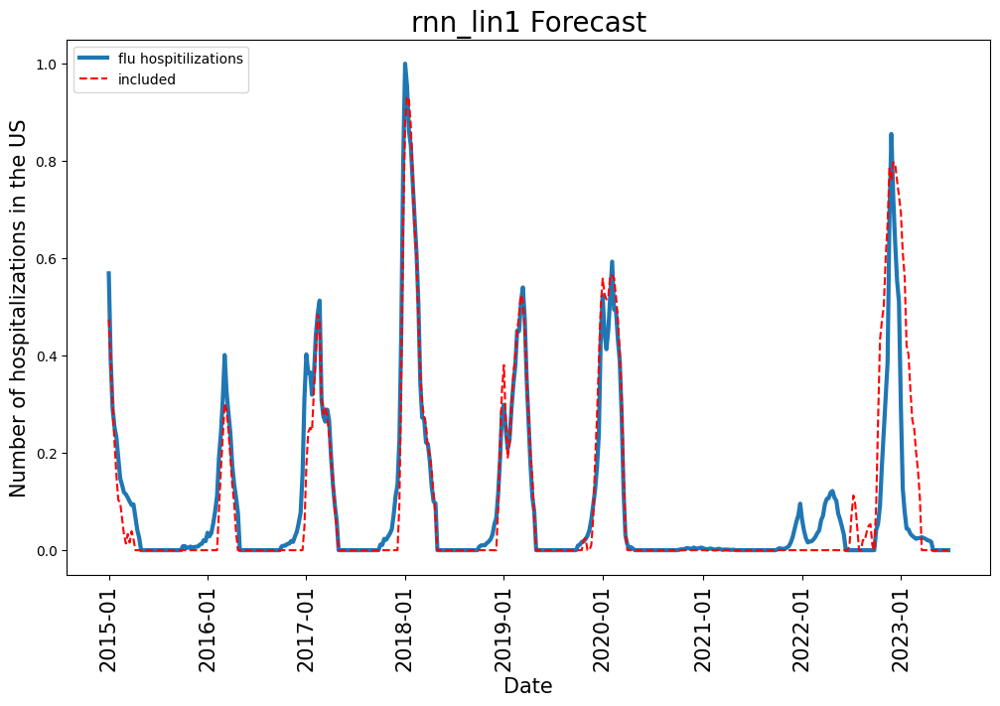

In [113]:
plot_model('2023-26')

### GRU

#### 22-23

In [116]:
device = torch.device("cpu")
model = gru(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'models/'+model.__class__.__name__+'_fcast_20_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(3)

In [117]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.85829969241729 Val loss: 1.6759317643183127 Time: 0.3562173330001315
epoch 1 0 0
Train loss: 14.021305714743432 Val loss: 1.5985124554990944 Time: 0.3466774170001372
epoch 2 0 0
Train loss: 13.408652782092787 Val loss: 1.5428345821489065 Time: 0.36016154199933226
epoch 3 0 0
Train loss: 12.16403488215047 Val loss: 1.414037390636489 Time: 0.3432285420003609
epoch 4 0 0
Train loss: 10.023520222202295 Val loss: 1.1912371544754539 Time: 0.3441549999997733
epoch 5 0 0
Train loss: 7.853993706812716 Val loss: 0.959858875777807 Time: 0.3871165000000474
epoch 6 0 0
Train loss: 6.925014469388427 Val loss: 0.8558992454286083 Time: 0.36535141700005624
epoch 7 0 0
Train loss: 6.667867713498647 Val loss: 0.8310881571560433 Time: 0.3600282910001624
epoch 8 0 0
Train loss: 6.4762171647579665 Val loss: 0.8077699628130469 Time: 0.35519037499943806
epoch 9 0 0
Train loss: 6.342903372671707 Val loss: 0.7912049619951368 Time: 0.3897963749996052
epoch 10 0 0
Train loss: 6.22277985

(0.0, 1.5)

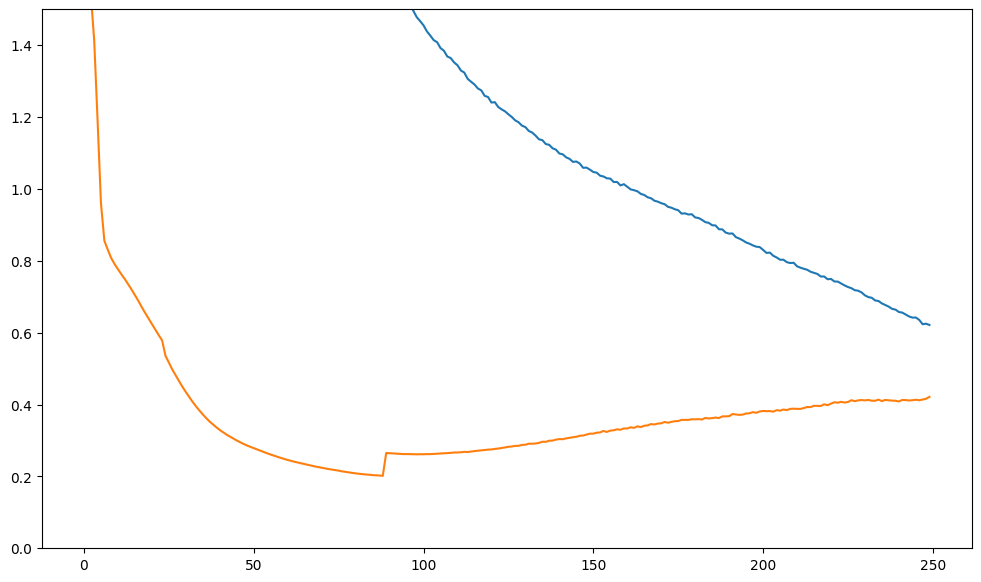

In [118]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

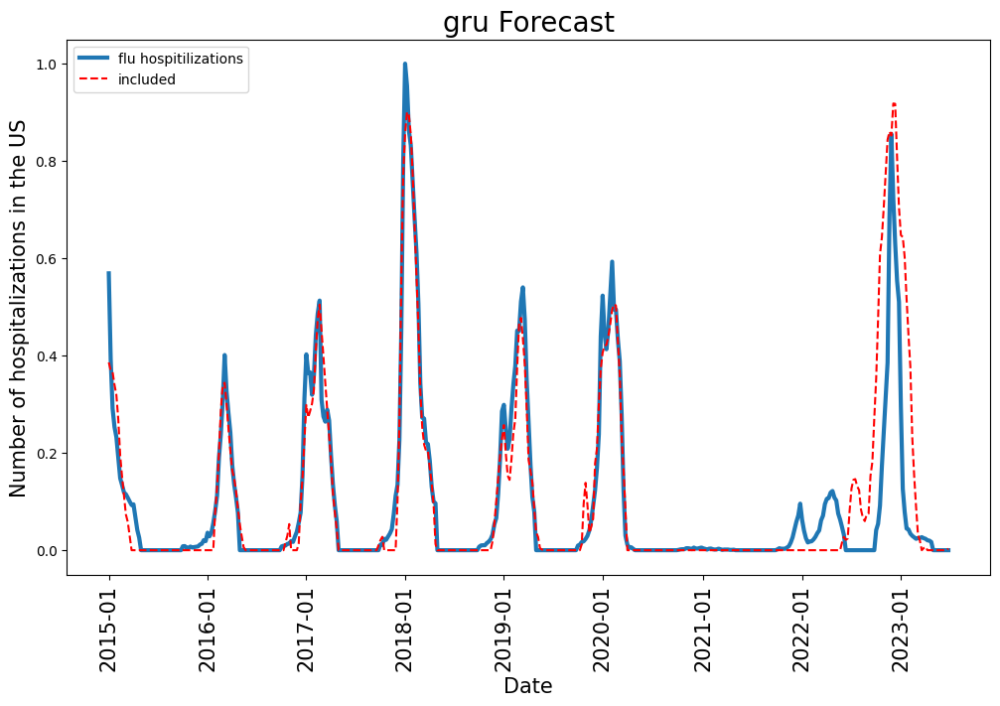

In [119]:
plot_model('2023-26')

### GRU1

#### 22-23

In [121]:
device = torch.device("cpu")
model = gru1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'models/'+model.__class__.__name__+'_fcast_20_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(3)

In [122]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 13.885153528335096 Val loss: 1.8037370595650235 Time: 0.4667490829997405
epoch 1 0 0
Train loss: 12.398090966813445 Val loss: 1.4450457089194233 Time: 0.22450908300015726
epoch 2 0 0
Train loss: 10.561769226209826 Val loss: 1.261794357035933 Time: 0.23963125000045693
epoch 3 0 0
Train loss: 8.698638601513835 Val loss: 1.0765361185026283 Time: 0.22888733299987507
epoch 4 0 0
Train loss: 7.305703710904254 Val loss: 0.9348574029249312 Time: 0.22064558400052192
epoch 5 0 0
Train loss: 6.472047029889325 Val loss: 0.8491959243104803 Time: 0.23761649999960355
epoch 6 0 0
Train loss: 6.069636686555313 Val loss: 0.8063102559672056 Time: 0.2313083330000154
epoch 7 0 0
Train loss: 5.8252896120982385 Val loss: 0.7274727553523523 Time: 0.25993937499970343
epoch 8 0 0
Train loss: 5.646720850163987 Val loss: 0.7062030149531122 Time: 0.23347933300010482
epoch 9 0 0
Train loss: 5.497926717579048 Val loss: 0.6883526806880064 Time: 0.22618224999951053
epoch 10 0 0
Train loss: 5.36

(0.0, 1.5)

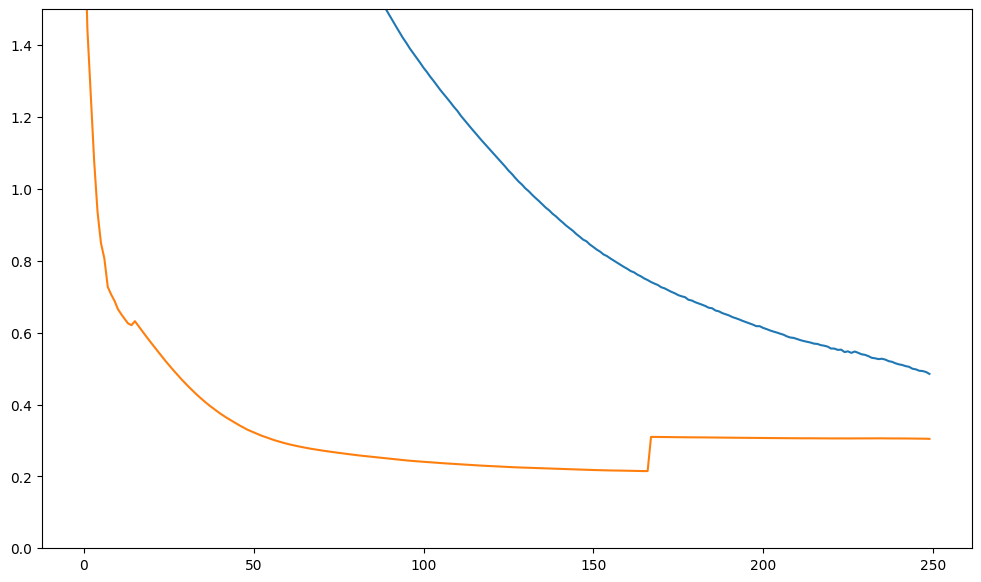

In [123]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

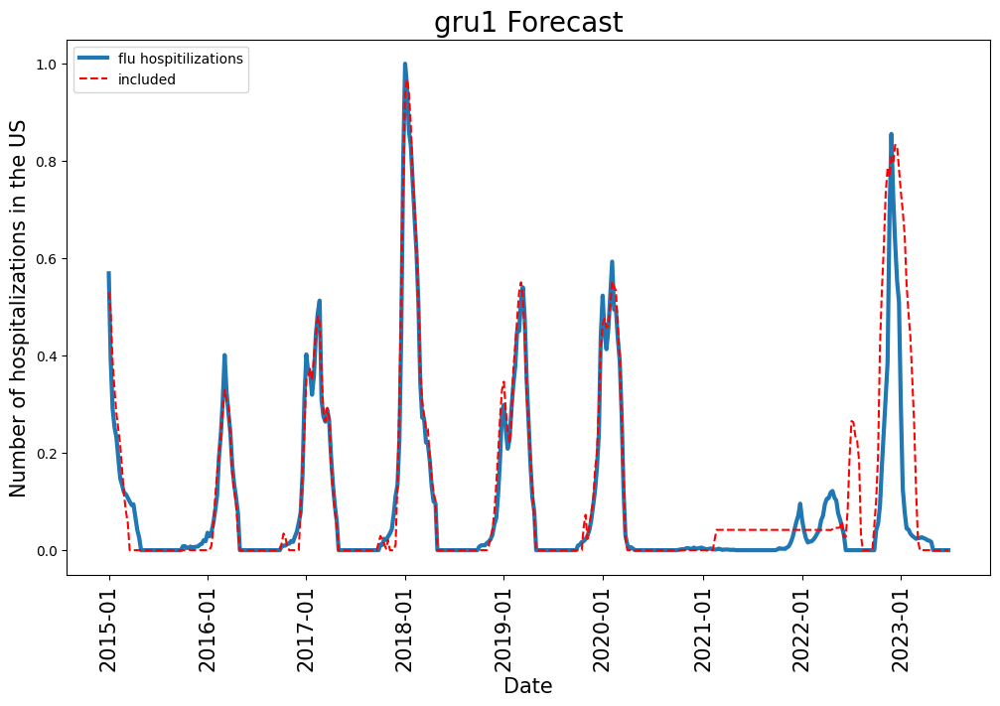

In [124]:
plot_model('2023-26')

### GRU Lin1

#### 22-23

In [126]:
device = torch.device("cpu")
model = gru_lin1(26,5).to(device)
#LOAD_PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_train.pth'
#PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'_new_22-23.pth'
PATH =  'models/'+model.__class__.__name__+'_fcast_20_new_22-23.pth'



loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(3)

In [127]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.455926110857604 Val loss: 1.6673045425988062 Time: 0.4737955829996281
epoch 1 0 0
Train loss: 14.347956541544136 Val loss: 1.6550267417090287 Time: 0.46970254200005
epoch 2 0 0
Train loss: 13.782714137119063 Val loss: 1.6067487550903619 Time: 0.49317291600073077
epoch 3 0 0
Train loss: 11.958371987808945 Val loss: 1.3809202559718232 Time: 0.5301447499996357
epoch 4 0 0
Train loss: 8.82543552809021 Val loss: 1.0275509999181636 Time: 0.5047146659999271
epoch 5 0 0
Train loss: 7.001653328971059 Val loss: 0.8375505091663016 Time: 0.5334312080003656
epoch 6 0 0
Train loss: 6.527256812205499 Val loss: 0.7868559274891133 Time: 0.46635712499937654
epoch 7 0 0
Train loss: 6.294930757822115 Val loss: 0.7584428199939534 Time: 0.46980583399999887
epoch 8 0 0
Train loss: 6.083595907039296 Val loss: 0.7328351477317991 Time: 0.46651783299967065
epoch 9 0 0
Train loss: 5.88546049970455 Val loss: 0.7153960183442724 Time: 0.4532667500006937
epoch 10 0 0
Train loss: 5.718469589

(0.0, 1.5)

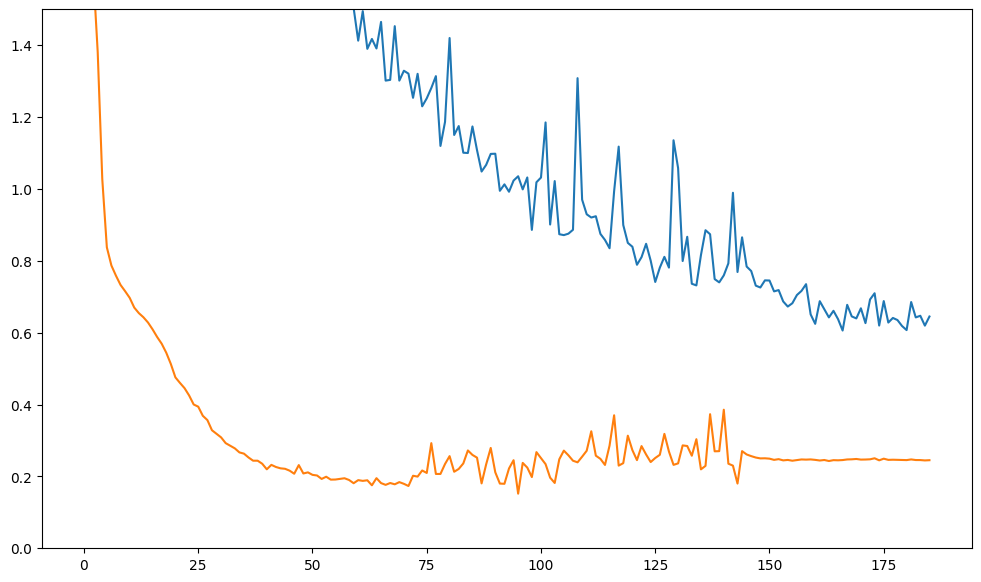

In [128]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

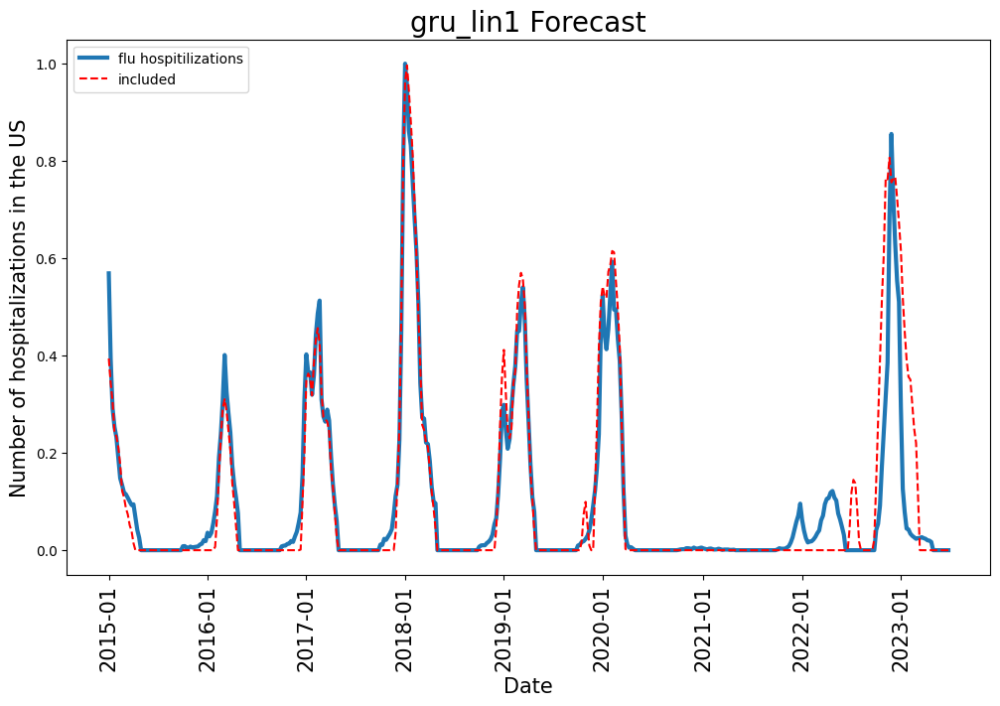

In [129]:
plot_model('2023-26')

### Summary

#### 22-23

rnn
rnn_lin1
gru1
gru_lin1
lstm
lstm1
lstm_lin1


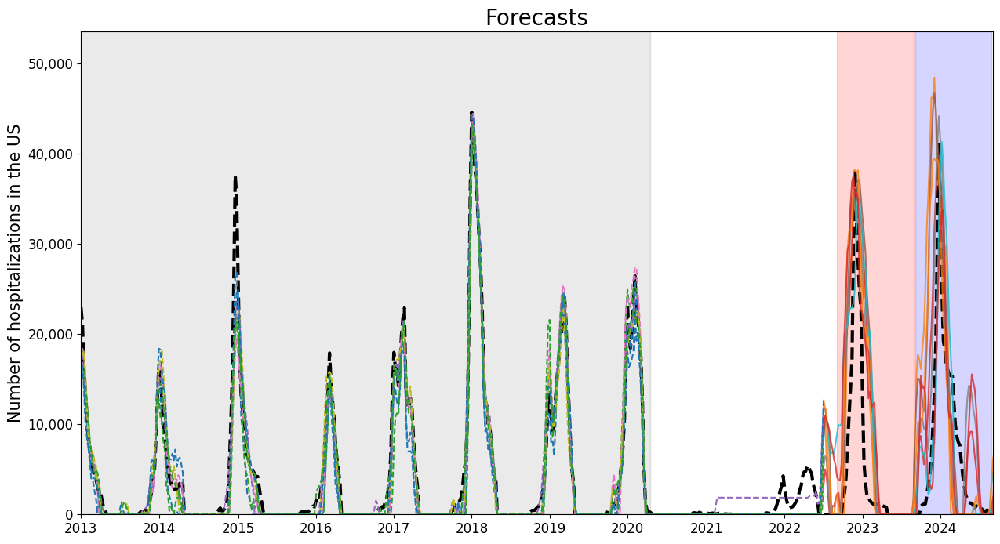

In [134]:
# plot all models
plot_df = pd.DataFrame(data=usa_infall_norm.values,columns = ['INF_ALL'],index=usa_infall_norm.index)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batched_sequence = data_in
fig, ax = plt.subplots(figsize=(15,8))
ax.plot(max_*plot_df["INF_ALL"].loc['2013-01':],linewidth=3,color='black',linestyle='dashed')
for model in model_list:
    model = model.to(device)
    print(model.__class__.__name__)

    MODEL_PATH = 'models/'+model.__class__.__name__+'_fcast_20_new_22-23_val.pth'
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

    
    plot_df[model.__class__.__name__] = pred

    #plt.rcParams['figure.figsize'] = (25, 12)

    
    #plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
    ax.plot(max_*plot_df[model.__class__.__name__].loc['2013-01':'2022-27'],linestyle="dashed")#,label=model.__class__.__name__+'(included)')
    ax.plot(max_*plot_df[model.__class__.__name__].loc['2022-27':],alpha=0.8,label=model.__class__.__name__)#label=model.__class__.__name__+'(prediction)',linewidth=1)
    #plt.legend(loc='upper left')
    x_ticks=['2013-01','2014-01','2015-01','2016-01','2017-01','2018-01','2019-01','2020-01','2021-01','2022-01','2023-01','2024-01']
    labels = ['2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023','2024']

    plt.xlim(['2013-01','2024-36'])

    ax.axvspan('2013-01', '2020-16', color='gray', alpha=0.025)
    ax.axvspan('2022-36', '2023-35', color='red', alpha=0.025)
    ax.axvspan('2023-36', '2024-35', color='blue', alpha=0.025)
    ax.set_ylim([0,1.2*max_])
    ax.set_xticks(ticks = x_ticks,labels=labels,size=12)

    #ax.set_yticks(size=12)
    ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.tick_params(axis='y', labelsize=12)
    ax.set_title('Forecasts',size =20)
    ax.set_ylabel('Number of hospitalizations in the US',fontsize=15)
    #plt.xlabel('Date',size=15)

## 23

In [164]:
data_in = Dataset_(df["INF_ALL"],df.drop(['key_0','INF_ALL','season'],axis=1),26,26+22)

(788,)


In [224]:
device = torch.device("cpu")

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 5e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(4)

### 22-23

#### LSTM

In [174]:
model = lstm(26,5).to(device)
PATH =  'models/'+model.__class__.__name__+'_fcast_23_new_22-23.pth'

In [175]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.605056687780902 Val loss: 1.7185331731106972 Time: 0.44046316699950694
epoch 1 0 0
Train loss: 14.479665785839096 Val loss: 1.789351402170309 Time: 0.4645152089997282
epoch 2 1 0
Train loss: 12.525421309326077 Val loss: 1.5203598633392277 Time: 0.46254183299970464
epoch 3 0 0
Train loss: 8.001320565231671 Val loss: 1.0435815640782546 Time: 0.5210278750000725
epoch 4 0 0
Train loss: 7.418718464529502 Val loss: 0.9936945217681897 Time: 0.4251370419997329
epoch 5 0 0
Train loss: 7.271023821835357 Val loss: 0.9787528595107918 Time: 0.4384841660003076
epoch 6 0 0
Train loss: 7.150023556923729 Val loss: 0.9690116811527966 Time: 0.4038086669997938
epoch 7 0 0
Train loss: 6.903025209445125 Val loss: 0.938658162209175 Time: 0.4069042500004798
epoch 8 0 0
Train loss: 6.755368181879664 Val loss: 0.9215276169376329 Time: 0.40790779199960525
epoch 9 0 0
Train loss: 6.508783337598379 Val loss: 0.8930670230938156 Time: 0.40505974999996397
epoch 10 0 0
Train loss: 6.30107700

(0.0, 1.5)

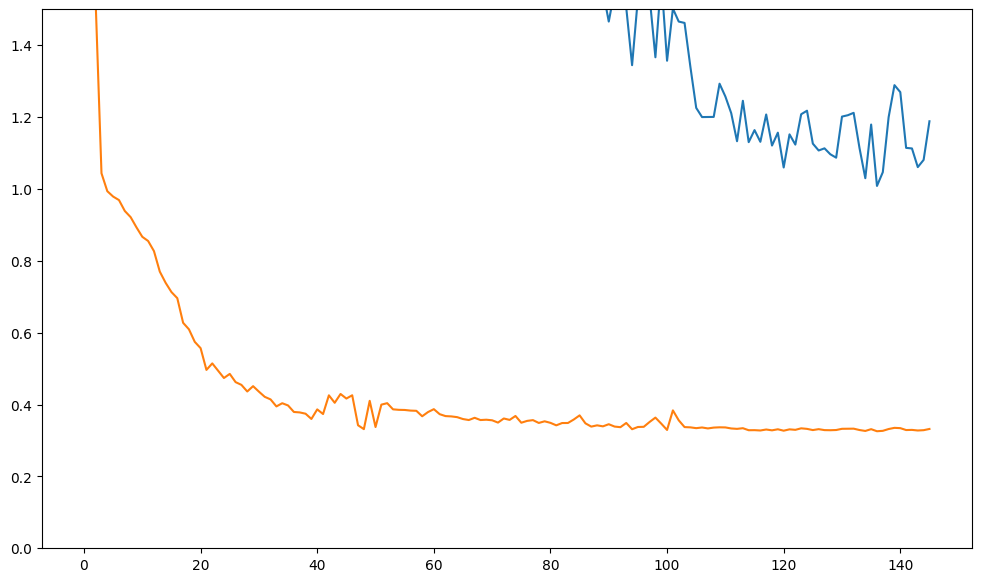

In [176]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

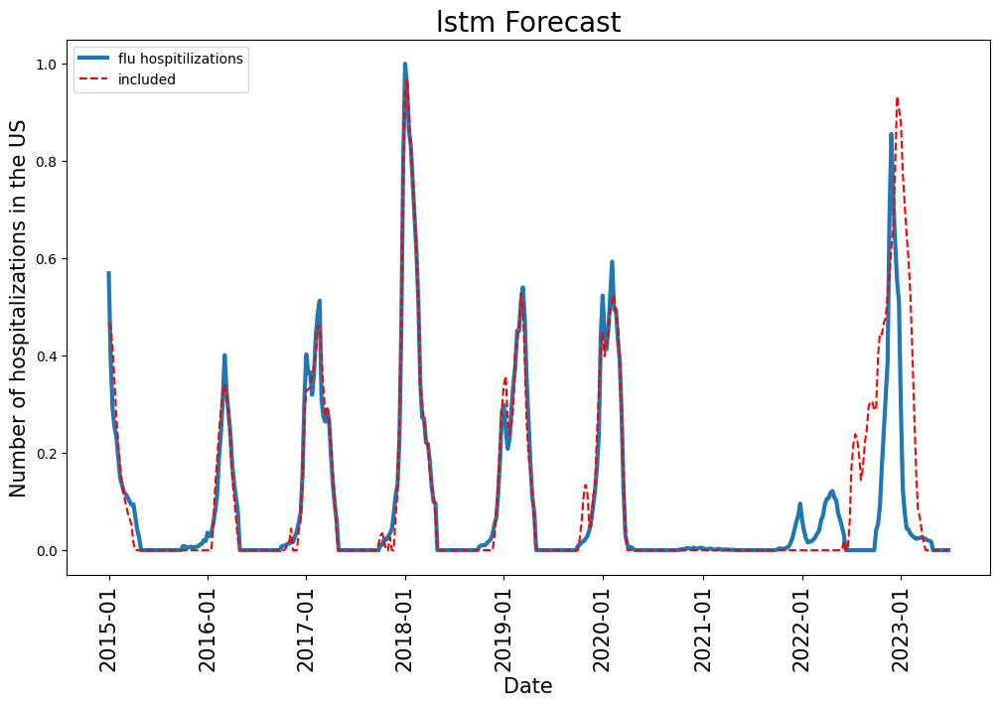

In [177]:
plot_model('2023-26')

#### LSTM1

In [196]:
model = lstm1(26,5).to(device)
PATH =  'models/'+model.__class__.__name__+'_fcast_23_new_22-23.pth'

In [197]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 13.85472182238027 Val loss: 1.6024376081447724 Time: 0.3082119999999122
epoch 1 0 0
Train loss: 12.124721708888842 Val loss: 1.4294299356631446 Time: 0.2651008330003606
epoch 2 0 0
Train loss: 10.533733795682963 Val loss: 1.2684539630151201 Time: 0.27839262500037876
epoch 3 0 0
Train loss: 9.001541905968821 Val loss: 1.113902190729144 Time: 0.28738145800070924
epoch 4 0 0
Train loss: 7.797109114679188 Val loss: 1.0259928087186225 Time: 0.28257770799973514
epoch 5 0 0
Train loss: 7.03583342714564 Val loss: 0.9492044447058502 Time: 0.27239512500000274
epoch 6 0 0
Train loss: 6.618142574659828 Val loss: 0.9046988916097307 Time: 0.2667424999999639
epoch 7 0 0
Train loss: 6.383217473215666 Val loss: 0.8786856892855949 Time: 0.318491209000058
epoch 8 0 0
Train loss: 6.235569090205729 Val loss: 0.86233324753147 Time: 0.26743408299989824
epoch 9 0 0
Train loss: 6.128678244200103 Val loss: 0.8509106159799554 Time: 0.27391795800031105
epoch 10 0 0
Train loss: 6.0404771980

(0.0, 1.5)

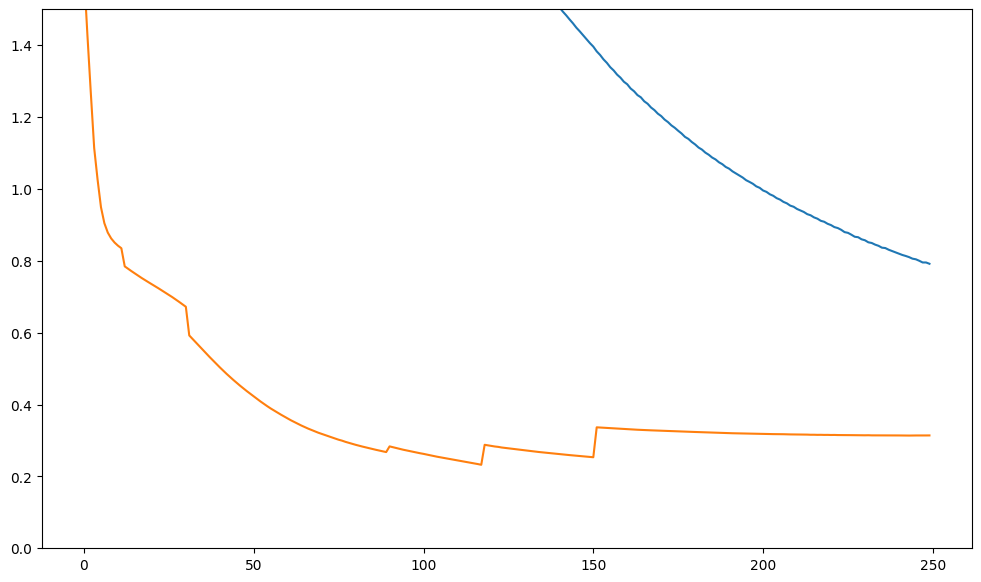

In [198]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

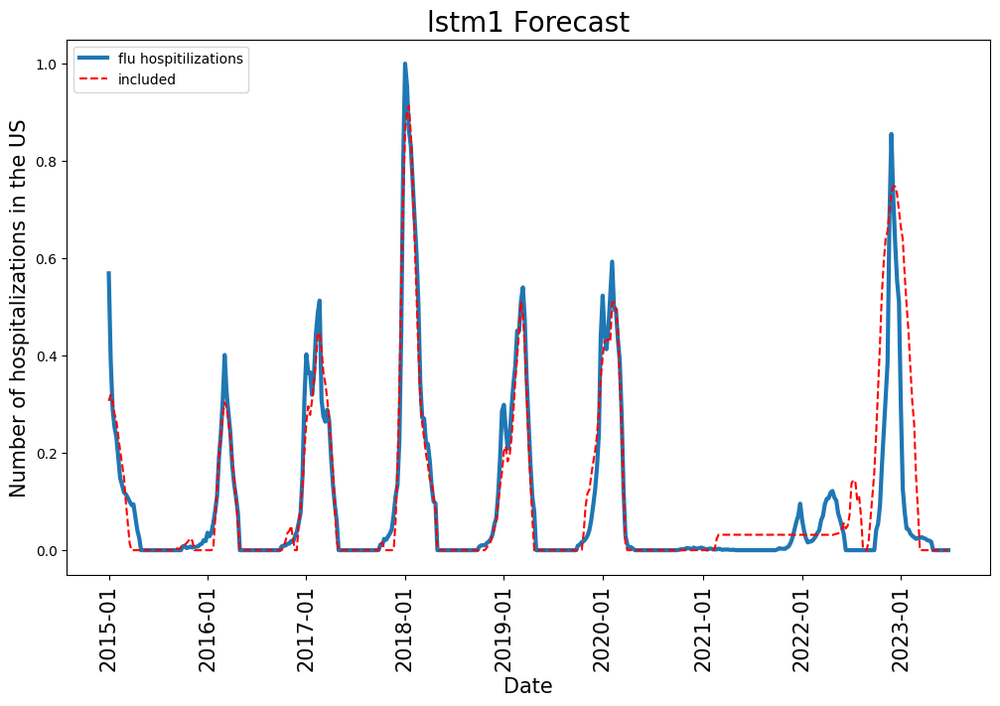

In [199]:
plot_model('2023-26')

#### LSTM Lin1

In [200]:
model = lstm_lin1(26,5).to(device)
PATH =  'models/'+model.__class__.__name__+'_fcast_23_new_22-23.pth'

In [201]:
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.884477799361946 Val loss: 1.731042229129699 Time: 0.47468962499988265
epoch 1 0 0
Train loss: 14.487602787780565 Val loss: 1.6905588841490946 Time: 0.46049875000062457
epoch 2 0 0
Train loss: 14.164593507128671 Val loss: 1.6399460737068514 Time: 0.45163866599978064
epoch 3 0 0
Train loss: 13.68825200521485 Val loss: 1.5927917980506023 Time: 0.46501987499959796
epoch 4 0 0
Train loss: 12.233935665056379 Val loss: 1.44634025960965 Time: 0.47126262499932636
epoch 5 0 0
Train loss: 9.240593592216669 Val loss: 1.133961120093461 Time: 0.4693599580004957
epoch 6 0 0
Train loss: 7.338677503416103 Val loss: 0.9472766972330611 Time: 0.4497700000001714
epoch 7 0 0
Train loss: 7.0154346163575525 Val loss: 0.9137932863010072 Time: 0.4507366669995463
epoch 8 0 0
Train loss: 6.770468018041441 Val loss: 0.8880618727507202 Time: 0.4434763750005004
epoch 9 0 0
Train loss: 6.5808417961211205 Val loss: 0.8618264996110575 Time: 0.45357345799948234
epoch 10 0 0
Train loss: 6.57716

(0.0, 1.5)

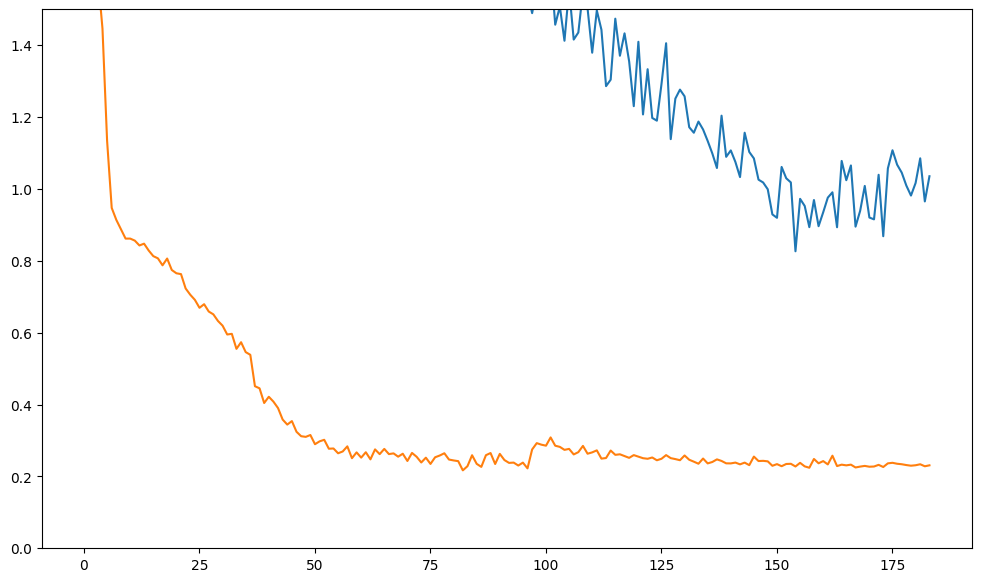

In [202]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

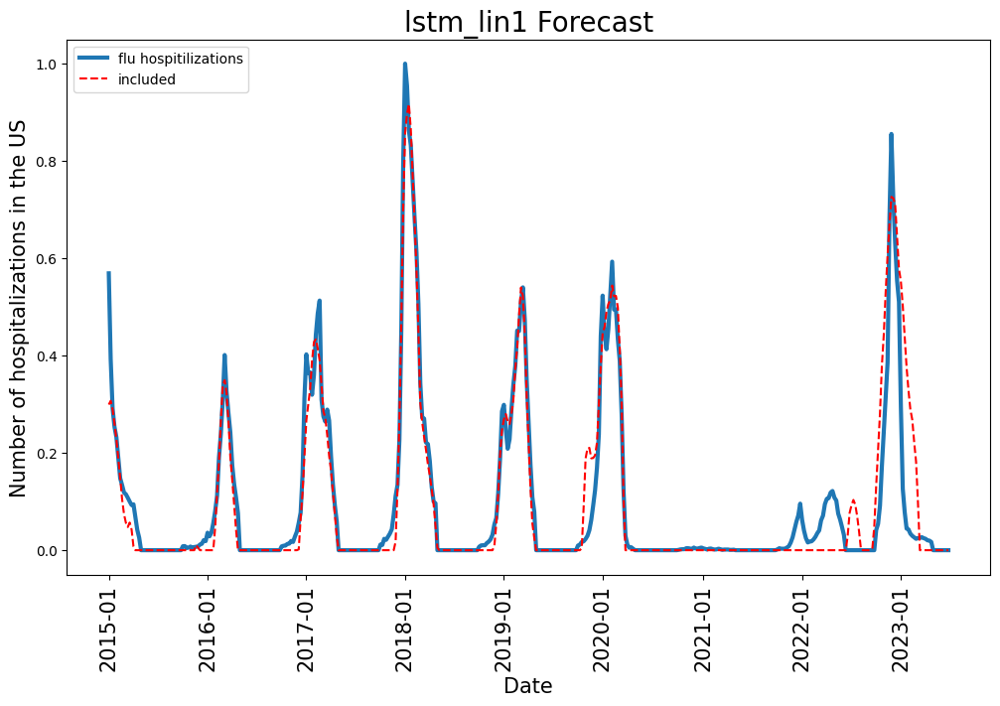

In [203]:
plot_model('2023-26')

#### RNN

In [204]:
model = rnn(26,5).to(device)
PATH =  'models/'+model.__class__.__name__+'_fcast_23_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.364681928404956 Val loss: 1.7365596699906356 Time: 0.30066508399977465
epoch 1 0 0
Train loss: 12.997637564177595 Val loss: 1.507477549844651 Time: 0.2767475000000559
epoch 2 0 0
Train loss: 10.908193875720947 Val loss: 1.2877553503999648 Time: 0.2990152499996839
epoch 3 0 0
Train loss: 7.95480516369666 Val loss: 0.9666493124504472 Time: 0.27219295800023247
epoch 4 0 0
Train loss: 6.309829092426684 Val loss: 0.8030878623713625 Time: 0.2732886249996227
epoch 5 0 0
Train loss: 5.833240801538949 Val loss: 0.7532798578439177 Time: 0.2725213329995313
epoch 6 0 0
Train loss: 5.659661693602445 Val loss: 0.7321810238074473 Time: 0.3243910000001051
epoch 7 0 0
Train loss: 5.535938193735959 Val loss: 0.716728614623049 Time: 0.2720909580002626
epoch 8 0 0
Train loss: 5.404697942633042 Val loss: 0.702639445234518 Time: 0.27539045800040185
epoch 9 0 0
Train loss: 5.278517560059271 Val loss: 0.6889142434266629 Time: 0.27540262500042445
epoch 10 0 0
Train loss: 5.1642576213

(0.0, 1.5)

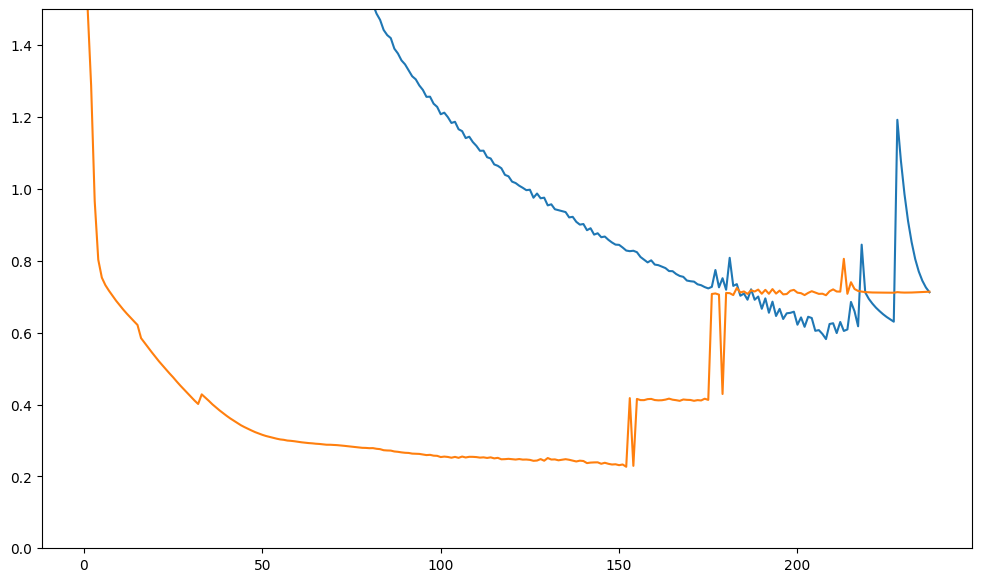

In [205]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])

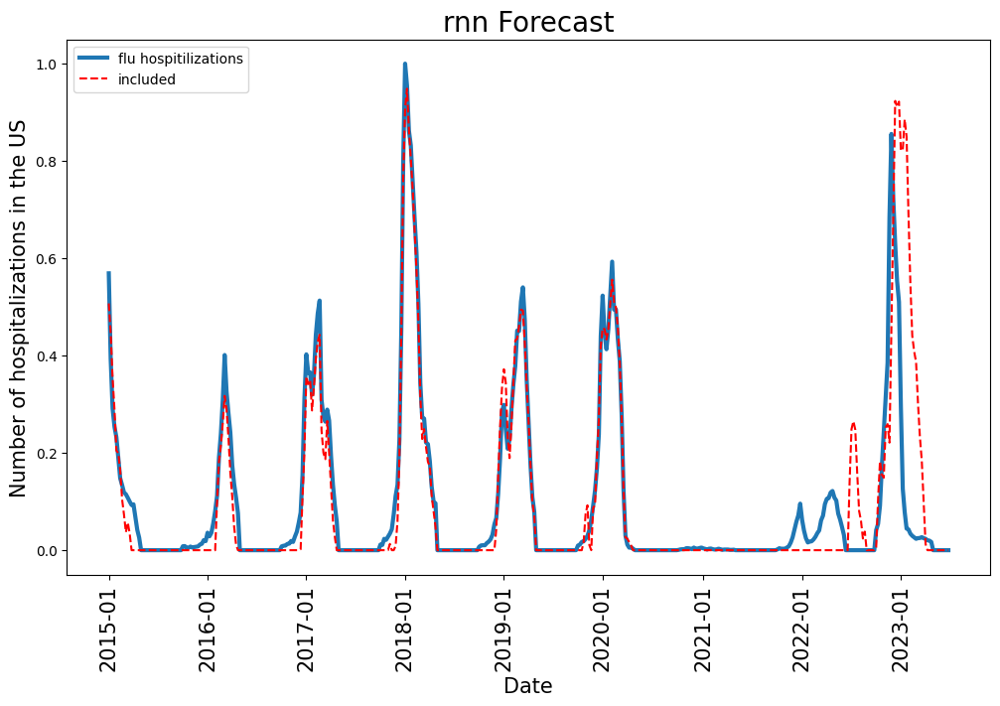

In [206]:
plot_model('2023-26')

#### RNN1

In [211]:
model = rnn1(26,5).to(device)
PATH =  'models/'+model.__class__.__name__+'_fcast_23_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 14.254840605519224 Val loss: 1.6518466382713477 Time: 0.21352995800043573
epoch 1 0 0
Train loss: 11.237637266963986 Val loss: 1.317877683508038 Time: 0.2318189590005204
epoch 2 0 0
Train loss: 8.87660865070552 Val loss: 1.0868238368254604 Time: 0.1777611670004262
epoch 3 0 0
Train loss: 7.217302537722453 Val loss: 0.920702408602264 Time: 0.17451033299948904
epoch 4 0 0
Train loss: 6.326438485081017 Val loss: 0.8241083450555685 Time: 0.2340793749990553
epoch 5 0 0
Train loss: 5.863186967610009 Val loss: 0.769966948187393 Time: 0.21092145900001924
epoch 6 0 0
Train loss: 5.597643085087171 Val loss: 0.7437460465576342 Time: 0.19069795799987332
epoch 7 0 0
Train loss: 5.367950862772243 Val loss: 0.720605704584294 Time: 0.18685679100053676
epoch 8 0 0
Train loss: 5.1893765618997705 Val loss: 0.7011920528016817 Time: 0.17822400000113703
epoch 9 0 0
Train loss: 5.041133754115137 Val loss: 0.6863041075732995 Time: 0.18355870800041885
epoch 10 0 0
Train loss: 4.90645783

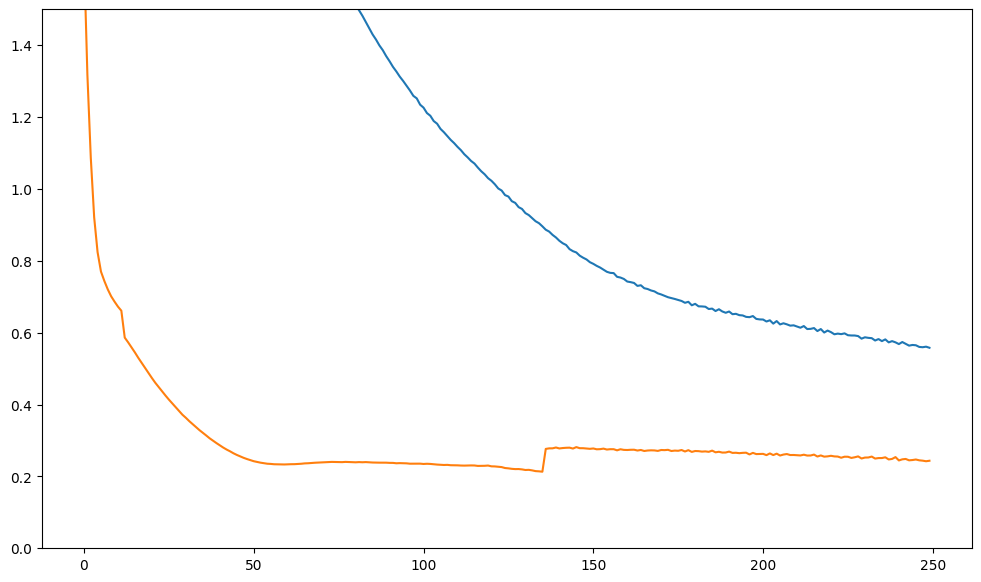

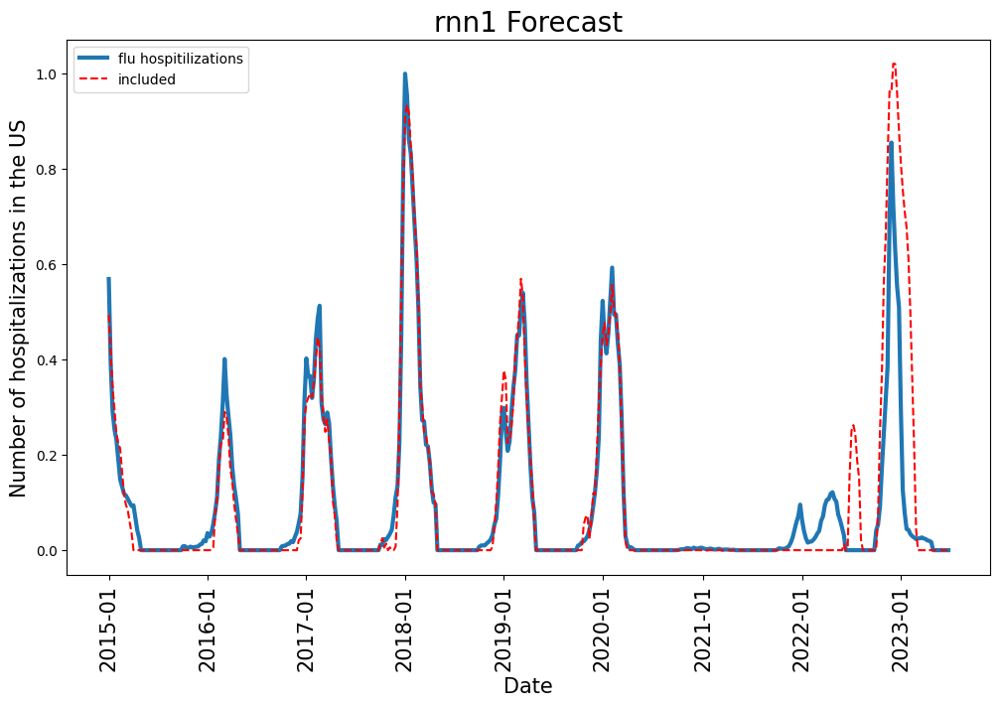

In [212]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,1.5])
plt.show()
plot_model('2023-26')

#### RNN Lin1

In [214]:
model = rnn_lin1(26,5).to(device)
PATH =  'models/'+model.__class__.__name__+'_fcast_23_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

epoch 0 0 0
Train loss: 15.079974847650291 Val loss: 1.7448210317588764 Time: 0.45012150000002293
epoch 1 0 0
Train loss: 13.097551420835543 Val loss: 1.57858059810339 Time: 0.41227812499892025
epoch 2 0 0
Train loss: 9.412193862120574 Val loss: 1.126487129397875 Time: 0.42254441600016435
epoch 3 0 0
Train loss: 7.209703222591642 Val loss: 0.9155595477654488 Time: 0.39734258400130784
epoch 4 0 0
Train loss: 6.718103891601231 Val loss: 0.8819441205037714 Time: 0.3749370840014308
epoch 5 0 0
Train loss: 6.293575724870038 Val loss: 0.8448273079195933 Time: 0.4373324579992186
epoch 6 0 0
Train loss: 6.12401470224572 Val loss: 0.8426333915411337 Time: 0.4282505000010133
epoch 7 0 0
Train loss: 6.161251631525125 Val loss: 0.8272709082163557 Time: 0.42194062500129803
epoch 8 0 1
Train loss: 5.836927623073194 Val loss: 0.8080044350668768 Time: 0.3948583330002293
epoch 9 0 0
Train loss: 5.697682919883585 Val loss: 0.7926426120196789 Time: 0.39142250000077183
epoch 10 0 0
Train loss: 5.447542182

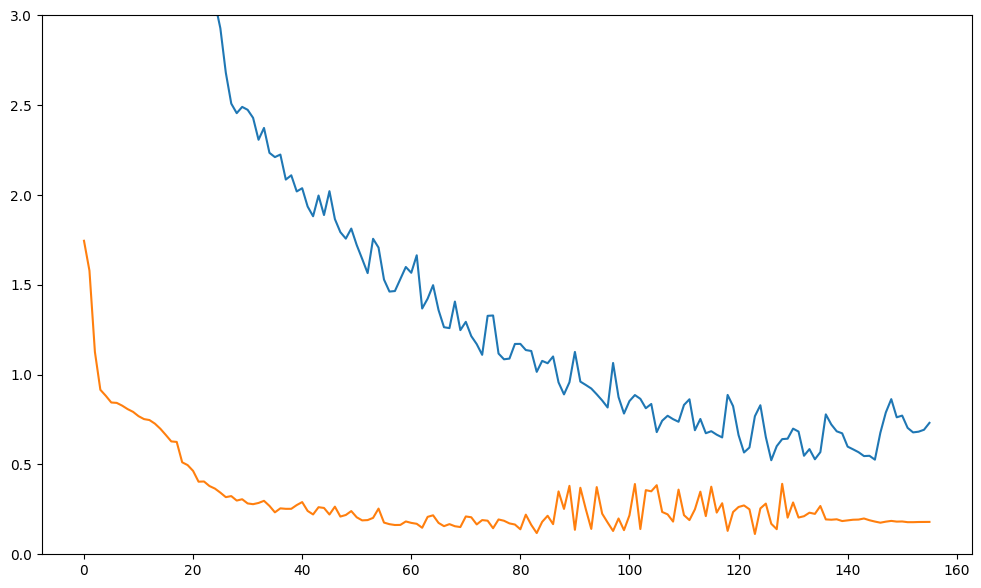

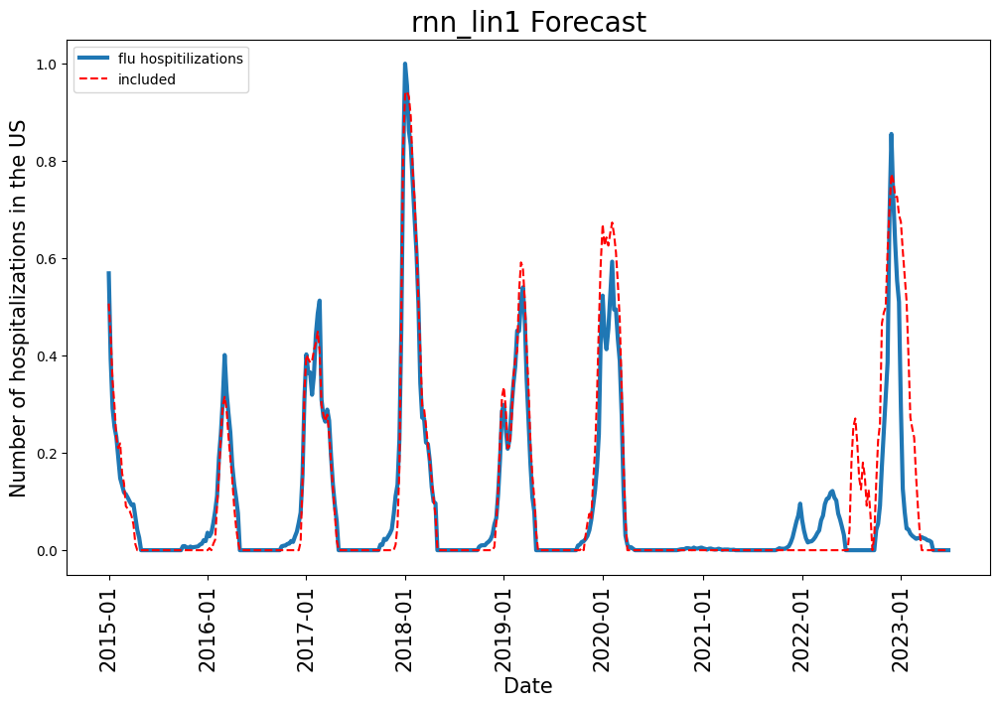

In [215]:
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### GRU

epoch 0 0 0
Train loss: 14.810966039917162 Val loss: 1.7437436721327209 Time: 0.4019166250000126
epoch 1 0 0
Train loss: 13.907833891916084 Val loss: 1.6642324579959857 Time: 0.3570846670008905
epoch 2 0 0
Train loss: 13.258138508723995 Val loss: 1.5999405340398 Time: 0.365887208001368
epoch 3 0 0
Train loss: 11.828279461522321 Val loss: 1.4091105234671553 Time: 0.3484969170003751
epoch 4 0 0
Train loss: 9.496749292257547 Val loss: 1.1660413009792514 Time: 0.3383465000006254
epoch 5 0 0
Train loss: 7.519052600206017 Val loss: 0.9656455744913928 Time: 0.3395847080009844
epoch 6 0 0
Train loss: 6.814446442615253 Val loss: 0.8880216618867528 Time: 0.3390002500000264
epoch 7 0 0
Train loss: 6.598138715358115 Val loss: 0.8603919849805974 Time: 0.3344539589998021
epoch 8 0 0
Train loss: 6.4998177078824995 Val loss: 0.8569230868701511 Time: 0.33727770899895404
epoch 9 0 0
Train loss: 6.393359183481266 Val loss: 0.8439313648645452 Time: 0.34452295799928834
epoch 10 0 0
Train loss: 6.3013903529

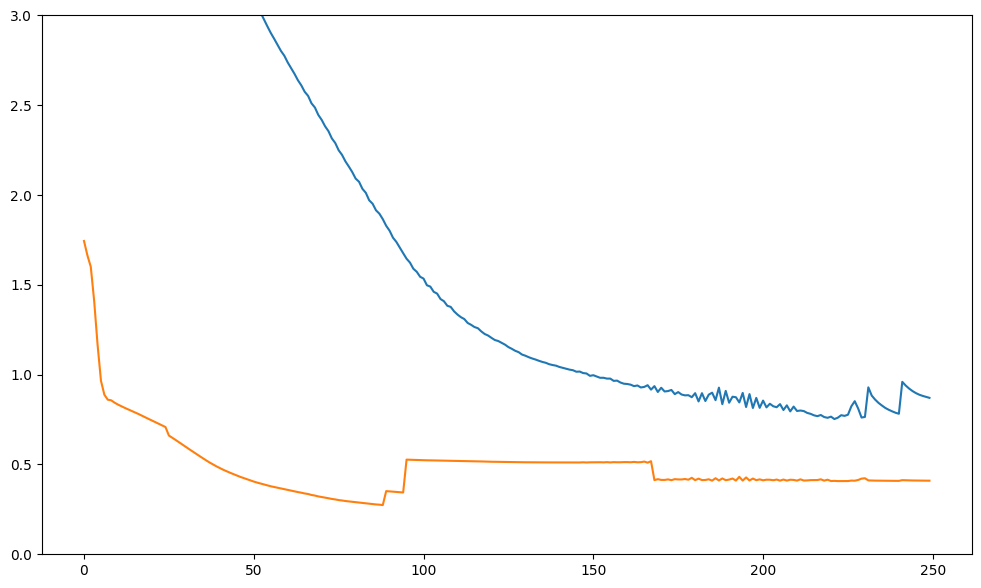

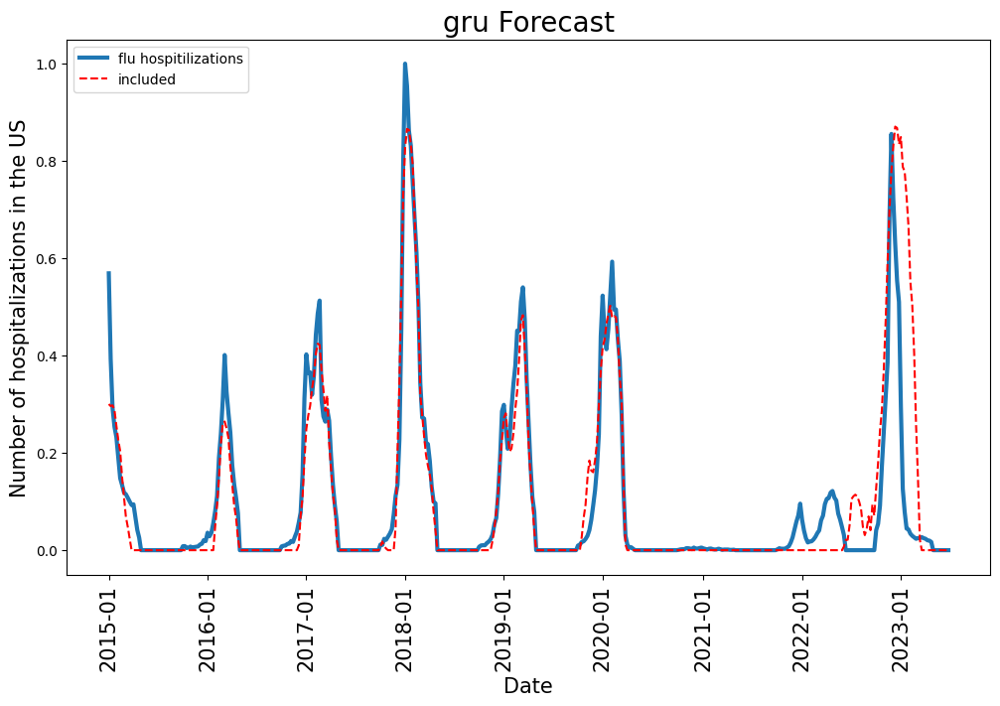

In [219]:
model = gru(26,5).to(device)
PATH =  'models/'+model.__class__.__name__+'_fcast_23_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### GRU1

epoch 0 0 0
Train loss: 10.707894609381583 Val loss: 1.1809913268218433 Time: 0.24146737499904702
epoch 1 0 0
Train loss: 6.26278484824039 Val loss: 0.7499388660388632 Time: 0.2130518750000192
epoch 2 0 0
Train loss: 5.743299758683065 Val loss: 0.7026896258798357 Time: 0.22466416700081027
epoch 3 0 0
Train loss: 5.401471915923963 Val loss: 0.663133535018634 Time: 0.21257429100114678
epoch 4 0 0
Train loss: 5.061502321580903 Val loss: 0.6204204171559502 Time: 0.21643570800006273
epoch 5 0 0
Train loss: 4.715669645310925 Val loss: 0.5739763177790647 Time: 0.21724904099937703
epoch 6 0 0
Train loss: 4.375477209885517 Val loss: 0.528175371162812 Time: 0.2166342500004248
epoch 7 0 0
Train loss: 4.073384141972868 Val loss: 0.49293783569156724 Time: 0.21321908299978531
epoch 8 0 0
Train loss: 3.7940501664401722 Val loss: 0.44414076323507873 Time: 0.2162343330001022
epoch 9 0 0
Train loss: 3.5562882807354583 Val loss: 0.4058728558930803 Time: 0.2177143339995382
epoch 10 0 0
Train loss: 3.36610

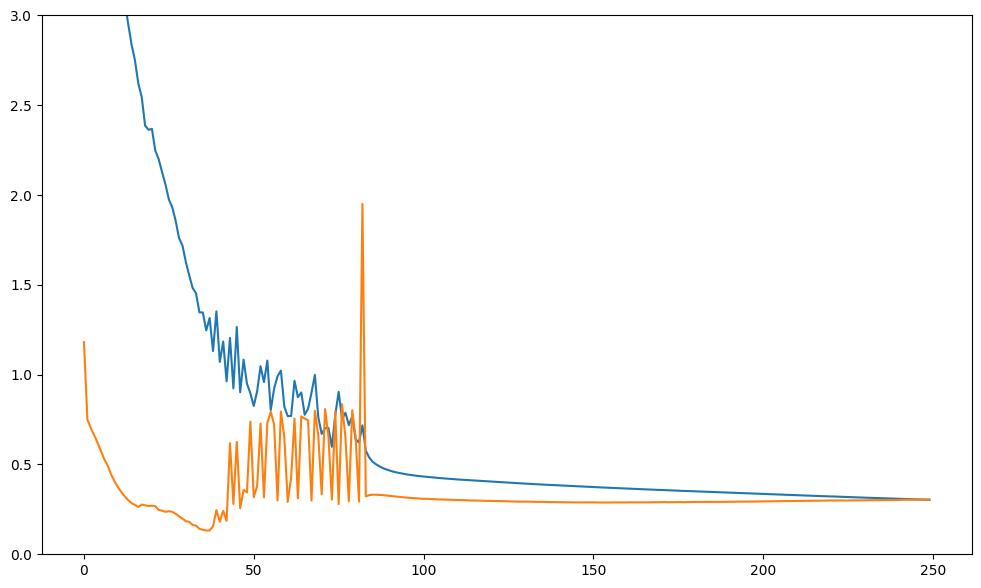

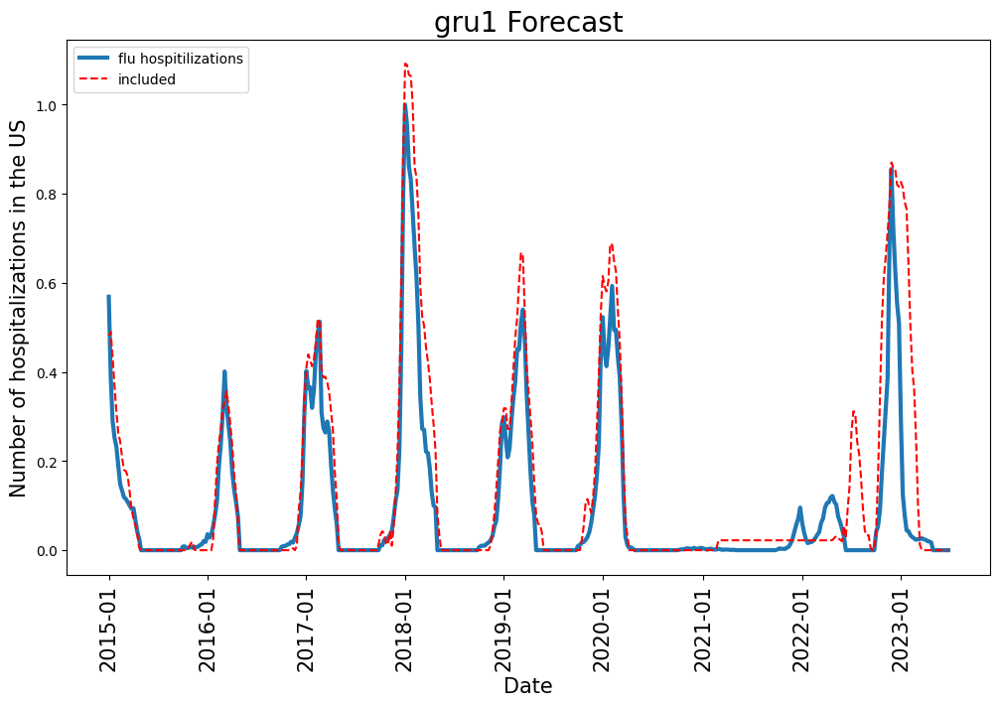

In [225]:
model = gru1(26,5).to(device)
PATH =  'models/'+model.__class__.__name__+'_fcast_23_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### GRU Lin1

epoch 0 0 0
Train loss: 15.493970738023743 Val loss: 1.7829200350093541 Time: 0.4938196250004694
epoch 1 0 0
Train loss: 12.821890521810374 Val loss: 1.3490839044493976 Time: 0.49891041699993366
epoch 2 0 0
Train loss: 17.551918723647418 Val loss: 2.8675171324997026 Time: 0.49171312500038766
epoch 3 1 1
Train loss: 18.214102080555335 Val loss: 2.908520438706417 Time: 0.491211624999778
epoch 4 2 2
Train loss: 16.312610965584696 Val loss: 1.664131726029524 Time: 0.45546083400040516
epoch 5 0 3
Train loss: 9.283655055989854 Val loss: 1.1011850174002895 Time: 0.44352450000042154
epoch 6 0 0
Train loss: 8.035888299573116 Val loss: 0.9911832402261456 Time: 0.5049134579985548
epoch 7 0 0
Train loss: 6.877795558294451 Val loss: 0.8762170610112959 Time: 0.4557388749999518
epoch 8 0 0
Train loss: 6.319584708259413 Val loss: 0.7676687616352512 Time: 0.45188162500016915
epoch 9 0 0
Train loss: 6.041671332924125 Val loss: 0.7925145192187206 Time: 0.46155491700119455
epoch 10 1 0
Train loss: 6.45636

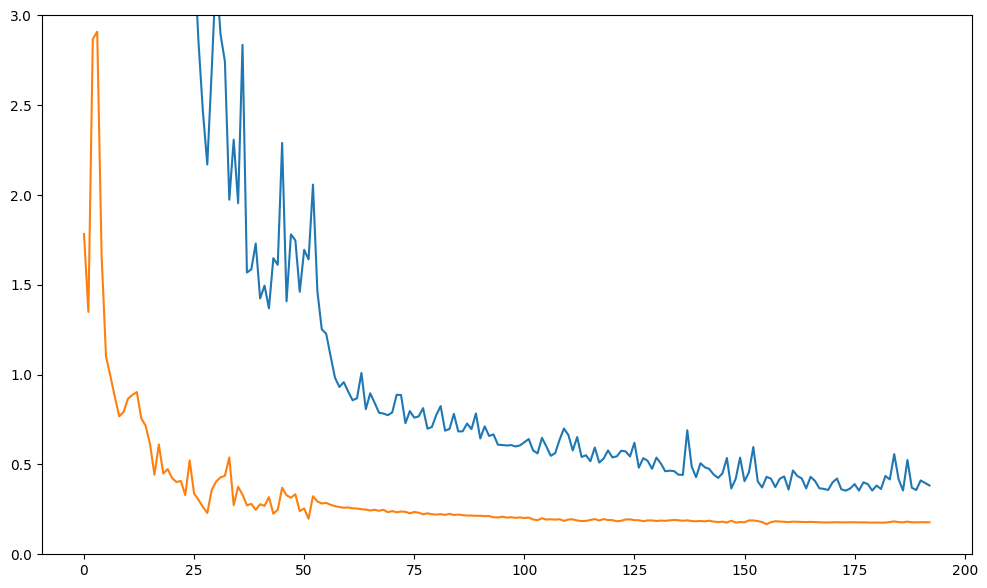

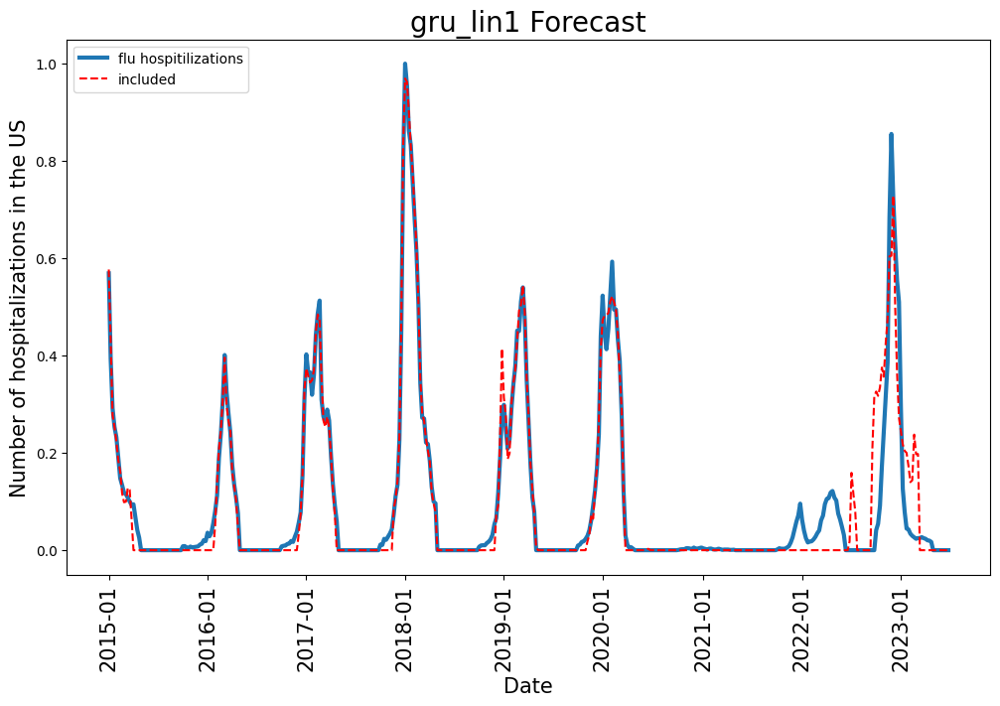

In [231]:
model = gru_lin1(26,5).to(device)
learn_rate = 1e-3
PATH =  'models/'+model.__class__.__name__+'_fcast_23_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### Summary

rnn
rnn_lin1
gru1
gru_lin1
lstm
lstm1
lstm_lin1


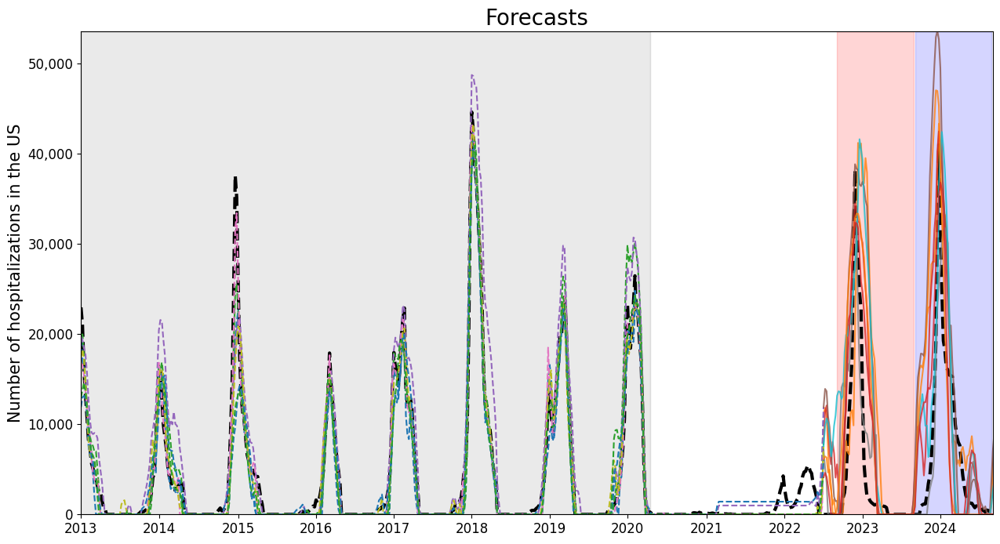

In [232]:
# plot all models
plot_df = pd.DataFrame(data=usa_infall_norm.values,columns = ['INF_ALL'],index=usa_infall_norm.index)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batched_sequence = data_in
fig, ax = plt.subplots(figsize=(15,8))
ax.plot(max_*plot_df["INF_ALL"].loc['2013-01':],linewidth=3,color='black',linestyle='dashed')
for model in model_list:
    model = model.to(device)
    print(model.__class__.__name__)

    MODEL_PATH = 'models/'+model.__class__.__name__+'_fcast_23_new_22-23_val.pth'
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

    
    plot_df[model.__class__.__name__] = pred

    #plt.rcParams['figure.figsize'] = (25, 12)

    
    #plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
    ax.plot(max_*plot_df[model.__class__.__name__].loc['2013-01':'2022-27'],linestyle="dashed")#,label=model.__class__.__name__+'(included)')
    ax.plot(max_*plot_df[model.__class__.__name__].loc['2022-27':],alpha=0.8,label=model.__class__.__name__)#label=model.__class__.__name__+'(prediction)',linewidth=1)
    #plt.legend(loc='upper left')
    x_ticks=['2013-01','2014-01','2015-01','2016-01','2017-01','2018-01','2019-01','2020-01','2021-01','2022-01','2023-01','2024-01']
    labels = ['2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023','2024']

    plt.xlim(['2013-01','2024-36'])

    ax.axvspan('2013-01', '2020-16', color='gray', alpha=0.025)
    ax.axvspan('2022-36', '2023-35', color='red', alpha=0.025)
    ax.axvspan('2023-36', '2024-35', color='blue', alpha=0.025)
    ax.set_ylim([0,1.2*max_])
    ax.set_xticks(ticks = x_ticks,labels=labels,size=12)

    #ax.set_yticks(size=12)
    ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.tick_params(axis='y', labelsize=12)
    ax.set_title('Forecasts',size =20)
    ax.set_ylabel('Number of hospitalizations in the US',fontsize=15)

## 20

### 22-23

In [277]:
data_in = Dataset_(df["INF_ALL"],df.drop(['key_0','INF_ALL','season'],axis=1),26,26+19)

(788,)


In [278]:
device = torch.device("cpu")

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 5e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(4)

#### LSTM

epoch 0 0 0
Train loss: 14.878495270317671 Val loss: 1.6940540069129706 Time: 0.48350699999900826
epoch 1 0 0
Train loss: 14.334076764309657 Val loss: 1.6767844469050153 Time: 0.43306883400146035
epoch 2 0 0
Train loss: 14.139850016098308 Val loss: 1.6252672221330031 Time: 0.4355645840005309
epoch 3 0 0
Train loss: 14.059300833859211 Val loss: 1.612070954504469 Time: 0.4734044580000045
epoch 4 0 0
Train loss: 13.661958866668044 Val loss: 1.5712187262071435 Time: 0.44339324999964447
epoch 5 0 0
Train loss: 12.651242696015174 Val loss: 1.4682467071299306 Time: 0.4321117500003311
epoch 6 0 0
Train loss: 10.631834109012743 Val loss: 1.2602480636377842 Time: 0.42750433400033216
epoch 7 0 0
Train loss: 8.56782228567242 Val loss: 1.051528235037727 Time: 0.43891366699972423
epoch 8 0 0
Train loss: 7.51527526568929 Val loss: 0.9424110682753392 Time: 0.41886374999921827
epoch 9 0 0
Train loss: 7.102079517068876 Val loss: 0.90112753507221 Time: 0.42439958400063915
epoch 10 0 0
Train loss: 6.89085

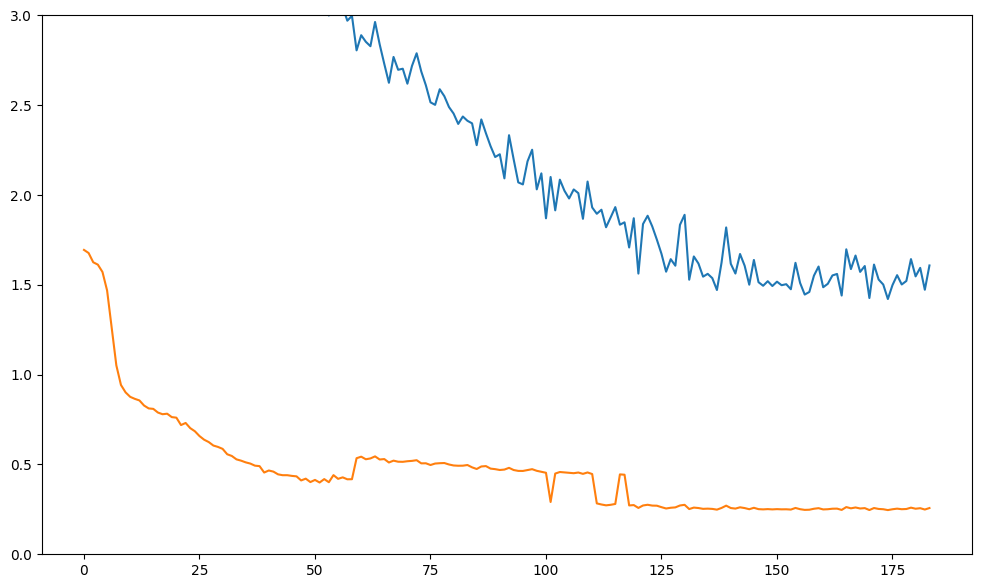

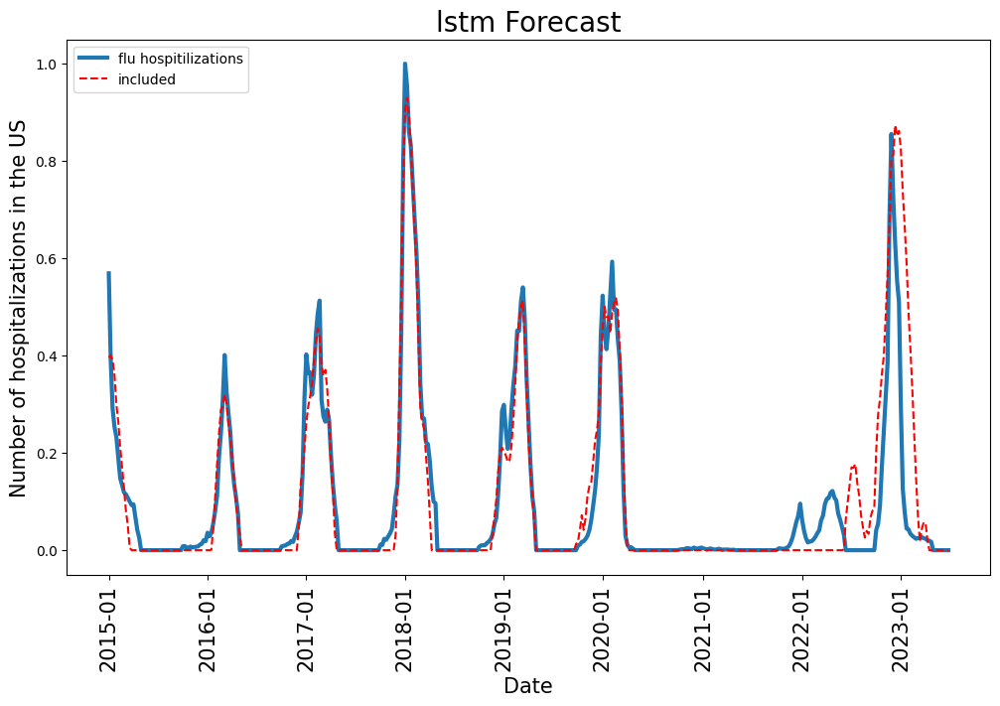

In [279]:
model = lstm(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_19_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### LSTM1

epoch 0 0 0
Train loss: 14.491162199446649 Val loss: 1.6509884409484792 Time: 0.29652679200080456
epoch 1 0 0
Train loss: 12.85414486622085 Val loss: 1.4879166678017177 Time: 0.26175741699989885
epoch 2 0 0
Train loss: 11.62832837197152 Val loss: 1.3631586270832257 Time: 0.2989950420014793
epoch 3 0 0
Train loss: 10.321096154626048 Val loss: 1.231301169110875 Time: 0.2913037500002247
epoch 4 0 0
Train loss: 8.98494224282058 Val loss: 1.0958387356563402 Time: 0.28027183299855096
epoch 5 0 0
Train loss: 7.796129870760602 Val loss: 0.973044774062822 Time: 0.27170699999987846
epoch 6 0 0
Train loss: 6.9625022587829335 Val loss: 0.883104830603416 Time: 0.289000541999485
epoch 7 0 0
Train loss: 6.443505324965703 Val loss: 0.8227717569947809 Time: 0.275618083000154
epoch 8 0 0
Train loss: 6.12888139855452 Val loss: 0.7829388777889688 Time: 0.28064858299876505
epoch 9 0 0
Train loss: 5.924253741939381 Val loss: 0.7550153739368176 Time: 0.2774541250000766
epoch 10 0 0
Train loss: 5.768563285708

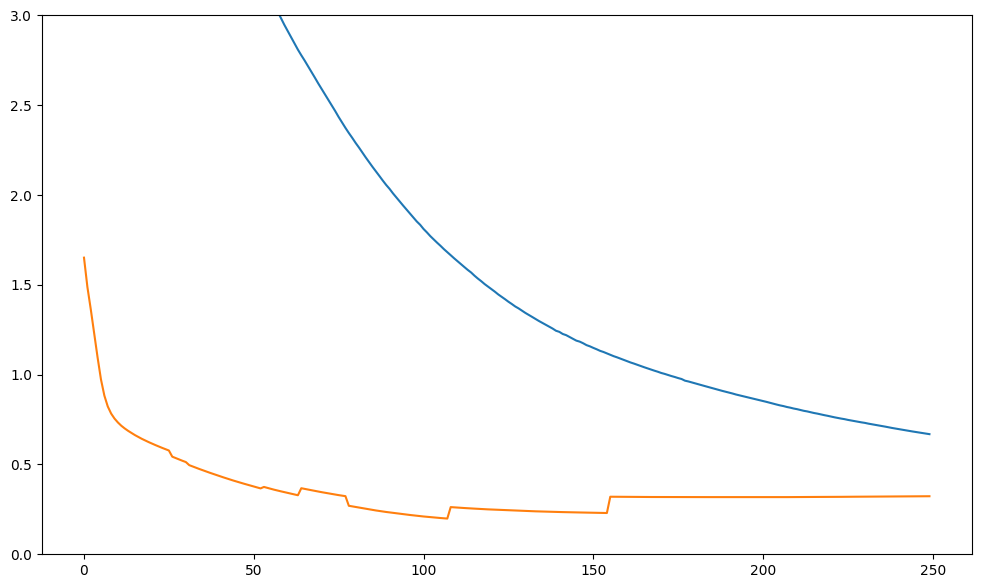

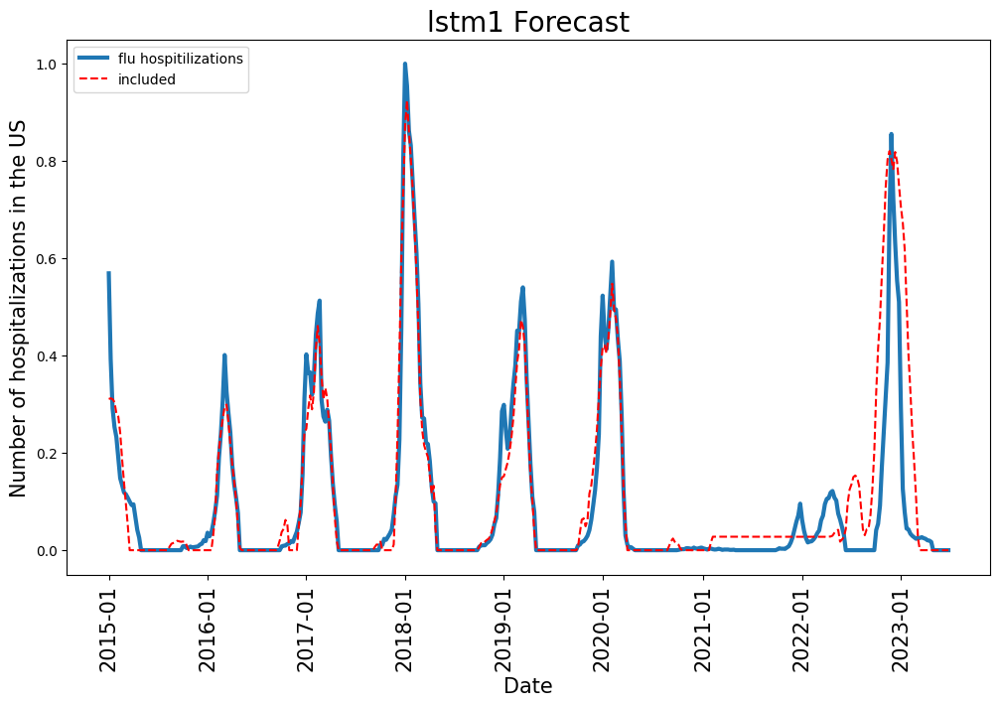

In [259]:
model = lstm1(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_19_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### LSTM lin1

epoch 0 0 0
Train loss: 14.552691973865535 Val loss: 1.7239586361523502 Time: 0.5117614999999205
epoch 1 0 0
Train loss: 14.365930210976163 Val loss: 1.6325824892506346 Time: 0.5301832090008247
epoch 2 0 0
Train loss: 14.351444638543768 Val loss: 1.630991882581688 Time: 0.5380917919992498
epoch 3 0 0
Train loss: 14.284772717302928 Val loss: 1.6225952892864273 Time: 0.5422029579985974
epoch 4 0 0
Train loss: 13.643896465225854 Val loss: 1.5660667629000868 Time: 0.5256227080008102
epoch 5 0 0
Train loss: 12.35954773493448 Val loss: 1.4289852154579727 Time: 0.551303457999893
epoch 6 0 0
Train loss: 10.212543342371152 Val loss: 1.211732259204766 Time: 0.5026917499999399
epoch 7 0 0
Train loss: 8.683611066237916 Val loss: 1.0547048236380026 Time: 0.5117290840007627
epoch 8 0 0
Train loss: 7.906115421814944 Val loss: 0.9649153555338823 Time: 0.5490708329998597
epoch 9 0 0
Train loss: 7.286564324128648 Val loss: 0.8995904104955701 Time: 0.549492874999487
epoch 10 0 0
Train loss: 6.73414794525

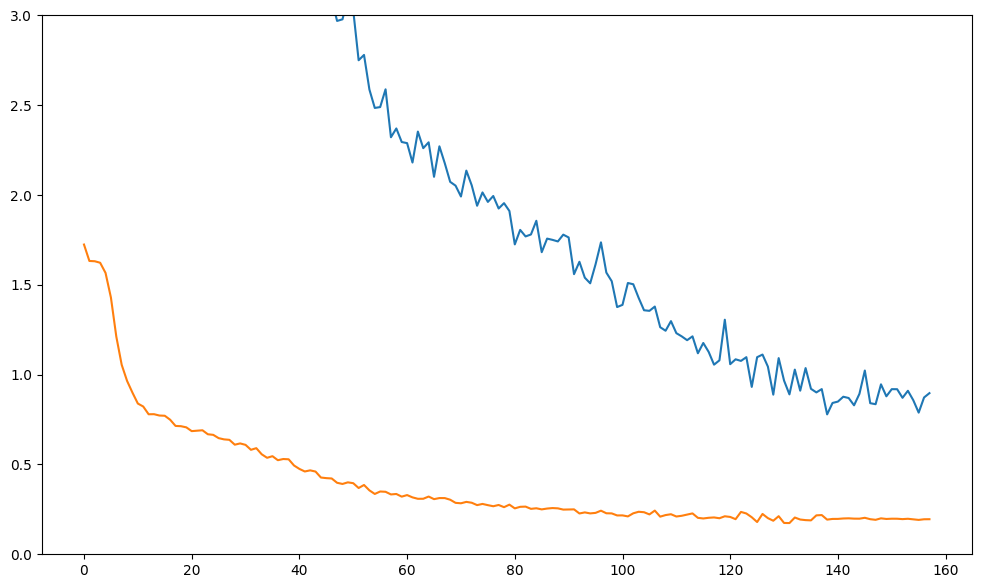

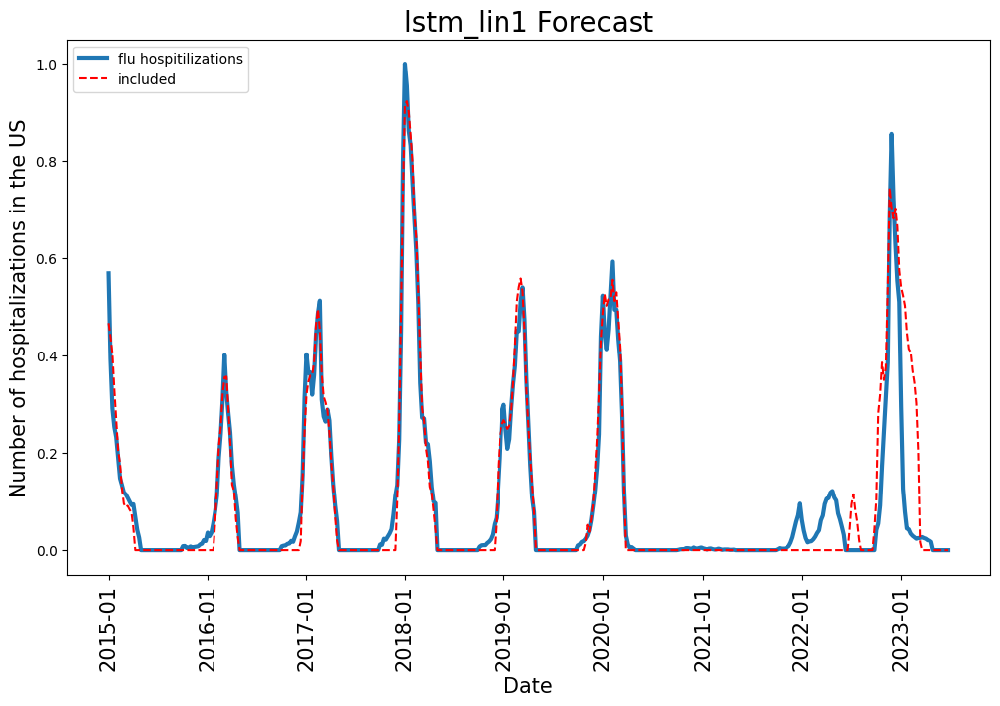

In [260]:
model = lstm_lin1(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_19_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### RNN

epoch 0 0 0
Train loss: 14.300015814023016 Val loss: 1.7268045135547283 Time: 0.3645804580010008
epoch 1 0 0
Train loss: 13.382585938396904 Val loss: 1.6485004941482329 Time: 0.28468549999888637
epoch 2 0 0
Train loss: 12.330697766117737 Val loss: 1.4814686724442987 Time: 0.27608779200090794
epoch 3 0 0
Train loss: 10.79515064196761 Val loss: 1.3307297449834088 Time: 0.2793724580005801
epoch 4 0 0
Train loss: 9.06288305761649 Val loss: 1.1583640489688065 Time: 0.2807322500011651
epoch 5 0 0
Train loss: 7.724259311393801 Val loss: 1.0359217014220499 Time: 0.28273929199895065
epoch 6 0 0
Train loss: 6.932505604118049 Val loss: 0.9178745455734029 Time: 0.27816479099965363
epoch 7 0 0
Train loss: 6.593604755732542 Val loss: 0.8812649857361657 Time: 0.27928604199951224
epoch 8 0 0
Train loss: 6.390264638114573 Val loss: 0.8572233802299473 Time: 0.2745629170003667
epoch 9 0 0
Train loss: 6.217177097657299 Val loss: 0.837086989238519 Time: 0.27611595800044597
epoch 10 0 0
Train loss: 6.100799

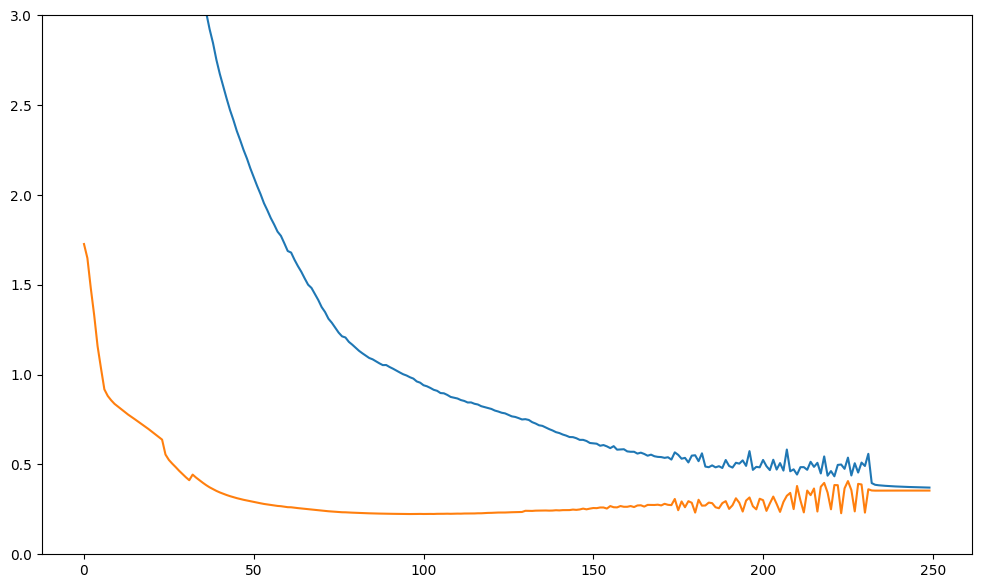

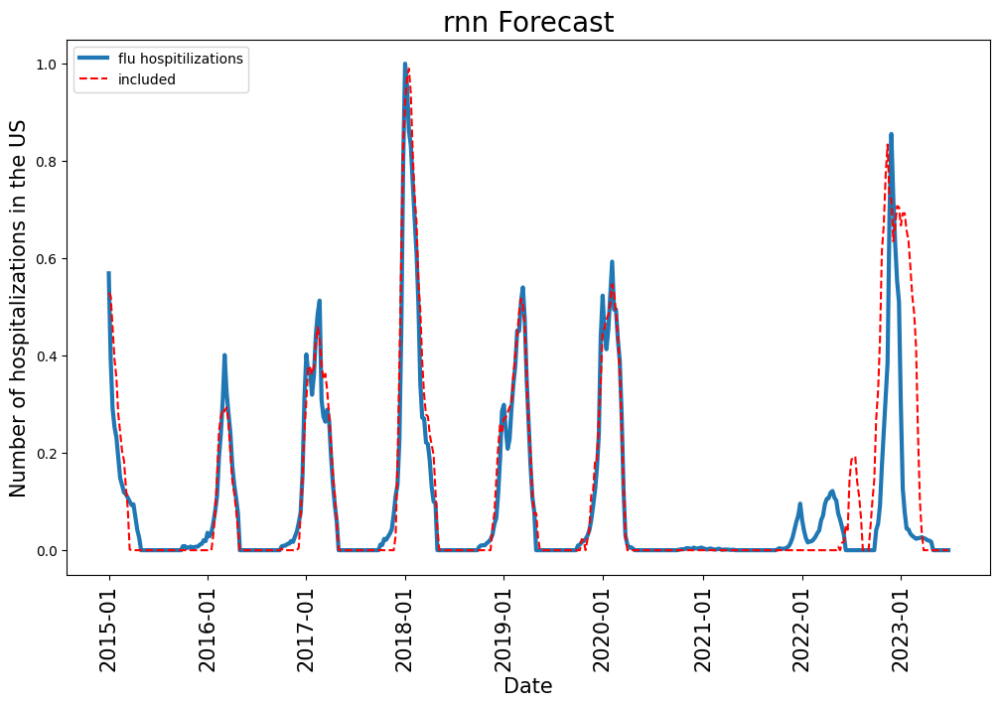

In [261]:
model = rnn(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_19_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### RNN1

epoch 0 0 0
Train loss: 10.625108242819294 Val loss: 1.2844918992672616 Time: 0.21469470800002455
epoch 1 0 0
Train loss: 7.216251173450484 Val loss: 0.8675097108973008 Time: 0.19261487500079966
epoch 2 0 0
Train loss: 6.57994344458956 Val loss: 0.8366472894187817 Time: 0.18909158300084528
epoch 3 0 0
Train loss: 6.111793471145248 Val loss: 0.8911675460742098 Time: 0.17853166699933354
epoch 4 1 0
Train loss: 5.652008228452168 Val loss: 0.8580708419619733 Time: 0.1793266249987937
epoch 5 0 0
Train loss: 5.27531778032548 Val loss: 0.8259738516444259 Time: 0.1775387919988134
epoch 6 0 0
Train loss: 4.957062089091046 Val loss: 0.7982181884200431 Time: 0.18171795800117252
epoch 7 0 0
Train loss: 4.670439471248528 Val loss: 0.7728874526168945 Time: 0.1781456659991818
epoch 8 0 0
Train loss: 4.459783523105186 Val loss: 0.7531240913366134 Time: 0.18204716699983692
epoch 9 0 0
Train loss: 4.177205396669388 Val loss: 0.7306274989713354 Time: 0.1807579579999583
epoch 10 0 0
Train loss: 3.90674321

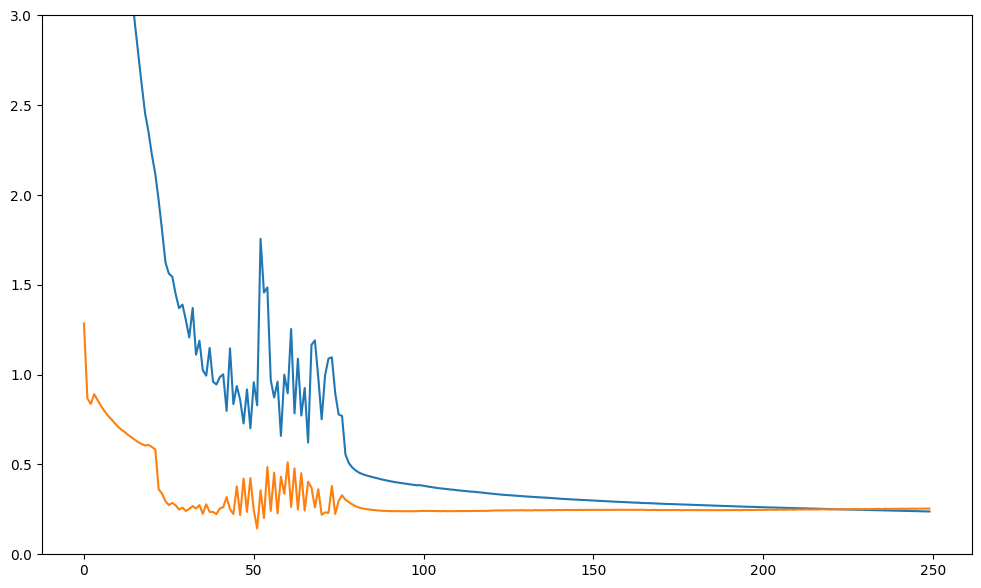

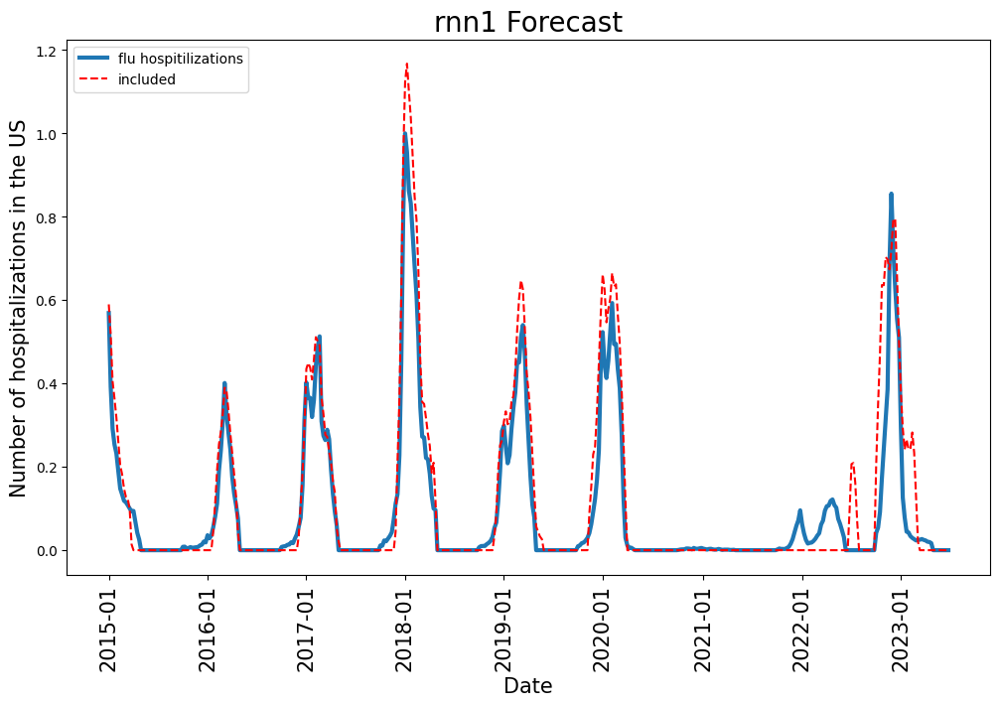

In [264]:
model = rnn1(26,5).to(device)
learn_rate = 5e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_19_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### RNN Lin1

epoch 0 0 0
Train loss: 14.544518684788898 Val loss: 1.650746401014303 Time: 0.407926583000517
epoch 1 0 0
Train loss: 14.21432542370394 Val loss: 1.6290130741784203 Time: 0.4076709170003596
epoch 2 0 0
Train loss: 13.871959030779465 Val loss: 1.5852003218893125 Time: 0.3833341669997026
epoch 3 0 0
Train loss: 12.018775206887938 Val loss: 1.3772915803500996 Time: 0.38249658300082956
epoch 4 0 0
Train loss: 8.53047417301687 Val loss: 1.0000075218014477 Time: 0.37657695800044166
epoch 5 0 0
Train loss: 6.768661591606138 Val loss: 0.8276604481674954 Time: 0.42103441700055555
epoch 6 0 0
Train loss: 6.245305793113879 Val loss: 0.7722723509164108 Time: 0.3844452089997503
epoch 7 0 0
Train loss: 6.050973373849018 Val loss: 0.7437066254942701 Time: 0.4042884160007816
epoch 8 0 0
Train loss: 5.936460601781118 Val loss: 0.7304596069824923 Time: 0.3776294580002286
epoch 9 0 0
Train loss: 5.979728342119792 Val loss: 0.7313573361067051 Time: 0.4083032500002446
epoch 10 1 1
Train loss: 5.7277243476

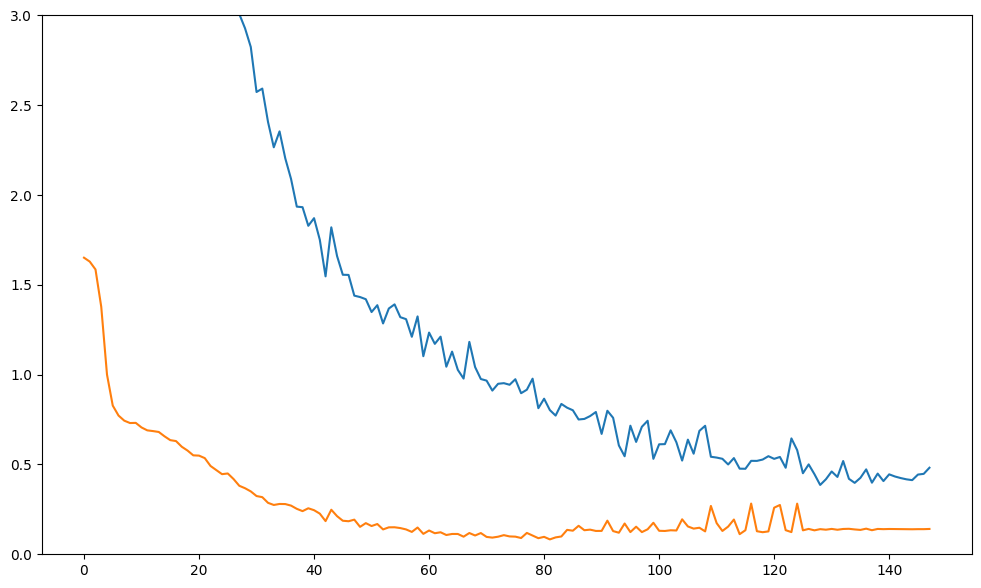

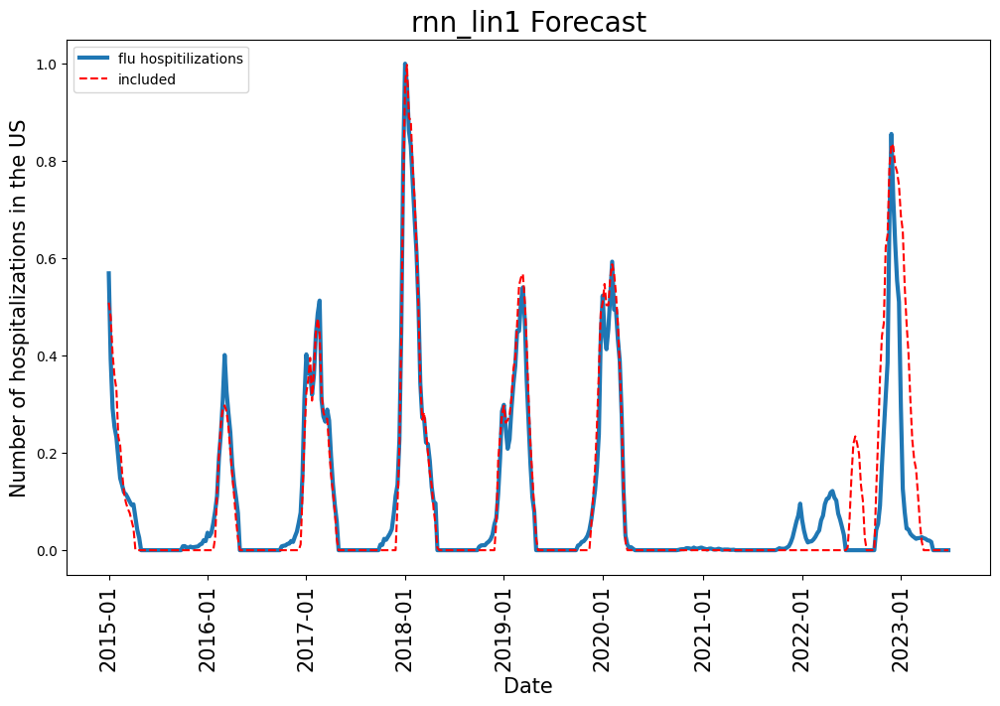

In [265]:
model = rnn_lin1(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_19_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### GRU

epoch 0 0 0
Train loss: 14.232296495934214 Val loss: 1.644388678972053 Time: 0.42651329200089094
epoch 1 0 0
Train loss: 13.859194164221677 Val loss: 1.5924089070955267 Time: 0.34686162499929196
epoch 2 0 0
Train loss: 13.277866897670265 Val loss: 1.521448822872258 Time: 0.35159504100010963
epoch 3 0 0
Train loss: 12.230037234147176 Val loss: 1.4133809474324013 Time: 0.34698383300019486
epoch 4 0 0
Train loss: 10.535536186115163 Val loss: 1.2367526396763178 Time: 0.3468026250011462
epoch 5 0 0
Train loss: 8.456375637263022 Val loss: 1.0140886549713477 Time: 0.35081437500048196
epoch 6 0 0
Train loss: 7.034819362188358 Val loss: 0.860627795049779 Time: 0.3406585000011546
epoch 7 0 0
Train loss: 6.421288079561338 Val loss: 0.7865763930765922 Time: 0.34480737499870884
epoch 8 0 0
Train loss: 6.145630536702513 Val loss: 0.7499278544078062 Time: 0.3626107919990318
epoch 9 0 0
Train loss: 5.963816001310619 Val loss: 0.7247794058668889 Time: 0.37228016699918953
epoch 10 0 0
Train loss: 5.8097

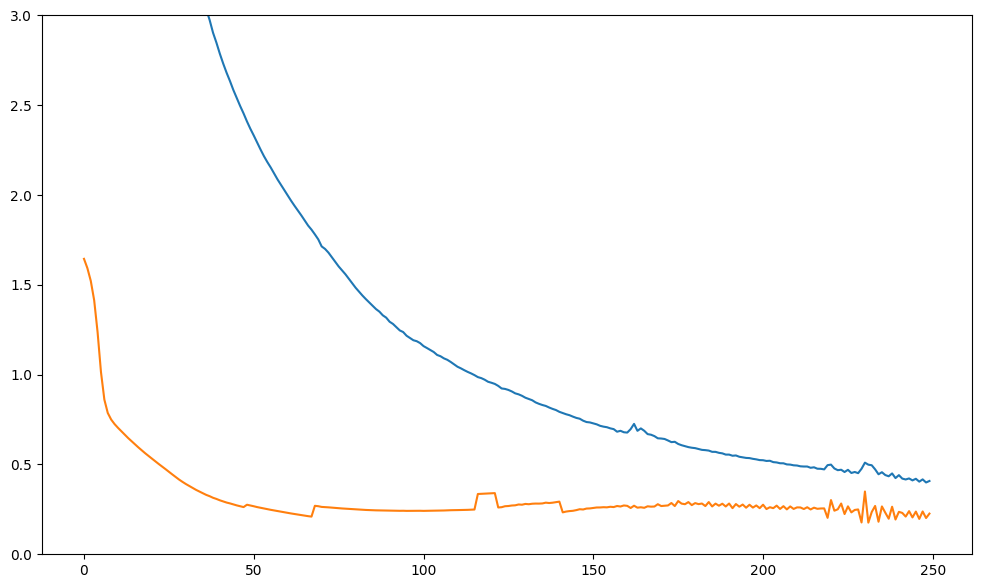

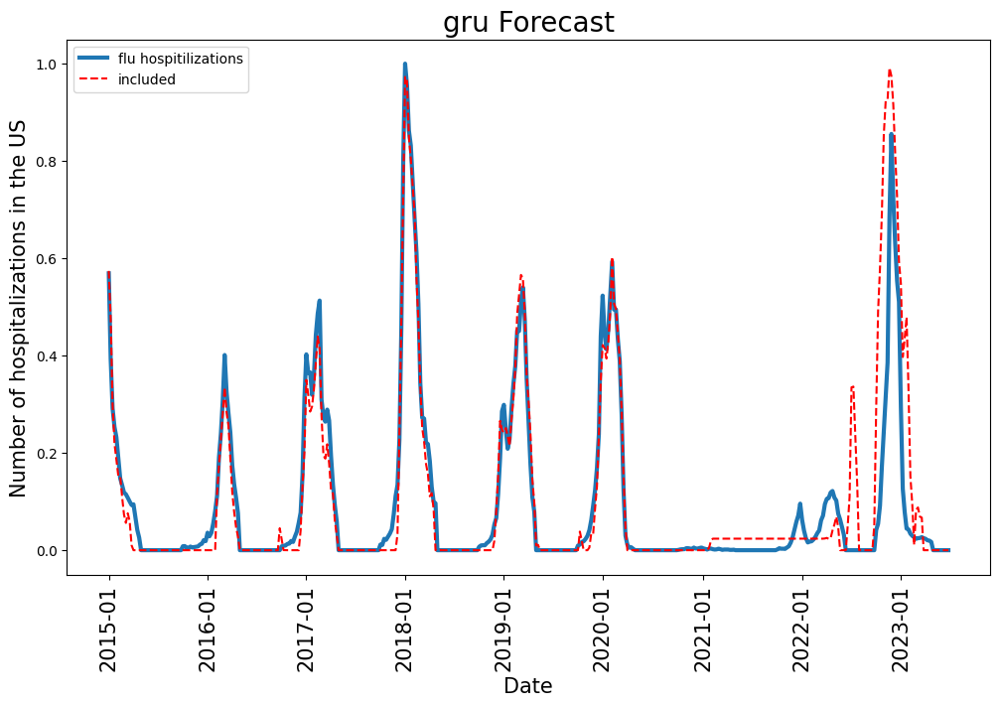

In [266]:
model = gru(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_19_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### GRU1

epoch 0 0 0
Train loss: 12.714433283840037 Val loss: 1.494042738078751 Time: 0.2609370840000338
epoch 1 0 0
Train loss: 10.959412796709305 Val loss: 1.2802641933013852 Time: 0.2229130420000729
epoch 2 0 0
Train loss: 9.41512415334028 Val loss: 1.1260075420851847 Time: 0.30405400000017835
epoch 3 0 0
Train loss: 8.037105742273638 Val loss: 0.9898855110348181 Time: 0.23151029200016637
epoch 4 0 0
Train loss: 7.025025239138582 Val loss: 0.8880137976350274 Time: 0.23631925000154297
epoch 5 0 0
Train loss: 6.392582096729704 Val loss: 0.7937914236869126 Time: 0.2292596669994964
epoch 6 0 0
Train loss: 6.028230244989405 Val loss: 0.7481257031688981 Time: 0.22757224999986647
epoch 7 0 0
Train loss: 5.810552964584296 Val loss: 0.7184237629919068 Time: 0.21712579199993343
epoch 8 0 0
Train loss: 5.667408230779296 Val loss: 0.697495804978054 Time: 0.22452466600043408
epoch 9 0 0
Train loss: 5.557356297689631 Val loss: 0.6811694819899515 Time: 0.22051925000050687
epoch 10 0 0
Train loss: 5.4655370

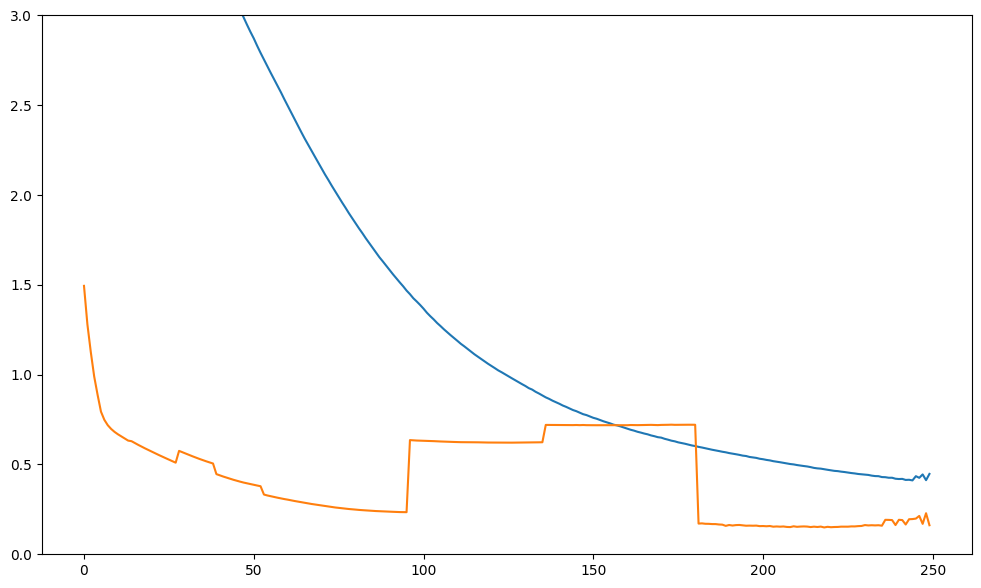

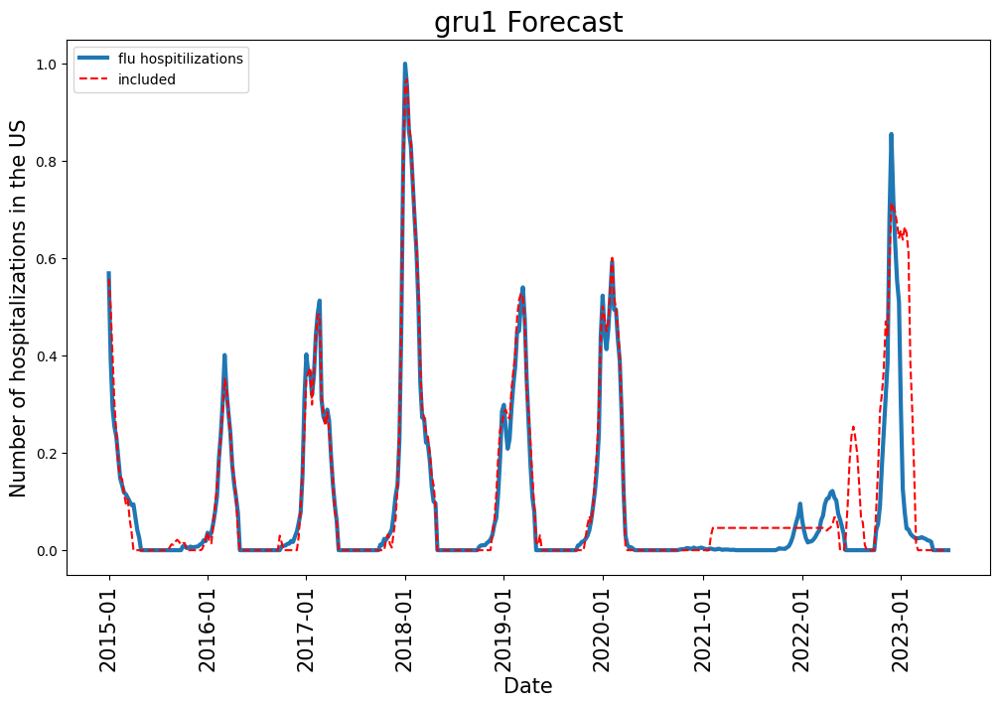

In [271]:
model = gru1(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_19_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### GRU Lin1

epoch 0 0 0
Train loss: 14.70132253147802 Val loss: 1.6642179223743552 Time: 0.4725615409988677
epoch 1 0 0
Train loss: 13.950146478544923 Val loss: 1.5900744514458462 Time: 0.4847550829999818
epoch 2 0 0
Train loss: 12.507395908951366 Val loss: 1.435018819413257 Time: 0.46941112499916926
epoch 3 0 0
Train loss: 9.001872142589406 Val loss: 1.040016454851415 Time: 0.4551144580000255
epoch 4 0 0
Train loss: 6.82565700183045 Val loss: 0.8364472394986752 Time: 0.4449451250002312
epoch 5 0 0
Train loss: 6.503900067243617 Val loss: 0.8069515826013696 Time: 0.46516070799953013
epoch 6 0 0
Train loss: 6.268052700353238 Val loss: 0.7832724086201265 Time: 0.47087516599822266
epoch 7 0 0
Train loss: 6.124386523002485 Val loss: 0.771220045579369 Time: 0.5415765000016108
epoch 8 0 0
Train loss: 5.9653129779638805 Val loss: 0.7529713753042764 Time: 0.4613978749985108
epoch 9 0 0
Train loss: 5.68342514375604 Val loss: 0.7305346021638923 Time: 0.4729092080015107
epoch 10 0 0
Train loss: 5.611197927894

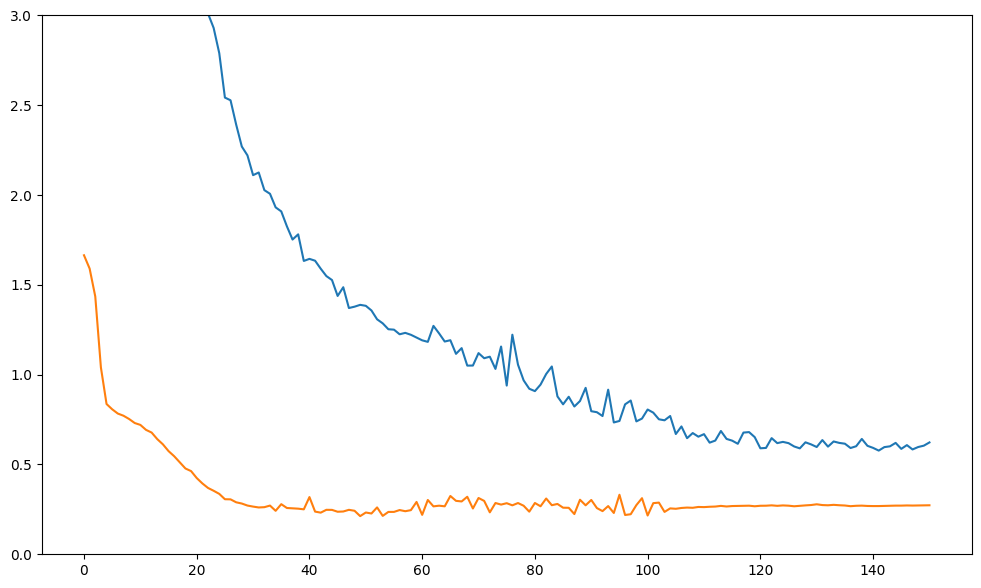

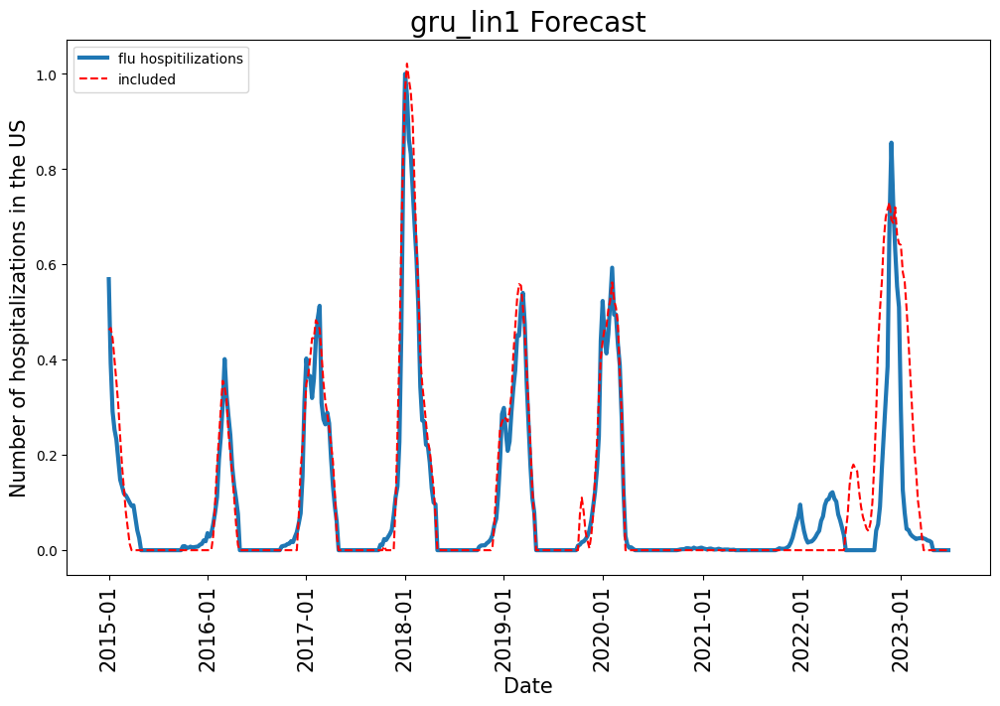

In [272]:
model = gru_lin1(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_19_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### Summary

rnn
rnn_lin1
gru1
gru_lin1
lstm
lstm1
lstm_lin1


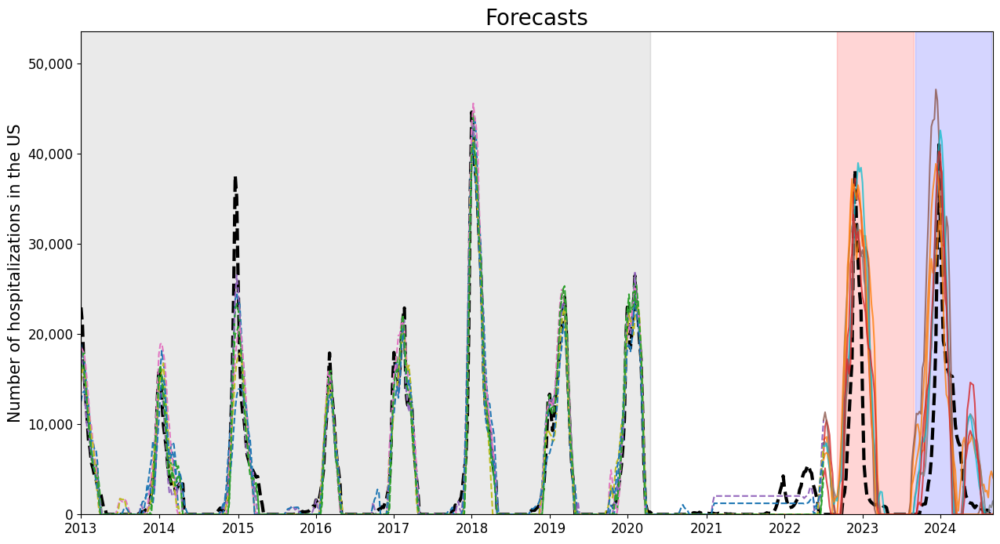

In [273]:
# plot all models
plot_df = pd.DataFrame(data=usa_infall_norm.values,columns = ['INF_ALL'],index=usa_infall_norm.index)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batched_sequence = data_in
fig, ax = plt.subplots(figsize=(15,8))
ax.plot(max_*plot_df["INF_ALL"].loc['2013-01':],linewidth=3,color='black',linestyle='dashed')
for model in model_list:
    model = model.to(device)
    print(model.__class__.__name__)

    MODEL_PATH = 'models/'+model.__class__.__name__+'_fcast_19_new_22-23_val.pth'
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

    
    plot_df[model.__class__.__name__] = pred

    #plt.rcParams['figure.figsize'] = (25, 12)

    
    #plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
    ax.plot(max_*plot_df[model.__class__.__name__].loc['2013-01':'2022-27'],linestyle="dashed")#,label=model.__class__.__name__+'(included)')
    ax.plot(max_*plot_df[model.__class__.__name__].loc['2022-27':],alpha=0.8,label=model.__class__.__name__)#label=model.__class__.__name__+'(prediction)',linewidth=1)
    #plt.legend(loc='upper left')
    x_ticks=['2013-01','2014-01','2015-01','2016-01','2017-01','2018-01','2019-01','2020-01','2021-01','2022-01','2023-01','2024-01']
    labels = ['2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023','2024']

    plt.xlim(['2013-01','2024-36'])

    ax.axvspan('2013-01', '2020-16', color='gray', alpha=0.025)
    ax.axvspan('2022-36', '2023-35', color='red', alpha=0.025)
    ax.axvspan('2023-36', '2024-35', color='blue', alpha=0.025)
    ax.set_ylim([0,1.2*max_])
    ax.set_xticks(ticks = x_ticks,labels=labels,size=12)

    #ax.set_yticks(size=12)
    ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.tick_params(axis='y', labelsize=12)
    ax.set_title('Forecasts',size =20)
    ax.set_ylabel('Number of hospitalizations in the US',fontsize=15)

## 24

### 22-23

In [280]:
data_in = Dataset_(df["INF_ALL"],df.drop(['key_0','INF_ALL','season'],axis=1),26,26+23)

(788,)


In [281]:
device = torch.device("cpu")

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 5e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-27')
noise = False
forecast = 30

torch.manual_seed(4)

#### LSTM

epoch 0 0 0
Train loss: 14.887324688395779 Val loss: 1.786932030560985 Time: 0.4441151669998362
epoch 1 0 0
Train loss: 14.348908241497611 Val loss: 1.7371823164121605 Time: 0.46964112500063493
epoch 2 0 0
Train loss: 14.196739878057599 Val loss: 1.7226884280611419 Time: 0.44055275000027905
epoch 3 0 0
Train loss: 14.019578554233037 Val loss: 1.709552066962418 Time: 0.46376675000101386
epoch 4 0 0
Train loss: 13.815840416961436 Val loss: 1.6863861177576345 Time: 0.46256145799998194
epoch 5 0 0
Train loss: 12.936728073954072 Val loss: 1.6022254743031725 Time: 0.4769341249993886
epoch 6 0 0
Train loss: 11.125992582189639 Val loss: 1.4348067194201335 Time: 0.41473620800024946
epoch 7 0 0
Train loss: 8.842365776567135 Val loss: 1.1466107826892848 Time: 0.45592716699866287
epoch 8 0 0
Train loss: 7.61466212540137 Val loss: 1.033258074481986 Time: 0.40801570799885667
epoch 9 0 0
Train loss: 7.157565339774835 Val loss: 0.990735664612523 Time: 0.43865920799908054
epoch 10 0 0
Train loss: 6.995

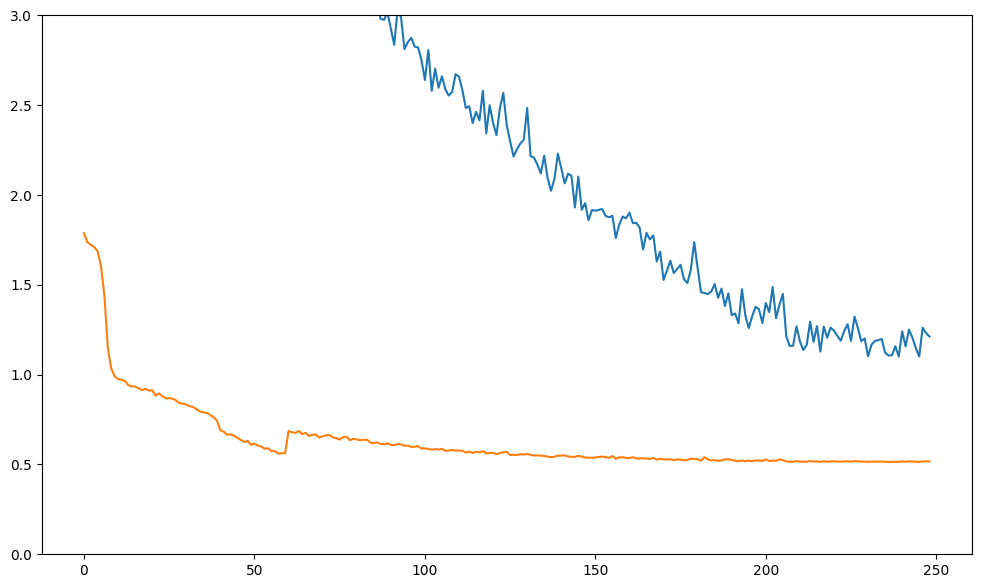

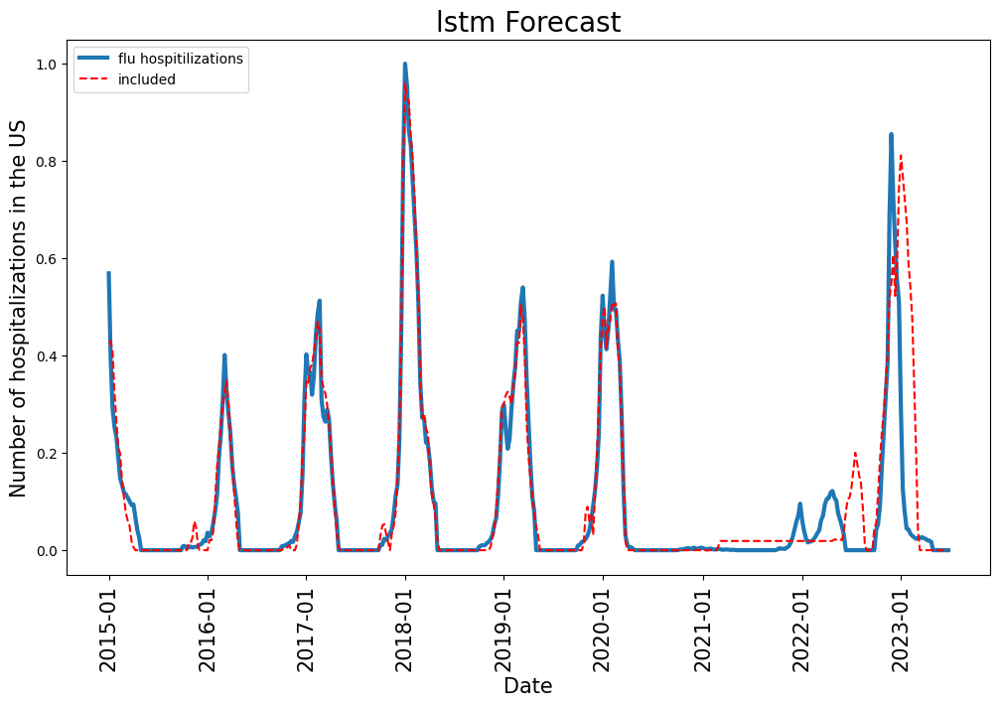

In [282]:
model = lstm(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_24_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### LSTM1

epoch 0 0 0
Train loss: 9.993452004906494 Val loss: 1.1403494777867342 Time: 0.296995083001093
epoch 1 0 0
Train loss: 7.0083733592477415 Val loss: 0.8680327554679426 Time: 0.29729095899892855
epoch 2 0 0
Train loss: 6.5834088302796046 Val loss: 0.8484356930300517 Time: 0.28841479100083234
epoch 3 0 0
Train loss: 6.235012115501036 Val loss: 0.8203513676779294 Time: 0.3109081669990701
epoch 4 0 0
Train loss: 5.926484336873386 Val loss: 0.7521243314357245 Time: 0.3058619169987651
epoch 5 0 0
Train loss: 5.673951087277487 Val loss: 0.7168591036189922 Time: 0.3315606670003035
epoch 6 0 0
Train loss: 5.373204452876166 Val loss: 0.6828431672791547 Time: 0.2873406670005352
epoch 7 0 0
Train loss: 5.081689988107301 Val loss: 0.6406481475092897 Time: 0.30732391700075823
epoch 8 0 0
Train loss: 4.657216228055972 Val loss: 0.5841225689981215 Time: 0.3089119590003975
epoch 9 0 0
Train loss: 4.24674013826467 Val loss: 0.5023541391559001 Time: 0.29179416700026195
epoch 10 0 0
Train loss: 3.903477324

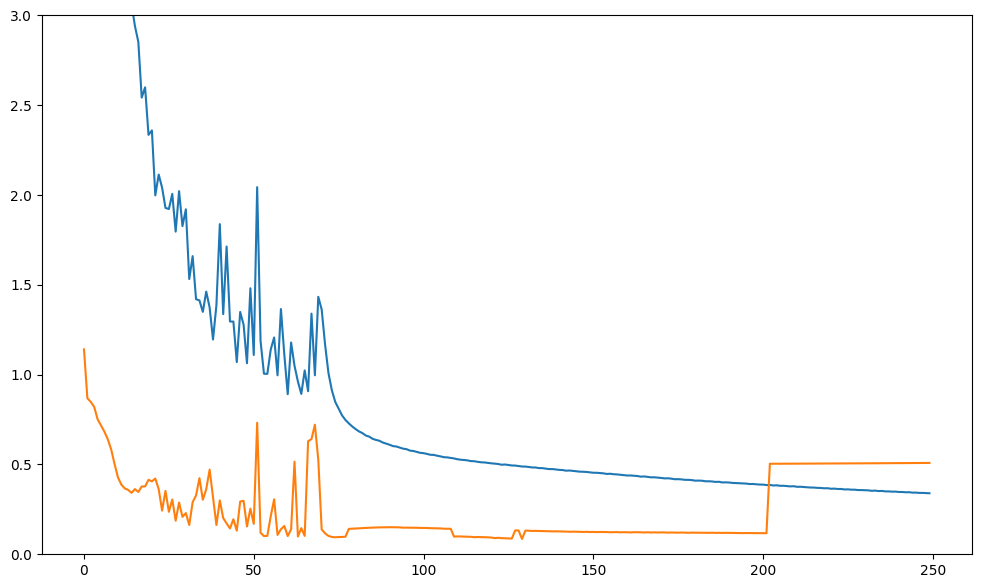

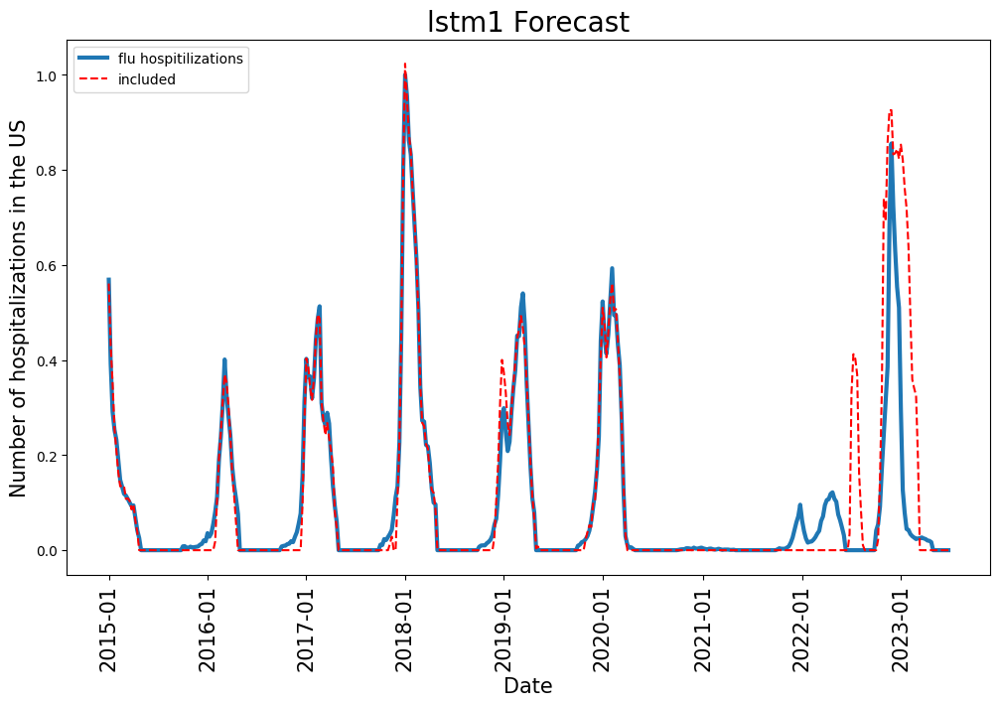

In [292]:
model = lstm1(26,5).to(device)
learn_rate = 1e-3
PATH =  'models/'+model.__class__.__name__+'_fcast_24_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### LSTM Lin1

epoch 0 0 0
Train loss: 15.21394683856228 Val loss: 1.7241145702968415 Time: 0.6750044170003093
epoch 1 0 0
Train loss: 14.447609288915356 Val loss: 1.8240065411580757 Time: 0.6951104579984531
epoch 2 1 0
Train loss: 14.327704752319164 Val loss: 1.8133893308074844 Time: 0.6388982080006826
epoch 3 0 0
Train loss: 14.278434038370392 Val loss: 1.6973895482865098 Time: 0.5807142920002661
epoch 4 0 0
Train loss: 14.056418507647976 Val loss: 1.6490307584045014 Time: 0.5833697920006671
epoch 5 0 0
Train loss: 13.326364693072911 Val loss: 1.5795739680074514 Time: 0.5933747079998284
epoch 6 0 0
Train loss: 11.003952599811612 Val loss: 1.301857197058914 Time: 0.5843457080009102
epoch 7 0 0
Train loss: 7.915880234702598 Val loss: 0.9937054150686783 Time: 0.5589188329995523
epoch 8 0 0
Train loss: 6.941801115365645 Val loss: 0.9051786698332945 Time: 0.6403508340008557
epoch 9 0 0
Train loss: 6.744695205867057 Val loss: 0.8847695663651789 Time: 0.688484584001344
epoch 10 0 0
Train loss: 6.665326425

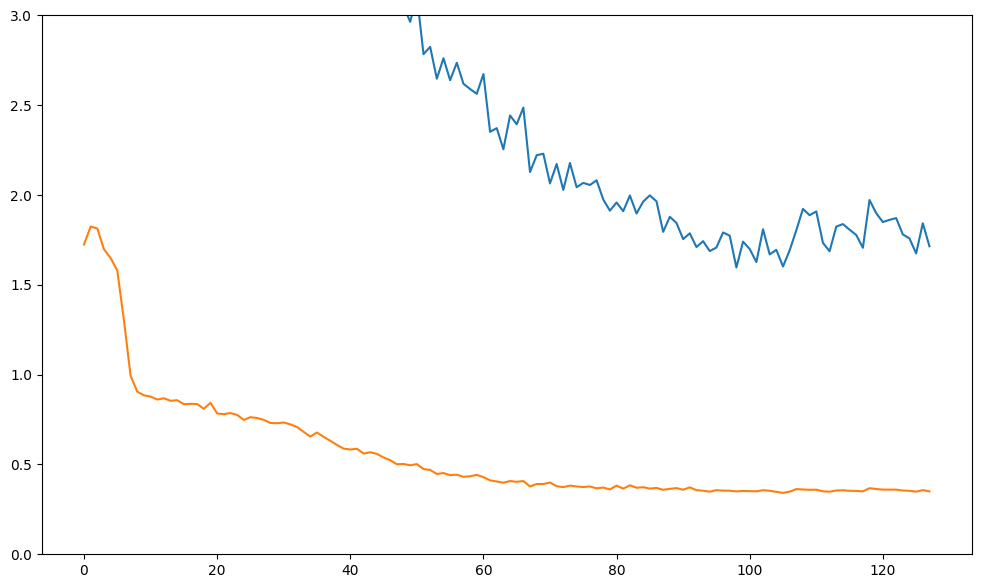

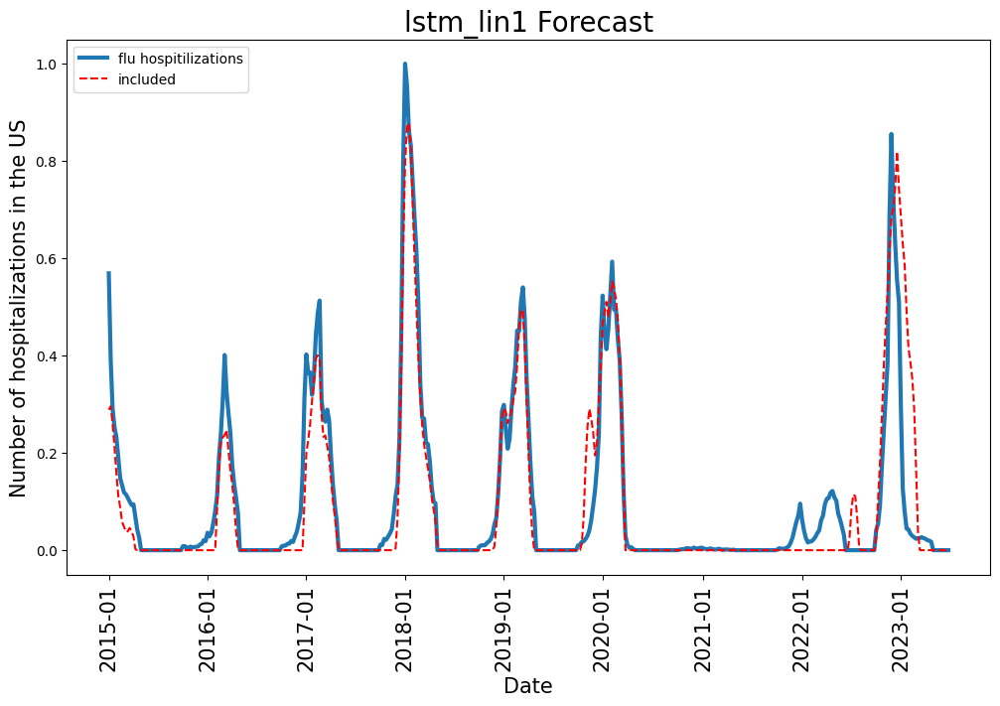

In [284]:
model = lstm_lin1(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_24_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### RNN

epoch 0 0 0
Train loss: 16.339665749070264 Val loss: 1.970160352131175 Time: 0.3588485419986682
epoch 1 0 0
Train loss: 12.852580778490506 Val loss: 1.5833709250049195 Time: 0.29535395899983996
epoch 2 0 0
Train loss: 10.6174241975285 Val loss: 1.3732956469760078 Time: 0.2979655830004049
epoch 3 0 0
Train loss: 8.050924910373453 Val loss: 1.0875405661218032 Time: 0.2858694580008887
epoch 4 0 0
Train loss: 6.717631569377005 Val loss: 0.9126187532980669 Time: 0.26937945800091256
epoch 5 0 0
Train loss: 6.36894878453521 Val loss: 0.887099906598957 Time: 0.2991063329991448
epoch 6 0 0
Train loss: 6.148886899284481 Val loss: 0.8661348042971944 Time: 0.29081870799927856
epoch 7 0 0
Train loss: 6.027507122256509 Val loss: 0.8542864318962579 Time: 0.29186433299946657
epoch 8 0 0
Train loss: 5.889949929272408 Val loss: 0.841881751216305 Time: 0.29191329200148175
epoch 9 0 0
Train loss: 5.780258588148403 Val loss: 0.8321232243524749 Time: 0.29239741699893784
epoch 10 0 0
Train loss: 5.6696789342

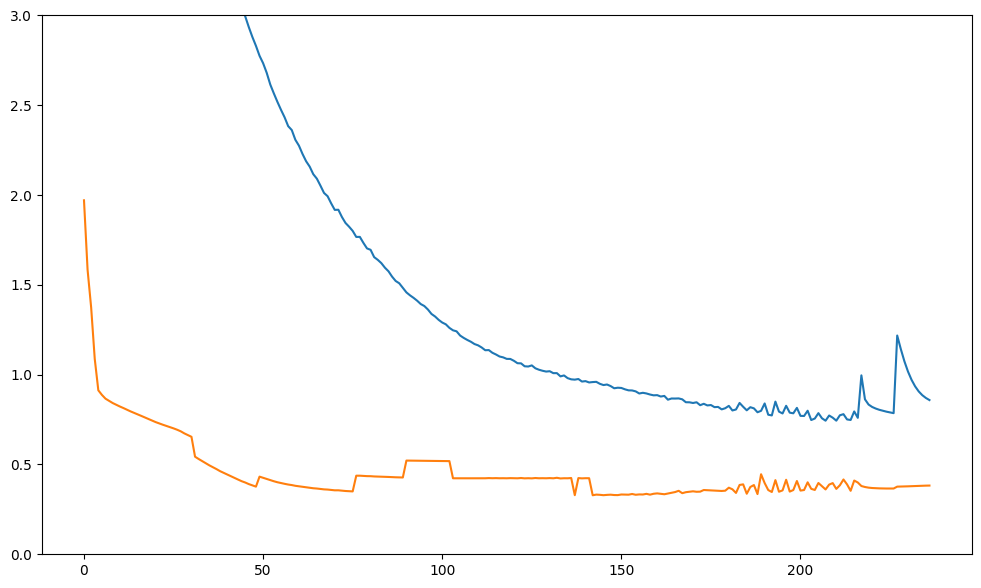

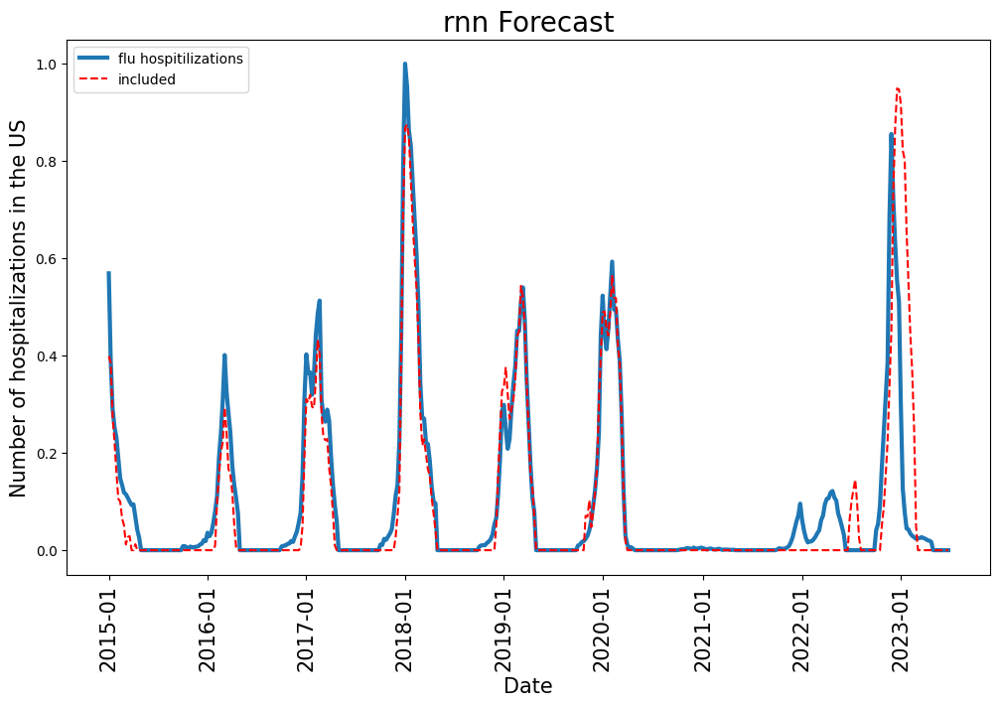

In [285]:
model = rnn(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_24_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### RNN1

epoch 0 0 0
Train loss: 11.427036612624761 Val loss: 1.3069228791846301 Time: 0.22177983300025517
epoch 1 0 0
Train loss: 6.442721927205376 Val loss: 0.703894620520048 Time: 0.18497224999919126
epoch 2 0 0
Train loss: 6.0899642236068985 Val loss: 0.7117263143567276 Time: 0.1949097079996136
epoch 3 1 0
Train loss: 5.578337739334472 Val loss: 0.7202873449426451 Time: 0.18637145799948485
epoch 4 2 0
Train loss: 5.252246641214128 Val loss: 0.6926705492180713 Time: 0.1930648339985055
epoch 5 0 0
Train loss: 4.851477625933626 Val loss: 0.5824047462038572 Time: 0.18799466699965706
epoch 6 0 0
Train loss: 4.488198849511338 Val loss: 0.5178570753179809 Time: 0.20918766700015112
epoch 7 0 0
Train loss: 4.308438693224048 Val loss: 0.4943124594563451 Time: 0.1896710000000894
epoch 8 0 0
Train loss: 4.133168929587612 Val loss: 0.5013744732422613 Time: 0.18735662499966566
epoch 9 1 0
Train loss: 4.028245586512952 Val loss: 0.48714235610992396 Time: 0.18331666699850757
epoch 10 0 0
Train loss: 3.9560

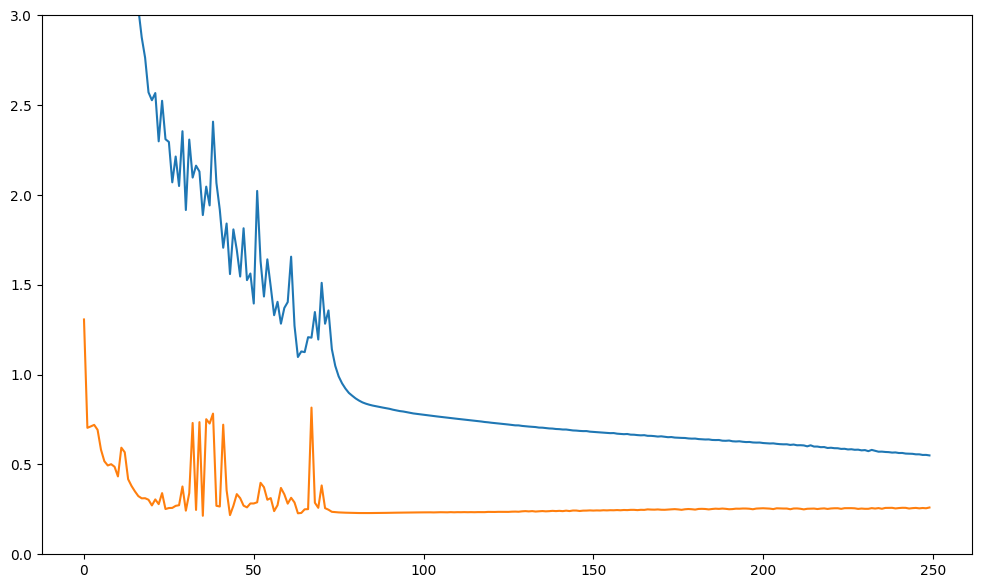

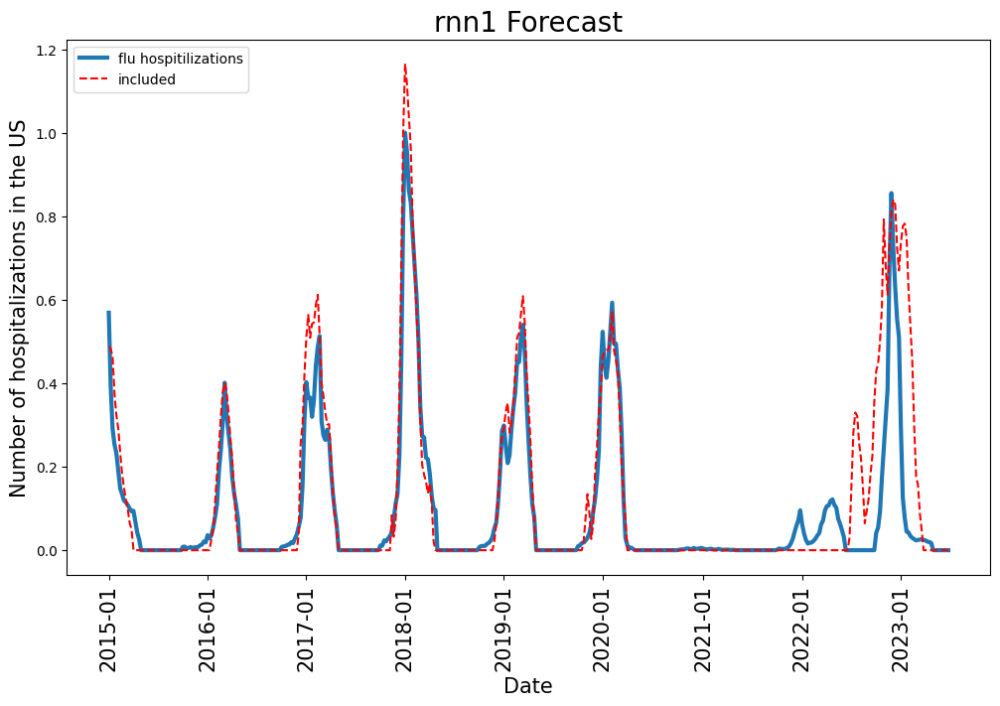

In [293]:
model = rnn1(26,5).to(device)
learn_rate = 1e-3
PATH =  'models/'+model.__class__.__name__+'_fcast_24_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### RNN Lin1

epoch 0 0 0
Train loss: 14.921366192092337 Val loss: 2.4699927791681486 Time: 0.34815037499902246
epoch 1 0 0
Train loss: 13.888064681510699 Val loss: 1.639229523715877 Time: 0.3791804169995885
epoch 2 0 0
Train loss: 11.280738306360576 Val loss: 1.3763957949445733 Time: 0.3687900839995564
epoch 3 0 0
Train loss: 7.955949422658431 Val loss: 1.0235243157498308 Time: 0.36236633299995447
epoch 4 0 0
Train loss: 6.915016604772852 Val loss: 0.944448715304895 Time: 0.36234179200073413
epoch 5 0 0
Train loss: 6.423237690575501 Val loss: 0.8940469760538404 Time: 0.36545433300125296
epoch 6 0 0
Train loss: 6.417874493098623 Val loss: 0.8919054634969873 Time: 0.36249291599961
epoch 7 0 0
Train loss: 6.075860160279072 Val loss: 0.860373118583866 Time: 0.3912364579991845
epoch 8 0 0
Train loss: 6.12193787965964 Val loss: 0.8593228955431035 Time: 0.37399475000165694
epoch 9 0 1
Train loss: 5.957349652188114 Val loss: 0.8466160051452609 Time: 0.3742149160007102
epoch 10 0 0
Train loss: 5.75574133249

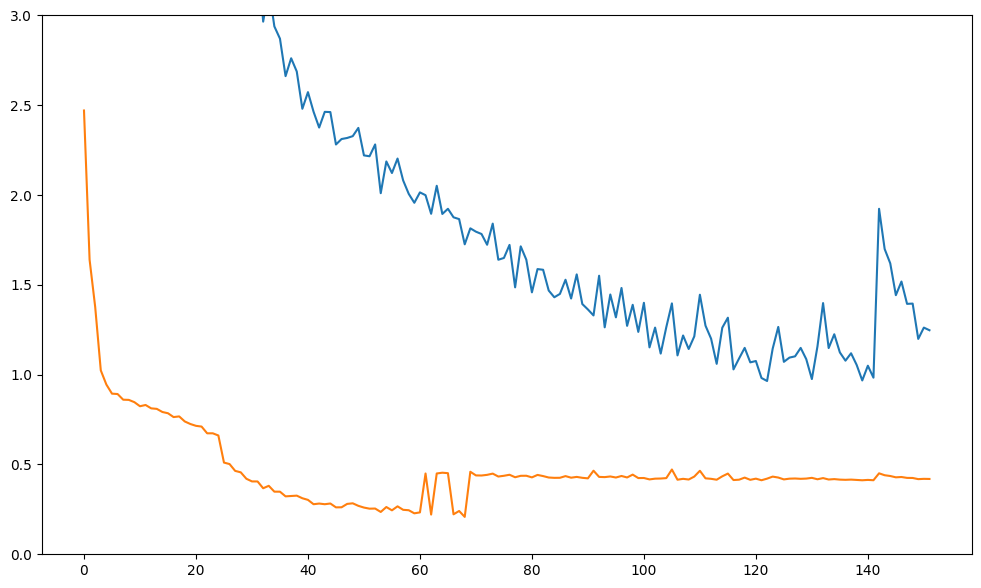

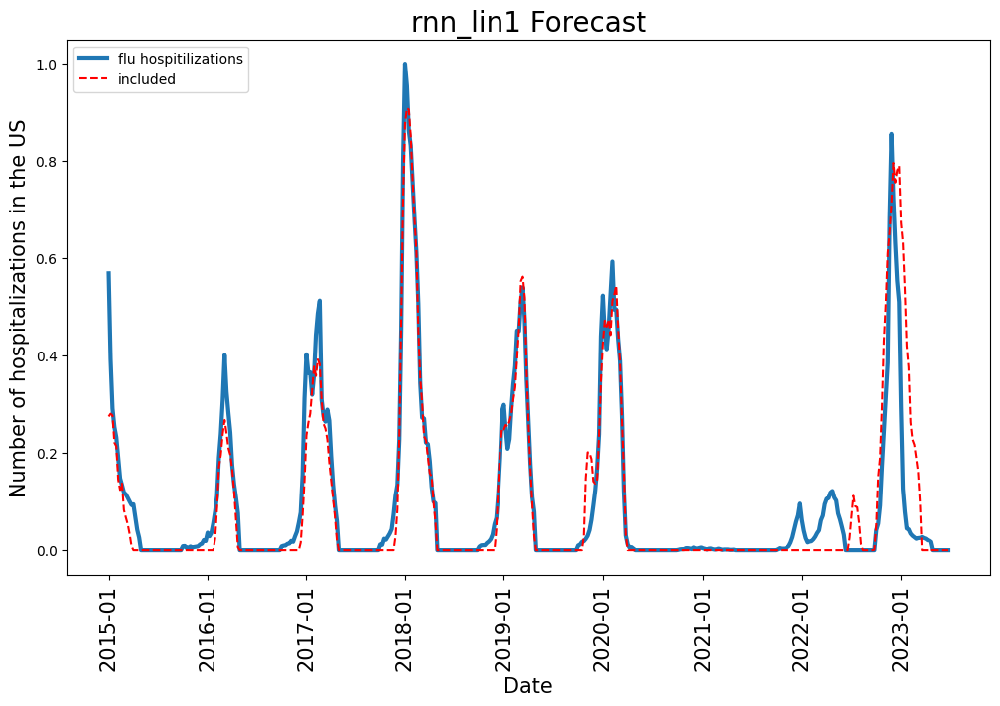

In [287]:
model = rnn_lin1(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_24_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### GRU

epoch 0 0 0
Train loss: 14.898504341366731 Val loss: 1.7263478168349033 Time: 0.3827836250002292
epoch 1 0 0
Train loss: 14.002085701924429 Val loss: 1.624034772255695 Time: 0.37554487499983225
epoch 2 0 0
Train loss: 13.370374845545768 Val loss: 1.564985384443874 Time: 0.37492999999994936
epoch 3 0 0
Train loss: 12.012760759453641 Val loss: 1.4893522490021849 Time: 0.3438915000006091
epoch 4 0 0
Train loss: 9.488912399076753 Val loss: 1.2490532590980994 Time: 0.3469900839991169
epoch 5 0 0
Train loss: 7.410554063464417 Val loss: 1.053093252162373 Time: 0.4187108749993058
epoch 6 0 0
Train loss: 6.671926778157413 Val loss: 0.9798528202852104 Time: 0.37985016600032395
epoch 7 0 0
Train loss: 6.459801039160681 Val loss: 0.9678783026528904 Time: 0.351700625000376
epoch 8 0 0
Train loss: 6.260050799601515 Val loss: 0.9486832521657868 Time: 0.33938012500038894
epoch 9 0 0
Train loss: 6.135348466187196 Val loss: 0.9359481751956127 Time: 0.34297349999906146
epoch 10 0 0
Train loss: 6.03482826

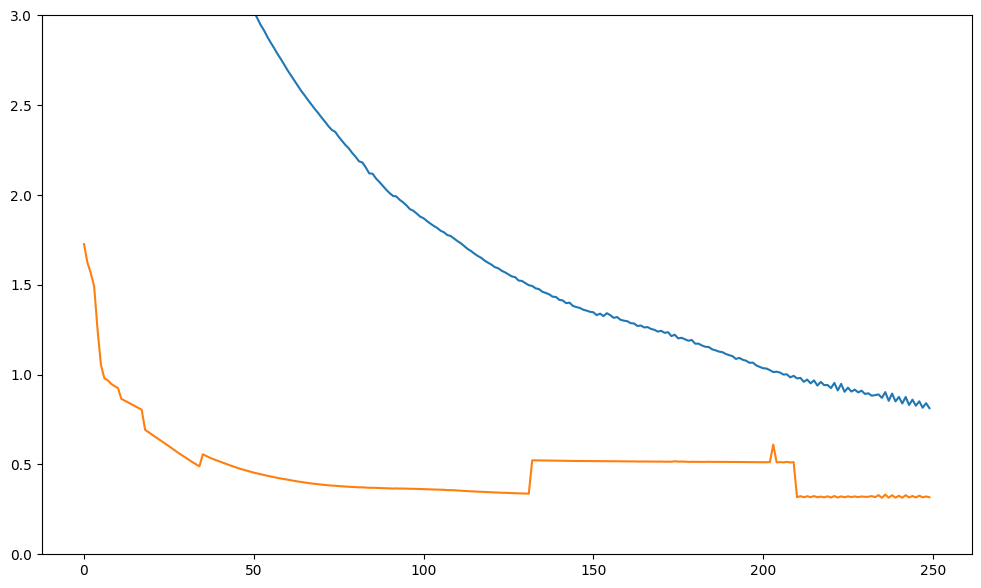

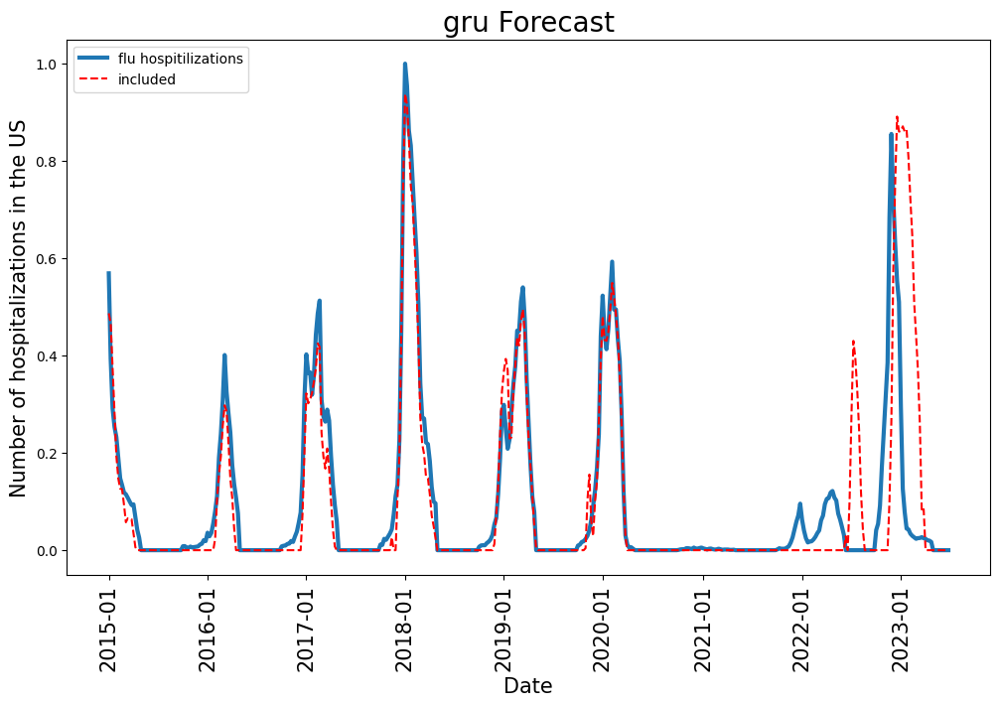

In [297]:
model = gru(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_24_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### GRU1

epoch 0 0 0
Train loss: 14.206225365647356 Val loss: 1.632163666741415 Time: 0.3009296669988544
epoch 1 0 0
Train loss: 13.084833379465714 Val loss: 1.5281572338494023 Time: 0.2200444169993716
epoch 2 0 0
Train loss: 11.936746638292561 Val loss: 1.4193318639347947 Time: 0.2338370830002532
epoch 3 0 0
Train loss: 10.608779068483443 Val loss: 1.2913340438810126 Time: 0.23971924999932526
epoch 4 0 0
Train loss: 9.037193766262106 Val loss: 1.134983333715912 Time: 0.2355922909991932
epoch 5 0 0
Train loss: 7.7619443134808535 Val loss: 1.0062133717147057 Time: 0.23732841599849053
epoch 6 0 0
Train loss: 6.9531595136542705 Val loss: 0.9194981628003509 Time: 0.21960283299995353
epoch 7 0 0
Train loss: 6.506244868762243 Val loss: 0.8671797055606741 Time: 0.2238570419995085
epoch 8 0 0
Train loss: 6.253550183202776 Val loss: 0.8348885754205609 Time: 0.22859224999956496
epoch 9 0 0
Train loss: 6.086711362169524 Val loss: 0.8131212824623697 Time: 0.21759491700140643
epoch 10 0 0
Train loss: 5.9576

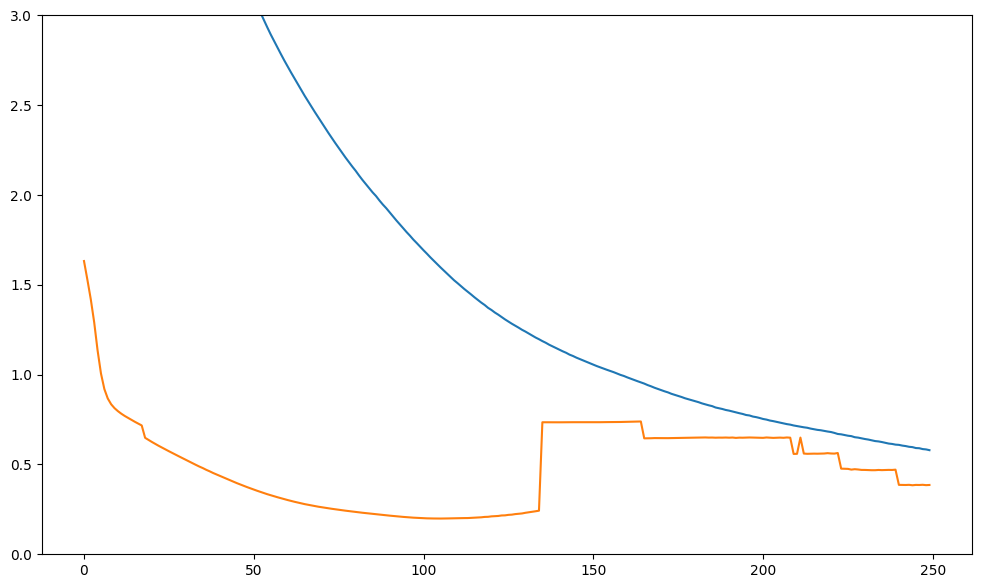

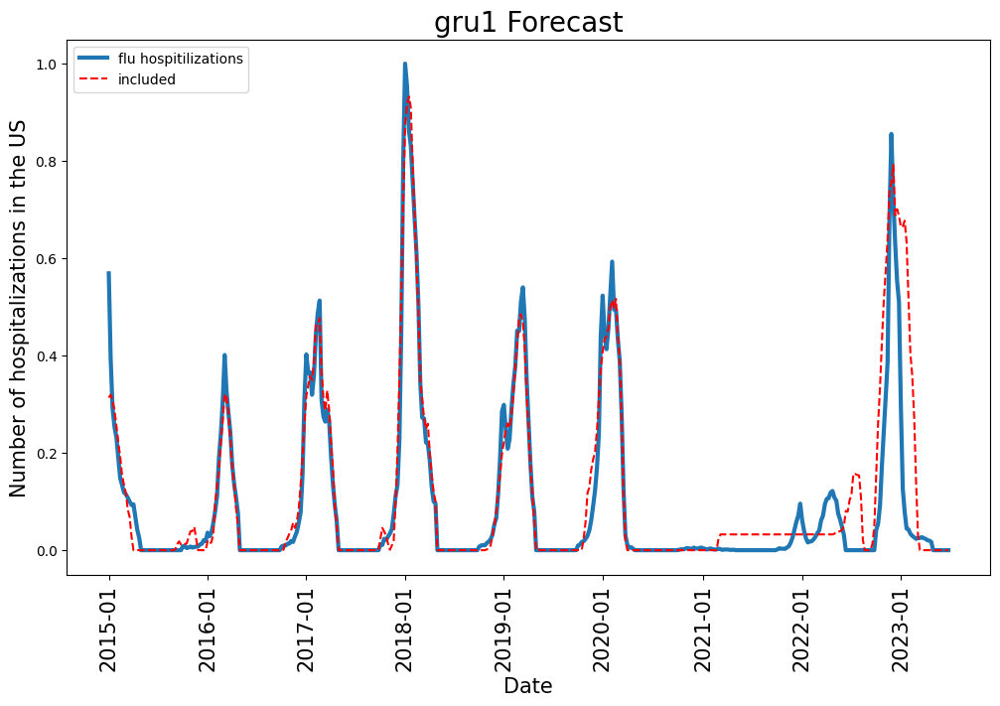

In [299]:
model = gru1(26,5).to(device)
learn_rate = 1e-4
PATH =  'models/'+model.__class__.__name__+'_fcast_24_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')

#### GRU Lin1

epoch 0 0 0
Train loss: 16.191319421867156 Val loss: 2.2242575826849063 Time: 0.6378019170006155
epoch 1 0 0
Train loss: 14.269559931465608 Val loss: 1.5893878549520268 Time: 0.5228572080013691
epoch 2 0 0
Train loss: 9.588280236941529 Val loss: 1.0109456496750493 Time: 0.4553685829996539
epoch 3 0 0
Train loss: 7.56588647426251 Val loss: 0.9326600001126951 Time: 0.4661907500012603
epoch 4 0 0
Train loss: 6.68948991737566 Val loss: 0.8418633786678 Time: 0.5053504999996221
epoch 5 0 0
Train loss: 6.231675157477682 Val loss: 0.7895346806005249 Time: 0.459657834000609
epoch 6 0 0
Train loss: 5.731375027136124 Val loss: 0.711478811069711 Time: 0.46360837499923946
epoch 7 0 0
Train loss: 5.3571921839327885 Val loss: 0.6835377828790429 Time: 0.43983079200006614
epoch 8 0 0
Train loss: 5.031640724125259 Val loss: 0.5862238507719171 Time: 0.46765512499951
epoch 9 0 0
Train loss: 7.504450542026603 Val loss: 2.388540092973384 Time: 0.4719343340002524
epoch 10 1 1
Train loss: 11.33431861867522 Va

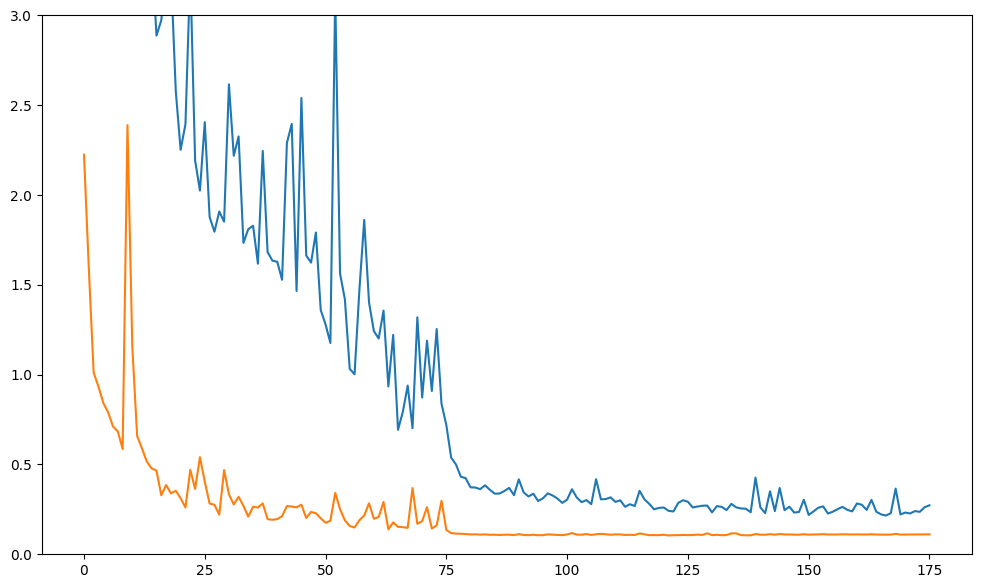

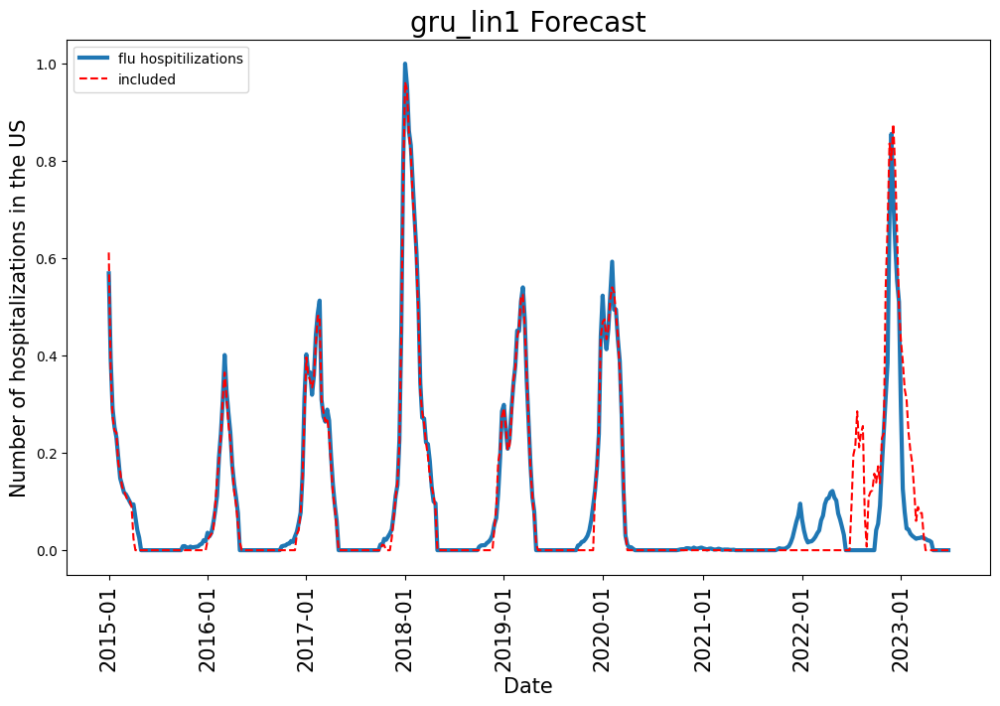

In [301]:
model = gru_lin1(26,5).to(device)
learn_rate = 1e-3
PATH =  'models/'+model.__class__.__name__+'_fcast_24_new_22-23.pth'
loss_t,loss_v, peaks = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)
plt.plot(loss_t)
plt.plot(loss_v)
plt.ylim([0,3])
plt.show()
plot_model('2023-26')